In [17]:
from keras.layers import *
import keras
from keras.models import Model
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras import backend as K

# Setup Google CoLab Environment

In [18]:
# Import data on Google CoLab
#from google.colab import drive
#drive.mount('/content/drive')
#%cd /content/drive/My\ Drive/Colab\ Notebooks/2.\ Autoencoder

# Importing relevant functions and libraries

In [121]:
%run "Reusable_Functions.ipynb"

# Import Data

In [20]:
# Import data offline
cplr_noisy = import_DB('db6_5SS_noisy_s20084.npz')
print(cplr_noisy.shape)
cplr_true = import_DB('db4_5SS_mirror_s20084.npz')
print(cplr_true.shape)

(20084, 100, 3)
(20084, 100, 3)


In [21]:
data_max=np.max([np.max(cplr_noisy),np.max(cplr_true)])
data_min=np.min([np.min(cplr_noisy),np.min(cplr_true)])
print(data_max)
print(np.abs(data_min))

0.5570395753847958
0.5682779550021021


In [22]:
# Renormalize DB from range [-1,1] to range [0,1] 
n_cplr_true=cplr_true/(np.abs(data_min)+data_max)+np.abs(data_min)
n_cplr_noisy=cplr_noisy/(np.abs(data_min)+data_max)+np.abs(data_min)

# Splitting the database in Train/Test dataset

In [23]:
x= n_cplr_noisy
y= n_cplr_true

# Split data into training and testing dataset
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=1)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(16067, 100, 3)
(16067, 100, 3)
(4017, 100, 3)
(4017, 100, 3)


In [24]:
def sampling(args):
    mu, log_var = args
    batch_size = K.shape(mu)[0]
    z_dim = K.int_shape(mu)[1]
    eps = K.random_normal(shape=(batch_size, z_dim))
    return mu + K.exp(0.5 * log_var) * eps

def eucledian_norm(y_true, y_pred):
    return K.sqrt(K.sum(K.square(y_pred - y_true)))
def kl(z_mean,z_log_var):
    return 0.5 * K.sum(K.square(z_mean) + K.exp(z_log_var) - z_log_var - 1, axis=-1)

# Variational Autoencoder (VAE)

In [25]:
def VAE_train(VAE, modelname):
    # VISUALIZING MODEL ARCHITECTURE
    VAE.summary()
    display(SVG(model_to_dot(VAE, show_shapes=True, show_layer_names=True, dpi=70).create(prog='dot', format='svg')))
    
    # TRAINING
    filepath=os.path.join('models_VAE', modelname+'.hdf5')
    #earlyStopping = EarlyStopping(monitor='val_loss', patience=25, verbose=1, mode='min', restore_best_weights=True)
    chkpt = ModelCheckpoint(filepath, save_best_only=True, save_weights_only=True, monitor='val_loss', mode='min', verbose=1)
    train_data=VAE.fit([x_train], [y_train], shuffle=True, epochs=3000, batch_size=256, validation_data=([x_test], [y_test]), verbose=1, callbacks=[chkpt])
    
    # VISUALIZING LEARNING CURVES
    visualize_learning_curves(train_data)

def VAE_load(VAE, modelname):
    filepath=os.path.join('models_VAE', modelname+'.hdf5')
    #VAE=load_model(filepath, custom_objects={'rmse': rmse})
    VAE.load_weights(filepath)

## Fully Connected NN architecture: analyzing affect of Depth and Bottleneck width 

In [ ]:
def VAE_FC(hidden=[100,100,100], z_dim=30):
    inp=Input(shape=(100,3))
    encDim=hidden
    decDim=hidden[::-1]

    # Encoding
    x=Flatten()(inp)
    for i in encDim:
        x=Dense(i, activation='relu')(x)
    z_mean = Dense(z_dim, name='z_mean')(x)
    z_log_var = Dense(z_dim, name='z_log_var')(x)
    z = Lambda(sampling, output_shape=(z_dim,), name='z')([z_mean, z_log_var])

    # Decoding
    x=Dense(decDim[0], activation='relu')(z)
    for i in decDim[1:]:
        x=Dense(i, activation='relu')(x)
    x=Dense(300)(x)
    y=Reshape((100, 3))(x)
    
    # loss
    def reconstruction_loss(out_true, out_pred):
        return eucledian_norm(out_true, out_pred)
    def kl_loss(out_true, out_pred):
        return kl(z_mean,z_log_var)
    def vae_loss(out_true, out_pred):      
        return reconstruction_loss(out_true, out_pred) + kl_loss(out_true, out_pred)

    # build model
    vae = Model(inputs=[inp], outputs=[y])
    #vae.add_loss(vae_loss)
    vae.compile(optimizer='adam', loss=vae_loss, metrics=[reconstruction_loss,kl_loss])
    
    encoder = Model(inputs=[inp], outputs=[z_mean])
    return vae, encoder

In [26]:
vae_FC_h1_z15,_=VAE_FC([100],15)
vae_FC_h1_z30,_=VAE_FC([100],30)
vae_FC_h1_z60,_=VAE_FC([100],60)

vae_FC_h2_z15,_=VAE_FC([150,75],15)
vae_FC_h2_z30,_=VAE_FC([150,75],30)
vae_FC_h2_z60,_=VAE_FC([150,75],60)

vae_FC_h3_z15,_=VAE_FC([200,100,60],15)
vae_FC_h3_z30,_=VAE_FC([200,100,60],30)
vae_FC_h3_z60,_=VAE_FC([200,100,60],60)

vae_FC_h4_z15,_=VAE_FC([200,150,100,60],15)
vae_FC_h4_z30,_=VAE_FC([200,150,100,60],30)
vae_FC_h4_z60,_=VAE_FC([200,150,100,60],60)

### hidden=1, Z=15

Model: "model_49"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_25 (Flatten)            (None, 300)          0           input_25[0][0]                   
__________________________________________________________________________________________________
dense_145 (Dense)               (None, 100)          30100       flatten_25[0][0]                 
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 15)           1515        dense_145[0][0]                  
___________________________________________________________________________________________

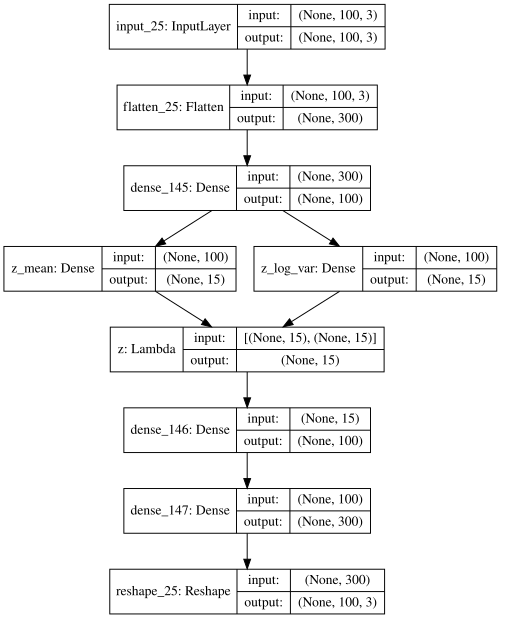

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 21us/step - loss: 80.9133 - reconstruction_loss: 72.1004 - kl_loss: 8.6604 - val_loss: 46.6863 - val_reconstruction_loss: 34.9413 - val_kl_loss: 11.6398

Epoch 00001: val_loss improved from inf to 46.68634, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 11us/step - loss: 37.5215 - reconstruction_loss: 25.6101 - kl_loss: 11.8844 - val_loss: 32.1013 - val_reconstruction_loss: 20.9471 - val_kl_loss: 11.0849

Epoch 00002: val_loss improved from 46.68634 to 32.10130, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 11us/step - loss: 29.6640 - reconstruction_loss: 19.7088 - kl_loss: 9.9424 - val_loss: 27.5584 - val_reconstruction_loss: 18.6121 - val_kl_loss: 8.8868

Epoch 00003: val_loss improved from 32.10130 to 27.55845, saving model to models_VAE/VAE_FC_h1_z1


Epoch 00026: val_loss improved from 12.92984 to 12.82721, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 27/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.7411 - reconstruction_loss: 8.3516 - kl_loss: 4.3853 - val_loss: 12.7266 - val_reconstruction_loss: 8.2972 - val_kl_loss: 4.3976

Epoch 00027: val_loss improved from 12.82721 to 12.72659, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.6101 - reconstruction_loss: 8.2710 - kl_loss: 4.3347 - val_loss: 12.6113 - val_reconstruction_loss: 8.3261 - val_kl_loss: 4.2547

Epoch 00028: val_loss improved from 12.72659 to 12.61135, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.5061 - reconstruction_loss: 8.1979 - kl_loss: 4.3040 - val_loss: 12.4796 - val_reconstruction_loss: 8.1589 - val_kl_loss: 4.2887

Epoch 00029: val_loss improved from 12.611

16067/16067 [==============================] - 0s 11us/step - loss: 11.2921 - reconstruction_loss: 7.3393 - kl_loss: 3.9503 - val_loss: 11.3183 - val_reconstruction_loss: 7.3096 - val_kl_loss: 3.9811

Epoch 00083: val_loss improved from 11.33588 to 11.31829, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 84/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2980 - reconstruction_loss: 7.3468 - kl_loss: 3.9476 - val_loss: 11.4024 - val_reconstruction_loss: 7.4991 - val_kl_loss: 3.8739

Epoch 00084: val_loss did not improve from 11.31829
Epoch 85/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2932 - reconstruction_loss: 7.3428 - kl_loss: 3.9457 - val_loss: 11.3635 - val_reconstruction_loss: 7.4112 - val_kl_loss: 3.9243

Epoch 00085: val_loss did not improve from 11.31829
Epoch 86/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2688 - reconstruction_loss: 7.2987 - kl_loss: 3.9675 - val_loss: 11.3434 - v

16067/16067 [==============================] - 0s 11us/step - loss: 11.0946 - reconstruction_loss: 7.1468 - kl_loss: 3.9443 - val_loss: 11.3670 - val_reconstruction_loss: 7.4104 - val_kl_loss: 3.9299

Epoch 00142: val_loss did not improve from 11.13410
Epoch 143/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.1000 - reconstruction_loss: 7.1600 - kl_loss: 3.9356 - val_loss: 11.0955 - val_reconstruction_loss: 7.1758 - val_kl_loss: 3.8944

Epoch 00143: val_loss improved from 11.13410 to 11.09548, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 144/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0717 - reconstruction_loss: 7.1505 - kl_loss: 3.9161 - val_loss: 11.1480 - val_reconstruction_loss: 7.2492 - val_kl_loss: 3.8710

Epoch 00144: val_loss did not improve from 11.09548
Epoch 145/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1037 - reconstruction_loss: 7.1658 - kl_loss: 3.9334 - val_loss: 11.2287 

16067/16067 [==============================] - 0s 11us/step - loss: 11.0303 - reconstruction_loss: 7.0839 - kl_loss: 3.9425 - val_loss: 11.1292 - val_reconstruction_loss: 7.1804 - val_kl_loss: 3.9227

Epoch 00202: val_loss did not improve from 11.03431
Epoch 203/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0049 - reconstruction_loss: 7.0596 - kl_loss: 3.9422 - val_loss: 11.1207 - val_reconstruction_loss: 7.1699 - val_kl_loss: 3.9253

Epoch 00203: val_loss did not improve from 11.03431
Epoch 204/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0183 - reconstruction_loss: 7.1071 - kl_loss: 3.9078 - val_loss: 11.0464 - val_reconstruction_loss: 7.1144 - val_kl_loss: 3.9068

Epoch 00204: val_loss did not improve from 11.03431
Epoch 205/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0039 - reconstruction_loss: 7.0551 - kl_loss: 3.9441 - val_loss: 11.0671 - val_reconstruction_loss: 7.0289 - val_kl_loss: 4.0

16067/16067 [==============================] - 0s 11us/step - loss: 10.8761 - reconstruction_loss: 7.0104 - kl_loss: 3.8632 - val_loss: 11.0506 - val_reconstruction_loss: 7.2256 - val_kl_loss: 3.7978

Epoch 00262: val_loss did not improve from 10.94096
Epoch 263/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9175 - reconstruction_loss: 7.0131 - kl_loss: 3.9013 - val_loss: 10.9900 - val_reconstruction_loss: 7.0509 - val_kl_loss: 3.9115

Epoch 00263: val_loss did not improve from 10.94096
Epoch 264/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8850 - reconstruction_loss: 7.0110 - kl_loss: 3.8701 - val_loss: 11.0217 - val_reconstruction_loss: 6.9588 - val_kl_loss: 4.0394

Epoch 00264: val_loss did not improve from 10.94096
Epoch 265/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9291 - reconstruction_loss: 7.0137 - kl_loss: 3.9118 - val_loss: 10.9766 - val_reconstruction_loss: 7.1266 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 10us/step - loss: 10.8274 - reconstruction_loss: 6.9744 - kl_loss: 3.8506 - val_loss: 10.9079 - val_reconstruction_loss: 6.9277 - val_kl_loss: 3.9563

Epoch 00321: val_loss did not improve from 10.85394
Epoch 322/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8181 - reconstruction_loss: 6.9624 - kl_loss: 3.8522 - val_loss: 10.8808 - val_reconstruction_loss: 6.9204 - val_kl_loss: 3.9358

Epoch 00322: val_loss did not improve from 10.85394
Epoch 323/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8335 - reconstruction_loss: 6.9722 - kl_loss: 3.8571 - val_loss: 10.9886 - val_reconstruction_loss: 7.1370 - val_kl_loss: 3.8259

Epoch 00323: val_loss did not improve from 10.85394
Epoch 324/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8151 - reconstruction_loss: 6.9648 - kl_loss: 3.8457 - val_loss: 10.9155 - val_reconstruction_loss: 7.0510 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 11us/step - loss: 10.7841 - reconstruction_loss: 6.9398 - kl_loss: 3.8421 - val_loss: 10.9319 - val_reconstruction_loss: 7.0399 - val_kl_loss: 3.8661

Epoch 00381: val_loss did not improve from 10.82706
Epoch 382/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7896 - reconstruction_loss: 6.9331 - kl_loss: 3.8517 - val_loss: 10.9239 - val_reconstruction_loss: 6.7601 - val_kl_loss: 4.1369

Epoch 00382: val_loss did not improve from 10.82706
Epoch 383/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7890 - reconstruction_loss: 6.9269 - kl_loss: 3.8593 - val_loss: 10.8309 - val_reconstruction_loss: 7.0114 - val_kl_loss: 3.7954

Epoch 00383: val_loss did not improve from 10.82706
Epoch 384/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7926 - reconstruction_loss: 6.9278 - kl_loss: 3.8620 - val_loss: 10.8975 - val_reconstruction_loss: 6.9595 - val_kl_loss: 3.9


Epoch 00441: val_loss did not improve from 10.81407
Epoch 442/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7748 - reconstruction_loss: 6.9135 - kl_loss: 3.8570 - val_loss: 10.8640 - val_reconstruction_loss: 6.8988 - val_kl_loss: 3.9407

Epoch 00442: val_loss did not improve from 10.81407
Epoch 443/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7800 - reconstruction_loss: 6.9214 - kl_loss: 3.8551 - val_loss: 10.8468 - val_reconstruction_loss: 7.1506 - val_kl_loss: 3.6734

Epoch 00443: val_loss did not improve from 10.81407
Epoch 444/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7608 - reconstruction_loss: 6.9067 - kl_loss: 3.8514 - val_loss: 10.8653 - val_reconstruction_loss: 7.0273 - val_kl_loss: 3.8094

Epoch 00444: val_loss did not improve from 10.81407
Epoch 445/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7941 - reconstruction_loss: 6.9353 - kl_loss: 3.8556 - va

16067/16067 [==============================] - 0s 11us/step - loss: 10.7647 - reconstruction_loss: 6.9011 - kl_loss: 3.8589 - val_loss: 10.8299 - val_reconstruction_loss: 6.9646 - val_kl_loss: 3.8399

Epoch 00502: val_loss did not improve from 10.80146
Epoch 503/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7550 - reconstruction_loss: 6.9075 - kl_loss: 3.8438 - val_loss: 10.8201 - val_reconstruction_loss: 6.8319 - val_kl_loss: 3.9618

Epoch 00503: val_loss did not improve from 10.80146
Epoch 504/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7688 - reconstruction_loss: 6.9000 - kl_loss: 3.8644 - val_loss: 10.9098 - val_reconstruction_loss: 6.8094 - val_kl_loss: 4.0738

Epoch 00504: val_loss did not improve from 10.80146
Epoch 505/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7680 - reconstruction_loss: 6.9028 - kl_loss: 3.8618 - val_loss: 10.8207 - val_reconstruction_loss: 6.9188 - val_kl_loss: 3.8


Epoch 00532: val_loss did not improve from 10.80146
Epoch 533/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7725 - reconstruction_loss: 6.8822 - kl_loss: 3.8866 - val_loss: 10.9260 - val_reconstruction_loss: 7.0401 - val_kl_loss: 3.8598

Epoch 00533: val_loss did not improve from 10.80146
Epoch 534/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7421 - reconstruction_loss: 6.8885 - kl_loss: 3.8519 - val_loss: 10.7901 - val_reconstruction_loss: 6.9373 - val_kl_loss: 3.8248

Epoch 00534: val_loss improved from 10.80146 to 10.79009, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 535/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7860 - reconstruction_loss: 6.9092 - kl_loss: 3.8742 - val_loss: 10.9316 - val_reconstruction_loss: 6.8956 - val_kl_loss: 4.0098

Epoch 00535: val_loss did not improve from 10.79009
Epoch 536/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7662 

16067/16067 [==============================] - 0s 11us/step - loss: 10.7237 - reconstruction_loss: 6.8744 - kl_loss: 3.8457 - val_loss: 10.8328 - val_reconstruction_loss: 6.8562 - val_kl_loss: 3.9500

Epoch 00593: val_loss did not improve from 10.76194
Epoch 594/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7201 - reconstruction_loss: 6.8741 - kl_loss: 3.8431 - val_loss: 10.9050 - val_reconstruction_loss: 6.9678 - val_kl_loss: 3.9111

Epoch 00594: val_loss did not improve from 10.76194
Epoch 595/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7601 - reconstruction_loss: 6.9111 - kl_loss: 3.8456 - val_loss: 10.8611 - val_reconstruction_loss: 6.8605 - val_kl_loss: 3.9711

Epoch 00595: val_loss did not improve from 10.76194
Epoch 596/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7113 - reconstruction_loss: 6.8723 - kl_loss: 3.8360 - val_loss: 10.8924 - val_reconstruction_loss: 7.0830 - val_kl_loss: 3.7


Epoch 00623: val_loss did not improve from 10.76194
Epoch 624/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7698 - reconstruction_loss: 6.9002 - kl_loss: 3.8665 - val_loss: 10.8582 - val_reconstruction_loss: 7.0763 - val_kl_loss: 3.7515

Epoch 00624: val_loss did not improve from 10.76194
Epoch 625/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7169 - reconstruction_loss: 6.8702 - kl_loss: 3.8421 - val_loss: 10.8418 - val_reconstruction_loss: 6.9761 - val_kl_loss: 3.8390

Epoch 00625: val_loss did not improve from 10.76194
Epoch 626/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7158 - reconstruction_loss: 6.8606 - kl_loss: 3.8526 - val_loss: 10.8361 - val_reconstruction_loss: 6.9909 - val_kl_loss: 3.8193

Epoch 00626: val_loss did not improve from 10.76194
Epoch 627/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7271 - reconstruction_loss: 6.8758 - kl_loss: 3.8485 - va


Epoch 00684: val_loss did not improve from 10.75793
Epoch 685/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7146 - reconstruction_loss: 6.8589 - kl_loss: 3.8532 - val_loss: 10.8077 - val_reconstruction_loss: 6.9978 - val_kl_loss: 3.7819

Epoch 00685: val_loss did not improve from 10.75793
Epoch 686/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6921 - reconstruction_loss: 6.8576 - kl_loss: 3.8310 - val_loss: 10.8068 - val_reconstruction_loss: 6.8309 - val_kl_loss: 3.9483

Epoch 00686: val_loss did not improve from 10.75793
Epoch 687/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6995 - reconstruction_loss: 6.8593 - kl_loss: 3.8365 - val_loss: 10.8416 - val_reconstruction_loss: 7.0343 - val_kl_loss: 3.7822

Epoch 00687: val_loss did not improve from 10.75793
Epoch 688/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7332 - reconstruction_loss: 6.8698 - kl_loss: 3.8611 - va


Epoch 00745: val_loss did not improve from 10.73971
Epoch 746/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6779 - reconstruction_loss: 6.8415 - kl_loss: 3.8334 - val_loss: 10.7335 - val_reconstruction_loss: 6.8359 - val_kl_loss: 3.8723

Epoch 00746: val_loss improved from 10.73971 to 10.73352, saving model to models_VAE/VAE_FC_h1_z15.hdf5
Epoch 747/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7037 - reconstruction_loss: 6.8533 - kl_loss: 3.8474 - val_loss: 10.8240 - val_reconstruction_loss: 6.8812 - val_kl_loss: 3.9168

Epoch 00747: val_loss did not improve from 10.73352
Epoch 748/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7023 - reconstruction_loss: 6.8649 - kl_loss: 3.8369 - val_loss: 10.8206 - val_reconstruction_loss: 6.8515 - val_kl_loss: 3.9443

Epoch 00748: val_loss did not improve from 10.73352
Epoch 749/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7198 

16067/16067 [==============================] - 0s 11us/step - loss: 10.6732 - reconstruction_loss: 6.8297 - kl_loss: 3.8391 - val_loss: 10.8016 - val_reconstruction_loss: 6.8958 - val_kl_loss: 3.8812

Epoch 00806: val_loss did not improve from 10.69731
Epoch 807/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6829 - reconstruction_loss: 6.8369 - kl_loss: 3.8431 - val_loss: 10.8127 - val_reconstruction_loss: 6.9443 - val_kl_loss: 3.8420

Epoch 00807: val_loss did not improve from 10.69731
Epoch 808/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6896 - reconstruction_loss: 6.8621 - kl_loss: 3.8250 - val_loss: 10.7551 - val_reconstruction_loss: 6.9568 - val_kl_loss: 3.7726

Epoch 00808: val_loss did not improve from 10.69731
Epoch 809/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6917 - reconstruction_loss: 6.8399 - kl_loss: 3.8492 - val_loss: 10.8774 - val_reconstruction_loss: 7.1041 - val_kl_loss: 3.7


Epoch 00836: val_loss did not improve from 10.69731
Epoch 837/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6620 - reconstruction_loss: 6.8409 - kl_loss: 3.8170 - val_loss: 10.7912 - val_reconstruction_loss: 6.8909 - val_kl_loss: 3.8751

Epoch 00837: val_loss did not improve from 10.69731
Epoch 838/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6998 - reconstruction_loss: 6.8503 - kl_loss: 3.8464 - val_loss: 10.7774 - val_reconstruction_loss: 7.0512 - val_kl_loss: 3.7013

Epoch 00838: val_loss did not improve from 10.69731
Epoch 839/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7078 - reconstruction_loss: 6.8454 - kl_loss: 3.8586 - val_loss: 10.8476 - val_reconstruction_loss: 7.0818 - val_kl_loss: 3.7363

Epoch 00839: val_loss did not improve from 10.69731
Epoch 840/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.6984 - reconstruction_loss: 6.8465 - kl_loss: 3.8494 - va


Epoch 00897: val_loss did not improve from 10.69731
Epoch 898/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.6735 - reconstruction_loss: 6.8423 - kl_loss: 3.8280 - val_loss: 10.7801 - val_reconstruction_loss: 6.8492 - val_kl_loss: 3.9036

Epoch 00898: val_loss did not improve from 10.69731
Epoch 899/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6764 - reconstruction_loss: 6.8307 - kl_loss: 3.8422 - val_loss: 10.7874 - val_reconstruction_loss: 7.0202 - val_kl_loss: 3.7404

Epoch 00899: val_loss did not improve from 10.69731
Epoch 900/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7174 - reconstruction_loss: 6.8469 - kl_loss: 3.8670 - val_loss: 10.8139 - val_reconstruction_loss: 6.9427 - val_kl_loss: 3.8449

Epoch 00900: val_loss did not improve from 10.69731
Epoch 901/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.7232 - reconstruction_loss: 6.8553 - kl_loss: 3.8642 - va


Epoch 00958: val_loss did not improve from 10.69731
Epoch 959/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6756 - reconstruction_loss: 6.8405 - kl_loss: 3.8323 - val_loss: 10.8217 - val_reconstruction_loss: 6.8466 - val_kl_loss: 3.9461

Epoch 00959: val_loss did not improve from 10.69731
Epoch 960/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6788 - reconstruction_loss: 6.8273 - kl_loss: 3.8483 - val_loss: 10.7791 - val_reconstruction_loss: 6.7795 - val_kl_loss: 3.9743

Epoch 00960: val_loss did not improve from 10.69731
Epoch 961/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.7069 - reconstruction_loss: 6.8416 - kl_loss: 3.8616 - val_loss: 10.8324 - val_reconstruction_loss: 6.9107 - val_kl_loss: 3.8936

Epoch 00961: val_loss did not improve from 10.69731
Epoch 962/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6997 - reconstruction_loss: 6.8527 - kl_loss: 3.8437 - va


Epoch 01019: val_loss did not improve from 10.69731
Epoch 1020/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6679 - reconstruction_loss: 6.8009 - kl_loss: 3.8648 - val_loss: 10.7854 - val_reconstruction_loss: 7.0348 - val_kl_loss: 3.7247

Epoch 01020: val_loss did not improve from 10.69731
Epoch 1021/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6916 - reconstruction_loss: 6.8346 - kl_loss: 3.8530 - val_loss: 10.7743 - val_reconstruction_loss: 6.8831 - val_kl_loss: 3.8626

Epoch 01021: val_loss did not improve from 10.69731
Epoch 1022/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6747 - reconstruction_loss: 6.8325 - kl_loss: 3.8382 - val_loss: 10.7769 - val_reconstruction_loss: 7.0400 - val_kl_loss: 3.7127

Epoch 01022: val_loss did not improve from 10.69731
Epoch 1023/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6544 - reconstruction_loss: 6.8138 - kl_loss: 3.8368 

16067/16067 [==============================] - 0s 11us/step - loss: 10.6279 - reconstruction_loss: 6.6260 - kl_loss: 3.9995 - val_loss: 10.7134 - val_reconstruction_loss: 6.7457 - val_kl_loss: 3.9443

Epoch 01080: val_loss did not improve from 10.65932
Epoch 1081/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6287 - reconstruction_loss: 6.6257 - kl_loss: 3.9998 - val_loss: 10.7396 - val_reconstruction_loss: 6.7004 - val_kl_loss: 4.0137

Epoch 01081: val_loss did not improve from 10.65932
Epoch 1082/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6367 - reconstruction_loss: 6.6331 - kl_loss: 4.0010 - val_loss: 10.7233 - val_reconstruction_loss: 6.6726 - val_kl_loss: 4.0230

Epoch 01082: val_loss did not improve from 10.65932
Epoch 1083/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6549 - reconstruction_loss: 6.6884 - kl_loss: 3.9635 - val_loss: 10.8415 - val_reconstruction_loss: 6.7788 - val_kl_loss: 


Epoch 01110: val_loss did not improve from 10.65932
Epoch 1111/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6090 - reconstruction_loss: 6.5965 - kl_loss: 4.0097 - val_loss: 10.7066 - val_reconstruction_loss: 6.6407 - val_kl_loss: 4.0410

Epoch 01111: val_loss did not improve from 10.65932
Epoch 1112/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6347 - reconstruction_loss: 6.6083 - kl_loss: 4.0225 - val_loss: 10.7820 - val_reconstruction_loss: 6.6266 - val_kl_loss: 4.1283

Epoch 01112: val_loss did not improve from 10.65932
Epoch 1113/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6400 - reconstruction_loss: 6.5956 - kl_loss: 4.0414 - val_loss: 10.7713 - val_reconstruction_loss: 6.7713 - val_kl_loss: 3.9759

Epoch 01113: val_loss did not improve from 10.65932
Epoch 1114/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6353 - reconstruction_loss: 6.6231 - kl_loss: 4.0083 

16067/16067 [==============================] - 0s 11us/step - loss: 10.6142 - reconstruction_loss: 6.5309 - kl_loss: 4.0792 - val_loss: 10.6676 - val_reconstruction_loss: 6.6902 - val_kl_loss: 3.9535

Epoch 01171: val_loss did not improve from 10.63463
Epoch 1172/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5825 - reconstruction_loss: 6.5060 - kl_loss: 4.0721 - val_loss: 10.6879 - val_reconstruction_loss: 6.5262 - val_kl_loss: 4.1383

Epoch 01172: val_loss did not improve from 10.63463
Epoch 1173/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5781 - reconstruction_loss: 6.4859 - kl_loss: 4.0884 - val_loss: 10.6789 - val_reconstruction_loss: 6.4285 - val_kl_loss: 4.2259

Epoch 01173: val_loss did not improve from 10.63463
Epoch 1174/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.6076 - reconstruction_loss: 6.4997 - kl_loss: 4.1048 - val_loss: 10.7074 - val_reconstruction_loss: 6.5145 - val_kl_loss: 


Epoch 01231: val_loss did not improve from 10.62443
Epoch 1232/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5962 - reconstruction_loss: 6.4814 - kl_loss: 4.1121 - val_loss: 10.7290 - val_reconstruction_loss: 6.6405 - val_kl_loss: 4.0644

Epoch 01232: val_loss did not improve from 10.62443
Epoch 1233/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.6122 - reconstruction_loss: 6.5020 - kl_loss: 4.1067 - val_loss: 10.7146 - val_reconstruction_loss: 6.5801 - val_kl_loss: 4.1091

Epoch 01233: val_loss did not improve from 10.62443
Epoch 1234/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6210 - reconstruction_loss: 6.5118 - kl_loss: 4.1050 - val_loss: 10.6653 - val_reconstruction_loss: 6.5517 - val_kl_loss: 4.0886

Epoch 01234: val_loss did not improve from 10.62443
Epoch 1235/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5763 - reconstruction_loss: 6.4703 - kl_loss: 4.1021 


Epoch 01292: val_loss did not improve from 10.59308
Epoch 1293/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5866 - reconstruction_loss: 6.4814 - kl_loss: 4.1019 - val_loss: 10.6547 - val_reconstruction_loss: 6.3089 - val_kl_loss: 4.3215

Epoch 01293: val_loss did not improve from 10.59308
Epoch 1294/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5947 - reconstruction_loss: 6.4746 - kl_loss: 4.1169 - val_loss: 10.7360 - val_reconstruction_loss: 6.7782 - val_kl_loss: 3.9308

Epoch 01294: val_loss did not improve from 10.59308
Epoch 1295/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.6165 - reconstruction_loss: 6.4994 - kl_loss: 4.1139 - val_loss: 10.6588 - val_reconstruction_loss: 6.4823 - val_kl_loss: 4.1531

Epoch 01295: val_loss did not improve from 10.59308
Epoch 1296/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6061 - reconstruction_loss: 6.4898 - kl_loss: 4.1139 


Epoch 01353: val_loss did not improve from 10.59308
Epoch 1354/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5588 - reconstruction_loss: 6.4496 - kl_loss: 4.1051 - val_loss: 10.6805 - val_reconstruction_loss: 6.4493 - val_kl_loss: 4.2097

Epoch 01354: val_loss did not improve from 10.59308
Epoch 1355/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5871 - reconstruction_loss: 6.4867 - kl_loss: 4.0968 - val_loss: 10.7106 - val_reconstruction_loss: 6.5041 - val_kl_loss: 4.1793

Epoch 01355: val_loss did not improve from 10.59308
Epoch 1356/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5942 - reconstruction_loss: 6.4819 - kl_loss: 4.1086 - val_loss: 10.6486 - val_reconstruction_loss: 6.3530 - val_kl_loss: 4.2674

Epoch 01356: val_loss did not improve from 10.59308
Epoch 1357/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5812 - reconstruction_loss: 6.4752 - kl_loss: 4.1033 


Epoch 01414: val_loss did not improve from 10.59308
Epoch 1415/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5964 - reconstruction_loss: 6.4938 - kl_loss: 4.0978 - val_loss: 10.6837 - val_reconstruction_loss: 6.4994 - val_kl_loss: 4.1570

Epoch 01415: val_loss did not improve from 10.59308
Epoch 1416/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5539 - reconstruction_loss: 6.4606 - kl_loss: 4.0880 - val_loss: 10.6604 - val_reconstruction_loss: 6.3976 - val_kl_loss: 4.2401

Epoch 01416: val_loss did not improve from 10.59308
Epoch 1417/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5834 - reconstruction_loss: 6.4717 - kl_loss: 4.1080 - val_loss: 10.7613 - val_reconstruction_loss: 6.8106 - val_kl_loss: 3.9222

Epoch 01417: val_loss did not improve from 10.59308
Epoch 1418/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5878 - reconstruction_loss: 6.4845 - kl_loss: 4.0991 


Epoch 01475: val_loss did not improve from 10.59308
Epoch 1476/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5940 - reconstruction_loss: 6.4844 - kl_loss: 4.1064 - val_loss: 10.6917 - val_reconstruction_loss: 6.5425 - val_kl_loss: 4.1243

Epoch 01476: val_loss did not improve from 10.59308
Epoch 1477/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5845 - reconstruction_loss: 6.4694 - kl_loss: 4.1129 - val_loss: 10.6547 - val_reconstruction_loss: 6.6602 - val_kl_loss: 3.9719

Epoch 01477: val_loss did not improve from 10.59308
Epoch 1478/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5899 - reconstruction_loss: 6.4979 - kl_loss: 4.0897 - val_loss: 10.6884 - val_reconstruction_loss: 6.5491 - val_kl_loss: 4.1160

Epoch 01478: val_loss did not improve from 10.59308
Epoch 1479/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5891 - reconstruction_loss: 6.4565 - kl_loss: 4.1295 


Epoch 01536: val_loss did not improve from 10.59308
Epoch 1537/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.6029 - reconstruction_loss: 6.4830 - kl_loss: 4.1174 - val_loss: 10.6480 - val_reconstruction_loss: 6.4061 - val_kl_loss: 4.2192

Epoch 01537: val_loss did not improve from 10.59308
Epoch 1538/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5866 - reconstruction_loss: 6.4634 - kl_loss: 4.1189 - val_loss: 10.6757 - val_reconstruction_loss: 6.5029 - val_kl_loss: 4.1468

Epoch 01538: val_loss did not improve from 10.59308
Epoch 1539/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5696 - reconstruction_loss: 6.4477 - kl_loss: 4.1182 - val_loss: 10.6177 - val_reconstruction_loss: 6.3335 - val_kl_loss: 4.2620

Epoch 01539: val_loss did not improve from 10.59308
Epoch 1540/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5862 - reconstruction_loss: 6.4572 - kl_loss: 4.1253 


Epoch 01597: val_loss did not improve from 10.59308
Epoch 1598/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5740 - reconstruction_loss: 6.4764 - kl_loss: 4.0934 - val_loss: 10.6562 - val_reconstruction_loss: 6.5333 - val_kl_loss: 4.0974

Epoch 01598: val_loss did not improve from 10.59308
Epoch 1599/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5757 - reconstruction_loss: 6.4655 - kl_loss: 4.1057 - val_loss: 10.7669 - val_reconstruction_loss: 6.5535 - val_kl_loss: 4.1892

Epoch 01599: val_loss did not improve from 10.59308
Epoch 1600/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5693 - reconstruction_loss: 6.4571 - kl_loss: 4.1088 - val_loss: 10.6306 - val_reconstruction_loss: 6.3760 - val_kl_loss: 4.2302

Epoch 01600: val_loss did not improve from 10.59308
Epoch 1601/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5444 - reconstruction_loss: 6.4459 - kl_loss: 4.0952 

16067/16067 [==============================] - 0s 10us/step - loss: 10.6158 - reconstruction_loss: 6.4744 - kl_loss: 4.1381 - val_loss: 10.7790 - val_reconstruction_loss: 6.6962 - val_kl_loss: 4.0552

Epoch 01658: val_loss did not improve from 10.58728
Epoch 1659/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5679 - reconstruction_loss: 6.4519 - kl_loss: 4.1130 - val_loss: 10.6392 - val_reconstruction_loss: 6.4006 - val_kl_loss: 4.2180

Epoch 01659: val_loss did not improve from 10.58728
Epoch 1660/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5312 - reconstruction_loss: 6.4271 - kl_loss: 4.1000 - val_loss: 10.6320 - val_reconstruction_loss: 6.5313 - val_kl_loss: 4.0774

Epoch 01660: val_loss did not improve from 10.58728
Epoch 1661/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5495 - reconstruction_loss: 6.4656 - kl_loss: 4.0810 - val_loss: 10.6607 - val_reconstruction_loss: 6.5073 - val_kl_loss: 


Epoch 01688: val_loss did not improve from 10.58728
Epoch 1689/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5737 - reconstruction_loss: 6.4561 - kl_loss: 4.1145 - val_loss: 10.6112 - val_reconstruction_loss: 6.4684 - val_kl_loss: 4.1158

Epoch 01689: val_loss did not improve from 10.58728
Epoch 1690/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5516 - reconstruction_loss: 6.4707 - kl_loss: 4.0782 - val_loss: 10.6862 - val_reconstruction_loss: 6.4354 - val_kl_loss: 4.2263

Epoch 01690: val_loss did not improve from 10.58728
Epoch 1691/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5804 - reconstruction_loss: 6.4714 - kl_loss: 4.1067 - val_loss: 10.6605 - val_reconstruction_loss: 6.5292 - val_kl_loss: 4.1064

Epoch 01691: val_loss did not improve from 10.58728
Epoch 1692/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5806 - reconstruction_loss: 6.4613 - kl_loss: 4.1172 


Epoch 01749: val_loss did not improve from 10.58728
Epoch 1750/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5688 - reconstruction_loss: 6.4697 - kl_loss: 4.0966 - val_loss: 10.6495 - val_reconstruction_loss: 6.6011 - val_kl_loss: 4.0251

Epoch 01750: val_loss did not improve from 10.58728
Epoch 1751/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5566 - reconstruction_loss: 6.4489 - kl_loss: 4.1050 - val_loss: 10.6974 - val_reconstruction_loss: 6.4705 - val_kl_loss: 4.1984

Epoch 01751: val_loss did not improve from 10.58728
Epoch 1752/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5605 - reconstruction_loss: 6.4603 - kl_loss: 4.0976 - val_loss: 10.6582 - val_reconstruction_loss: 6.4773 - val_kl_loss: 4.1564

Epoch 01752: val_loss did not improve from 10.58728
Epoch 1753/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5519 - reconstruction_loss: 6.4398 - kl_loss: 4.1091 


Epoch 01810: val_loss did not improve from 10.58728
Epoch 1811/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5405 - reconstruction_loss: 6.4289 - kl_loss: 4.1096 - val_loss: 10.7249 - val_reconstruction_loss: 6.5449 - val_kl_loss: 4.1492

Epoch 01811: val_loss did not improve from 10.58728
Epoch 1812/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5616 - reconstruction_loss: 6.4505 - kl_loss: 4.1081 - val_loss: 10.6396 - val_reconstruction_loss: 6.6169 - val_kl_loss: 3.9957

Epoch 01812: val_loss did not improve from 10.58728
Epoch 1813/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5669 - reconstruction_loss: 6.4456 - kl_loss: 4.1174 - val_loss: 10.6989 - val_reconstruction_loss: 6.7210 - val_kl_loss: 3.9534

Epoch 01813: val_loss did not improve from 10.58728
Epoch 1814/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5674 - reconstruction_loss: 6.4620 - kl_loss: 4.1011 


Epoch 01871: val_loss did not improve from 10.56487
Epoch 1872/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5697 - reconstruction_loss: 6.4622 - kl_loss: 4.1053 - val_loss: 10.6561 - val_reconstruction_loss: 6.4484 - val_kl_loss: 4.1832

Epoch 01872: val_loss did not improve from 10.56487
Epoch 1873/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5914 - reconstruction_loss: 6.4562 - kl_loss: 4.1315 - val_loss: 10.6198 - val_reconstruction_loss: 6.3814 - val_kl_loss: 4.2135

Epoch 01873: val_loss did not improve from 10.56487
Epoch 1874/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5648 - reconstruction_loss: 6.4477 - kl_loss: 4.1132 - val_loss: 10.6158 - val_reconstruction_loss: 6.4292 - val_kl_loss: 4.1677

Epoch 01874: val_loss did not improve from 10.56487
Epoch 1875/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5606 - reconstruction_loss: 6.4202 - kl_loss: 4.1369 


Epoch 01932: val_loss did not improve from 10.56487
Epoch 1933/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5758 - reconstruction_loss: 6.4549 - kl_loss: 4.1167 - val_loss: 10.6366 - val_reconstruction_loss: 6.5600 - val_kl_loss: 4.0479

Epoch 01933: val_loss did not improve from 10.56487
Epoch 1934/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5398 - reconstruction_loss: 6.4339 - kl_loss: 4.1029 - val_loss: 10.6607 - val_reconstruction_loss: 6.6306 - val_kl_loss: 4.0046

Epoch 01934: val_loss did not improve from 10.56487
Epoch 1935/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5697 - reconstruction_loss: 6.4558 - kl_loss: 4.1094 - val_loss: 10.6203 - val_reconstruction_loss: 6.4285 - val_kl_loss: 4.1672

Epoch 01935: val_loss did not improve from 10.56487
Epoch 1936/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5770 - reconstruction_loss: 6.4454 - kl_loss: 4.1281 


Epoch 01993: val_loss did not improve from 10.56487
Epoch 1994/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5707 - reconstruction_loss: 6.4487 - kl_loss: 4.1184 - val_loss: 10.6711 - val_reconstruction_loss: 6.6179 - val_kl_loss: 4.0278

Epoch 01994: val_loss did not improve from 10.56487
Epoch 1995/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5353 - reconstruction_loss: 6.4218 - kl_loss: 4.1111 - val_loss: 10.6221 - val_reconstruction_loss: 6.4824 - val_kl_loss: 4.1133

Epoch 01995: val_loss did not improve from 10.56487
Epoch 1996/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5517 - reconstruction_loss: 6.4414 - kl_loss: 4.1077 - val_loss: 10.6466 - val_reconstruction_loss: 6.5725 - val_kl_loss: 4.0512

Epoch 01996: val_loss did not improve from 10.56487
Epoch 1997/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5481 - reconstruction_loss: 6.4614 - kl_loss: 4.0838 


Epoch 02054: val_loss did not improve from 10.56487
Epoch 2055/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5511 - reconstruction_loss: 6.4399 - kl_loss: 4.1089 - val_loss: 10.6413 - val_reconstruction_loss: 6.6300 - val_kl_loss: 3.9846

Epoch 02055: val_loss did not improve from 10.56487
Epoch 2056/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5357 - reconstruction_loss: 6.4384 - kl_loss: 4.0941 - val_loss: 10.6151 - val_reconstruction_loss: 6.4424 - val_kl_loss: 4.1502

Epoch 02056: val_loss did not improve from 10.56487
Epoch 2057/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5066 - reconstruction_loss: 6.4066 - kl_loss: 4.0973 - val_loss: 10.6611 - val_reconstruction_loss: 6.4843 - val_kl_loss: 4.1535

Epoch 02057: val_loss did not improve from 10.56487
Epoch 2058/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5512 - reconstruction_loss: 6.4348 - kl_loss: 4.1129 


Epoch 02115: val_loss did not improve from 10.56487
Epoch 2116/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5332 - reconstruction_loss: 6.4155 - kl_loss: 4.1145 - val_loss: 10.7213 - val_reconstruction_loss: 6.4844 - val_kl_loss: 4.2126

Epoch 02116: val_loss did not improve from 10.56487
Epoch 2117/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5546 - reconstruction_loss: 6.4472 - kl_loss: 4.1032 - val_loss: 10.6320 - val_reconstruction_loss: 6.4243 - val_kl_loss: 4.1831

Epoch 02117: val_loss did not improve from 10.56487
Epoch 2118/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5458 - reconstruction_loss: 6.4276 - kl_loss: 4.1151 - val_loss: 10.6262 - val_reconstruction_loss: 6.6115 - val_kl_loss: 3.9886

Epoch 02118: val_loss did not improve from 10.56487
Epoch 2119/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5769 - reconstruction_loss: 6.4630 - kl_loss: 4.1117 


Epoch 02176: val_loss did not improve from 10.56487
Epoch 2177/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5394 - reconstruction_loss: 6.4194 - kl_loss: 4.1172 - val_loss: 10.6080 - val_reconstruction_loss: 6.4673 - val_kl_loss: 4.1189

Epoch 02177: val_loss did not improve from 10.56487
Epoch 2178/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5449 - reconstruction_loss: 6.4220 - kl_loss: 4.1205 - val_loss: 10.6108 - val_reconstruction_loss: 6.5126 - val_kl_loss: 4.0747

Epoch 02178: val_loss did not improve from 10.56487
Epoch 2179/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5382 - reconstruction_loss: 6.4363 - kl_loss: 4.0987 - val_loss: 10.6863 - val_reconstruction_loss: 6.4910 - val_kl_loss: 4.1699

Epoch 02179: val_loss did not improve from 10.56487
Epoch 2180/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5913 - reconstruction_loss: 6.4301 - kl_loss: 4.1584 


Epoch 02237: val_loss did not improve from 10.56487
Epoch 2238/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5404 - reconstruction_loss: 6.4384 - kl_loss: 4.0999 - val_loss: 10.6197 - val_reconstruction_loss: 6.4615 - val_kl_loss: 4.1314

Epoch 02238: val_loss did not improve from 10.56487
Epoch 2239/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5437 - reconstruction_loss: 6.4316 - kl_loss: 4.1072 - val_loss: 10.6766 - val_reconstruction_loss: 6.6103 - val_kl_loss: 4.0425

Epoch 02239: val_loss did not improve from 10.56487
Epoch 2240/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5383 - reconstruction_loss: 6.4253 - kl_loss: 4.1099 - val_loss: 10.6079 - val_reconstruction_loss: 6.4887 - val_kl_loss: 4.0962

Epoch 02240: val_loss did not improve from 10.56487
Epoch 2241/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5378 - reconstruction_loss: 6.4043 - kl_loss: 4.1309 


Epoch 02298: val_loss did not improve from 10.56487
Epoch 2299/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5498 - reconstruction_loss: 6.4348 - kl_loss: 4.1116 - val_loss: 10.6112 - val_reconstruction_loss: 6.3756 - val_kl_loss: 4.2104

Epoch 02299: val_loss did not improve from 10.56487
Epoch 2300/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5343 - reconstruction_loss: 6.4199 - kl_loss: 4.1114 - val_loss: 10.6552 - val_reconstruction_loss: 6.4512 - val_kl_loss: 4.1841

Epoch 02300: val_loss did not improve from 10.56487
Epoch 2301/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5273 - reconstruction_loss: 6.4166 - kl_loss: 4.1080 - val_loss: 10.6558 - val_reconstruction_loss: 6.5871 - val_kl_loss: 4.0435

Epoch 02301: val_loss did not improve from 10.56487
Epoch 2302/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5619 - reconstruction_loss: 6.4270 - kl_loss: 4.1313 


Epoch 02359: val_loss did not improve from 10.56487
Epoch 2360/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5348 - reconstruction_loss: 6.4168 - kl_loss: 4.1152 - val_loss: 10.6637 - val_reconstruction_loss: 6.4529 - val_kl_loss: 4.1865

Epoch 02360: val_loss did not improve from 10.56487
Epoch 2361/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5295 - reconstruction_loss: 6.4153 - kl_loss: 4.1119 - val_loss: 10.6455 - val_reconstruction_loss: 6.5208 - val_kl_loss: 4.1013

Epoch 02361: val_loss did not improve from 10.56487
Epoch 2362/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5567 - reconstruction_loss: 6.4273 - kl_loss: 4.1260 - val_loss: 10.6472 - val_reconstruction_loss: 6.4683 - val_kl_loss: 4.1532

Epoch 02362: val_loss did not improve from 10.56487
Epoch 2363/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5465 - reconstruction_loss: 6.4417 - kl_loss: 4.1017 


Epoch 02420: val_loss did not improve from 10.56487
Epoch 2421/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5609 - reconstruction_loss: 6.4440 - kl_loss: 4.1147 - val_loss: 10.6541 - val_reconstruction_loss: 6.5518 - val_kl_loss: 4.0745

Epoch 02421: val_loss did not improve from 10.56487
Epoch 2422/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5089 - reconstruction_loss: 6.4104 - kl_loss: 4.0956 - val_loss: 10.6204 - val_reconstruction_loss: 6.4771 - val_kl_loss: 4.1204

Epoch 02422: val_loss did not improve from 10.56487
Epoch 2423/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5340 - reconstruction_loss: 6.4119 - kl_loss: 4.1187 - val_loss: 10.5919 - val_reconstruction_loss: 6.3793 - val_kl_loss: 4.1902

Epoch 02423: val_loss did not improve from 10.56487
Epoch 2424/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5335 - reconstruction_loss: 6.4231 - kl_loss: 4.1077 


Epoch 02481: val_loss did not improve from 10.56487
Epoch 2482/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5459 - reconstruction_loss: 6.4224 - kl_loss: 4.1200 - val_loss: 10.6618 - val_reconstruction_loss: 6.5453 - val_kl_loss: 4.0920

Epoch 02482: val_loss did not improve from 10.56487
Epoch 2483/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5396 - reconstruction_loss: 6.4106 - kl_loss: 4.1259 - val_loss: 10.6397 - val_reconstruction_loss: 6.4835 - val_kl_loss: 4.1326

Epoch 02483: val_loss did not improve from 10.56487
Epoch 2484/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5536 - reconstruction_loss: 6.4228 - kl_loss: 4.1275 - val_loss: 10.6651 - val_reconstruction_loss: 6.5198 - val_kl_loss: 4.1202

Epoch 02484: val_loss did not improve from 10.56487
Epoch 2485/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5493 - reconstruction_loss: 6.4343 - kl_loss: 4.1122 


Epoch 02542: val_loss did not improve from 10.56487
Epoch 2543/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5446 - reconstruction_loss: 6.4130 - kl_loss: 4.1276 - val_loss: 10.6432 - val_reconstruction_loss: 6.4246 - val_kl_loss: 4.1958

Epoch 02543: val_loss did not improve from 10.56487
Epoch 2544/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5477 - reconstruction_loss: 6.4212 - kl_loss: 4.1235 - val_loss: 10.6527 - val_reconstruction_loss: 6.5918 - val_kl_loss: 4.0328

Epoch 02544: val_loss did not improve from 10.56487
Epoch 2545/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5548 - reconstruction_loss: 6.4314 - kl_loss: 4.1198 - val_loss: 10.6384 - val_reconstruction_loss: 6.5238 - val_kl_loss: 4.0904

Epoch 02545: val_loss did not improve from 10.56487
Epoch 2546/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5129 - reconstruction_loss: 6.4039 - kl_loss: 4.1069 

16067/16067 [==============================] - 0s 11us/step - loss: 10.5416 - reconstruction_loss: 6.3995 - kl_loss: 4.1389 - val_loss: 10.5749 - val_reconstruction_loss: 6.4053 - val_kl_loss: 4.1455

Epoch 02603: val_loss did not improve from 10.55171
Epoch 2604/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5676 - reconstruction_loss: 6.4316 - kl_loss: 4.1333 - val_loss: 10.6478 - val_reconstruction_loss: 6.4563 - val_kl_loss: 4.1714

Epoch 02604: val_loss did not improve from 10.55171
Epoch 2605/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5530 - reconstruction_loss: 6.4103 - kl_loss: 4.1403 - val_loss: 10.6662 - val_reconstruction_loss: 6.4115 - val_kl_loss: 4.2303

Epoch 02605: val_loss did not improve from 10.55171
Epoch 2606/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5428 - reconstruction_loss: 6.4111 - kl_loss: 4.1293 - val_loss: 10.7285 - val_reconstruction_loss: 6.5674 - val_kl_loss: 


Epoch 02633: val_loss did not improve from 10.55171
Epoch 2634/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5282 - reconstruction_loss: 6.3972 - kl_loss: 4.1287 - val_loss: 10.6579 - val_reconstruction_loss: 6.5119 - val_kl_loss: 4.1202

Epoch 02634: val_loss did not improve from 10.55171
Epoch 2635/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5282 - reconstruction_loss: 6.4179 - kl_loss: 4.1082 - val_loss: 10.6293 - val_reconstruction_loss: 6.4077 - val_kl_loss: 4.1989

Epoch 02635: val_loss did not improve from 10.55171
Epoch 2636/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5339 - reconstruction_loss: 6.4069 - kl_loss: 4.1235 - val_loss: 10.6643 - val_reconstruction_loss: 6.4177 - val_kl_loss: 4.2256

Epoch 02636: val_loss did not improve from 10.55171
Epoch 2637/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5172 - reconstruction_loss: 6.3943 - kl_loss: 4.1196 


Epoch 02694: val_loss did not improve from 10.55171
Epoch 2695/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5133 - reconstruction_loss: 6.3841 - kl_loss: 4.1265 - val_loss: 10.6111 - val_reconstruction_loss: 6.4159 - val_kl_loss: 4.1688

Epoch 02695: val_loss did not improve from 10.55171
Epoch 2696/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5378 - reconstruction_loss: 6.4128 - kl_loss: 4.1226 - val_loss: 10.5895 - val_reconstruction_loss: 6.5126 - val_kl_loss: 4.0506

Epoch 02696: val_loss did not improve from 10.55171
Epoch 2697/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5233 - reconstruction_loss: 6.4159 - kl_loss: 4.1040 - val_loss: 10.6158 - val_reconstruction_loss: 6.4074 - val_kl_loss: 4.1851

Epoch 02697: val_loss did not improve from 10.55171
Epoch 2698/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5219 - reconstruction_loss: 6.3953 - kl_loss: 4.1238 


Epoch 02755: val_loss did not improve from 10.55171
Epoch 2756/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5118 - reconstruction_loss: 6.3858 - kl_loss: 4.1228 - val_loss: 10.6891 - val_reconstruction_loss: 6.5152 - val_kl_loss: 4.1477

Epoch 02756: val_loss did not improve from 10.55171
Epoch 2757/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5253 - reconstruction_loss: 6.4001 - kl_loss: 4.1218 - val_loss: 10.5836 - val_reconstruction_loss: 6.5468 - val_kl_loss: 4.0110

Epoch 02757: val_loss did not improve from 10.55171
Epoch 2758/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5062 - reconstruction_loss: 6.4108 - kl_loss: 4.0924 - val_loss: 10.6087 - val_reconstruction_loss: 6.4143 - val_kl_loss: 4.1667

Epoch 02758: val_loss did not improve from 10.55171
Epoch 2759/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5202 - reconstruction_loss: 6.4092 - kl_loss: 4.1078 

16067/16067 [==============================] - 0s 11us/step - loss: 10.5374 - reconstruction_loss: 6.4044 - kl_loss: 4.1301 - val_loss: 10.5955 - val_reconstruction_loss: 6.3841 - val_kl_loss: 4.1890

Epoch 02816: val_loss did not improve from 10.54664
Epoch 2817/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5166 - reconstruction_loss: 6.4088 - kl_loss: 4.1049 - val_loss: 10.6067 - val_reconstruction_loss: 6.4623 - val_kl_loss: 4.1203

Epoch 02817: val_loss did not improve from 10.54664
Epoch 2818/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5528 - reconstruction_loss: 6.3935 - kl_loss: 4.1565 - val_loss: 10.6384 - val_reconstruction_loss: 6.2498 - val_kl_loss: 4.3636

Epoch 02818: val_loss did not improve from 10.54664
Epoch 2819/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5495 - reconstruction_loss: 6.4079 - kl_loss: 4.1383 - val_loss: 10.6131 - val_reconstruction_loss: 6.4379 - val_kl_loss: 


Epoch 02846: val_loss did not improve from 10.54664
Epoch 2847/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5226 - reconstruction_loss: 6.3994 - kl_loss: 4.1203 - val_loss: 10.6556 - val_reconstruction_loss: 6.5704 - val_kl_loss: 4.0618

Epoch 02847: val_loss did not improve from 10.54664
Epoch 2848/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5351 - reconstruction_loss: 6.4081 - kl_loss: 4.1240 - val_loss: 10.6147 - val_reconstruction_loss: 6.5064 - val_kl_loss: 4.0828

Epoch 02848: val_loss did not improve from 10.54664
Epoch 2849/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5496 - reconstruction_loss: 6.3794 - kl_loss: 4.1670 - val_loss: 10.6574 - val_reconstruction_loss: 6.4784 - val_kl_loss: 4.1550

Epoch 02849: val_loss did not improve from 10.54664
Epoch 2850/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5340 - reconstruction_loss: 6.4035 - kl_loss: 4.1282 


Epoch 02907: val_loss did not improve from 10.54664
Epoch 2908/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5240 - reconstruction_loss: 6.3923 - kl_loss: 4.1277 - val_loss: 10.6113 - val_reconstruction_loss: 6.4146 - val_kl_loss: 4.1736

Epoch 02908: val_loss did not improve from 10.54664
Epoch 2909/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5219 - reconstruction_loss: 6.4156 - kl_loss: 4.1040 - val_loss: 10.6284 - val_reconstruction_loss: 6.4897 - val_kl_loss: 4.1126

Epoch 02909: val_loss did not improve from 10.54664
Epoch 2910/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5352 - reconstruction_loss: 6.3957 - kl_loss: 4.1362 - val_loss: 10.6213 - val_reconstruction_loss: 6.4315 - val_kl_loss: 4.1674

Epoch 02910: val_loss did not improve from 10.54664
Epoch 2911/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5217 - reconstruction_loss: 6.3993 - kl_loss: 4.1186 


Epoch 02968: val_loss did not improve from 10.54664
Epoch 2969/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5215 - reconstruction_loss: 6.3902 - kl_loss: 4.1284 - val_loss: 10.5553 - val_reconstruction_loss: 6.3833 - val_kl_loss: 4.1492

Epoch 02969: val_loss did not improve from 10.54664
Epoch 2970/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.5082 - reconstruction_loss: 6.3785 - kl_loss: 4.1267 - val_loss: 10.6196 - val_reconstruction_loss: 6.4509 - val_kl_loss: 4.1472

Epoch 02970: val_loss did not improve from 10.54664
Epoch 2971/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5074 - reconstruction_loss: 6.3989 - kl_loss: 4.1045 - val_loss: 10.6107 - val_reconstruction_loss: 6.4311 - val_kl_loss: 4.1563

Epoch 02971: val_loss did not improve from 10.54664
Epoch 2972/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.5188 - reconstruction_loss: 6.4104 - kl_loss: 4.1050 

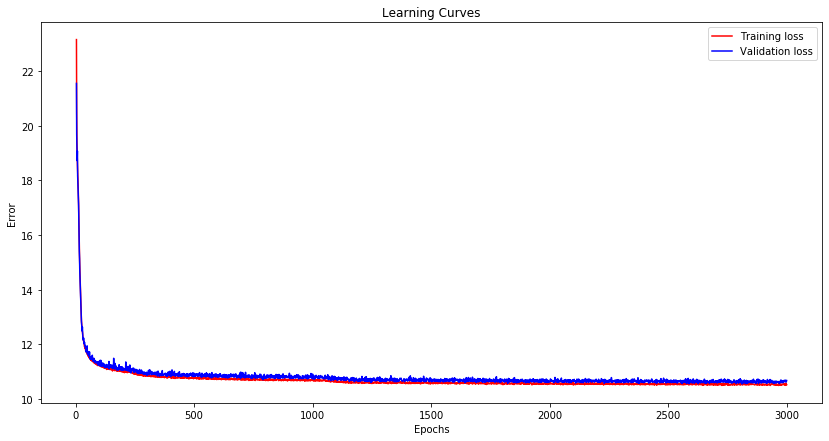

In [27]:
vae_Name='VAE_FC_h1_z15'
vae=vae_FC_h1_z15
train_data=VAE_train(vae, vae_Name)

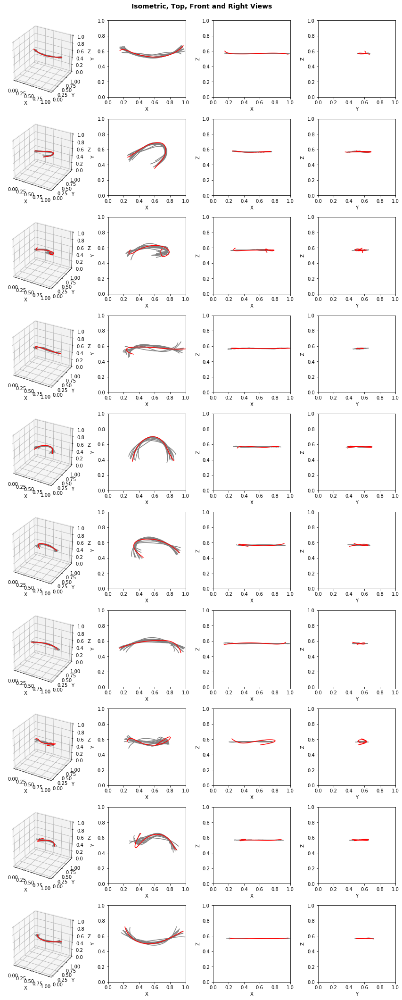

In [28]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=1, Z=30

Model: "model_51"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_26 (Flatten)            (None, 300)          0           input_26[0][0]                   
__________________________________________________________________________________________________
dense_148 (Dense)               (None, 100)          30100       flatten_26[0][0]                 
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 30)           3030        dense_148[0][0]                  
___________________________________________________________________________________________

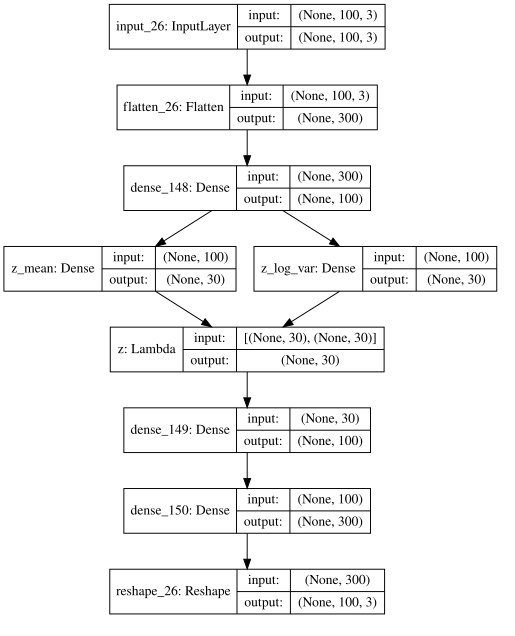

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 21us/step - loss: 88.5488 - reconstruction_loss: 79.9289 - kl_loss: 8.4578 - val_loss: 53.7375 - val_reconstruction_loss: 41.9458 - val_kl_loss: 11.6611

Epoch 00001: val_loss improved from inf to 53.73754, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 11us/step - loss: 44.1468 - reconstruction_loss: 32.6287 - kl_loss: 11.4842 - val_loss: 37.0566 - val_reconstruction_loss: 26.5435 - val_kl_loss: 10.4308

Epoch 00002: val_loss improved from 53.73754 to 37.05664, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 11us/step - loss: 33.1238 - reconstruction_loss: 23.6366 - kl_loss: 9.4671 - val_loss: 29.7779 - val_reconstruction_loss: 21.2261 - val_kl_loss: 8.4834

Epoch 00003: val_loss improved from 37.05664 to 29.77786, saving model to models_VAE/VAE_FC_h1_z3


Epoch 00026: val_loss improved from 12.28900 to 12.20156, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 27/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.1967 - reconstruction_loss: 8.2480 - kl_loss: 3.9446 - val_loss: 12.2073 - val_reconstruction_loss: 8.2551 - val_kl_loss: 3.9249

Epoch 00027: val_loss did not improve from 12.20156
Epoch 28/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.1650 - reconstruction_loss: 8.2462 - kl_loss: 3.9168 - val_loss: 12.1494 - val_reconstruction_loss: 8.2451 - val_kl_loss: 3.8727

Epoch 00028: val_loss improved from 12.20156 to 12.14938, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.1391 - reconstruction_loss: 8.2278 - kl_loss: 3.9067 - val_loss: 12.1751 - val_reconstruction_loss: 8.1850 - val_kl_loss: 3.9584

Epoch 00029: val_loss did not improve from 12.14938
Epoch 30/3000
16067/16067 [===============

16067/16067 [==============================] - 0s 11us/step - loss: 11.8522 - reconstruction_loss: 7.9134 - kl_loss: 3.9350 - val_loss: 11.8592 - val_reconstruction_loss: 7.8696 - val_kl_loss: 3.9639

Epoch 00055: val_loss did not improve from 11.82735
Epoch 56/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.8190 - reconstruction_loss: 7.8933 - kl_loss: 3.9234 - val_loss: 11.9263 - val_reconstruction_loss: 8.0240 - val_kl_loss: 3.8715

Epoch 00056: val_loss did not improve from 11.82735
Epoch 57/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.7983 - reconstruction_loss: 7.8720 - kl_loss: 3.9233 - val_loss: 11.7921 - val_reconstruction_loss: 7.8342 - val_kl_loss: 3.9285

Epoch 00057: val_loss improved from 11.82735 to 11.79209, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 58/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.7884 - reconstruction_loss: 7.8416 - kl_loss: 3.9417 - val_loss: 11.8403 - v


Epoch 00084: val_loss did not improve from 11.67642
Epoch 85/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6684 - reconstruction_loss: 7.6922 - kl_loss: 3.9721 - val_loss: 11.7396 - val_reconstruction_loss: 7.7764 - val_kl_loss: 3.9364

Epoch 00085: val_loss did not improve from 11.67642
Epoch 86/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6920 - reconstruction_loss: 7.7241 - kl_loss: 3.9648 - val_loss: 11.7417 - val_reconstruction_loss: 7.8162 - val_kl_loss: 3.8932

Epoch 00086: val_loss did not improve from 11.67642
Epoch 87/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6630 - reconstruction_loss: 7.7071 - kl_loss: 3.9537 - val_loss: 11.7579 - val_reconstruction_loss: 7.8355 - val_kl_loss: 3.8914

Epoch 00087: val_loss did not improve from 11.67642
Epoch 88/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6619 - reconstruction_loss: 7.7092 - kl_loss: 3.9487 - val_lo

16067/16067 [==============================] - 0s 11us/step - loss: 11.4641 - reconstruction_loss: 7.4729 - kl_loss: 3.9885 - val_loss: 11.5461 - val_reconstruction_loss: 7.5580 - val_kl_loss: 3.9625

Epoch 00144: val_loss did not improve from 11.47979
Epoch 145/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4585 - reconstruction_loss: 7.4444 - kl_loss: 4.0113 - val_loss: 11.5667 - val_reconstruction_loss: 7.7933 - val_kl_loss: 3.7427

Epoch 00145: val_loss did not improve from 11.47979
Epoch 146/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4839 - reconstruction_loss: 7.4808 - kl_loss: 4.0005 - val_loss: 11.5536 - val_reconstruction_loss: 7.5851 - val_kl_loss: 3.9400

Epoch 00146: val_loss did not improve from 11.47979
Epoch 147/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4742 - reconstruction_loss: 7.4925 - kl_loss: 3.9775 - val_loss: 11.5447 - val_reconstruction_loss: 7.5681 - val_kl_loss: 3.9

16067/16067 [==============================] - 0s 11us/step - loss: 11.4083 - reconstruction_loss: 7.3914 - kl_loss: 4.0127 - val_loss: 11.4274 - val_reconstruction_loss: 7.4201 - val_kl_loss: 3.9785

Epoch 00174: val_loss did not improve from 11.39399
Epoch 175/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3652 - reconstruction_loss: 7.3785 - kl_loss: 3.9835 - val_loss: 11.3882 - val_reconstruction_loss: 7.4225 - val_kl_loss: 3.9362

Epoch 00175: val_loss improved from 11.39399 to 11.38825, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 176/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3382 - reconstruction_loss: 7.3397 - kl_loss: 3.9961 - val_loss: 11.4257 - val_reconstruction_loss: 7.4654 - val_kl_loss: 3.9353

Epoch 00176: val_loss did not improve from 11.38825
Epoch 177/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3536 - reconstruction_loss: 7.3821 - kl_loss: 3.9679 - val_loss: 11.3952 


Epoch 00203: val_loss improved from 11.30463 to 11.30409, saving model to models_VAE/VAE_FC_h1_z30.hdf5
Epoch 204/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2660 - reconstruction_loss: 7.3190 - kl_loss: 3.9447 - val_loss: 11.4029 - val_reconstruction_loss: 7.4599 - val_kl_loss: 3.9178

Epoch 00204: val_loss did not improve from 11.30409
Epoch 205/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2806 - reconstruction_loss: 7.3115 - kl_loss: 3.9662 - val_loss: 11.3600 - val_reconstruction_loss: 7.4175 - val_kl_loss: 3.9103

Epoch 00205: val_loss did not improve from 11.30409
Epoch 206/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2786 - reconstruction_loss: 7.3079 - kl_loss: 3.9675 - val_loss: 11.3698 - val_reconstruction_loss: 7.4205 - val_kl_loss: 3.9242

Epoch 00206: val_loss did not improve from 11.30409
Epoch 207/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2608 


Epoch 00233: val_loss did not improve from 11.27003
Epoch 234/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2249 - reconstruction_loss: 7.2706 - kl_loss: 3.9511 - val_loss: 11.3274 - val_reconstruction_loss: 7.4479 - val_kl_loss: 3.8552

Epoch 00234: val_loss did not improve from 11.27003
Epoch 235/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2464 - reconstruction_loss: 7.2687 - kl_loss: 3.9738 - val_loss: 11.3584 - val_reconstruction_loss: 7.4012 - val_kl_loss: 3.9289

Epoch 00235: val_loss did not improve from 11.27003
Epoch 236/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2926 - reconstruction_loss: 7.3202 - kl_loss: 3.9679 - val_loss: 11.5424 - val_reconstruction_loss: 7.5669 - val_kl_loss: 3.9470

Epoch 00236: val_loss did not improve from 11.27003
Epoch 237/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2643 - reconstruction_loss: 7.2848 - kl_loss: 3.9759 - va


Epoch 00293: val_loss did not improve from 11.17301
Epoch 294/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1880 - reconstruction_loss: 7.2133 - kl_loss: 3.9705 - val_loss: 11.2919 - val_reconstruction_loss: 7.2418 - val_kl_loss: 4.0233

Epoch 00294: val_loss did not improve from 11.17301
Epoch 295/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1967 - reconstruction_loss: 7.2340 - kl_loss: 3.9586 - val_loss: 11.2926 - val_reconstruction_loss: 7.3735 - val_kl_loss: 3.8889

Epoch 00295: val_loss did not improve from 11.17301
Epoch 296/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1829 - reconstruction_loss: 7.2293 - kl_loss: 3.9498 - val_loss: 11.2757 - val_reconstruction_loss: 7.3028 - val_kl_loss: 3.9451

Epoch 00296: val_loss did not improve from 11.17301
Epoch 297/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2027 - reconstruction_loss: 7.2543 - kl_loss: 3.9450 - va


Epoch 00354: val_loss did not improve from 11.17301
Epoch 355/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1445 - reconstruction_loss: 7.1874 - kl_loss: 3.9531 - val_loss: 11.2852 - val_reconstruction_loss: 7.3211 - val_kl_loss: 3.9373

Epoch 00355: val_loss did not improve from 11.17301
Epoch 356/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1611 - reconstruction_loss: 7.1830 - kl_loss: 3.9740 - val_loss: 11.2278 - val_reconstruction_loss: 7.2072 - val_kl_loss: 3.9949

Epoch 00356: val_loss did not improve from 11.17301
Epoch 357/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1313 - reconstruction_loss: 7.1737 - kl_loss: 3.9551 - val_loss: 11.1926 - val_reconstruction_loss: 7.2310 - val_kl_loss: 3.9381

Epoch 00357: val_loss did not improve from 11.17301
Epoch 358/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1503 - reconstruction_loss: 7.1788 - kl_loss: 3.9680 - va

16067/16067 [==============================] - 0s 11us/step - loss: 11.0977 - reconstruction_loss: 7.1620 - kl_loss: 3.9324 - val_loss: 11.1915 - val_reconstruction_loss: 7.3528 - val_kl_loss: 3.8090

Epoch 00415: val_loss did not improve from 11.13095
Epoch 416/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1105 - reconstruction_loss: 7.1740 - kl_loss: 3.9318 - val_loss: 11.1777 - val_reconstruction_loss: 7.1066 - val_kl_loss: 4.0432

Epoch 00416: val_loss did not improve from 11.13095
Epoch 417/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1401 - reconstruction_loss: 7.2151 - kl_loss: 3.9201 - val_loss: 11.2376 - val_reconstruction_loss: 7.1661 - val_kl_loss: 4.0453

Epoch 00417: val_loss did not improve from 11.13095
Epoch 418/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1062 - reconstruction_loss: 7.1618 - kl_loss: 3.9416 - val_loss: 11.2121 - val_reconstruction_loss: 7.2151 - val_kl_loss: 3.9


Epoch 00475: val_loss did not improve from 11.08166
Epoch 476/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0751 - reconstruction_loss: 7.1407 - kl_loss: 3.9309 - val_loss: 11.1481 - val_reconstruction_loss: 7.1749 - val_kl_loss: 3.9470

Epoch 00476: val_loss did not improve from 11.08166
Epoch 477/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.1068 - reconstruction_loss: 7.1571 - kl_loss: 3.9457 - val_loss: 11.1389 - val_reconstruction_loss: 7.0225 - val_kl_loss: 4.0901

Epoch 00477: val_loss did not improve from 11.08166
Epoch 478/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1073 - reconstruction_loss: 7.1610 - kl_loss: 3.9424 - val_loss: 11.2706 - val_reconstruction_loss: 7.0862 - val_kl_loss: 4.1570

Epoch 00478: val_loss did not improve from 11.08166
Epoch 479/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0571 - reconstruction_loss: 7.1302 - kl_loss: 3.9238 - va

16067/16067 [==============================] - 0s 11us/step - loss: 11.0511 - reconstruction_loss: 7.1163 - kl_loss: 3.9317 - val_loss: 11.1029 - val_reconstruction_loss: 7.0248 - val_kl_loss: 4.0513

Epoch 00536: val_loss did not improve from 11.06410
Epoch 537/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0332 - reconstruction_loss: 7.1096 - kl_loss: 3.9201 - val_loss: 11.1422 - val_reconstruction_loss: 7.1448 - val_kl_loss: 3.9683

Epoch 00537: val_loss did not improve from 11.06410
Epoch 538/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0232 - reconstruction_loss: 7.1022 - kl_loss: 3.9187 - val_loss: 11.1655 - val_reconstruction_loss: 7.3021 - val_kl_loss: 3.8331

Epoch 00538: val_loss did not improve from 11.06410
Epoch 539/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0285 - reconstruction_loss: 7.1037 - kl_loss: 3.9204 - val_loss: 11.2464 - val_reconstruction_loss: 7.0101 - val_kl_loss: 4.2

16067/16067 [==============================] - 0s 11us/step - loss: 10.9959 - reconstruction_loss: 7.0803 - kl_loss: 3.9123 - val_loss: 11.1364 - val_reconstruction_loss: 7.0668 - val_kl_loss: 4.0404

Epoch 00596: val_loss did not improve from 11.03541
Epoch 597/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0142 - reconstruction_loss: 7.0873 - kl_loss: 3.9244 - val_loss: 11.1138 - val_reconstruction_loss: 7.2027 - val_kl_loss: 3.8813

Epoch 00597: val_loss did not improve from 11.03541
Epoch 598/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0291 - reconstruction_loss: 7.0859 - kl_loss: 3.9396 - val_loss: 11.1030 - val_reconstruction_loss: 7.1901 - val_kl_loss: 3.8886

Epoch 00598: val_loss did not improve from 11.03541
Epoch 599/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0322 - reconstruction_loss: 7.1008 - kl_loss: 3.9273 - val_loss: 11.0705 - val_reconstruction_loss: 7.1706 - val_kl_loss: 3.8


Epoch 00626: val_loss did not improve from 11.03541
Epoch 627/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.0079 - reconstruction_loss: 7.0916 - kl_loss: 3.9139 - val_loss: 11.2176 - val_reconstruction_loss: 7.3281 - val_kl_loss: 3.8642

Epoch 00627: val_loss did not improve from 11.03541
Epoch 628/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0066 - reconstruction_loss: 7.0890 - kl_loss: 3.9132 - val_loss: 11.1073 - val_reconstruction_loss: 7.0791 - val_kl_loss: 4.0005

Epoch 00628: val_loss did not improve from 11.03541
Epoch 629/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9928 - reconstruction_loss: 7.0682 - kl_loss: 3.9216 - val_loss: 11.1351 - val_reconstruction_loss: 7.3700 - val_kl_loss: 3.7383

Epoch 00629: val_loss did not improve from 11.03541
Epoch 630/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0219 - reconstruction_loss: 7.0974 - kl_loss: 3.9219 - va


Epoch 00687: val_loss did not improve from 11.03541
Epoch 688/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0014 - reconstruction_loss: 7.1043 - kl_loss: 3.8933 - val_loss: 11.1427 - val_reconstruction_loss: 7.2345 - val_kl_loss: 3.8791

Epoch 00688: val_loss did not improve from 11.03541
Epoch 689/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0402 - reconstruction_loss: 7.0868 - kl_loss: 3.9502 - val_loss: 11.1391 - val_reconstruction_loss: 7.1628 - val_kl_loss: 3.9459

Epoch 00689: val_loss did not improve from 11.03541
Epoch 690/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0057 - reconstruction_loss: 7.1015 - kl_loss: 3.8999 - val_loss: 11.0460 - val_reconstruction_loss: 7.1705 - val_kl_loss: 3.8492

Epoch 00690: val_loss did not improve from 11.03541
Epoch 691/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0127 - reconstruction_loss: 7.0920 - kl_loss: 3.9169 - va

16067/16067 [==============================] - 0s 11us/step - loss: 11.0066 - reconstruction_loss: 7.1016 - kl_loss: 3.9026 - val_loss: 11.0468 - val_reconstruction_loss: 7.2551 - val_kl_loss: 3.7634

Epoch 00748: val_loss did not improve from 11.02509
Epoch 749/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0107 - reconstruction_loss: 7.1002 - kl_loss: 3.9070 - val_loss: 11.0490 - val_reconstruction_loss: 7.0931 - val_kl_loss: 3.9290

Epoch 00749: val_loss did not improve from 11.02509
Epoch 750/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9690 - reconstruction_loss: 7.0650 - kl_loss: 3.9013 - val_loss: 11.0593 - val_reconstruction_loss: 7.1336 - val_kl_loss: 3.8979

Epoch 00750: val_loss did not improve from 11.02509
Epoch 751/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9585 - reconstruction_loss: 7.0748 - kl_loss: 3.8803 - val_loss: 11.0780 - val_reconstruction_loss: 7.3033 - val_kl_loss: 3.7


Epoch 00778: val_loss did not improve from 11.02509
Epoch 779/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0360 - reconstruction_loss: 7.1144 - kl_loss: 3.9182 - val_loss: 11.0856 - val_reconstruction_loss: 6.9470 - val_kl_loss: 4.1104

Epoch 00779: val_loss did not improve from 11.02509
Epoch 780/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9994 - reconstruction_loss: 7.0884 - kl_loss: 3.9063 - val_loss: 11.0918 - val_reconstruction_loss: 7.0963 - val_kl_loss: 3.9709

Epoch 00780: val_loss did not improve from 11.02509
Epoch 781/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9960 - reconstruction_loss: 7.0857 - kl_loss: 3.9065 - val_loss: 11.1918 - val_reconstruction_loss: 7.2840 - val_kl_loss: 3.8796

Epoch 00781: val_loss did not improve from 11.02509
Epoch 782/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0314 - reconstruction_loss: 7.1155 - kl_loss: 3.9121 - va

16067/16067 [==============================] - 0s 11us/step - loss: 10.9946 - reconstruction_loss: 7.1026 - kl_loss: 3.8884 - val_loss: 11.0374 - val_reconstruction_loss: 7.0309 - val_kl_loss: 3.9804

Epoch 00839: val_loss did not improve from 10.99375
Epoch 840/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0019 - reconstruction_loss: 7.1029 - kl_loss: 3.8956 - val_loss: 11.1164 - val_reconstruction_loss: 7.1538 - val_kl_loss: 3.9352

Epoch 00840: val_loss did not improve from 10.99375
Epoch 841/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9755 - reconstruction_loss: 7.0890 - kl_loss: 3.8820 - val_loss: 11.0789 - val_reconstruction_loss: 7.2728 - val_kl_loss: 3.7764

Epoch 00841: val_loss did not improve from 10.99375
Epoch 842/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9799 - reconstruction_loss: 7.0995 - kl_loss: 3.8777 - val_loss: 11.0819 - val_reconstruction_loss: 7.2930 - val_kl_loss: 3.7


Epoch 00899: val_loss did not improve from 10.97428
Epoch 900/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9926 - reconstruction_loss: 7.1183 - kl_loss: 3.8709 - val_loss: 11.0771 - val_reconstruction_loss: 7.0603 - val_kl_loss: 3.9884

Epoch 00900: val_loss did not improve from 10.97428
Epoch 901/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9679 - reconstruction_loss: 7.0695 - kl_loss: 3.8945 - val_loss: 11.0798 - val_reconstruction_loss: 7.1671 - val_kl_loss: 3.8871

Epoch 00901: val_loss did not improve from 10.97428
Epoch 902/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9717 - reconstruction_loss: 7.0942 - kl_loss: 3.8739 - val_loss: 11.2005 - val_reconstruction_loss: 7.2478 - val_kl_loss: 3.9245

Epoch 00902: val_loss did not improve from 10.97428
Epoch 903/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9822 - reconstruction_loss: 7.1029 - kl_loss: 3.8744 - va

16067/16067 [==============================] - 0s 11us/step - loss: 10.9474 - reconstruction_loss: 7.0729 - kl_loss: 3.8723 - val_loss: 11.0456 - val_reconstruction_loss: 7.1451 - val_kl_loss: 3.8736

Epoch 00960: val_loss did not improve from 10.96567
Epoch 961/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9176 - reconstruction_loss: 7.0421 - kl_loss: 3.8719 - val_loss: 11.0630 - val_reconstruction_loss: 7.1509 - val_kl_loss: 3.8859

Epoch 00961: val_loss did not improve from 10.96567
Epoch 962/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9589 - reconstruction_loss: 7.0696 - kl_loss: 3.8850 - val_loss: 11.0934 - val_reconstruction_loss: 7.2166 - val_kl_loss: 3.8520

Epoch 00962: val_loss did not improve from 10.96567
Epoch 963/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9746 - reconstruction_loss: 7.1112 - kl_loss: 3.8596 - val_loss: 11.0915 - val_reconstruction_loss: 7.1475 - val_kl_loss: 3.9


Epoch 01020: val_loss did not improve from 10.96353
Epoch 1021/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9338 - reconstruction_loss: 7.0759 - kl_loss: 3.8532 - val_loss: 11.0290 - val_reconstruction_loss: 7.1133 - val_kl_loss: 3.8900

Epoch 01021: val_loss did not improve from 10.96353
Epoch 1022/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9527 - reconstruction_loss: 7.0591 - kl_loss: 3.8894 - val_loss: 11.0490 - val_reconstruction_loss: 7.1779 - val_kl_loss: 3.8456

Epoch 01022: val_loss did not improve from 10.96353
Epoch 1023/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9776 - reconstruction_loss: 7.0805 - kl_loss: 3.8935 - val_loss: 11.0733 - val_reconstruction_loss: 7.0442 - val_kl_loss: 4.0019

Epoch 01023: val_loss did not improve from 10.96353
Epoch 1024/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9517 - reconstruction_loss: 7.0906 - kl_loss: 3.8588 


Epoch 01081: val_loss did not improve from 10.96353
Epoch 1082/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9293 - reconstruction_loss: 7.0498 - kl_loss: 3.8758 - val_loss: 11.0201 - val_reconstruction_loss: 7.0260 - val_kl_loss: 3.9701

Epoch 01082: val_loss did not improve from 10.96353
Epoch 1083/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9702 - reconstruction_loss: 7.1011 - kl_loss: 3.8658 - val_loss: 11.0410 - val_reconstruction_loss: 7.1079 - val_kl_loss: 3.9062

Epoch 01083: val_loss did not improve from 10.96353
Epoch 1084/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9464 - reconstruction_loss: 7.0676 - kl_loss: 3.8762 - val_loss: 10.9770 - val_reconstruction_loss: 7.2063 - val_kl_loss: 3.7421

Epoch 01084: val_loss did not improve from 10.96353
Epoch 1085/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9431 - reconstruction_loss: 7.0512 - kl_loss: 3.8872 


Epoch 01142: val_loss did not improve from 10.96353
Epoch 1143/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9282 - reconstruction_loss: 7.0352 - kl_loss: 3.8895 - val_loss: 10.9865 - val_reconstruction_loss: 7.0948 - val_kl_loss: 3.8666

Epoch 01143: val_loss did not improve from 10.96353
Epoch 1144/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9479 - reconstruction_loss: 7.0712 - kl_loss: 3.8727 - val_loss: 11.0423 - val_reconstruction_loss: 7.0307 - val_kl_loss: 3.9849

Epoch 01144: val_loss did not improve from 10.96353
Epoch 1145/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9473 - reconstruction_loss: 7.0586 - kl_loss: 3.8851 - val_loss: 10.9981 - val_reconstruction_loss: 7.0641 - val_kl_loss: 3.9059

Epoch 01145: val_loss did not improve from 10.96353
Epoch 1146/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9469 - reconstruction_loss: 7.0623 - kl_loss: 3.8825 


Epoch 01203: val_loss did not improve from 10.95482
Epoch 1204/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9515 - reconstruction_loss: 7.0356 - kl_loss: 3.9126 - val_loss: 11.0162 - val_reconstruction_loss: 7.1860 - val_kl_loss: 3.8041

Epoch 01204: val_loss did not improve from 10.95482
Epoch 1205/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9213 - reconstruction_loss: 7.0248 - kl_loss: 3.8930 - val_loss: 10.9864 - val_reconstruction_loss: 7.1376 - val_kl_loss: 3.8238

Epoch 01205: val_loss did not improve from 10.95482
Epoch 1206/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9592 - reconstruction_loss: 7.0542 - kl_loss: 3.9013 - val_loss: 11.0696 - val_reconstruction_loss: 7.2219 - val_kl_loss: 3.8211

Epoch 01206: val_loss did not improve from 10.95482
Epoch 1207/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9014 - reconstruction_loss: 7.0120 - kl_loss: 3.8853 


Epoch 01264: val_loss did not improve from 10.91673
Epoch 1265/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9254 - reconstruction_loss: 7.0412 - kl_loss: 3.8815 - val_loss: 11.1082 - val_reconstruction_loss: 7.3143 - val_kl_loss: 3.7648

Epoch 01265: val_loss did not improve from 10.91673
Epoch 1266/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9026 - reconstruction_loss: 7.0394 - kl_loss: 3.8598 - val_loss: 10.9303 - val_reconstruction_loss: 6.9617 - val_kl_loss: 3.9413

Epoch 01266: val_loss did not improve from 10.91673
Epoch 1267/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8941 - reconstruction_loss: 7.0023 - kl_loss: 3.8882 - val_loss: 10.9896 - val_reconstruction_loss: 7.1238 - val_kl_loss: 3.8381

Epoch 01267: val_loss did not improve from 10.91673
Epoch 1268/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9188 - reconstruction_loss: 7.0208 - kl_loss: 3.8944 

16067/16067 [==============================] - 0s 11us/step - loss: 10.9186 - reconstruction_loss: 7.0324 - kl_loss: 3.8821 - val_loss: 10.9719 - val_reconstruction_loss: 7.1394 - val_kl_loss: 3.8069

Epoch 01325: val_loss did not improve from 10.87964
Epoch 1326/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8979 - reconstruction_loss: 7.0224 - kl_loss: 3.8714 - val_loss: 10.9805 - val_reconstruction_loss: 7.0790 - val_kl_loss: 3.8765

Epoch 01326: val_loss did not improve from 10.87964
Epoch 1327/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9027 - reconstruction_loss: 7.0135 - kl_loss: 3.8865 - val_loss: 10.9646 - val_reconstruction_loss: 7.0930 - val_kl_loss: 3.8449

Epoch 01327: val_loss did not improve from 10.87964
Epoch 1328/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8948 - reconstruction_loss: 7.0028 - kl_loss: 3.8891 - val_loss: 11.0580 - val_reconstruction_loss: 7.1312 - val_kl_loss: 


Epoch 01355: val_loss did not improve from 10.87964
Epoch 1356/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9172 - reconstruction_loss: 7.0293 - kl_loss: 3.8840 - val_loss: 11.0632 - val_reconstruction_loss: 7.0624 - val_kl_loss: 3.9743

Epoch 01356: val_loss did not improve from 10.87964
Epoch 1357/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9299 - reconstruction_loss: 7.0343 - kl_loss: 3.8914 - val_loss: 11.0294 - val_reconstruction_loss: 7.1665 - val_kl_loss: 3.8388

Epoch 01357: val_loss did not improve from 10.87964
Epoch 1358/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9171 - reconstruction_loss: 7.0157 - kl_loss: 3.8972 - val_loss: 10.9770 - val_reconstruction_loss: 7.0585 - val_kl_loss: 3.8904

Epoch 01358: val_loss did not improve from 10.87964
Epoch 1359/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9200 - reconstruction_loss: 7.0557 - kl_loss: 3.8602 


Epoch 01416: val_loss did not improve from 10.87964
Epoch 1417/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9007 - reconstruction_loss: 6.9819 - kl_loss: 3.9160 - val_loss: 11.0313 - val_reconstruction_loss: 7.0802 - val_kl_loss: 3.9224

Epoch 01417: val_loss did not improve from 10.87964
Epoch 1418/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9002 - reconstruction_loss: 7.0161 - kl_loss: 3.8805 - val_loss: 10.9908 - val_reconstruction_loss: 7.1874 - val_kl_loss: 3.7793

Epoch 01418: val_loss did not improve from 10.87964
Epoch 1419/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8959 - reconstruction_loss: 7.0132 - kl_loss: 3.8800 - val_loss: 11.0139 - val_reconstruction_loss: 7.1333 - val_kl_loss: 3.8554

Epoch 01419: val_loss did not improve from 10.87964
Epoch 1420/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8981 - reconstruction_loss: 7.0047 - kl_loss: 3.8911 


Epoch 01477: val_loss did not improve from 10.87964
Epoch 1478/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9035 - reconstruction_loss: 7.0107 - kl_loss: 3.8900 - val_loss: 10.9702 - val_reconstruction_loss: 7.0762 - val_kl_loss: 3.8679

Epoch 01478: val_loss did not improve from 10.87964
Epoch 1479/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9082 - reconstruction_loss: 7.0302 - kl_loss: 3.8740 - val_loss: 10.9798 - val_reconstruction_loss: 7.0599 - val_kl_loss: 3.8941

Epoch 01479: val_loss did not improve from 10.87964
Epoch 1480/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8828 - reconstruction_loss: 6.9874 - kl_loss: 3.8927 - val_loss: 10.9857 - val_reconstruction_loss: 7.1494 - val_kl_loss: 3.8085

Epoch 01480: val_loss did not improve from 10.87964
Epoch 1481/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9056 - reconstruction_loss: 7.0070 - kl_loss: 3.8954 


Epoch 01538: val_loss did not improve from 10.87964
Epoch 1539/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8665 - reconstruction_loss: 6.9734 - kl_loss: 3.8893 - val_loss: 11.0471 - val_reconstruction_loss: 7.0232 - val_kl_loss: 3.9937

Epoch 01539: val_loss did not improve from 10.87964
Epoch 1540/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9044 - reconstruction_loss: 7.0112 - kl_loss: 3.8894 - val_loss: 11.0587 - val_reconstruction_loss: 7.0985 - val_kl_loss: 3.9350

Epoch 01540: val_loss did not improve from 10.87964
Epoch 1541/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8997 - reconstruction_loss: 7.0062 - kl_loss: 3.8895 - val_loss: 11.0054 - val_reconstruction_loss: 7.0594 - val_kl_loss: 3.9223

Epoch 01541: val_loss did not improve from 10.87964
Epoch 1542/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8857 - reconstruction_loss: 7.0014 - kl_loss: 3.8811 


Epoch 01599: val_loss did not improve from 10.87964
Epoch 1600/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8887 - reconstruction_loss: 6.9614 - kl_loss: 3.9248 - val_loss: 10.9862 - val_reconstruction_loss: 7.1982 - val_kl_loss: 3.7636

Epoch 01600: val_loss did not improve from 10.87964
Epoch 1601/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8832 - reconstruction_loss: 6.9857 - kl_loss: 3.8947 - val_loss: 10.9738 - val_reconstruction_loss: 7.0748 - val_kl_loss: 3.8749

Epoch 01601: val_loss did not improve from 10.87964
Epoch 1602/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9390 - reconstruction_loss: 7.0158 - kl_loss: 3.9204 - val_loss: 11.1266 - val_reconstruction_loss: 7.3557 - val_kl_loss: 3.7428

Epoch 01602: val_loss did not improve from 10.87964
Epoch 1603/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8809 - reconstruction_loss: 7.0018 - kl_loss: 3.8761 


Epoch 01660: val_loss did not improve from 10.87964
Epoch 1661/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9015 - reconstruction_loss: 6.9968 - kl_loss: 3.9007 - val_loss: 10.9454 - val_reconstruction_loss: 7.0753 - val_kl_loss: 3.8420

Epoch 01661: val_loss did not improve from 10.87964
Epoch 1662/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8642 - reconstruction_loss: 6.9942 - kl_loss: 3.8679 - val_loss: 11.0025 - val_reconstruction_loss: 7.2795 - val_kl_loss: 3.6986

Epoch 01662: val_loss did not improve from 10.87964
Epoch 1663/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8816 - reconstruction_loss: 6.9725 - kl_loss: 3.9072 - val_loss: 10.9898 - val_reconstruction_loss: 7.0015 - val_kl_loss: 3.9600

Epoch 01663: val_loss did not improve from 10.87964
Epoch 1664/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8818 - reconstruction_loss: 6.9831 - kl_loss: 3.8940 


Epoch 01721: val_loss did not improve from 10.87964
Epoch 1722/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8640 - reconstruction_loss: 6.9589 - kl_loss: 3.9021 - val_loss: 10.9586 - val_reconstruction_loss: 7.0675 - val_kl_loss: 3.8642

Epoch 01722: val_loss did not improve from 10.87964
Epoch 1723/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8880 - reconstruction_loss: 6.9811 - kl_loss: 3.9045 - val_loss: 11.0232 - val_reconstruction_loss: 7.1086 - val_kl_loss: 3.8872

Epoch 01723: val_loss did not improve from 10.87964
Epoch 1724/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8625 - reconstruction_loss: 6.9868 - kl_loss: 3.8714 - val_loss: 11.0018 - val_reconstruction_loss: 7.1357 - val_kl_loss: 3.8363

Epoch 01724: val_loss did not improve from 10.87964
Epoch 1725/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8814 - reconstruction_loss: 6.9797 - kl_loss: 3.8978 


Epoch 01782: val_loss did not improve from 10.87964
Epoch 1783/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8640 - reconstruction_loss: 6.9890 - kl_loss: 3.8708 - val_loss: 10.9549 - val_reconstruction_loss: 7.0245 - val_kl_loss: 3.9036

Epoch 01783: val_loss did not improve from 10.87964
Epoch 1784/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8707 - reconstruction_loss: 6.9705 - kl_loss: 3.8971 - val_loss: 11.0708 - val_reconstruction_loss: 7.0847 - val_kl_loss: 3.9579

Epoch 01784: val_loss did not improve from 10.87964
Epoch 1785/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8827 - reconstruction_loss: 6.9808 - kl_loss: 3.8986 - val_loss: 10.9696 - val_reconstruction_loss: 7.0205 - val_kl_loss: 3.9218

Epoch 01785: val_loss did not improve from 10.87964
Epoch 1786/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8677 - reconstruction_loss: 6.9577 - kl_loss: 3.9070 


Epoch 01843: val_loss did not improve from 10.87964
Epoch 1844/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8753 - reconstruction_loss: 6.9969 - kl_loss: 3.8762 - val_loss: 10.9839 - val_reconstruction_loss: 7.1050 - val_kl_loss: 3.8542

Epoch 01844: val_loss did not improve from 10.87964
Epoch 1845/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8686 - reconstruction_loss: 6.9850 - kl_loss: 3.8792 - val_loss: 10.9821 - val_reconstruction_loss: 7.0675 - val_kl_loss: 3.8859

Epoch 01845: val_loss did not improve from 10.87964
Epoch 1846/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8733 - reconstruction_loss: 6.9738 - kl_loss: 3.8978 - val_loss: 10.9485 - val_reconstruction_loss: 6.9945 - val_kl_loss: 3.9278

Epoch 01846: val_loss did not improve from 10.87964
Epoch 1847/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8935 - reconstruction_loss: 6.9859 - kl_loss: 3.9057 


Epoch 01904: val_loss did not improve from 10.87964
Epoch 1905/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8835 - reconstruction_loss: 6.9781 - kl_loss: 3.9014 - val_loss: 11.0221 - val_reconstruction_loss: 7.2030 - val_kl_loss: 3.7912

Epoch 01905: val_loss did not improve from 10.87964
Epoch 1906/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8625 - reconstruction_loss: 6.9811 - kl_loss: 3.8770 - val_loss: 10.9907 - val_reconstruction_loss: 6.9104 - val_kl_loss: 4.0514

Epoch 01906: val_loss did not improve from 10.87964
Epoch 1907/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8947 - reconstruction_loss: 6.9930 - kl_loss: 3.8985 - val_loss: 11.0167 - val_reconstruction_loss: 7.0944 - val_kl_loss: 3.8941

Epoch 01907: val_loss did not improve from 10.87964
Epoch 1908/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8973 - reconstruction_loss: 6.9766 - kl_loss: 3.9169 


Epoch 01965: val_loss did not improve from 10.87964
Epoch 1966/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8694 - reconstruction_loss: 6.9729 - kl_loss: 3.8944 - val_loss: 11.0192 - val_reconstruction_loss: 7.1490 - val_kl_loss: 3.8425

Epoch 01966: val_loss did not improve from 10.87964
Epoch 1967/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8616 - reconstruction_loss: 6.9555 - kl_loss: 3.9037 - val_loss: 10.9903 - val_reconstruction_loss: 7.2126 - val_kl_loss: 3.7538

Epoch 01967: val_loss did not improve from 10.87964
Epoch 1968/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8457 - reconstruction_loss: 6.9863 - kl_loss: 3.8559 - val_loss: 11.0738 - val_reconstruction_loss: 7.1159 - val_kl_loss: 3.9333

Epoch 01968: val_loss did not improve from 10.87964
Epoch 1969/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8784 - reconstruction_loss: 6.9600 - kl_loss: 3.9151 


Epoch 02026: val_loss did not improve from 10.87964
Epoch 2027/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8843 - reconstruction_loss: 7.0246 - kl_loss: 3.8562 - val_loss: 10.9867 - val_reconstruction_loss: 7.0269 - val_kl_loss: 3.9353

Epoch 02027: val_loss did not improve from 10.87964
Epoch 2028/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8784 - reconstruction_loss: 6.9884 - kl_loss: 3.8860 - val_loss: 10.9873 - val_reconstruction_loss: 6.9819 - val_kl_loss: 3.9791

Epoch 02028: val_loss did not improve from 10.87964
Epoch 2029/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8809 - reconstruction_loss: 6.9795 - kl_loss: 3.8981 - val_loss: 11.0404 - val_reconstruction_loss: 7.0448 - val_kl_loss: 3.9695

Epoch 02029: val_loss did not improve from 10.87964
Epoch 2030/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9063 - reconstruction_loss: 7.0008 - kl_loss: 3.9025 


Epoch 02087: val_loss did not improve from 10.87964
Epoch 2088/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8847 - reconstruction_loss: 7.0038 - kl_loss: 3.8779 - val_loss: 10.9848 - val_reconstruction_loss: 7.1622 - val_kl_loss: 3.7948

Epoch 02088: val_loss did not improve from 10.87964
Epoch 2089/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8993 - reconstruction_loss: 7.0024 - kl_loss: 3.8916 - val_loss: 10.9570 - val_reconstruction_loss: 7.0040 - val_kl_loss: 3.9244

Epoch 02089: val_loss did not improve from 10.87964
Epoch 2090/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8496 - reconstruction_loss: 6.9453 - kl_loss: 3.9006 - val_loss: 11.0017 - val_reconstruction_loss: 7.1707 - val_kl_loss: 3.8024

Epoch 02090: val_loss did not improve from 10.87964
Epoch 2091/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8653 - reconstruction_loss: 6.9755 - kl_loss: 3.8867 


Epoch 02148: val_loss did not improve from 10.87964
Epoch 2149/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8695 - reconstruction_loss: 6.9631 - kl_loss: 3.9036 - val_loss: 10.9193 - val_reconstruction_loss: 7.0501 - val_kl_loss: 3.8425

Epoch 02149: val_loss did not improve from 10.87964
Epoch 2150/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8799 - reconstruction_loss: 6.9829 - kl_loss: 3.8929 - val_loss: 10.9610 - val_reconstruction_loss: 7.0446 - val_kl_loss: 3.8883

Epoch 02150: val_loss did not improve from 10.87964
Epoch 2151/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8788 - reconstruction_loss: 6.9749 - kl_loss: 3.9010 - val_loss: 10.9538 - val_reconstruction_loss: 7.0303 - val_kl_loss: 3.8971

Epoch 02151: val_loss did not improve from 10.87964
Epoch 2152/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8585 - reconstruction_loss: 6.9743 - kl_loss: 3.8792 


Epoch 02209: val_loss did not improve from 10.87964
Epoch 2210/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8493 - reconstruction_loss: 6.9635 - kl_loss: 3.8823 - val_loss: 10.9736 - val_reconstruction_loss: 6.9742 - val_kl_loss: 3.9719

Epoch 02210: val_loss did not improve from 10.87964
Epoch 2211/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8552 - reconstruction_loss: 6.9651 - kl_loss: 3.8867 - val_loss: 10.9594 - val_reconstruction_loss: 7.0577 - val_kl_loss: 3.8733

Epoch 02211: val_loss did not improve from 10.87964
Epoch 2212/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8392 - reconstruction_loss: 6.9543 - kl_loss: 3.8821 - val_loss: 11.0427 - val_reconstruction_loss: 7.3081 - val_kl_loss: 3.7090

Epoch 02212: val_loss did not improve from 10.87964
Epoch 2213/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8842 - reconstruction_loss: 6.9794 - kl_loss: 3.9021 


Epoch 02270: val_loss did not improve from 10.87964
Epoch 2271/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8784 - reconstruction_loss: 6.9999 - kl_loss: 3.8760 - val_loss: 10.9502 - val_reconstruction_loss: 6.9781 - val_kl_loss: 3.9492

Epoch 02271: val_loss did not improve from 10.87964
Epoch 2272/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8578 - reconstruction_loss: 6.9610 - kl_loss: 3.8929 - val_loss: 10.9174 - val_reconstruction_loss: 6.9925 - val_kl_loss: 3.8968

Epoch 02272: val_loss did not improve from 10.87964
Epoch 2273/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8653 - reconstruction_loss: 6.9846 - kl_loss: 3.8771 - val_loss: 10.9451 - val_reconstruction_loss: 7.0813 - val_kl_loss: 3.8321

Epoch 02273: val_loss did not improve from 10.87964
Epoch 2274/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8548 - reconstruction_loss: 6.9511 - kl_loss: 3.9016 


Epoch 02331: val_loss did not improve from 10.87964
Epoch 2332/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8792 - reconstruction_loss: 6.9927 - kl_loss: 3.8824 - val_loss: 10.9589 - val_reconstruction_loss: 7.0781 - val_kl_loss: 3.8523

Epoch 02332: val_loss did not improve from 10.87964
Epoch 2333/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8580 - reconstruction_loss: 6.9754 - kl_loss: 3.8783 - val_loss: 10.9634 - val_reconstruction_loss: 7.1001 - val_kl_loss: 3.8347

Epoch 02333: val_loss did not improve from 10.87964
Epoch 2334/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8585 - reconstruction_loss: 6.9819 - kl_loss: 3.8728 - val_loss: 10.9493 - val_reconstruction_loss: 7.1448 - val_kl_loss: 3.7799

Epoch 02334: val_loss did not improve from 10.87964
Epoch 2335/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8902 - reconstruction_loss: 6.9793 - kl_loss: 3.9067 


Epoch 02392: val_loss did not improve from 10.87964
Epoch 2393/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8471 - reconstruction_loss: 6.9844 - kl_loss: 3.8583 - val_loss: 10.9251 - val_reconstruction_loss: 6.9845 - val_kl_loss: 3.9140

Epoch 02393: val_loss did not improve from 10.87964
Epoch 2394/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8567 - reconstruction_loss: 6.9838 - kl_loss: 3.8698 - val_loss: 10.9375 - val_reconstruction_loss: 7.0375 - val_kl_loss: 3.8741

Epoch 02394: val_loss did not improve from 10.87964
Epoch 2395/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8781 - reconstruction_loss: 6.9786 - kl_loss: 3.8954 - val_loss: 10.9587 - val_reconstruction_loss: 7.1890 - val_kl_loss: 3.7426

Epoch 02395: val_loss did not improve from 10.87964
Epoch 2396/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8606 - reconstruction_loss: 6.9847 - kl_loss: 3.8726 


Epoch 02453: val_loss did not improve from 10.87964
Epoch 2454/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8622 - reconstruction_loss: 6.9849 - kl_loss: 3.8743 - val_loss: 10.9885 - val_reconstruction_loss: 7.0467 - val_kl_loss: 3.9153

Epoch 02454: val_loss did not improve from 10.87964
Epoch 2455/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8601 - reconstruction_loss: 6.9810 - kl_loss: 3.8759 - val_loss: 11.0082 - val_reconstruction_loss: 6.9601 - val_kl_loss: 4.0221

Epoch 02455: val_loss did not improve from 10.87964
Epoch 2456/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8672 - reconstruction_loss: 6.9714 - kl_loss: 3.8944 - val_loss: 11.0054 - val_reconstruction_loss: 7.2426 - val_kl_loss: 3.7361

Epoch 02456: val_loss did not improve from 10.87964
Epoch 2457/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8375 - reconstruction_loss: 6.9659 - kl_loss: 3.8666 


Epoch 02514: val_loss did not improve from 10.87964
Epoch 2515/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8759 - reconstruction_loss: 6.9778 - kl_loss: 3.8943 - val_loss: 11.0168 - val_reconstruction_loss: 7.0954 - val_kl_loss: 3.8962

Epoch 02515: val_loss did not improve from 10.87964
Epoch 2516/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8735 - reconstruction_loss: 7.0138 - kl_loss: 3.8567 - val_loss: 10.9525 - val_reconstruction_loss: 7.0313 - val_kl_loss: 3.8939

Epoch 02516: val_loss did not improve from 10.87964
Epoch 2517/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8372 - reconstruction_loss: 6.9272 - kl_loss: 3.9061 - val_loss: 10.9413 - val_reconstruction_loss: 6.9204 - val_kl_loss: 3.9926

Epoch 02517: val_loss did not improve from 10.87964
Epoch 2518/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8964 - reconstruction_loss: 6.9941 - kl_loss: 3.8992 


Epoch 02575: val_loss did not improve from 10.87894
Epoch 2576/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8597 - reconstruction_loss: 6.9606 - kl_loss: 3.8945 - val_loss: 11.0106 - val_reconstruction_loss: 7.0924 - val_kl_loss: 3.8896

Epoch 02576: val_loss did not improve from 10.87894
Epoch 2577/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8291 - reconstruction_loss: 6.9557 - kl_loss: 3.8685 - val_loss: 10.9806 - val_reconstruction_loss: 6.9740 - val_kl_loss: 3.9796

Epoch 02577: val_loss did not improve from 10.87894
Epoch 2578/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8560 - reconstruction_loss: 6.9895 - kl_loss: 3.8619 - val_loss: 10.9650 - val_reconstruction_loss: 6.9205 - val_kl_loss: 4.0199

Epoch 02578: val_loss did not improve from 10.87894
Epoch 2579/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8445 - reconstruction_loss: 6.9702 - kl_loss: 3.8714 


Epoch 02636: val_loss did not improve from 10.86929
Epoch 2637/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8743 - reconstruction_loss: 6.9902 - kl_loss: 3.8805 - val_loss: 10.9509 - val_reconstruction_loss: 7.0856 - val_kl_loss: 3.8391

Epoch 02637: val_loss did not improve from 10.86929
Epoch 2638/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8546 - reconstruction_loss: 6.9637 - kl_loss: 3.8874 - val_loss: 10.9574 - val_reconstruction_loss: 6.8170 - val_kl_loss: 4.1133

Epoch 02638: val_loss did not improve from 10.86929
Epoch 2639/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8458 - reconstruction_loss: 6.9542 - kl_loss: 3.8889 - val_loss: 11.0846 - val_reconstruction_loss: 7.2883 - val_kl_loss: 3.7698

Epoch 02639: val_loss did not improve from 10.86929
Epoch 2640/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8372 - reconstruction_loss: 6.9439 - kl_loss: 3.8905 


Epoch 02697: val_loss did not improve from 10.86929
Epoch 2698/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8475 - reconstruction_loss: 6.9607 - kl_loss: 3.8827 - val_loss: 10.9616 - val_reconstruction_loss: 7.0359 - val_kl_loss: 3.9016

Epoch 02698: val_loss did not improve from 10.86929
Epoch 2699/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8509 - reconstruction_loss: 6.9642 - kl_loss: 3.8839 - val_loss: 10.9892 - val_reconstruction_loss: 7.1767 - val_kl_loss: 3.7840

Epoch 02699: val_loss did not improve from 10.86929
Epoch 2700/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8608 - reconstruction_loss: 6.9843 - kl_loss: 3.8745 - val_loss: 11.0003 - val_reconstruction_loss: 7.2881 - val_kl_loss: 3.6896

Epoch 02700: val_loss did not improve from 10.86929
Epoch 2701/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8623 - reconstruction_loss: 6.9780 - kl_loss: 3.8802 


Epoch 02758: val_loss did not improve from 10.86929
Epoch 2759/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8544 - reconstruction_loss: 6.9834 - kl_loss: 3.8676 - val_loss: 10.9772 - val_reconstruction_loss: 6.9070 - val_kl_loss: 4.0410

Epoch 02759: val_loss did not improve from 10.86929
Epoch 2760/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8595 - reconstruction_loss: 6.9650 - kl_loss: 3.8904 - val_loss: 10.9287 - val_reconstruction_loss: 7.0069 - val_kl_loss: 3.8953

Epoch 02760: val_loss did not improve from 10.86929
Epoch 2761/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8374 - reconstruction_loss: 6.9686 - kl_loss: 3.8658 - val_loss: 10.9467 - val_reconstruction_loss: 7.1070 - val_kl_loss: 3.8159

Epoch 02761: val_loss did not improve from 10.86929
Epoch 2762/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8622 - reconstruction_loss: 6.9667 - kl_loss: 3.8922 


Epoch 02819: val_loss did not improve from 10.86756
Epoch 2820/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8098 - reconstruction_loss: 6.9268 - kl_loss: 3.8800 - val_loss: 10.9194 - val_reconstruction_loss: 7.0276 - val_kl_loss: 3.8655

Epoch 02820: val_loss did not improve from 10.86756
Epoch 2821/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8525 - reconstruction_loss: 6.9523 - kl_loss: 3.8969 - val_loss: 10.9441 - val_reconstruction_loss: 7.1412 - val_kl_loss: 3.7737

Epoch 02821: val_loss did not improve from 10.86756
Epoch 2822/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8424 - reconstruction_loss: 6.9655 - kl_loss: 3.8728 - val_loss: 10.9598 - val_reconstruction_loss: 7.1176 - val_kl_loss: 3.8144

Epoch 02822: val_loss did not improve from 10.86756
Epoch 2823/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8649 - reconstruction_loss: 6.9929 - kl_loss: 3.8682 


Epoch 02880: val_loss did not improve from 10.86756
Epoch 2881/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8521 - reconstruction_loss: 6.9601 - kl_loss: 3.8887 - val_loss: 10.9701 - val_reconstruction_loss: 6.9587 - val_kl_loss: 3.9858

Epoch 02881: val_loss did not improve from 10.86756
Epoch 2882/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8172 - reconstruction_loss: 6.9267 - kl_loss: 3.8874 - val_loss: 10.9369 - val_reconstruction_loss: 7.0068 - val_kl_loss: 3.9048

Epoch 02882: val_loss did not improve from 10.86756
Epoch 2883/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8338 - reconstruction_loss: 6.9441 - kl_loss: 3.8862 - val_loss: 10.9699 - val_reconstruction_loss: 7.1587 - val_kl_loss: 3.7850

Epoch 02883: val_loss did not improve from 10.86756
Epoch 2884/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8331 - reconstruction_loss: 6.9457 - kl_loss: 3.8850 


Epoch 02941: val_loss did not improve from 10.83353
Epoch 2942/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8412 - reconstruction_loss: 6.9406 - kl_loss: 3.8973 - val_loss: 10.9267 - val_reconstruction_loss: 6.8927 - val_kl_loss: 4.0066

Epoch 02942: val_loss did not improve from 10.83353
Epoch 2943/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8381 - reconstruction_loss: 6.9485 - kl_loss: 3.8857 - val_loss: 10.9077 - val_reconstruction_loss: 7.0444 - val_kl_loss: 3.8414

Epoch 02943: val_loss did not improve from 10.83353
Epoch 2944/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8357 - reconstruction_loss: 6.9465 - kl_loss: 3.8851 - val_loss: 10.9199 - val_reconstruction_loss: 6.9188 - val_kl_loss: 3.9732

Epoch 02944: val_loss did not improve from 10.83353
Epoch 2945/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8553 - reconstruction_loss: 6.9687 - kl_loss: 3.8820 

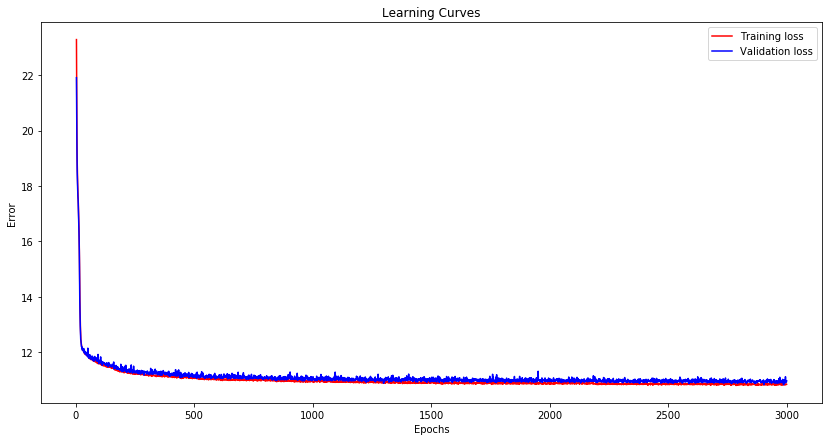

In [29]:
vae_Name='VAE_FC_h1_z30'
vae=vae_FC_h1_z30
train_data=VAE_train(vae, vae_Name)

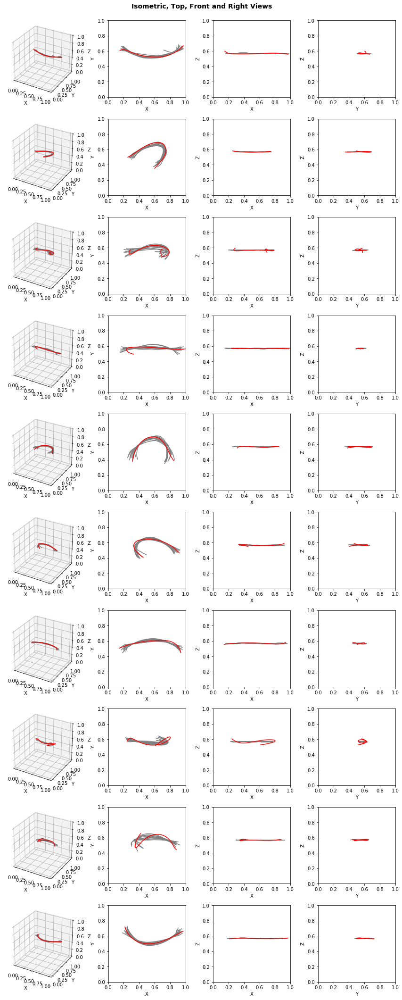

In [30]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=1, Z=60

Model: "model_53"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_27 (Flatten)            (None, 300)          0           input_27[0][0]                   
__________________________________________________________________________________________________
dense_151 (Dense)               (None, 100)          30100       flatten_27[0][0]                 
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 60)           6060        dense_151[0][0]                  
___________________________________________________________________________________________

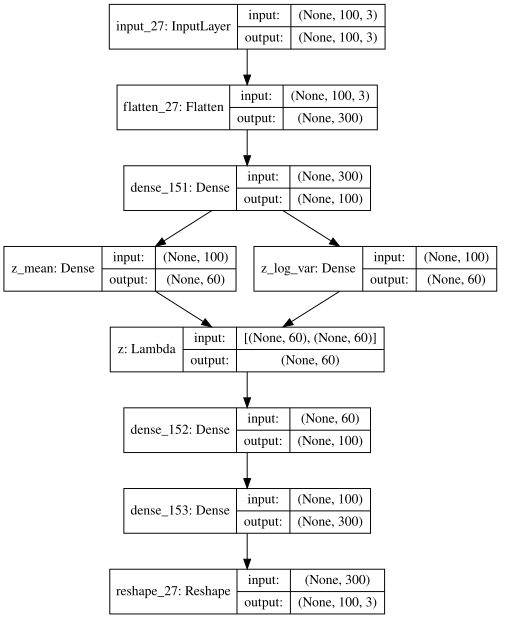

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 21us/step - loss: 93.4198 - reconstruction_loss: 87.6705 - kl_loss: 5.5916 - val_loss: 57.4137 - val_reconstruction_loss: 50.5629 - val_kl_loss: 6.6881

Epoch 00001: val_loss improved from inf to 57.41373, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 11us/step - loss: 47.4418 - reconstruction_loss: 40.2011 - kl_loss: 7.1863 - val_loss: 38.4871 - val_reconstruction_loss: 30.8874 - val_kl_loss: 7.4900

Epoch 00002: val_loss improved from 57.41373 to 38.48711, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 11us/step - loss: 35.0320 - reconstruction_loss: 27.7010 - kl_loss: 7.3097 - val_loss: 31.9944 - val_reconstruction_loss: 24.2707 - val_kl_loss: 7.6434

Epoch 00003: val_loss improved from 38.48711 to 31.99444, saving model to models_VAE/VAE_FC_h1_z60.h


Epoch 00026: val_loss did not improve from 12.57106
Epoch 27/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.5089 - reconstruction_loss: 8.8008 - kl_loss: 3.7048 - val_loss: 12.4817 - val_reconstruction_loss: 8.7192 - val_kl_loss: 3.7268

Epoch 00027: val_loss improved from 12.57106 to 12.48169, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 11us/step - loss: 12.4258 - reconstruction_loss: 8.6999 - kl_loss: 3.7219 - val_loss: 12.5041 - val_reconstruction_loss: 8.7584 - val_kl_loss: 3.7120

Epoch 00028: val_loss did not improve from 12.48169
Epoch 29/3000
16067/16067 [==============================] - 0s 10us/step - loss: 12.3369 - reconstruction_loss: 8.6073 - kl_loss: 3.7260 - val_loss: 12.4227 - val_reconstruction_loss: 8.7069 - val_kl_loss: 3.6846

Epoch 00029: val_loss improved from 12.48169 to 12.42273, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 30/3000
16067/16067 [===============


Epoch 00054: val_loss improved from 11.79880 to 11.77592, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 55/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.7442 - reconstruction_loss: 7.8011 - kl_loss: 3.9389 - val_loss: 11.7313 - val_reconstruction_loss: 7.7975 - val_kl_loss: 3.9041

Epoch 00055: val_loss improved from 11.77592 to 11.73135, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.7456 - reconstruction_loss: 7.8332 - kl_loss: 3.9095 - val_loss: 11.9286 - val_reconstruction_loss: 8.0032 - val_kl_loss: 3.8932

Epoch 00056: val_loss did not improve from 11.73135
Epoch 57/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.7256 - reconstruction_loss: 7.7807 - kl_loss: 3.9414 - val_loss: 11.7483 - val_reconstruction_loss: 7.7828 - val_kl_loss: 3.9385

Epoch 00057: val_loss did not improve from 11.73135
Epoch 58/3000
16067/16067 [===============

16067/16067 [==============================] - 0s 11us/step - loss: 11.6188 - reconstruction_loss: 7.6382 - kl_loss: 3.9766 - val_loss: 11.6439 - val_reconstruction_loss: 7.6345 - val_kl_loss: 3.9813

Epoch 00084: val_loss did not improve from 11.59232
Epoch 85/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.5998 - reconstruction_loss: 7.6145 - kl_loss: 3.9824 - val_loss: 11.6925 - val_reconstruction_loss: 7.6503 - val_kl_loss: 4.0119

Epoch 00085: val_loss did not improve from 11.59232
Epoch 86/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6057 - reconstruction_loss: 7.6362 - kl_loss: 3.9656 - val_loss: 11.6544 - val_reconstruction_loss: 7.5680 - val_kl_loss: 4.0608

Epoch 00086: val_loss did not improve from 11.59232
Epoch 87/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.6076 - reconstruction_loss: 7.6214 - kl_loss: 3.9834 - val_loss: 11.6344 - val_reconstruction_loss: 7.6893 - val_kl_loss: 3.9162


Epoch 00113: val_loss did not improve from 11.48389
Epoch 114/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4948 - reconstruction_loss: 7.5585 - kl_loss: 3.9318 - val_loss: 11.4881 - val_reconstruction_loss: 7.5531 - val_kl_loss: 3.9051

Epoch 00114: val_loss did not improve from 11.48389
Epoch 115/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.5013 - reconstruction_loss: 7.5572 - kl_loss: 3.9402 - val_loss: 11.5846 - val_reconstruction_loss: 7.5537 - val_kl_loss: 4.0025

Epoch 00115: val_loss did not improve from 11.48389
Epoch 116/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4717 - reconstruction_loss: 7.5503 - kl_loss: 3.9168 - val_loss: 11.6114 - val_reconstruction_loss: 7.6793 - val_kl_loss: 3.9021

Epoch 00116: val_loss did not improve from 11.48389
Epoch 117/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.5046 - reconstruction_loss: 7.5472 - kl_loss: 3.9538 - va


Epoch 00143: val_loss did not improve from 11.46387
Epoch 144/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4269 - reconstruction_loss: 7.5039 - kl_loss: 3.9193 - val_loss: 11.5091 - val_reconstruction_loss: 7.3052 - val_kl_loss: 4.1767

Epoch 00144: val_loss did not improve from 11.46387
Epoch 145/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4274 - reconstruction_loss: 7.5042 - kl_loss: 3.9201 - val_loss: 11.4796 - val_reconstruction_loss: 7.4359 - val_kl_loss: 4.0184

Epoch 00145: val_loss did not improve from 11.46387
Epoch 146/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3996 - reconstruction_loss: 7.4898 - kl_loss: 3.9067 - val_loss: 11.4340 - val_reconstruction_loss: 7.5104 - val_kl_loss: 3.8973

Epoch 00146: val_loss improved from 11.46387 to 11.43400, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 147/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4368 


Epoch 00173: val_loss did not improve from 11.40521
Epoch 174/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3863 - reconstruction_loss: 7.4727 - kl_loss: 3.9090 - val_loss: 11.4169 - val_reconstruction_loss: 7.5370 - val_kl_loss: 3.8529

Epoch 00174: val_loss did not improve from 11.40521
Epoch 175/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3801 - reconstruction_loss: 7.4832 - kl_loss: 3.8929 - val_loss: 11.4224 - val_reconstruction_loss: 7.3588 - val_kl_loss: 4.0358

Epoch 00175: val_loss did not improve from 11.40521
Epoch 176/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.4270 - reconstruction_loss: 7.5344 - kl_loss: 3.8903 - val_loss: 11.4702 - val_reconstruction_loss: 7.6200 - val_kl_loss: 3.8222

Epoch 00176: val_loss did not improve from 11.40521
Epoch 177/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3965 - reconstruction_loss: 7.5230 - kl_loss: 3.8703 - va


Epoch 00203: val_loss did not improve from 11.35863
Epoch 204/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3523 - reconstruction_loss: 7.4826 - kl_loss: 3.8661 - val_loss: 11.4482 - val_reconstruction_loss: 7.4905 - val_kl_loss: 3.9293

Epoch 00204: val_loss did not improve from 11.35863
Epoch 205/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3422 - reconstruction_loss: 7.4778 - kl_loss: 3.8610 - val_loss: 11.4301 - val_reconstruction_loss: 7.5227 - val_kl_loss: 3.8787

Epoch 00205: val_loss did not improve from 11.35863
Epoch 206/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.3352 - reconstruction_loss: 7.4670 - kl_loss: 3.8650 - val_loss: 11.3618 - val_reconstruction_loss: 7.4262 - val_kl_loss: 3.9071

Epoch 00206: val_loss did not improve from 11.35863
Epoch 207/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3659 - reconstruction_loss: 7.4790 - kl_loss: 3.8836 - va


Epoch 00264: val_loss did not improve from 11.35863
Epoch 265/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3290 - reconstruction_loss: 7.4447 - kl_loss: 3.8810 - val_loss: 11.3927 - val_reconstruction_loss: 7.5409 - val_kl_loss: 3.8224

Epoch 00265: val_loss did not improve from 11.35863
Epoch 266/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3189 - reconstruction_loss: 7.4338 - kl_loss: 3.8810 - val_loss: 11.3890 - val_reconstruction_loss: 7.4213 - val_kl_loss: 3.9411

Epoch 00266: val_loss did not improve from 11.35863
Epoch 267/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3327 - reconstruction_loss: 7.4593 - kl_loss: 3.8713 - val_loss: 11.4684 - val_reconstruction_loss: 7.6136 - val_kl_loss: 3.8258

Epoch 00267: val_loss did not improve from 11.35863
Epoch 268/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3371 - reconstruction_loss: 7.4484 - kl_loss: 3.8848 - va


Epoch 00294: val_loss did not improve from 11.31914
Epoch 295/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2956 - reconstruction_loss: 7.4102 - kl_loss: 3.8829 - val_loss: 11.3855 - val_reconstruction_loss: 7.5512 - val_kl_loss: 3.8047

Epoch 00295: val_loss did not improve from 11.31914
Epoch 296/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3420 - reconstruction_loss: 7.4506 - kl_loss: 3.8867 - val_loss: 11.3796 - val_reconstruction_loss: 7.4846 - val_kl_loss: 3.8667

Epoch 00296: val_loss did not improve from 11.31914
Epoch 297/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3107 - reconstruction_loss: 7.4182 - kl_loss: 3.8879 - val_loss: 11.3073 - val_reconstruction_loss: 7.3139 - val_kl_loss: 3.9668

Epoch 00297: val_loss improved from 11.31914 to 11.30726, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 298/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.3128 

16067/16067 [==============================] - 0s 11us/step - loss: 11.3050 - reconstruction_loss: 7.4046 - kl_loss: 3.8961 - val_loss: 11.3509 - val_reconstruction_loss: 7.3483 - val_kl_loss: 3.9747

Epoch 00355: val_loss did not improve from 11.30411
Epoch 356/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2710 - reconstruction_loss: 7.3693 - kl_loss: 3.8987 - val_loss: 11.3252 - val_reconstruction_loss: 7.3925 - val_kl_loss: 3.9013

Epoch 00356: val_loss did not improve from 11.30411
Epoch 357/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2655 - reconstruction_loss: 7.3563 - kl_loss: 3.9045 - val_loss: 11.3782 - val_reconstruction_loss: 7.4268 - val_kl_loss: 3.9250

Epoch 00357: val_loss did not improve from 11.30411
Epoch 358/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2782 - reconstruction_loss: 7.3873 - kl_loss: 3.8898 - val_loss: 11.3663 - val_reconstruction_loss: 7.4688 - val_kl_loss: 3.8


Epoch 00385: val_loss did not improve from 11.30411
Epoch 386/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.3001 - reconstruction_loss: 7.3840 - kl_loss: 3.9123 - val_loss: 11.3584 - val_reconstruction_loss: 7.3648 - val_kl_loss: 3.9631

Epoch 00386: val_loss did not improve from 11.30411
Epoch 387/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2720 - reconstruction_loss: 7.3644 - kl_loss: 3.9034 - val_loss: 11.3022 - val_reconstruction_loss: 7.5873 - val_kl_loss: 3.6887

Epoch 00387: val_loss improved from 11.30411 to 11.30221, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 388/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2483 - reconstruction_loss: 7.3561 - kl_loss: 3.8902 - val_loss: 11.3332 - val_reconstruction_loss: 7.4285 - val_kl_loss: 3.8780

Epoch 00388: val_loss did not improve from 11.30221
Epoch 389/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2918 


Epoch 00415: val_loss did not improve from 11.24839
Epoch 416/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2607 - reconstruction_loss: 7.3650 - kl_loss: 3.8925 - val_loss: 11.3982 - val_reconstruction_loss: 7.5220 - val_kl_loss: 3.8505

Epoch 00416: val_loss did not improve from 11.24839
Epoch 417/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2849 - reconstruction_loss: 7.3626 - kl_loss: 3.9191 - val_loss: 11.4362 - val_reconstruction_loss: 7.7061 - val_kl_loss: 3.7039

Epoch 00417: val_loss did not improve from 11.24839
Epoch 418/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2373 - reconstruction_loss: 7.3419 - kl_loss: 3.8910 - val_loss: 11.3053 - val_reconstruction_loss: 7.5083 - val_kl_loss: 3.7694

Epoch 00418: val_loss did not improve from 11.24839
Epoch 419/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.2552 - reconstruction_loss: 7.3345 - kl_loss: 3.9166 - va

16067/16067 [==============================] - 0s 11us/step - loss: 11.2210 - reconstruction_loss: 7.2846 - kl_loss: 3.9321 - val_loss: 11.2442 - val_reconstruction_loss: 7.2634 - val_kl_loss: 3.9525

Epoch 00476: val_loss did not improve from 11.20145
Epoch 477/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1768 - reconstruction_loss: 7.2608 - kl_loss: 3.9128 - val_loss: 11.2956 - val_reconstruction_loss: 7.4409 - val_kl_loss: 3.8283

Epoch 00477: val_loss did not improve from 11.20145
Epoch 478/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1999 - reconstruction_loss: 7.2829 - kl_loss: 3.9134 - val_loss: 11.2627 - val_reconstruction_loss: 7.4190 - val_kl_loss: 3.8140

Epoch 00478: val_loss did not improve from 11.20145
Epoch 479/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2182 - reconstruction_loss: 7.2994 - kl_loss: 3.9160 - val_loss: 11.3354 - val_reconstruction_loss: 7.4401 - val_kl_loss: 3.8


Epoch 00506: val_loss did not improve from 11.20145
Epoch 507/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.2031 - reconstruction_loss: 7.2789 - kl_loss: 3.9195 - val_loss: 11.2735 - val_reconstruction_loss: 7.2539 - val_kl_loss: 3.9929

Epoch 00507: val_loss did not improve from 11.20145
Epoch 508/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.2000 - reconstruction_loss: 7.2985 - kl_loss: 3.8979 - val_loss: 11.3120 - val_reconstruction_loss: 7.3582 - val_kl_loss: 3.9265

Epoch 00508: val_loss did not improve from 11.20145
Epoch 509/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1990 - reconstruction_loss: 7.2832 - kl_loss: 3.9107 - val_loss: 11.2376 - val_reconstruction_loss: 7.1207 - val_kl_loss: 4.0881

Epoch 00509: val_loss did not improve from 11.20145
Epoch 510/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.1974 - reconstruction_loss: 7.2796 - kl_loss: 3.9134 - va

16067/16067 [==============================] - 0s 10us/step - loss: 11.1472 - reconstruction_loss: 7.2836 - kl_loss: 3.8599 - val_loss: 11.2229 - val_reconstruction_loss: 7.1184 - val_kl_loss: 4.0755

Epoch 00566: val_loss did not improve from 11.10594
Epoch 567/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1251 - reconstruction_loss: 7.2569 - kl_loss: 3.8655 - val_loss: 11.2988 - val_reconstruction_loss: 7.5347 - val_kl_loss: 3.7387

Epoch 00567: val_loss did not improve from 11.10594
Epoch 568/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1268 - reconstruction_loss: 7.2610 - kl_loss: 3.8622 - val_loss: 11.1561 - val_reconstruction_loss: 7.1154 - val_kl_loss: 4.0148

Epoch 00568: val_loss did not improve from 11.10594
Epoch 569/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.1054 - reconstruction_loss: 7.2592 - kl_loss: 3.8432 - val_loss: 11.1663 - val_reconstruction_loss: 7.2927 - val_kl_loss: 3.8


Epoch 00596: val_loss did not improve from 11.10594
Epoch 597/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.1088 - reconstruction_loss: 7.2677 - kl_loss: 3.8372 - val_loss: 11.1875 - val_reconstruction_loss: 7.3739 - val_kl_loss: 3.7858

Epoch 00597: val_loss did not improve from 11.10594
Epoch 598/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.1290 - reconstruction_loss: 7.2785 - kl_loss: 3.8451 - val_loss: 11.1934 - val_reconstruction_loss: 7.3620 - val_kl_loss: 3.8062

Epoch 00598: val_loss did not improve from 11.10594
Epoch 599/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0857 - reconstruction_loss: 7.2672 - kl_loss: 3.8160 - val_loss: 11.2299 - val_reconstruction_loss: 7.5225 - val_kl_loss: 3.6826

Epoch 00599: val_loss did not improve from 11.10594
Epoch 600/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0990 - reconstruction_loss: 7.2671 - kl_loss: 3.8284 - va

16067/16067 [==============================] - 0s 11us/step - loss: 11.0471 - reconstruction_loss: 7.2274 - kl_loss: 3.8163 - val_loss: 11.1706 - val_reconstruction_loss: 7.3401 - val_kl_loss: 3.8022

Epoch 00657: val_loss did not improve from 11.09335
Epoch 658/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.0455 - reconstruction_loss: 7.2332 - kl_loss: 3.8081 - val_loss: 11.1995 - val_reconstruction_loss: 7.1531 - val_kl_loss: 4.0217

Epoch 00658: val_loss did not improve from 11.09335
Epoch 659/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0489 - reconstruction_loss: 7.2283 - kl_loss: 3.8170 - val_loss: 11.1503 - val_reconstruction_loss: 7.3629 - val_kl_loss: 3.7619

Epoch 00659: val_loss did not improve from 11.09335
Epoch 660/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0910 - reconstruction_loss: 7.2784 - kl_loss: 3.8107 - val_loss: 11.2379 - val_reconstruction_loss: 7.4672 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 10us/step - loss: 11.0546 - reconstruction_loss: 7.1999 - kl_loss: 3.8504 - val_loss: 11.1250 - val_reconstruction_loss: 6.9622 - val_kl_loss: 4.1373

Epoch 00717: val_loss did not improve from 11.07672
Epoch 718/3000
16067/16067 [==============================] - 0s 10us/step - loss: 11.0609 - reconstruction_loss: 7.2282 - kl_loss: 3.8281 - val_loss: 11.1264 - val_reconstruction_loss: 7.0656 - val_kl_loss: 4.0345

Epoch 00718: val_loss did not improve from 11.07672
Epoch 719/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0650 - reconstruction_loss: 7.1985 - kl_loss: 3.8634 - val_loss: 11.1110 - val_reconstruction_loss: 7.2237 - val_kl_loss: 3.8595

Epoch 00719: val_loss did not improve from 11.07672
Epoch 720/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0483 - reconstruction_loss: 7.2124 - kl_loss: 3.8320 - val_loss: 11.0825 - val_reconstruction_loss: 7.1294 - val_kl_loss: 3.9


Epoch 00747: val_loss did not improve from 11.07672
Epoch 748/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0421 - reconstruction_loss: 7.2033 - kl_loss: 3.8351 - val_loss: 11.1713 - val_reconstruction_loss: 7.1422 - val_kl_loss: 4.0011

Epoch 00748: val_loss did not improve from 11.07672
Epoch 749/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0439 - reconstruction_loss: 7.2082 - kl_loss: 3.8322 - val_loss: 11.1692 - val_reconstruction_loss: 7.3351 - val_kl_loss: 3.8068

Epoch 00749: val_loss did not improve from 11.07672
Epoch 750/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0665 - reconstruction_loss: 7.1952 - kl_loss: 3.8675 - val_loss: 11.1492 - val_reconstruction_loss: 7.0650 - val_kl_loss: 4.0552

Epoch 00750: val_loss did not improve from 11.07672
Epoch 751/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0482 - reconstruction_loss: 7.1593 - kl_loss: 3.8862 - va


Epoch 00777: val_loss did not improve from 11.04039
Epoch 778/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0140 - reconstruction_loss: 7.1778 - kl_loss: 3.8321 - val_loss: 11.0762 - val_reconstruction_loss: 7.3562 - val_kl_loss: 3.6914

Epoch 00778: val_loss did not improve from 11.04039
Epoch 779/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0126 - reconstruction_loss: 7.1922 - kl_loss: 3.8175 - val_loss: 11.1168 - val_reconstruction_loss: 7.3036 - val_kl_loss: 3.7840

Epoch 00779: val_loss did not improve from 11.04039
Epoch 780/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0288 - reconstruction_loss: 7.1909 - kl_loss: 3.8337 - val_loss: 11.0865 - val_reconstruction_loss: 7.1246 - val_kl_loss: 3.9335

Epoch 00780: val_loss did not improve from 11.04039
Epoch 781/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0156 - reconstruction_loss: 7.1747 - kl_loss: 3.8383 - va

16067/16067 [==============================] - 0s 11us/step - loss: 10.9928 - reconstruction_loss: 7.1378 - kl_loss: 3.8526 - val_loss: 11.0781 - val_reconstruction_loss: 7.2281 - val_kl_loss: 3.8270

Epoch 00838: val_loss did not improve from 11.00603
Epoch 839/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9959 - reconstruction_loss: 7.1486 - kl_loss: 3.8442 - val_loss: 11.0828 - val_reconstruction_loss: 7.1934 - val_kl_loss: 3.8652

Epoch 00839: val_loss did not improve from 11.00603
Epoch 840/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9803 - reconstruction_loss: 7.1595 - kl_loss: 3.8174 - val_loss: 11.0672 - val_reconstruction_loss: 7.1935 - val_kl_loss: 3.8452

Epoch 00840: val_loss did not improve from 11.00603
Epoch 841/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9960 - reconstruction_loss: 7.1210 - kl_loss: 3.8727 - val_loss: 11.1534 - val_reconstruction_loss: 7.4890 - val_kl_loss: 3.6


Epoch 00868: val_loss did not improve from 11.00603
Epoch 869/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9848 - reconstruction_loss: 7.1447 - kl_loss: 3.8377 - val_loss: 11.0211 - val_reconstruction_loss: 7.1375 - val_kl_loss: 3.8555

Epoch 00869: val_loss did not improve from 11.00603
Epoch 870/3000
16067/16067 [==============================] - 0s 11us/step - loss: 11.0007 - reconstruction_loss: 7.1543 - kl_loss: 3.8428 - val_loss: 11.0776 - val_reconstruction_loss: 7.0593 - val_kl_loss: 3.9918

Epoch 00870: val_loss did not improve from 11.00603
Epoch 871/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9685 - reconstruction_loss: 7.1188 - kl_loss: 3.8470 - val_loss: 11.0757 - val_reconstruction_loss: 7.1936 - val_kl_loss: 3.8552

Epoch 00871: val_loss did not improve from 11.00603
Epoch 872/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9850 - reconstruction_loss: 7.1560 - kl_loss: 3.8253 - va

16067/16067 [==============================] - 0s 11us/step - loss: 10.9231 - reconstruction_loss: 7.1134 - kl_loss: 3.8065 - val_loss: 11.0646 - val_reconstruction_loss: 7.1392 - val_kl_loss: 3.8998

Epoch 00929: val_loss did not improve from 10.99544
Epoch 930/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9817 - reconstruction_loss: 7.1210 - kl_loss: 3.8580 - val_loss: 11.0871 - val_reconstruction_loss: 7.4122 - val_kl_loss: 3.6489

Epoch 00930: val_loss did not improve from 10.99544
Epoch 931/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9622 - reconstruction_loss: 7.1494 - kl_loss: 3.8102 - val_loss: 11.0780 - val_reconstruction_loss: 7.2742 - val_kl_loss: 3.7782

Epoch 00931: val_loss did not improve from 10.99544
Epoch 932/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9869 - reconstruction_loss: 7.1398 - kl_loss: 3.8440 - val_loss: 11.0088 - val_reconstruction_loss: 7.1591 - val_kl_loss: 3.8


Epoch 00989: val_loss did not improve from 10.98181
Epoch 990/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9887 - reconstruction_loss: 7.1310 - kl_loss: 3.8539 - val_loss: 11.0393 - val_reconstruction_loss: 7.1356 - val_kl_loss: 3.8769

Epoch 00990: val_loss did not improve from 10.98181
Epoch 991/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9717 - reconstruction_loss: 7.1185 - kl_loss: 3.8504 - val_loss: 11.0781 - val_reconstruction_loss: 7.1367 - val_kl_loss: 3.9124

Epoch 00991: val_loss did not improve from 10.98181
Epoch 992/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9629 - reconstruction_loss: 7.1155 - kl_loss: 3.8440 - val_loss: 11.0826 - val_reconstruction_loss: 7.1902 - val_kl_loss: 3.8662

Epoch 00992: val_loss did not improve from 10.98181
Epoch 993/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9561 - reconstruction_loss: 7.1184 - kl_loss: 3.8354 - va


Epoch 01050: val_loss improved from 10.97388 to 10.96899, saving model to models_VAE/VAE_FC_h1_z60.hdf5
Epoch 1051/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9717 - reconstruction_loss: 7.1395 - kl_loss: 3.8280 - val_loss: 11.0857 - val_reconstruction_loss: 7.2800 - val_kl_loss: 3.7785

Epoch 01051: val_loss did not improve from 10.96899
Epoch 1052/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9373 - reconstruction_loss: 7.0936 - kl_loss: 3.8401 - val_loss: 11.0524 - val_reconstruction_loss: 7.2783 - val_kl_loss: 3.7482

Epoch 01052: val_loss did not improve from 10.96899
Epoch 1053/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9418 - reconstruction_loss: 7.1175 - kl_loss: 3.8211 - val_loss: 11.0317 - val_reconstruction_loss: 7.2245 - val_kl_loss: 3.7805

Epoch 01053: val_loss did not improve from 10.96899
Epoch 1054/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9

16067/16067 [==============================] - 0s 11us/step - loss: 10.9739 - reconstruction_loss: 7.1249 - kl_loss: 3.8453 - val_loss: 11.0923 - val_reconstruction_loss: 7.0269 - val_kl_loss: 4.0405

Epoch 01081: val_loss did not improve from 10.96462
Epoch 1082/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9664 - reconstruction_loss: 7.1269 - kl_loss: 3.8364 - val_loss: 11.0482 - val_reconstruction_loss: 7.3020 - val_kl_loss: 3.7178

Epoch 01082: val_loss did not improve from 10.96462
Epoch 1083/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9576 - reconstruction_loss: 7.1089 - kl_loss: 3.8450 - val_loss: 11.0266 - val_reconstruction_loss: 7.2573 - val_kl_loss: 3.7444

Epoch 01083: val_loss did not improve from 10.96462
Epoch 1084/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9506 - reconstruction_loss: 7.1259 - kl_loss: 3.8215 - val_loss: 11.0925 - val_reconstruction_loss: 7.2194 - val_kl_loss: 


Epoch 01111: val_loss did not improve from 10.96462
Epoch 1112/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9536 - reconstruction_loss: 7.0941 - kl_loss: 3.8566 - val_loss: 11.0137 - val_reconstruction_loss: 7.1013 - val_kl_loss: 3.8871

Epoch 01112: val_loss did not improve from 10.96462
Epoch 1113/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9423 - reconstruction_loss: 7.1058 - kl_loss: 3.8325 - val_loss: 11.0523 - val_reconstruction_loss: 7.2663 - val_kl_loss: 3.7602

Epoch 01113: val_loss did not improve from 10.96462
Epoch 1114/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9338 - reconstruction_loss: 7.0908 - kl_loss: 3.8378 - val_loss: 11.0628 - val_reconstruction_loss: 7.3074 - val_kl_loss: 3.7250

Epoch 01114: val_loss did not improve from 10.96462
Epoch 1115/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9329 - reconstruction_loss: 7.0949 - kl_loss: 3.8359 


Epoch 01172: val_loss did not improve from 10.94423
Epoch 1173/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9638 - reconstruction_loss: 7.0866 - kl_loss: 3.8744 - val_loss: 11.0123 - val_reconstruction_loss: 7.1200 - val_kl_loss: 3.8674

Epoch 01173: val_loss did not improve from 10.94423
Epoch 1174/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9267 - reconstruction_loss: 7.0929 - kl_loss: 3.8283 - val_loss: 10.9817 - val_reconstruction_loss: 7.0624 - val_kl_loss: 3.8951

Epoch 01174: val_loss did not improve from 10.94423
Epoch 1175/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9382 - reconstruction_loss: 7.0853 - kl_loss: 3.8502 - val_loss: 11.0750 - val_reconstruction_loss: 7.1461 - val_kl_loss: 3.9025

Epoch 01175: val_loss did not improve from 10.94423
Epoch 1176/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9381 - reconstruction_loss: 7.0858 - kl_loss: 3.8479 

16067/16067 [==============================] - 0s 10us/step - loss: 10.9703 - reconstruction_loss: 7.0685 - kl_loss: 3.8978 - val_loss: 11.0470 - val_reconstruction_loss: 7.0287 - val_kl_loss: 3.9938

Epoch 01233: val_loss did not improve from 10.90203
Epoch 1234/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9098 - reconstruction_loss: 7.0651 - kl_loss: 3.8415 - val_loss: 10.9894 - val_reconstruction_loss: 7.1052 - val_kl_loss: 3.8575

Epoch 01234: val_loss did not improve from 10.90203
Epoch 1235/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9158 - reconstruction_loss: 7.0697 - kl_loss: 3.8423 - val_loss: 11.0646 - val_reconstruction_loss: 7.0583 - val_kl_loss: 3.9823

Epoch 01235: val_loss did not improve from 10.90203
Epoch 1236/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9391 - reconstruction_loss: 7.0721 - kl_loss: 3.8651 - val_loss: 10.9957 - val_reconstruction_loss: 7.2431 - val_kl_loss: 


Epoch 01263: val_loss did not improve from 10.90203
Epoch 1264/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9124 - reconstruction_loss: 7.0605 - kl_loss: 3.8492 - val_loss: 11.0380 - val_reconstruction_loss: 7.2354 - val_kl_loss: 3.7754

Epoch 01264: val_loss did not improve from 10.90203
Epoch 1265/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9018 - reconstruction_loss: 7.0583 - kl_loss: 3.8402 - val_loss: 10.9709 - val_reconstruction_loss: 7.1482 - val_kl_loss: 3.7979

Epoch 01265: val_loss did not improve from 10.90203
Epoch 1266/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9278 - reconstruction_loss: 7.0782 - kl_loss: 3.8466 - val_loss: 11.0064 - val_reconstruction_loss: 7.2249 - val_kl_loss: 3.7571

Epoch 01266: val_loss did not improve from 10.90203
Epoch 1267/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9016 - reconstruction_loss: 7.0677 - kl_loss: 3.8301 


Epoch 01324: val_loss did not improve from 10.90203
Epoch 1325/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8987 - reconstruction_loss: 7.0802 - kl_loss: 3.8158 - val_loss: 10.9964 - val_reconstruction_loss: 7.1999 - val_kl_loss: 3.7659

Epoch 01325: val_loss did not improve from 10.90203
Epoch 1326/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9072 - reconstruction_loss: 7.0619 - kl_loss: 3.8433 - val_loss: 11.0066 - val_reconstruction_loss: 7.2092 - val_kl_loss: 3.7731

Epoch 01326: val_loss did not improve from 10.90203
Epoch 1327/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8966 - reconstruction_loss: 7.0701 - kl_loss: 3.8234 - val_loss: 10.9619 - val_reconstruction_loss: 7.1043 - val_kl_loss: 3.8336

Epoch 01327: val_loss did not improve from 10.90203
Epoch 1328/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9259 - reconstruction_loss: 7.0719 - kl_loss: 3.8493 


Epoch 01385: val_loss did not improve from 10.90203
Epoch 1386/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9023 - reconstruction_loss: 7.0858 - kl_loss: 3.8119 - val_loss: 10.9127 - val_reconstruction_loss: 7.1102 - val_kl_loss: 3.7744

Epoch 01386: val_loss did not improve from 10.90203
Epoch 1387/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9190 - reconstruction_loss: 7.0725 - kl_loss: 3.8431 - val_loss: 11.0028 - val_reconstruction_loss: 7.2990 - val_kl_loss: 3.6779

Epoch 01387: val_loss did not improve from 10.90203
Epoch 1388/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9364 - reconstruction_loss: 7.0647 - kl_loss: 3.8678 - val_loss: 10.9609 - val_reconstruction_loss: 7.1578 - val_kl_loss: 3.7775

Epoch 01388: val_loss did not improve from 10.90203
Epoch 1389/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9065 - reconstruction_loss: 7.0572 - kl_loss: 3.8456 


Epoch 01446: val_loss did not improve from 10.90203
Epoch 1447/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8919 - reconstruction_loss: 7.0395 - kl_loss: 3.8504 - val_loss: 11.0323 - val_reconstruction_loss: 7.3029 - val_kl_loss: 3.7021

Epoch 01447: val_loss did not improve from 10.90203
Epoch 1448/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8947 - reconstruction_loss: 7.0902 - kl_loss: 3.8028 - val_loss: 10.9824 - val_reconstruction_loss: 7.0738 - val_kl_loss: 3.8806

Epoch 01448: val_loss did not improve from 10.90203
Epoch 1449/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8909 - reconstruction_loss: 7.0380 - kl_loss: 3.8490 - val_loss: 10.9755 - val_reconstruction_loss: 7.0477 - val_kl_loss: 3.9015

Epoch 01449: val_loss did not improve from 10.90203
Epoch 1450/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9112 - reconstruction_loss: 7.0675 - kl_loss: 3.8397 


Epoch 01507: val_loss did not improve from 10.90203
Epoch 1508/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9014 - reconstruction_loss: 7.0568 - kl_loss: 3.8436 - val_loss: 11.0315 - val_reconstruction_loss: 7.2776 - val_kl_loss: 3.7305

Epoch 01508: val_loss did not improve from 10.90203
Epoch 1509/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9151 - reconstruction_loss: 7.0654 - kl_loss: 3.8468 - val_loss: 10.9655 - val_reconstruction_loss: 7.0475 - val_kl_loss: 3.8930

Epoch 01509: val_loss did not improve from 10.90203
Epoch 1510/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9049 - reconstruction_loss: 7.0755 - kl_loss: 3.8271 - val_loss: 10.9672 - val_reconstruction_loss: 7.1938 - val_kl_loss: 3.7453

Epoch 01510: val_loss did not improve from 10.90203
Epoch 1511/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9031 - reconstruction_loss: 7.0536 - kl_loss: 3.8458 


Epoch 01568: val_loss did not improve from 10.90203
Epoch 1569/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8818 - reconstruction_loss: 7.0406 - kl_loss: 3.8375 - val_loss: 10.9518 - val_reconstruction_loss: 7.1771 - val_kl_loss: 3.7501

Epoch 01569: val_loss did not improve from 10.90203
Epoch 1570/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9000 - reconstruction_loss: 7.0686 - kl_loss: 3.8271 - val_loss: 10.9489 - val_reconstruction_loss: 7.0546 - val_kl_loss: 3.8654

Epoch 01570: val_loss did not improve from 10.90203
Epoch 1571/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9165 - reconstruction_loss: 7.0659 - kl_loss: 3.8478 - val_loss: 10.9154 - val_reconstruction_loss: 7.0468 - val_kl_loss: 3.8413

Epoch 01571: val_loss did not improve from 10.90203
Epoch 1572/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8935 - reconstruction_loss: 7.0368 - kl_loss: 3.8530 


Epoch 01629: val_loss did not improve from 10.85734
Epoch 1630/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9009 - reconstruction_loss: 7.0623 - kl_loss: 3.8347 - val_loss: 11.0439 - val_reconstruction_loss: 7.1255 - val_kl_loss: 3.8952

Epoch 01630: val_loss did not improve from 10.85734
Epoch 1631/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8998 - reconstruction_loss: 7.0460 - kl_loss: 3.8517 - val_loss: 11.0396 - val_reconstruction_loss: 7.0960 - val_kl_loss: 3.9187

Epoch 01631: val_loss did not improve from 10.85734
Epoch 1632/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9272 - reconstruction_loss: 7.0832 - kl_loss: 3.8405 - val_loss: 11.0571 - val_reconstruction_loss: 7.2246 - val_kl_loss: 3.8041

Epoch 01632: val_loss did not improve from 10.85734
Epoch 1633/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8913 - reconstruction_loss: 7.0544 - kl_loss: 3.8335 


Epoch 01690: val_loss did not improve from 10.85734
Epoch 1691/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8986 - reconstruction_loss: 7.0556 - kl_loss: 3.8377 - val_loss: 10.9854 - val_reconstruction_loss: 7.1289 - val_kl_loss: 3.8303

Epoch 01691: val_loss did not improve from 10.85734
Epoch 1692/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.9033 - reconstruction_loss: 7.0657 - kl_loss: 3.8347 - val_loss: 11.0222 - val_reconstruction_loss: 7.0840 - val_kl_loss: 3.9137

Epoch 01692: val_loss did not improve from 10.85734
Epoch 1693/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8759 - reconstruction_loss: 7.0296 - kl_loss: 3.8427 - val_loss: 10.9587 - val_reconstruction_loss: 7.1680 - val_kl_loss: 3.7672

Epoch 01693: val_loss did not improve from 10.85734
Epoch 1694/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8961 - reconstruction_loss: 7.0366 - kl_loss: 3.8571 


Epoch 01751: val_loss did not improve from 10.85734
Epoch 1752/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8986 - reconstruction_loss: 7.0361 - kl_loss: 3.8593 - val_loss: 10.9520 - val_reconstruction_loss: 7.2582 - val_kl_loss: 3.6661

Epoch 01752: val_loss did not improve from 10.85734
Epoch 1753/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8839 - reconstruction_loss: 7.0581 - kl_loss: 3.8230 - val_loss: 11.0033 - val_reconstruction_loss: 7.0216 - val_kl_loss: 3.9559

Epoch 01753: val_loss did not improve from 10.85734
Epoch 1754/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8700 - reconstruction_loss: 7.0248 - kl_loss: 3.8409 - val_loss: 11.0406 - val_reconstruction_loss: 7.2732 - val_kl_loss: 3.7389

Epoch 01754: val_loss did not improve from 10.85734
Epoch 1755/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8927 - reconstruction_loss: 7.0460 - kl_loss: 3.8436 


Epoch 01812: val_loss did not improve from 10.85734
Epoch 1813/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8676 - reconstruction_loss: 7.0132 - kl_loss: 3.8514 - val_loss: 10.9115 - val_reconstruction_loss: 7.0792 - val_kl_loss: 3.8043

Epoch 01813: val_loss did not improve from 10.85734
Epoch 1814/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8761 - reconstruction_loss: 7.0465 - kl_loss: 3.8260 - val_loss: 10.9547 - val_reconstruction_loss: 7.0976 - val_kl_loss: 3.8336

Epoch 01814: val_loss did not improve from 10.85734
Epoch 1815/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8893 - reconstruction_loss: 7.0336 - kl_loss: 3.8527 - val_loss: 10.9972 - val_reconstruction_loss: 7.2353 - val_kl_loss: 3.7334

Epoch 01815: val_loss did not improve from 10.85734
Epoch 1816/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9105 - reconstruction_loss: 7.0513 - kl_loss: 3.8557 


Epoch 01873: val_loss did not improve from 10.85734
Epoch 1874/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8830 - reconstruction_loss: 7.0267 - kl_loss: 3.8528 - val_loss: 10.9520 - val_reconstruction_loss: 7.1978 - val_kl_loss: 3.7280

Epoch 01874: val_loss did not improve from 10.85734
Epoch 1875/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8886 - reconstruction_loss: 7.0592 - kl_loss: 3.8278 - val_loss: 10.9539 - val_reconstruction_loss: 7.0899 - val_kl_loss: 3.8361

Epoch 01875: val_loss did not improve from 10.85734
Epoch 1876/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8822 - reconstruction_loss: 7.0320 - kl_loss: 3.8475 - val_loss: 10.9155 - val_reconstruction_loss: 7.1943 - val_kl_loss: 3.6966

Epoch 01876: val_loss did not improve from 10.85734
Epoch 1877/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8973 - reconstruction_loss: 7.0622 - kl_loss: 3.8313 


Epoch 01934: val_loss did not improve from 10.85734
Epoch 1935/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8789 - reconstruction_loss: 7.0360 - kl_loss: 3.8394 - val_loss: 10.9784 - val_reconstruction_loss: 7.2247 - val_kl_loss: 3.7305

Epoch 01935: val_loss did not improve from 10.85734
Epoch 1936/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8716 - reconstruction_loss: 7.0497 - kl_loss: 3.8196 - val_loss: 10.9464 - val_reconstruction_loss: 6.9389 - val_kl_loss: 3.9817

Epoch 01936: val_loss did not improve from 10.85734
Epoch 1937/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8697 - reconstruction_loss: 7.0144 - kl_loss: 3.8521 - val_loss: 11.0030 - val_reconstruction_loss: 7.1442 - val_kl_loss: 3.8321

Epoch 01937: val_loss did not improve from 10.85734
Epoch 1938/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8756 - reconstruction_loss: 7.0268 - kl_loss: 3.8469 


Epoch 01995: val_loss did not improve from 10.85734
Epoch 1996/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8906 - reconstruction_loss: 7.0379 - kl_loss: 3.8483 - val_loss: 10.9887 - val_reconstruction_loss: 7.0950 - val_kl_loss: 3.8677

Epoch 01996: val_loss did not improve from 10.85734
Epoch 1997/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8941 - reconstruction_loss: 7.0540 - kl_loss: 3.8360 - val_loss: 10.9392 - val_reconstruction_loss: 6.9683 - val_kl_loss: 3.9484

Epoch 01997: val_loss did not improve from 10.85734
Epoch 1998/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8719 - reconstruction_loss: 7.0341 - kl_loss: 3.8357 - val_loss: 10.9846 - val_reconstruction_loss: 7.0984 - val_kl_loss: 3.8592

Epoch 01998: val_loss did not improve from 10.85734
Epoch 1999/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9132 - reconstruction_loss: 7.0309 - kl_loss: 3.8801 


Epoch 02056: val_loss did not improve from 10.85734
Epoch 2057/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8812 - reconstruction_loss: 7.0464 - kl_loss: 3.8320 - val_loss: 11.0575 - val_reconstruction_loss: 7.2898 - val_kl_loss: 3.7413

Epoch 02057: val_loss did not improve from 10.85734
Epoch 2058/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.9062 - reconstruction_loss: 7.0560 - kl_loss: 3.8467 - val_loss: 10.9442 - val_reconstruction_loss: 7.2213 - val_kl_loss: 3.6961

Epoch 02058: val_loss did not improve from 10.85734
Epoch 2059/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8742 - reconstruction_loss: 7.0191 - kl_loss: 3.8518 - val_loss: 10.9666 - val_reconstruction_loss: 6.9337 - val_kl_loss: 4.0075

Epoch 02059: val_loss did not improve from 10.85734
Epoch 2060/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8780 - reconstruction_loss: 7.0234 - kl_loss: 3.8520 


Epoch 02117: val_loss did not improve from 10.85734
Epoch 2118/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8572 - reconstruction_loss: 7.0269 - kl_loss: 3.8272 - val_loss: 10.9699 - val_reconstruction_loss: 7.0578 - val_kl_loss: 3.8851

Epoch 02118: val_loss did not improve from 10.85734
Epoch 2119/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8894 - reconstruction_loss: 7.0553 - kl_loss: 3.8305 - val_loss: 11.0027 - val_reconstruction_loss: 7.1753 - val_kl_loss: 3.8019

Epoch 02119: val_loss did not improve from 10.85734
Epoch 2120/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8960 - reconstruction_loss: 7.0451 - kl_loss: 3.8479 - val_loss: 10.9522 - val_reconstruction_loss: 7.1749 - val_kl_loss: 3.7511

Epoch 02120: val_loss did not improve from 10.85734
Epoch 2121/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8774 - reconstruction_loss: 7.0271 - kl_loss: 3.8466 


Epoch 02178: val_loss did not improve from 10.85734
Epoch 2179/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8541 - reconstruction_loss: 7.0200 - kl_loss: 3.8313 - val_loss: 10.8843 - val_reconstruction_loss: 7.0839 - val_kl_loss: 3.7703

Epoch 02179: val_loss did not improve from 10.85734
Epoch 2180/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8850 - reconstruction_loss: 7.0219 - kl_loss: 3.8602 - val_loss: 10.9238 - val_reconstruction_loss: 7.0314 - val_kl_loss: 3.8644

Epoch 02180: val_loss did not improve from 10.85734
Epoch 2181/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8627 - reconstruction_loss: 7.0214 - kl_loss: 3.8380 - val_loss: 10.9710 - val_reconstruction_loss: 7.0333 - val_kl_loss: 3.9105

Epoch 02181: val_loss did not improve from 10.85734
Epoch 2182/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8692 - reconstruction_loss: 7.0327 - kl_loss: 3.8323 


Epoch 02239: val_loss did not improve from 10.85734
Epoch 2240/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8907 - reconstruction_loss: 7.0426 - kl_loss: 3.8430 - val_loss: 10.9479 - val_reconstruction_loss: 7.0333 - val_kl_loss: 3.8908

Epoch 02240: val_loss did not improve from 10.85734
Epoch 2241/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8766 - reconstruction_loss: 7.0348 - kl_loss: 3.8388 - val_loss: 10.9314 - val_reconstruction_loss: 7.1135 - val_kl_loss: 3.7928

Epoch 02241: val_loss did not improve from 10.85734
Epoch 2242/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8623 - reconstruction_loss: 7.0361 - kl_loss: 3.8230 - val_loss: 10.9664 - val_reconstruction_loss: 7.2038 - val_kl_loss: 3.7361

Epoch 02242: val_loss did not improve from 10.85734
Epoch 2243/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8800 - reconstruction_loss: 7.0070 - kl_loss: 3.8697 


Epoch 02300: val_loss did not improve from 10.85734
Epoch 2301/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8843 - reconstruction_loss: 7.0117 - kl_loss: 3.8679 - val_loss: 10.9101 - val_reconstruction_loss: 6.9521 - val_kl_loss: 3.9318

Epoch 02301: val_loss did not improve from 10.85734
Epoch 2302/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8760 - reconstruction_loss: 7.0280 - kl_loss: 3.8438 - val_loss: 10.9627 - val_reconstruction_loss: 7.0377 - val_kl_loss: 3.8967

Epoch 02302: val_loss did not improve from 10.85734
Epoch 2303/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8538 - reconstruction_loss: 7.0247 - kl_loss: 3.8253 - val_loss: 10.9237 - val_reconstruction_loss: 7.0938 - val_kl_loss: 3.8033

Epoch 02303: val_loss did not improve from 10.85734
Epoch 2304/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8677 - reconstruction_loss: 7.0177 - kl_loss: 3.8461 


Epoch 02361: val_loss did not improve from 10.85734
Epoch 2362/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8644 - reconstruction_loss: 7.0325 - kl_loss: 3.8296 - val_loss: 11.0094 - val_reconstruction_loss: 7.2555 - val_kl_loss: 3.7295

Epoch 02362: val_loss did not improve from 10.85734
Epoch 2363/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8672 - reconstruction_loss: 7.0651 - kl_loss: 3.7980 - val_loss: 10.9304 - val_reconstruction_loss: 6.9907 - val_kl_loss: 3.9124

Epoch 02363: val_loss did not improve from 10.85734
Epoch 2364/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8640 - reconstruction_loss: 7.0304 - kl_loss: 3.8299 - val_loss: 10.9785 - val_reconstruction_loss: 7.1407 - val_kl_loss: 3.8119

Epoch 02364: val_loss did not improve from 10.85734
Epoch 2365/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8720 - reconstruction_loss: 7.0321 - kl_loss: 3.8363 


Epoch 02422: val_loss did not improve from 10.85734
Epoch 2423/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8417 - reconstruction_loss: 7.0074 - kl_loss: 3.8312 - val_loss: 10.9231 - val_reconstruction_loss: 7.1439 - val_kl_loss: 3.7504

Epoch 02423: val_loss did not improve from 10.85734
Epoch 2424/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8670 - reconstruction_loss: 7.0079 - kl_loss: 3.8553 - val_loss: 10.9317 - val_reconstruction_loss: 7.1117 - val_kl_loss: 3.7939

Epoch 02424: val_loss did not improve from 10.85734
Epoch 2425/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8659 - reconstruction_loss: 7.0065 - kl_loss: 3.8569 - val_loss: 11.0108 - val_reconstruction_loss: 7.2428 - val_kl_loss: 3.7395

Epoch 02425: val_loss did not improve from 10.85734
Epoch 2426/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8674 - reconstruction_loss: 7.0119 - kl_loss: 3.8532 


Epoch 02483: val_loss did not improve from 10.85734
Epoch 2484/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8419 - reconstruction_loss: 7.0282 - kl_loss: 3.8107 - val_loss: 10.9646 - val_reconstruction_loss: 7.0568 - val_kl_loss: 3.8817

Epoch 02484: val_loss did not improve from 10.85734
Epoch 2485/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8721 - reconstruction_loss: 7.0090 - kl_loss: 3.8600 - val_loss: 10.9223 - val_reconstruction_loss: 7.0913 - val_kl_loss: 3.8060

Epoch 02485: val_loss did not improve from 10.85734
Epoch 2486/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8905 - reconstruction_loss: 7.0285 - kl_loss: 3.8581 - val_loss: 10.9876 - val_reconstruction_loss: 7.0511 - val_kl_loss: 3.9081

Epoch 02486: val_loss did not improve from 10.85734
Epoch 2487/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8406 - reconstruction_loss: 7.0134 - kl_loss: 3.8236 


Epoch 02544: val_loss did not improve from 10.85734
Epoch 2545/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8469 - reconstruction_loss: 7.0071 - kl_loss: 3.8359 - val_loss: 10.9390 - val_reconstruction_loss: 7.0400 - val_kl_loss: 3.8748

Epoch 02545: val_loss did not improve from 10.85734
Epoch 2546/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8378 - reconstruction_loss: 7.0162 - kl_loss: 3.8186 - val_loss: 10.9644 - val_reconstruction_loss: 7.2091 - val_kl_loss: 3.7284

Epoch 02546: val_loss did not improve from 10.85734
Epoch 2547/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8618 - reconstruction_loss: 7.0281 - kl_loss: 3.8307 - val_loss: 10.9773 - val_reconstruction_loss: 7.1240 - val_kl_loss: 3.8263

Epoch 02547: val_loss did not improve from 10.85734
Epoch 2548/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8559 - reconstruction_loss: 6.9993 - kl_loss: 3.8525 


Epoch 02605: val_loss did not improve from 10.85734
Epoch 2606/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8824 - reconstruction_loss: 7.0421 - kl_loss: 3.8383 - val_loss: 10.9611 - val_reconstruction_loss: 7.0652 - val_kl_loss: 3.8708

Epoch 02606: val_loss did not improve from 10.85734
Epoch 2607/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8546 - reconstruction_loss: 7.0093 - kl_loss: 3.8423 - val_loss: 10.9545 - val_reconstruction_loss: 7.1895 - val_kl_loss: 3.7374

Epoch 02607: val_loss did not improve from 10.85734
Epoch 2608/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8522 - reconstruction_loss: 7.0144 - kl_loss: 3.8344 - val_loss: 10.9807 - val_reconstruction_loss: 7.1141 - val_kl_loss: 3.8395

Epoch 02608: val_loss did not improve from 10.85734
Epoch 2609/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8399 - reconstruction_loss: 7.0088 - kl_loss: 3.8286 


Epoch 02666: val_loss did not improve from 10.85734
Epoch 2667/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8512 - reconstruction_loss: 6.9963 - kl_loss: 3.8512 - val_loss: 10.9623 - val_reconstruction_loss: 7.1251 - val_kl_loss: 3.8108

Epoch 02667: val_loss did not improve from 10.85734
Epoch 2668/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8471 - reconstruction_loss: 7.0160 - kl_loss: 3.8280 - val_loss: 10.9731 - val_reconstruction_loss: 7.0745 - val_kl_loss: 3.8692

Epoch 02668: val_loss did not improve from 10.85734
Epoch 2669/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8504 - reconstruction_loss: 7.0242 - kl_loss: 3.8232 - val_loss: 10.9481 - val_reconstruction_loss: 7.0817 - val_kl_loss: 3.8396

Epoch 02669: val_loss did not improve from 10.85734
Epoch 2670/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8679 - reconstruction_loss: 7.0149 - kl_loss: 3.8502 


Epoch 02727: val_loss did not improve from 10.85734
Epoch 2728/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8679 - reconstruction_loss: 7.0340 - kl_loss: 3.8290 - val_loss: 10.9650 - val_reconstruction_loss: 6.9032 - val_kl_loss: 4.0366

Epoch 02728: val_loss did not improve from 10.85734
Epoch 2729/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8541 - reconstruction_loss: 6.9998 - kl_loss: 3.8520 - val_loss: 10.9468 - val_reconstruction_loss: 7.1266 - val_kl_loss: 3.7944

Epoch 02729: val_loss did not improve from 10.85734
Epoch 2730/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8462 - reconstruction_loss: 6.9962 - kl_loss: 3.8455 - val_loss: 10.9460 - val_reconstruction_loss: 7.0159 - val_kl_loss: 3.9011

Epoch 02730: val_loss did not improve from 10.85734
Epoch 2731/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8432 - reconstruction_loss: 7.0041 - kl_loss: 3.8364 


Epoch 02788: val_loss did not improve from 10.85734
Epoch 2789/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8154 - reconstruction_loss: 6.9831 - kl_loss: 3.8287 - val_loss: 10.9299 - val_reconstruction_loss: 6.9920 - val_kl_loss: 3.9149

Epoch 02789: val_loss did not improve from 10.85734
Epoch 2790/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8560 - reconstruction_loss: 7.0128 - kl_loss: 3.8394 - val_loss: 10.9163 - val_reconstruction_loss: 7.1045 - val_kl_loss: 3.7855

Epoch 02790: val_loss did not improve from 10.85734
Epoch 2791/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8427 - reconstruction_loss: 7.0288 - kl_loss: 3.8111 - val_loss: 10.9355 - val_reconstruction_loss: 7.1546 - val_kl_loss: 3.7571

Epoch 02791: val_loss did not improve from 10.85734
Epoch 2792/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8534 - reconstruction_loss: 7.0143 - kl_loss: 3.8366 


Epoch 02849: val_loss did not improve from 10.85734
Epoch 2850/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8579 - reconstruction_loss: 7.0002 - kl_loss: 3.8551 - val_loss: 10.9045 - val_reconstruction_loss: 7.0226 - val_kl_loss: 3.8591

Epoch 02850: val_loss did not improve from 10.85734
Epoch 2851/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8465 - reconstruction_loss: 7.0028 - kl_loss: 3.8407 - val_loss: 10.9489 - val_reconstruction_loss: 7.0816 - val_kl_loss: 3.8415

Epoch 02851: val_loss did not improve from 10.85734
Epoch 2852/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8652 - reconstruction_loss: 7.0317 - kl_loss: 3.8296 - val_loss: 10.9126 - val_reconstruction_loss: 6.9988 - val_kl_loss: 3.8880

Epoch 02852: val_loss did not improve from 10.85734
Epoch 2853/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8651 - reconstruction_loss: 7.0152 - kl_loss: 3.8468 


Epoch 02910: val_loss did not improve from 10.85734
Epoch 2911/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8311 - reconstruction_loss: 7.0145 - kl_loss: 3.8128 - val_loss: 10.9748 - val_reconstruction_loss: 7.1147 - val_kl_loss: 3.8370

Epoch 02911: val_loss did not improve from 10.85734
Epoch 2912/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8316 - reconstruction_loss: 7.0090 - kl_loss: 3.8190 - val_loss: 10.9429 - val_reconstruction_loss: 7.1008 - val_kl_loss: 3.8185

Epoch 02912: val_loss did not improve from 10.85734
Epoch 2913/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8373 - reconstruction_loss: 6.9879 - kl_loss: 3.8463 - val_loss: 10.9480 - val_reconstruction_loss: 7.0034 - val_kl_loss: 3.9217

Epoch 02913: val_loss did not improve from 10.85734
Epoch 2914/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.8445 - reconstruction_loss: 6.9952 - kl_loss: 3.8456 


Epoch 02971: val_loss did not improve from 10.85734
Epoch 2972/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8218 - reconstruction_loss: 6.9959 - kl_loss: 3.8232 - val_loss: 10.9195 - val_reconstruction_loss: 6.9429 - val_kl_loss: 3.9508

Epoch 02972: val_loss did not improve from 10.85734
Epoch 2973/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8534 - reconstruction_loss: 6.9877 - kl_loss: 3.8620 - val_loss: 10.9137 - val_reconstruction_loss: 6.9798 - val_kl_loss: 3.9087

Epoch 02973: val_loss did not improve from 10.85734
Epoch 2974/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8402 - reconstruction_loss: 7.0119 - kl_loss: 3.8254 - val_loss: 10.8992 - val_reconstruction_loss: 7.0008 - val_kl_loss: 3.8748

Epoch 02974: val_loss did not improve from 10.85734
Epoch 2975/3000
16067/16067 [==============================] - 0s 10us/step - loss: 10.8275 - reconstruction_loss: 6.9821 - kl_loss: 3.8416 

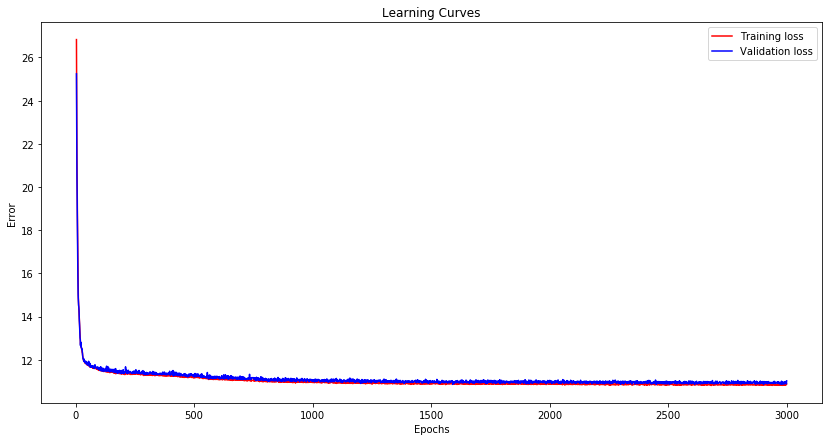

In [31]:
vae_Name='VAE_FC_h1_z60'
vae=vae_FC_h1_z60
train_data=VAE_train(vae, vae_Name)

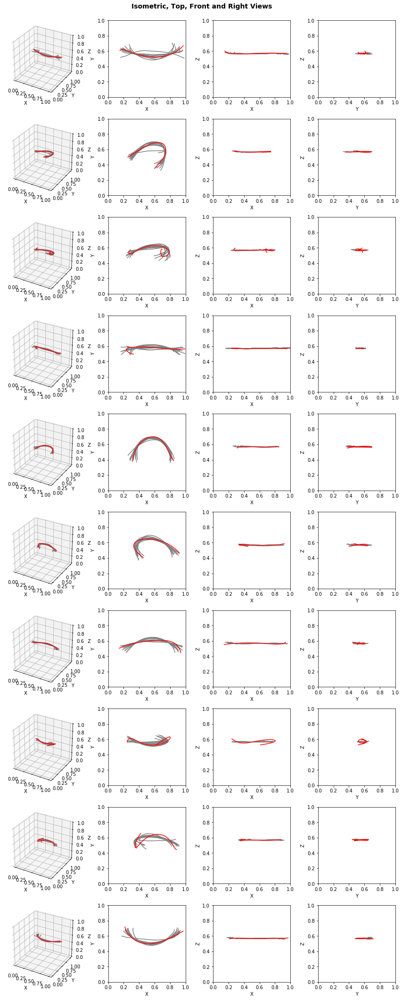

In [32]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=2, Z=15

Model: "model_55"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_28 (Flatten)            (None, 300)          0           input_28[0][0]                   
__________________________________________________________________________________________________
dense_154 (Dense)               (None, 150)          45150       flatten_28[0][0]                 
__________________________________________________________________________________________________
dense_155 (Dense)               (None, 75)           11325       dense_154[0][0]                  
___________________________________________________________________________________________

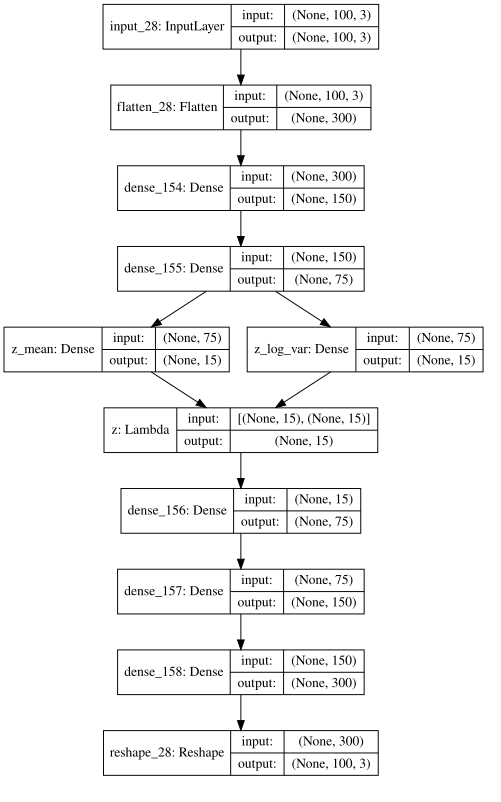

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 24us/step - loss: 69.5304 - reconstruction_loss: 67.0206 - kl_loss: 2.3800 - val_loss: 41.3460 - val_reconstruction_loss: 38.0439 - val_kl_loss: 3.1643

Epoch 00001: val_loss improved from inf to 41.34596, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 12us/step - loss: 34.1373 - reconstruction_loss: 29.9854 - kl_loss: 4.1086 - val_loss: 25.9190 - val_reconstruction_loss: 20.9875 - val_kl_loss: 4.8707

Epoch 00002: val_loss improved from 41.34596 to 25.91903, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 12us/step - loss: 23.1813 - reconstruction_loss: 19.0035 - kl_loss: 4.1640 - val_loss: 20.8268 - val_reconstruction_loss: 17.4828 - val_kl_loss: 3.2877

Epoch 00003: val_loss improved from 25.91903 to 20.82679, saving model to models_VAE/VAE_FC_h2_z15.h

Epoch 27/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.9531 - reconstruction_loss: 8.2310 - kl_loss: 3.7184 - val_loss: 12.0418 - val_reconstruction_loss: 8.2446 - val_kl_loss: 3.7641

Epoch 00027: val_loss improved from 12.05398 to 12.04184, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.8072 - reconstruction_loss: 8.0613 - kl_loss: 3.7408 - val_loss: 11.8049 - val_reconstruction_loss: 7.9862 - val_kl_loss: 3.7909

Epoch 00028: val_loss improved from 12.04184 to 11.80489, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.7265 - reconstruction_loss: 8.0134 - kl_loss: 3.7098 - val_loss: 11.8443 - val_reconstruction_loss: 8.1420 - val_kl_loss: 3.6719

Epoch 00029: val_loss did not improve from 11.80489
Epoch 30/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.6843 - rec

Epoch 55/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.0134 - reconstruction_loss: 7.1965 - kl_loss: 3.8132 - val_loss: 10.9988 - val_reconstruction_loss: 7.1126 - val_kl_loss: 3.8578

Epoch 00055: val_loss improved from 11.05270 to 10.99883, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.0020 - reconstruction_loss: 7.1884 - kl_loss: 3.8101 - val_loss: 11.1887 - val_reconstruction_loss: 7.4193 - val_kl_loss: 3.7398

Epoch 00056: val_loss did not improve from 10.99883
Epoch 57/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.9704 - reconstruction_loss: 7.1730 - kl_loss: 3.7931 - val_loss: 10.9950 - val_reconstruction_loss: 7.2201 - val_kl_loss: 3.7458

Epoch 00057: val_loss improved from 10.99883 to 10.99500, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 58/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.0136 - rec


Epoch 00084: val_loss improved from 10.91477 to 10.89114, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 85/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8257 - reconstruction_loss: 7.0237 - kl_loss: 3.7981 - val_loss: 10.8674 - val_reconstruction_loss: 7.0207 - val_kl_loss: 3.8224

Epoch 00085: val_loss improved from 10.89114 to 10.86745, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 86/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8481 - reconstruction_loss: 7.0312 - kl_loss: 3.8138 - val_loss: 10.9527 - val_reconstruction_loss: 7.0388 - val_kl_loss: 3.8867

Epoch 00086: val_loss did not improve from 10.86745
Epoch 87/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8181 - reconstruction_loss: 7.0211 - kl_loss: 3.7922 - val_loss: 10.9753 - val_reconstruction_loss: 7.1079 - val_kl_loss: 3.8410

Epoch 00087: val_loss did not improve from 10.86745
Epoch 88/3000
16067/16067 [===============

16067/16067 [==============================] - 0s 12us/step - loss: 10.7079 - reconstruction_loss: 6.8819 - kl_loss: 3.8231 - val_loss: 10.7435 - val_reconstruction_loss: 6.9395 - val_kl_loss: 3.7777

Epoch 00144: val_loss improved from 10.75279 to 10.74352, saving model to models_VAE/VAE_FC_h2_z15.hdf5
Epoch 145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6879 - reconstruction_loss: 6.8694 - kl_loss: 3.8150 - val_loss: 10.9297 - val_reconstruction_loss: 7.0361 - val_kl_loss: 3.8684

Epoch 00145: val_loss did not improve from 10.74352
Epoch 146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7232 - reconstruction_loss: 6.9192 - kl_loss: 3.8008 - val_loss: 10.7747 - val_reconstruction_loss: 6.9115 - val_kl_loss: 3.8364

Epoch 00146: val_loss did not improve from 10.74352
Epoch 147/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6791 - reconstruction_loss: 6.8500 - kl_loss: 3.8254 - val_loss: 10.8046 

16067/16067 [==============================] - 0s 12us/step - loss: 10.6065 - reconstruction_loss: 6.7883 - kl_loss: 3.8142 - val_loss: 10.7368 - val_reconstruction_loss: 6.7356 - val_kl_loss: 3.9734

Epoch 00174: val_loss did not improve from 10.69385
Epoch 175/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6703 - reconstruction_loss: 6.8378 - kl_loss: 3.8289 - val_loss: 10.7256 - val_reconstruction_loss: 6.9353 - val_kl_loss: 3.7676

Epoch 00175: val_loss did not improve from 10.69385
Epoch 176/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6481 - reconstruction_loss: 6.7925 - kl_loss: 3.8525 - val_loss: 10.7775 - val_reconstruction_loss: 7.0549 - val_kl_loss: 3.6987

Epoch 00176: val_loss did not improve from 10.69385
Epoch 177/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6403 - reconstruction_loss: 6.8177 - kl_loss: 3.8179 - val_loss: 10.7759 - val_reconstruction_loss: 6.9141 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 12us/step - loss: 10.5793 - reconstruction_loss: 6.7448 - kl_loss: 3.8311 - val_loss: 10.7008 - val_reconstruction_loss: 6.8226 - val_kl_loss: 3.8517

Epoch 00234: val_loss did not improve from 10.63627
Epoch 235/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5788 - reconstruction_loss: 6.7490 - kl_loss: 3.8258 - val_loss: 10.7005 - val_reconstruction_loss: 6.7098 - val_kl_loss: 3.9694

Epoch 00235: val_loss did not improve from 10.63627
Epoch 236/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5803 - reconstruction_loss: 6.7514 - kl_loss: 3.8238 - val_loss: 10.7543 - val_reconstruction_loss: 6.7536 - val_kl_loss: 3.9734

Epoch 00236: val_loss did not improve from 10.63627
Epoch 237/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5804 - reconstruction_loss: 6.7702 - kl_loss: 3.8074 - val_loss: 10.7134 - val_reconstruction_loss: 6.6839 - val_kl_loss: 4.0


Epoch 00294: val_loss did not improve from 10.59977
Epoch 295/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5610 - reconstruction_loss: 6.7307 - kl_loss: 3.8259 - val_loss: 10.7365 - val_reconstruction_loss: 6.9141 - val_kl_loss: 3.7961

Epoch 00295: val_loss did not improve from 10.59977
Epoch 296/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5793 - reconstruction_loss: 6.7635 - kl_loss: 3.8128 - val_loss: 10.7402 - val_reconstruction_loss: 6.8102 - val_kl_loss: 3.9046

Epoch 00296: val_loss did not improve from 10.59977
Epoch 297/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5818 - reconstruction_loss: 6.7416 - kl_loss: 3.8376 - val_loss: 10.6839 - val_reconstruction_loss: 6.8834 - val_kl_loss: 3.7749

Epoch 00297: val_loss did not improve from 10.59977
Epoch 298/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5689 - reconstruction_loss: 6.7268 - kl_loss: 3.8384 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.5520 - reconstruction_loss: 6.7249 - kl_loss: 3.8238 - val_loss: 10.8715 - val_reconstruction_loss: 6.9382 - val_kl_loss: 3.9072

Epoch 00355: val_loss did not improve from 10.58836
Epoch 356/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5101 - reconstruction_loss: 6.6851 - kl_loss: 3.8216 - val_loss: 10.6493 - val_reconstruction_loss: 6.7632 - val_kl_loss: 3.8596

Epoch 00356: val_loss did not improve from 10.58836
Epoch 357/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5152 - reconstruction_loss: 6.6975 - kl_loss: 3.8144 - val_loss: 10.6455 - val_reconstruction_loss: 6.7028 - val_kl_loss: 3.9156

Epoch 00357: val_loss did not improve from 10.58836
Epoch 358/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5191 - reconstruction_loss: 6.6977 - kl_loss: 3.8185 - val_loss: 10.7200 - val_reconstruction_loss: 6.7160 - val_kl_loss: 3.9


Epoch 00385: val_loss did not improve from 10.58836
Epoch 386/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4877 - reconstruction_loss: 6.6726 - kl_loss: 3.8127 - val_loss: 10.6871 - val_reconstruction_loss: 6.8548 - val_kl_loss: 3.8072

Epoch 00386: val_loss did not improve from 10.58836
Epoch 387/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5149 - reconstruction_loss: 6.6907 - kl_loss: 3.8219 - val_loss: 10.7291 - val_reconstruction_loss: 7.0205 - val_kl_loss: 3.6800

Epoch 00387: val_loss did not improve from 10.58836
Epoch 388/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5835 - reconstruction_loss: 6.7342 - kl_loss: 3.8473 - val_loss: 10.7862 - val_reconstruction_loss: 6.8886 - val_kl_loss: 3.8662

Epoch 00388: val_loss did not improve from 10.58836
Epoch 389/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5232 - reconstruction_loss: 6.6949 - kl_loss: 3.8244 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.4585 - reconstruction_loss: 6.6472 - kl_loss: 3.8089 - val_loss: 10.5973 - val_reconstruction_loss: 6.8330 - val_kl_loss: 3.7397

Epoch 00446: val_loss did not improve from 10.53103
Epoch 447/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4844 - reconstruction_loss: 6.6958 - kl_loss: 3.7860 - val_loss: 10.6178 - val_reconstruction_loss: 6.6981 - val_kl_loss: 3.8942

Epoch 00447: val_loss did not improve from 10.53103
Epoch 448/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5095 - reconstruction_loss: 6.7013 - kl_loss: 3.8048 - val_loss: 10.6237 - val_reconstruction_loss: 6.5800 - val_kl_loss: 4.0187

Epoch 00448: val_loss did not improve from 10.53103
Epoch 449/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5078 - reconstruction_loss: 6.6850 - kl_loss: 3.8197 - val_loss: 10.6635 - val_reconstruction_loss: 6.8699 - val_kl_loss: 3.7


Epoch 00476: val_loss did not improve from 10.53103
Epoch 477/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4804 - reconstruction_loss: 6.6414 - kl_loss: 3.8353 - val_loss: 10.5883 - val_reconstruction_loss: 6.6533 - val_kl_loss: 3.9113

Epoch 00477: val_loss did not improve from 10.53103
Epoch 478/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4442 - reconstruction_loss: 6.6326 - kl_loss: 3.8077 - val_loss: 10.5835 - val_reconstruction_loss: 6.7974 - val_kl_loss: 3.7588

Epoch 00478: val_loss did not improve from 10.53103
Epoch 479/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4850 - reconstruction_loss: 6.6781 - kl_loss: 3.8029 - val_loss: 10.6233 - val_reconstruction_loss: 6.7398 - val_kl_loss: 3.8634

Epoch 00479: val_loss did not improve from 10.53103
Epoch 480/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4838 - reconstruction_loss: 6.6196 - kl_loss: 3.8601 - va


Epoch 00537: val_loss did not improve from 10.50221
Epoch 538/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4764 - reconstruction_loss: 6.6255 - kl_loss: 3.8475 - val_loss: 10.5798 - val_reconstruction_loss: 6.7254 - val_kl_loss: 3.8299

Epoch 00538: val_loss did not improve from 10.50221
Epoch 539/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4676 - reconstruction_loss: 6.6239 - kl_loss: 3.8395 - val_loss: 10.6505 - val_reconstruction_loss: 6.6705 - val_kl_loss: 3.9547

Epoch 00539: val_loss did not improve from 10.50221
Epoch 540/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4753 - reconstruction_loss: 6.6287 - kl_loss: 3.8432 - val_loss: 10.5407 - val_reconstruction_loss: 6.5961 - val_kl_loss: 3.9220

Epoch 00540: val_loss did not improve from 10.50221
Epoch 541/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4744 - reconstruction_loss: 6.6347 - kl_loss: 3.8368 - va


Epoch 00598: val_loss did not improve from 10.50221
Epoch 599/3000
16067/16067 [==============================] - 0s 11us/step - loss: 10.4333 - reconstruction_loss: 6.5996 - kl_loss: 3.8302 - val_loss: 10.5946 - val_reconstruction_loss: 6.7519 - val_kl_loss: 3.8156

Epoch 00599: val_loss did not improve from 10.50221
Epoch 600/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4552 - reconstruction_loss: 6.6217 - kl_loss: 3.8312 - val_loss: 10.6159 - val_reconstruction_loss: 6.7738 - val_kl_loss: 3.8130

Epoch 00600: val_loss did not improve from 10.50221
Epoch 601/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4435 - reconstruction_loss: 6.6024 - kl_loss: 3.8388 - val_loss: 10.6270 - val_reconstruction_loss: 6.7244 - val_kl_loss: 3.8792

Epoch 00601: val_loss did not improve from 10.50221
Epoch 602/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4864 - reconstruction_loss: 6.6219 - kl_loss: 3.8609 - va


Epoch 00659: val_loss did not improve from 10.49761
Epoch 660/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4024 - reconstruction_loss: 6.5618 - kl_loss: 3.8361 - val_loss: 10.5627 - val_reconstruction_loss: 6.6302 - val_kl_loss: 3.9077

Epoch 00660: val_loss did not improve from 10.49761
Epoch 661/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4588 - reconstruction_loss: 6.5892 - kl_loss: 3.8667 - val_loss: 10.5932 - val_reconstruction_loss: 6.5828 - val_kl_loss: 3.9864

Epoch 00661: val_loss did not improve from 10.49761
Epoch 662/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4159 - reconstruction_loss: 6.5646 - kl_loss: 3.8476 - val_loss: 10.5821 - val_reconstruction_loss: 6.7320 - val_kl_loss: 3.8259

Epoch 00662: val_loss did not improve from 10.49761
Epoch 663/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4145 - reconstruction_loss: 6.5623 - kl_loss: 3.8488 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.4167 - reconstruction_loss: 6.5400 - kl_loss: 3.8730 - val_loss: 10.5087 - val_reconstruction_loss: 6.5957 - val_kl_loss: 3.8879

Epoch 00720: val_loss did not improve from 10.49682
Epoch 721/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4084 - reconstruction_loss: 6.5502 - kl_loss: 3.8546 - val_loss: 10.5286 - val_reconstruction_loss: 6.6447 - val_kl_loss: 3.8589

Epoch 00721: val_loss did not improve from 10.49682
Epoch 722/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3943 - reconstruction_loss: 6.5412 - kl_loss: 3.8498 - val_loss: 10.5731 - val_reconstruction_loss: 6.4641 - val_kl_loss: 4.0818

Epoch 00722: val_loss did not improve from 10.49682
Epoch 723/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4057 - reconstruction_loss: 6.5639 - kl_loss: 3.8375 - val_loss: 10.6459 - val_reconstruction_loss: 6.7233 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 12us/step - loss: 10.3865 - reconstruction_loss: 6.5221 - kl_loss: 3.8621 - val_loss: 10.5768 - val_reconstruction_loss: 6.7042 - val_kl_loss: 3.8450

Epoch 00780: val_loss did not improve from 10.48362
Epoch 781/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3765 - reconstruction_loss: 6.5149 - kl_loss: 3.8574 - val_loss: 10.5582 - val_reconstruction_loss: 6.5345 - val_kl_loss: 3.9972

Epoch 00781: val_loss did not improve from 10.48362
Epoch 782/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3961 - reconstruction_loss: 6.5334 - kl_loss: 3.8597 - val_loss: 10.6157 - val_reconstruction_loss: 6.6774 - val_kl_loss: 3.9086

Epoch 00782: val_loss did not improve from 10.48362
Epoch 783/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4088 - reconstruction_loss: 6.5109 - kl_loss: 3.8956 - val_loss: 10.5985 - val_reconstruction_loss: 6.7923 - val_kl_loss: 3.7


Epoch 00840: val_loss did not improve from 10.47745
Epoch 841/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3785 - reconstruction_loss: 6.4971 - kl_loss: 3.8779 - val_loss: 10.5621 - val_reconstruction_loss: 6.5708 - val_kl_loss: 3.9660

Epoch 00841: val_loss did not improve from 10.47745
Epoch 842/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3648 - reconstruction_loss: 6.4970 - kl_loss: 3.8650 - val_loss: 10.5519 - val_reconstruction_loss: 6.6485 - val_kl_loss: 3.8807

Epoch 00842: val_loss did not improve from 10.47745
Epoch 843/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4064 - reconstruction_loss: 6.5047 - kl_loss: 3.8985 - val_loss: 10.5181 - val_reconstruction_loss: 6.5148 - val_kl_loss: 3.9779

Epoch 00843: val_loss did not improve from 10.47745
Epoch 844/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4192 - reconstruction_loss: 6.5203 - kl_loss: 3.8942 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.3709 - reconstruction_loss: 6.4678 - kl_loss: 3.9007 - val_loss: 10.5609 - val_reconstruction_loss: 6.6524 - val_kl_loss: 3.8834

Epoch 00901: val_loss did not improve from 10.45697
Epoch 902/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3913 - reconstruction_loss: 6.4909 - kl_loss: 3.8978 - val_loss: 10.5501 - val_reconstruction_loss: 6.7118 - val_kl_loss: 3.8154

Epoch 00902: val_loss did not improve from 10.45697
Epoch 903/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4027 - reconstruction_loss: 6.5051 - kl_loss: 3.8941 - val_loss: 10.5992 - val_reconstruction_loss: 6.6421 - val_kl_loss: 3.9332

Epoch 00903: val_loss did not improve from 10.45697
Epoch 904/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3795 - reconstruction_loss: 6.4839 - kl_loss: 3.8910 - val_loss: 10.5135 - val_reconstruction_loss: 6.6446 - val_kl_loss: 3.8


Epoch 00931: val_loss did not improve from 10.45697
Epoch 932/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3740 - reconstruction_loss: 6.4544 - kl_loss: 3.9154 - val_loss: 10.5580 - val_reconstruction_loss: 6.5686 - val_kl_loss: 3.9679

Epoch 00932: val_loss did not improve from 10.45697
Epoch 933/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3768 - reconstruction_loss: 6.4928 - kl_loss: 3.8810 - val_loss: 10.5024 - val_reconstruction_loss: 6.5733 - val_kl_loss: 3.9041

Epoch 00933: val_loss did not improve from 10.45697
Epoch 934/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3661 - reconstruction_loss: 6.4747 - kl_loss: 3.8888 - val_loss: 10.4817 - val_reconstruction_loss: 6.5928 - val_kl_loss: 3.8633

Epoch 00934: val_loss did not improve from 10.45697
Epoch 935/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3734 - reconstruction_loss: 6.4892 - kl_loss: 3.8823 - va


Epoch 00992: val_loss did not improve from 10.45107
Epoch 993/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3734 - reconstruction_loss: 6.4627 - kl_loss: 3.9088 - val_loss: 10.5481 - val_reconstruction_loss: 6.6598 - val_kl_loss: 3.8604

Epoch 00993: val_loss did not improve from 10.45107
Epoch 994/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3511 - reconstruction_loss: 6.4506 - kl_loss: 3.8986 - val_loss: 10.5173 - val_reconstruction_loss: 6.5297 - val_kl_loss: 3.9647

Epoch 00994: val_loss did not improve from 10.45107
Epoch 995/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3443 - reconstruction_loss: 6.4643 - kl_loss: 3.8767 - val_loss: 10.5123 - val_reconstruction_loss: 6.5969 - val_kl_loss: 3.8897

Epoch 00995: val_loss did not improve from 10.45107
Epoch 996/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3587 - reconstruction_loss: 6.4464 - kl_loss: 3.9098 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.3706 - reconstruction_loss: 6.4627 - kl_loss: 3.9053 - val_loss: 10.5388 - val_reconstruction_loss: 6.6248 - val_kl_loss: 3.8914

Epoch 01053: val_loss did not improve from 10.44301
Epoch 1054/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3626 - reconstruction_loss: 6.4344 - kl_loss: 3.9251 - val_loss: 10.6515 - val_reconstruction_loss: 6.9694 - val_kl_loss: 3.6531

Epoch 01054: val_loss did not improve from 10.44301
Epoch 1055/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3583 - reconstruction_loss: 6.4650 - kl_loss: 3.8899 - val_loss: 10.5077 - val_reconstruction_loss: 6.5624 - val_kl_loss: 3.9201

Epoch 01055: val_loss did not improve from 10.44301
Epoch 1056/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3423 - reconstruction_loss: 6.4232 - kl_loss: 3.9167 - val_loss: 10.4941 - val_reconstruction_loss: 6.4560 - val_kl_loss: 


Epoch 01083: val_loss did not improve from 10.44301
Epoch 1084/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3775 - reconstruction_loss: 6.4602 - kl_loss: 3.9144 - val_loss: 10.5441 - val_reconstruction_loss: 6.5976 - val_kl_loss: 3.9219

Epoch 01084: val_loss did not improve from 10.44301
Epoch 1085/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3574 - reconstruction_loss: 6.4325 - kl_loss: 3.9219 - val_loss: 10.5872 - val_reconstruction_loss: 6.6430 - val_kl_loss: 3.9153

Epoch 01085: val_loss did not improve from 10.44301
Epoch 1086/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3660 - reconstruction_loss: 6.4532 - kl_loss: 3.9096 - val_loss: 10.5835 - val_reconstruction_loss: 6.6578 - val_kl_loss: 3.8985

Epoch 01086: val_loss did not improve from 10.44301
Epoch 1087/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3795 - reconstruction_loss: 6.4443 - kl_loss: 3.9326 

16067/16067 [==============================] - 0s 12us/step - loss: 10.3198 - reconstruction_loss: 6.4017 - kl_loss: 3.9159 - val_loss: 10.5476 - val_reconstruction_loss: 6.6918 - val_kl_loss: 3.8306

Epoch 01144: val_loss did not improve from 10.42851
Epoch 1145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3251 - reconstruction_loss: 6.4113 - kl_loss: 3.9106 - val_loss: 10.5082 - val_reconstruction_loss: 6.4736 - val_kl_loss: 4.0095

Epoch 01145: val_loss did not improve from 10.42851
Epoch 1146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3377 - reconstruction_loss: 6.4184 - kl_loss: 3.9174 - val_loss: 10.4828 - val_reconstruction_loss: 6.6019 - val_kl_loss: 3.8548

Epoch 01146: val_loss did not improve from 10.42851
Epoch 1147/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3372 - reconstruction_loss: 6.4143 - kl_loss: 3.9205 - val_loss: 10.5029 - val_reconstruction_loss: 6.5960 - val_kl_loss: 


Epoch 01174: val_loss did not improve from 10.42851
Epoch 1175/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3338 - reconstruction_loss: 6.3964 - kl_loss: 3.9343 - val_loss: 10.4871 - val_reconstruction_loss: 6.4872 - val_kl_loss: 3.9751

Epoch 01175: val_loss did not improve from 10.42851
Epoch 1176/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3436 - reconstruction_loss: 6.3988 - kl_loss: 3.9413 - val_loss: 10.4715 - val_reconstruction_loss: 6.5678 - val_kl_loss: 3.8793

Epoch 01176: val_loss did not improve from 10.42851
Epoch 1177/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3239 - reconstruction_loss: 6.4146 - kl_loss: 3.9066 - val_loss: 10.5601 - val_reconstruction_loss: 6.6513 - val_kl_loss: 3.8814

Epoch 01177: val_loss did not improve from 10.42851
Epoch 1178/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3489 - reconstruction_loss: 6.4100 - kl_loss: 3.9353 


Epoch 01235: val_loss did not improve from 10.42851
Epoch 1236/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3358 - reconstruction_loss: 6.4025 - kl_loss: 3.9304 - val_loss: 10.4847 - val_reconstruction_loss: 6.5560 - val_kl_loss: 3.9020

Epoch 01236: val_loss did not improve from 10.42851
Epoch 1237/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3157 - reconstruction_loss: 6.3645 - kl_loss: 3.9471 - val_loss: 10.5599 - val_reconstruction_loss: 6.5696 - val_kl_loss: 3.9619

Epoch 01237: val_loss did not improve from 10.42851
Epoch 1238/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3332 - reconstruction_loss: 6.3927 - kl_loss: 3.9382 - val_loss: 10.5177 - val_reconstruction_loss: 6.5465 - val_kl_loss: 3.9442

Epoch 01238: val_loss did not improve from 10.42851
Epoch 1239/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3538 - reconstruction_loss: 6.3834 - kl_loss: 3.9668 


Epoch 01296: val_loss did not improve from 10.42851
Epoch 1297/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2979 - reconstruction_loss: 6.3521 - kl_loss: 3.9436 - val_loss: 10.4779 - val_reconstruction_loss: 6.4481 - val_kl_loss: 4.0047

Epoch 01297: val_loss did not improve from 10.42851
Epoch 1298/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3222 - reconstruction_loss: 6.3424 - kl_loss: 3.9770 - val_loss: 10.5100 - val_reconstruction_loss: 6.5625 - val_kl_loss: 3.9188

Epoch 01298: val_loss did not improve from 10.42851
Epoch 1299/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3387 - reconstruction_loss: 6.3857 - kl_loss: 3.9502 - val_loss: 10.5320 - val_reconstruction_loss: 6.6274 - val_kl_loss: 3.8779

Epoch 01299: val_loss did not improve from 10.42851
Epoch 1300/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3148 - reconstruction_loss: 6.3629 - kl_loss: 3.9480 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2917 - reconstruction_loss: 6.3477 - kl_loss: 3.9407 - val_loss: 10.4794 - val_reconstruction_loss: 6.5984 - val_kl_loss: 3.8549

Epoch 01357: val_loss did not improve from 10.40988
Epoch 1358/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3183 - reconstruction_loss: 6.3519 - kl_loss: 3.9626 - val_loss: 10.4687 - val_reconstruction_loss: 6.4021 - val_kl_loss: 4.0416

Epoch 01358: val_loss did not improve from 10.40988
Epoch 1359/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3070 - reconstruction_loss: 6.3517 - kl_loss: 3.9517 - val_loss: 10.5178 - val_reconstruction_loss: 6.5988 - val_kl_loss: 3.8902

Epoch 01359: val_loss did not improve from 10.40988
Epoch 1360/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2878 - reconstruction_loss: 6.3336 - kl_loss: 3.9499 - val_loss: 10.5306 - val_reconstruction_loss: 6.4872 - val_kl_loss: 


Epoch 01387: val_loss did not improve from 10.40988
Epoch 1388/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3351 - reconstruction_loss: 6.3632 - kl_loss: 3.9688 - val_loss: 10.5061 - val_reconstruction_loss: 6.6054 - val_kl_loss: 3.8777

Epoch 01388: val_loss did not improve from 10.40988
Epoch 1389/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2951 - reconstruction_loss: 6.3251 - kl_loss: 3.9674 - val_loss: 10.4903 - val_reconstruction_loss: 6.5389 - val_kl_loss: 3.9242

Epoch 01389: val_loss did not improve from 10.40988
Epoch 1390/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3113 - reconstruction_loss: 6.3286 - kl_loss: 3.9797 - val_loss: 10.4246 - val_reconstruction_loss: 6.5173 - val_kl_loss: 3.8829

Epoch 01390: val_loss did not improve from 10.40988
Epoch 1391/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2886 - reconstruction_loss: 6.3323 - kl_loss: 3.9535 


Epoch 01448: val_loss did not improve from 10.40988
Epoch 1449/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3351 - reconstruction_loss: 6.3245 - kl_loss: 4.0083 - val_loss: 10.4952 - val_reconstruction_loss: 6.5099 - val_kl_loss: 3.9599

Epoch 01449: val_loss did not improve from 10.40988
Epoch 1450/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3146 - reconstruction_loss: 6.3419 - kl_loss: 3.9690 - val_loss: 10.4871 - val_reconstruction_loss: 6.4768 - val_kl_loss: 3.9833

Epoch 01450: val_loss did not improve from 10.40988
Epoch 1451/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2761 - reconstruction_loss: 6.3034 - kl_loss: 3.9690 - val_loss: 10.4542 - val_reconstruction_loss: 6.3849 - val_kl_loss: 4.0400

Epoch 01451: val_loss did not improve from 10.40988
Epoch 1452/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2935 - reconstruction_loss: 6.3268 - kl_loss: 3.9642 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2876 - reconstruction_loss: 6.2912 - kl_loss: 3.9939 - val_loss: 10.4663 - val_reconstruction_loss: 6.4774 - val_kl_loss: 3.9584

Epoch 01509: val_loss did not improve from 10.40156
Epoch 1510/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2976 - reconstruction_loss: 6.3145 - kl_loss: 3.9792 - val_loss: 10.4674 - val_reconstruction_loss: 6.4498 - val_kl_loss: 3.9948

Epoch 01510: val_loss did not improve from 10.40156
Epoch 1511/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2902 - reconstruction_loss: 6.2987 - kl_loss: 3.9876 - val_loss: 10.4398 - val_reconstruction_loss: 6.4597 - val_kl_loss: 3.9537

Epoch 01511: val_loss did not improve from 10.40156
Epoch 1512/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3051 - reconstruction_loss: 6.2698 - kl_loss: 4.0332 - val_loss: 10.5965 - val_reconstruction_loss: 6.6241 - val_kl_loss: 


Epoch 01569: val_loss did not improve from 10.35722
Epoch 1570/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2836 - reconstruction_loss: 6.2448 - kl_loss: 4.0351 - val_loss: 10.3836 - val_reconstruction_loss: 6.2000 - val_kl_loss: 4.1560

Epoch 01570: val_loss did not improve from 10.35722
Epoch 1571/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2872 - reconstruction_loss: 6.2588 - kl_loss: 4.0251 - val_loss: 10.4761 - val_reconstruction_loss: 6.4841 - val_kl_loss: 3.9664

Epoch 01571: val_loss did not improve from 10.35722
Epoch 1572/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3056 - reconstruction_loss: 6.2870 - kl_loss: 4.0164 - val_loss: 10.5131 - val_reconstruction_loss: 6.5438 - val_kl_loss: 3.9453

Epoch 01572: val_loss did not improve from 10.35722
Epoch 1573/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2781 - reconstruction_loss: 6.2729 - kl_loss: 4.0037 


Epoch 01630: val_loss did not improve from 10.35722
Epoch 1631/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2739 - reconstruction_loss: 6.2408 - kl_loss: 4.0303 - val_loss: 10.4787 - val_reconstruction_loss: 6.4474 - val_kl_loss: 4.0053

Epoch 01631: val_loss did not improve from 10.35722
Epoch 1632/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2532 - reconstruction_loss: 6.2447 - kl_loss: 4.0055 - val_loss: 10.4387 - val_reconstruction_loss: 6.3761 - val_kl_loss: 4.0351

Epoch 01632: val_loss did not improve from 10.35722
Epoch 1633/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2960 - reconstruction_loss: 6.2926 - kl_loss: 4.0005 - val_loss: 10.4185 - val_reconstruction_loss: 6.3081 - val_kl_loss: 4.0850

Epoch 01633: val_loss did not improve from 10.35722
Epoch 1634/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2617 - reconstruction_loss: 6.2447 - kl_loss: 4.0141 


Epoch 01691: val_loss did not improve from 10.35722
Epoch 1692/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2935 - reconstruction_loss: 6.2553 - kl_loss: 4.0350 - val_loss: 10.3879 - val_reconstruction_loss: 6.2690 - val_kl_loss: 4.0937

Epoch 01692: val_loss did not improve from 10.35722
Epoch 1693/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2771 - reconstruction_loss: 6.2267 - kl_loss: 4.0472 - val_loss: 10.4326 - val_reconstruction_loss: 6.3923 - val_kl_loss: 4.0156

Epoch 01693: val_loss did not improve from 10.35722
Epoch 1694/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2928 - reconstruction_loss: 6.2836 - kl_loss: 4.0053 - val_loss: 10.4670 - val_reconstruction_loss: 6.3827 - val_kl_loss: 4.0576

Epoch 01694: val_loss did not improve from 10.35722
Epoch 1695/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2426 - reconstruction_loss: 6.2189 - kl_loss: 4.0218 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2533 - reconstruction_loss: 6.2193 - kl_loss: 4.0307 - val_loss: 10.4388 - val_reconstruction_loss: 6.2691 - val_kl_loss: 4.1444

Epoch 01752: val_loss did not improve from 10.35522
Epoch 1753/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2736 - reconstruction_loss: 6.2260 - kl_loss: 4.0454 - val_loss: 10.4617 - val_reconstruction_loss: 6.2666 - val_kl_loss: 4.1709

Epoch 01753: val_loss did not improve from 10.35522
Epoch 1754/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2660 - reconstruction_loss: 6.2156 - kl_loss: 4.0484 - val_loss: 10.4205 - val_reconstruction_loss: 6.3606 - val_kl_loss: 4.0361

Epoch 01754: val_loss did not improve from 10.35522
Epoch 1755/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2262 - reconstruction_loss: 6.1914 - kl_loss: 4.0323 - val_loss: 10.3745 - val_reconstruction_loss: 6.3190 - val_kl_loss: 


Epoch 01782: val_loss did not improve from 10.35522
Epoch 1783/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2396 - reconstruction_loss: 6.2012 - kl_loss: 4.0359 - val_loss: 10.4074 - val_reconstruction_loss: 6.3611 - val_kl_loss: 4.0209

Epoch 01783: val_loss did not improve from 10.35522
Epoch 1784/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2217 - reconstruction_loss: 6.1680 - kl_loss: 4.0505 - val_loss: 10.4070 - val_reconstruction_loss: 6.3864 - val_kl_loss: 3.9945

Epoch 01784: val_loss did not improve from 10.35522
Epoch 1785/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2605 - reconstruction_loss: 6.2003 - kl_loss: 4.0574 - val_loss: 10.4111 - val_reconstruction_loss: 6.3667 - val_kl_loss: 4.0159

Epoch 01785: val_loss did not improve from 10.35522
Epoch 1786/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2676 - reconstruction_loss: 6.2230 - kl_loss: 4.0411 


Epoch 01843: val_loss did not improve from 10.35522
Epoch 1844/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2436 - reconstruction_loss: 6.1867 - kl_loss: 4.0547 - val_loss: 10.4042 - val_reconstruction_loss: 6.3928 - val_kl_loss: 3.9844

Epoch 01844: val_loss did not improve from 10.35522
Epoch 1845/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2503 - reconstruction_loss: 6.1950 - kl_loss: 4.0510 - val_loss: 10.4530 - val_reconstruction_loss: 6.3087 - val_kl_loss: 4.1216

Epoch 01845: val_loss did not improve from 10.35522
Epoch 1846/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2747 - reconstruction_loss: 6.2258 - kl_loss: 4.0460 - val_loss: 10.4652 - val_reconstruction_loss: 6.3903 - val_kl_loss: 4.0501

Epoch 01846: val_loss did not improve from 10.35522
Epoch 1847/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2470 - reconstruction_loss: 6.1877 - kl_loss: 4.0577 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2667 - reconstruction_loss: 6.2332 - kl_loss: 4.0297 - val_loss: 10.3953 - val_reconstruction_loss: 6.2609 - val_kl_loss: 4.1071

Epoch 01904: val_loss did not improve from 10.32644
Epoch 1905/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2466 - reconstruction_loss: 6.2060 - kl_loss: 4.0376 - val_loss: 10.3909 - val_reconstruction_loss: 6.4216 - val_kl_loss: 3.9468

Epoch 01905: val_loss did not improve from 10.32644
Epoch 1906/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2508 - reconstruction_loss: 6.1798 - kl_loss: 4.0671 - val_loss: 10.3466 - val_reconstruction_loss: 6.2542 - val_kl_loss: 4.0659

Epoch 01906: val_loss did not improve from 10.32644
Epoch 1907/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2576 - reconstruction_loss: 6.2044 - kl_loss: 4.0502 - val_loss: 10.4645 - val_reconstruction_loss: 6.3965 - val_kl_loss: 


Epoch 01934: val_loss did not improve from 10.32644
Epoch 1935/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2430 - reconstruction_loss: 6.2020 - kl_loss: 4.0375 - val_loss: 10.3539 - val_reconstruction_loss: 6.3090 - val_kl_loss: 4.0191

Epoch 01935: val_loss did not improve from 10.32644
Epoch 1936/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2326 - reconstruction_loss: 6.1709 - kl_loss: 4.0601 - val_loss: 10.3983 - val_reconstruction_loss: 6.3105 - val_kl_loss: 4.0655

Epoch 01936: val_loss did not improve from 10.32644
Epoch 1937/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2834 - reconstruction_loss: 6.2180 - kl_loss: 4.0617 - val_loss: 10.4227 - val_reconstruction_loss: 6.2187 - val_kl_loss: 4.1768

Epoch 01937: val_loss did not improve from 10.32644
Epoch 1938/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2411 - reconstruction_loss: 6.2063 - kl_loss: 4.0332 


Epoch 01995: val_loss did not improve from 10.32644
Epoch 1996/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2411 - reconstruction_loss: 6.1609 - kl_loss: 4.0771 - val_loss: 10.4332 - val_reconstruction_loss: 6.3430 - val_kl_loss: 4.0664

Epoch 01996: val_loss did not improve from 10.32644
Epoch 1997/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2530 - reconstruction_loss: 6.1993 - kl_loss: 4.0505 - val_loss: 10.3988 - val_reconstruction_loss: 6.3913 - val_kl_loss: 3.9844

Epoch 01997: val_loss did not improve from 10.32644
Epoch 1998/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2481 - reconstruction_loss: 6.1992 - kl_loss: 4.0463 - val_loss: 10.4437 - val_reconstruction_loss: 6.1712 - val_kl_loss: 4.2507

Epoch 01998: val_loss did not improve from 10.32644
Epoch 1999/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2452 - reconstruction_loss: 6.1725 - kl_loss: 4.0694 


Epoch 02056: val_loss did not improve from 10.32431
Epoch 2057/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2705 - reconstruction_loss: 6.2104 - kl_loss: 4.0571 - val_loss: 10.4065 - val_reconstruction_loss: 6.4201 - val_kl_loss: 3.9637

Epoch 02057: val_loss did not improve from 10.32431
Epoch 2058/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2286 - reconstruction_loss: 6.2027 - kl_loss: 4.0242 - val_loss: 10.4809 - val_reconstruction_loss: 6.3798 - val_kl_loss: 4.0743

Epoch 02058: val_loss did not improve from 10.32431
Epoch 2059/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2611 - reconstruction_loss: 6.1909 - kl_loss: 4.0675 - val_loss: 10.3751 - val_reconstruction_loss: 6.2686 - val_kl_loss: 4.0817

Epoch 02059: val_loss did not improve from 10.32431
Epoch 2060/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2442 - reconstruction_loss: 6.1973 - kl_loss: 4.0439 


Epoch 02117: val_loss did not improve from 10.32431
Epoch 2118/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2330 - reconstruction_loss: 6.1740 - kl_loss: 4.0556 - val_loss: 10.3981 - val_reconstruction_loss: 6.2606 - val_kl_loss: 4.1100

Epoch 02118: val_loss did not improve from 10.32431
Epoch 2119/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2359 - reconstruction_loss: 6.1896 - kl_loss: 4.0433 - val_loss: 10.3744 - val_reconstruction_loss: 6.4055 - val_kl_loss: 3.9390

Epoch 02119: val_loss did not improve from 10.32431
Epoch 2120/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2254 - reconstruction_loss: 6.1820 - kl_loss: 4.0409 - val_loss: 10.4246 - val_reconstruction_loss: 6.3287 - val_kl_loss: 4.0678

Epoch 02120: val_loss did not improve from 10.32431
Epoch 2121/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2328 - reconstruction_loss: 6.1553 - kl_loss: 4.0741 


Epoch 02178: val_loss did not improve from 10.32431
Epoch 2179/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2496 - reconstruction_loss: 6.1751 - kl_loss: 4.0718 - val_loss: 10.4024 - val_reconstruction_loss: 6.2388 - val_kl_loss: 4.1401

Epoch 02179: val_loss did not improve from 10.32431
Epoch 2180/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2471 - reconstruction_loss: 6.1678 - kl_loss: 4.0764 - val_loss: 10.3919 - val_reconstruction_loss: 6.1871 - val_kl_loss: 4.1810

Epoch 02180: val_loss did not improve from 10.32431
Epoch 2181/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2361 - reconstruction_loss: 6.1438 - kl_loss: 4.0896 - val_loss: 10.4434 - val_reconstruction_loss: 6.2549 - val_kl_loss: 4.1648

Epoch 02181: val_loss did not improve from 10.32431
Epoch 2182/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2501 - reconstruction_loss: 6.1999 - kl_loss: 4.0469 


Epoch 02239: val_loss did not improve from 10.32431
Epoch 2240/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2431 - reconstruction_loss: 6.1968 - kl_loss: 4.0421 - val_loss: 10.3442 - val_reconstruction_loss: 6.2424 - val_kl_loss: 4.0776

Epoch 02240: val_loss did not improve from 10.32431
Epoch 2241/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2058 - reconstruction_loss: 6.1509 - kl_loss: 4.0517 - val_loss: 10.4521 - val_reconstruction_loss: 6.4412 - val_kl_loss: 3.9845

Epoch 02241: val_loss did not improve from 10.32431
Epoch 2242/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2154 - reconstruction_loss: 6.1761 - kl_loss: 4.0375 - val_loss: 10.3535 - val_reconstruction_loss: 6.3494 - val_kl_loss: 3.9788

Epoch 02242: val_loss did not improve from 10.32431
Epoch 2243/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2155 - reconstruction_loss: 6.1799 - kl_loss: 4.0330 


Epoch 02300: val_loss did not improve from 10.32431
Epoch 2301/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2236 - reconstruction_loss: 6.1470 - kl_loss: 4.0740 - val_loss: 10.3728 - val_reconstruction_loss: 6.1484 - val_kl_loss: 4.1984

Epoch 02301: val_loss did not improve from 10.32431
Epoch 2302/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2368 - reconstruction_loss: 6.1754 - kl_loss: 4.0582 - val_loss: 10.4651 - val_reconstruction_loss: 6.3084 - val_kl_loss: 4.1322

Epoch 02302: val_loss did not improve from 10.32431
Epoch 2303/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2244 - reconstruction_loss: 6.1554 - kl_loss: 4.0649 - val_loss: 10.4548 - val_reconstruction_loss: 6.2297 - val_kl_loss: 4.2003

Epoch 02303: val_loss did not improve from 10.32431
Epoch 2304/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2087 - reconstruction_loss: 6.1557 - kl_loss: 4.0498 


Epoch 02361: val_loss did not improve from 10.32431
Epoch 2362/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2413 - reconstruction_loss: 6.1763 - kl_loss: 4.0623 - val_loss: 10.4388 - val_reconstruction_loss: 6.3497 - val_kl_loss: 4.0661

Epoch 02362: val_loss did not improve from 10.32431
Epoch 2363/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2086 - reconstruction_loss: 6.1502 - kl_loss: 4.0559 - val_loss: 10.3255 - val_reconstruction_loss: 6.3368 - val_kl_loss: 3.9638

Epoch 02363: val_loss did not improve from 10.32431
Epoch 2364/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1785 - reconstruction_loss: 6.1406 - kl_loss: 4.0343 - val_loss: 10.3936 - val_reconstruction_loss: 6.3259 - val_kl_loss: 4.0442

Epoch 02364: val_loss did not improve from 10.32431
Epoch 2365/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2181 - reconstruction_loss: 6.1587 - kl_loss: 4.0557 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2315 - reconstruction_loss: 6.1427 - kl_loss: 4.0864 - val_loss: 10.3847 - val_reconstruction_loss: 6.2347 - val_kl_loss: 4.1229

Epoch 02422: val_loss did not improve from 10.27732
Epoch 2423/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2332 - reconstruction_loss: 6.1808 - kl_loss: 4.0499 - val_loss: 10.3910 - val_reconstruction_loss: 6.3105 - val_kl_loss: 4.0562

Epoch 02423: val_loss did not improve from 10.27732
Epoch 2424/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2349 - reconstruction_loss: 6.1513 - kl_loss: 4.0813 - val_loss: 10.4080 - val_reconstruction_loss: 6.3170 - val_kl_loss: 4.0665

Epoch 02424: val_loss did not improve from 10.27732
Epoch 2425/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2022 - reconstruction_loss: 6.1382 - kl_loss: 4.0617 - val_loss: 10.3425 - val_reconstruction_loss: 6.2401 - val_kl_loss: 


Epoch 02452: val_loss did not improve from 10.27732
Epoch 2453/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1984 - reconstruction_loss: 6.1437 - kl_loss: 4.0512 - val_loss: 10.4074 - val_reconstruction_loss: 6.3690 - val_kl_loss: 4.0135

Epoch 02453: val_loss did not improve from 10.27732
Epoch 2454/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2014 - reconstruction_loss: 6.1510 - kl_loss: 4.0472 - val_loss: 10.3634 - val_reconstruction_loss: 6.1843 - val_kl_loss: 4.1541

Epoch 02454: val_loss did not improve from 10.27732
Epoch 2455/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2051 - reconstruction_loss: 6.1410 - kl_loss: 4.0612 - val_loss: 10.3623 - val_reconstruction_loss: 6.3227 - val_kl_loss: 4.0130

Epoch 02455: val_loss did not improve from 10.27732
Epoch 2456/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2102 - reconstruction_loss: 6.1539 - kl_loss: 4.0536 


Epoch 02513: val_loss did not improve from 10.27732
Epoch 2514/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2066 - reconstruction_loss: 6.1553 - kl_loss: 4.0486 - val_loss: 10.4639 - val_reconstruction_loss: 6.4073 - val_kl_loss: 4.0315

Epoch 02514: val_loss did not improve from 10.27732
Epoch 2515/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2126 - reconstruction_loss: 6.1689 - kl_loss: 4.0399 - val_loss: 10.3895 - val_reconstruction_loss: 6.2525 - val_kl_loss: 4.1117

Epoch 02515: val_loss did not improve from 10.27732
Epoch 2516/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2328 - reconstruction_loss: 6.1361 - kl_loss: 4.0928 - val_loss: 10.3934 - val_reconstruction_loss: 6.1556 - val_kl_loss: 4.2099

Epoch 02516: val_loss did not improve from 10.27732
Epoch 2517/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1689 - reconstruction_loss: 6.1083 - kl_loss: 4.0577 


Epoch 02574: val_loss did not improve from 10.27732
Epoch 2575/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2305 - reconstruction_loss: 6.1375 - kl_loss: 4.0907 - val_loss: 10.4103 - val_reconstruction_loss: 6.2354 - val_kl_loss: 4.1511

Epoch 02575: val_loss did not improve from 10.27732
Epoch 2576/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2135 - reconstruction_loss: 6.1398 - kl_loss: 4.0712 - val_loss: 10.3388 - val_reconstruction_loss: 6.2009 - val_kl_loss: 4.1125

Epoch 02576: val_loss did not improve from 10.27732
Epoch 2577/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2249 - reconstruction_loss: 6.1470 - kl_loss: 4.0755 - val_loss: 10.3902 - val_reconstruction_loss: 6.2765 - val_kl_loss: 4.0900

Epoch 02577: val_loss did not improve from 10.27732
Epoch 2578/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2155 - reconstruction_loss: 6.1305 - kl_loss: 4.0821 


Epoch 02635: val_loss did not improve from 10.27732
Epoch 2636/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2032 - reconstruction_loss: 6.1405 - kl_loss: 4.0605 - val_loss: 10.3584 - val_reconstruction_loss: 6.2494 - val_kl_loss: 4.0842

Epoch 02636: val_loss did not improve from 10.27732
Epoch 2637/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1897 - reconstruction_loss: 6.1329 - kl_loss: 4.0537 - val_loss: 10.3340 - val_reconstruction_loss: 6.1979 - val_kl_loss: 4.1091

Epoch 02637: val_loss did not improve from 10.27732
Epoch 2638/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2099 - reconstruction_loss: 6.1226 - kl_loss: 4.0844 - val_loss: 10.3780 - val_reconstruction_loss: 6.2663 - val_kl_loss: 4.0858

Epoch 02638: val_loss did not improve from 10.27732
Epoch 2639/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1959 - reconstruction_loss: 6.0923 - kl_loss: 4.1010 


Epoch 02696: val_loss did not improve from 10.27732
Epoch 2697/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2271 - reconstruction_loss: 6.1430 - kl_loss: 4.0797 - val_loss: 10.3772 - val_reconstruction_loss: 6.1435 - val_kl_loss: 4.2097

Epoch 02697: val_loss did not improve from 10.27732
Epoch 2698/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1981 - reconstruction_loss: 6.1100 - kl_loss: 4.0858 - val_loss: 10.4615 - val_reconstruction_loss: 6.2634 - val_kl_loss: 4.1750

Epoch 02698: val_loss did not improve from 10.27732
Epoch 2699/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2095 - reconstruction_loss: 6.1194 - kl_loss: 4.0868 - val_loss: 10.3592 - val_reconstruction_loss: 6.3064 - val_kl_loss: 4.0278

Epoch 02699: val_loss did not improve from 10.27732
Epoch 2700/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1973 - reconstruction_loss: 6.1481 - kl_loss: 4.0464 


Epoch 02757: val_loss did not improve from 10.27732
Epoch 2758/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2091 - reconstruction_loss: 6.1236 - kl_loss: 4.0823 - val_loss: 10.3933 - val_reconstruction_loss: 6.1843 - val_kl_loss: 4.1822

Epoch 02758: val_loss did not improve from 10.27732
Epoch 2759/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2009 - reconstruction_loss: 6.1048 - kl_loss: 4.0936 - val_loss: 10.4710 - val_reconstruction_loss: 6.2399 - val_kl_loss: 4.2046

Epoch 02759: val_loss did not improve from 10.27732
Epoch 2760/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1918 - reconstruction_loss: 6.1247 - kl_loss: 4.0643 - val_loss: 10.4164 - val_reconstruction_loss: 6.2969 - val_kl_loss: 4.0960

Epoch 02760: val_loss did not improve from 10.27732
Epoch 2761/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1985 - reconstruction_loss: 6.1347 - kl_loss: 4.0600 


Epoch 02818: val_loss did not improve from 10.27732
Epoch 2819/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1758 - reconstruction_loss: 6.1089 - kl_loss: 4.0654 - val_loss: 10.3361 - val_reconstruction_loss: 6.3097 - val_kl_loss: 4.0019

Epoch 02819: val_loss did not improve from 10.27732
Epoch 2820/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1867 - reconstruction_loss: 6.1337 - kl_loss: 4.0502 - val_loss: 10.3485 - val_reconstruction_loss: 6.1882 - val_kl_loss: 4.1336

Epoch 02820: val_loss did not improve from 10.27732
Epoch 2821/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1758 - reconstruction_loss: 6.0872 - kl_loss: 4.0853 - val_loss: 10.3916 - val_reconstruction_loss: 6.2841 - val_kl_loss: 4.0829

Epoch 02821: val_loss did not improve from 10.27732
Epoch 2822/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2070 - reconstruction_loss: 6.1436 - kl_loss: 4.0602 


Epoch 02879: val_loss did not improve from 10.27732
Epoch 2880/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1972 - reconstruction_loss: 6.1153 - kl_loss: 4.0796 - val_loss: 10.3668 - val_reconstruction_loss: 6.2438 - val_kl_loss: 4.0955

Epoch 02880: val_loss did not improve from 10.27732
Epoch 2881/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2275 - reconstruction_loss: 6.1387 - kl_loss: 4.0855 - val_loss: 10.3528 - val_reconstruction_loss: 6.1213 - val_kl_loss: 4.2071

Epoch 02881: val_loss did not improve from 10.27732
Epoch 2882/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2187 - reconstruction_loss: 6.1095 - kl_loss: 4.1052 - val_loss: 10.3788 - val_reconstruction_loss: 6.2210 - val_kl_loss: 4.1334

Epoch 02882: val_loss did not improve from 10.27732
Epoch 2883/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2223 - reconstruction_loss: 6.1453 - kl_loss: 4.0734 


Epoch 02940: val_loss did not improve from 10.27732
Epoch 2941/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2092 - reconstruction_loss: 6.1140 - kl_loss: 4.0931 - val_loss: 10.3864 - val_reconstruction_loss: 6.1822 - val_kl_loss: 4.1789

Epoch 02941: val_loss did not improve from 10.27732
Epoch 2942/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2103 - reconstruction_loss: 6.1410 - kl_loss: 4.0660 - val_loss: 10.3784 - val_reconstruction_loss: 6.2457 - val_kl_loss: 4.1087

Epoch 02942: val_loss did not improve from 10.27732
Epoch 2943/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1934 - reconstruction_loss: 6.0922 - kl_loss: 4.0981 - val_loss: 10.3609 - val_reconstruction_loss: 6.2767 - val_kl_loss: 4.0604

Epoch 02943: val_loss did not improve from 10.27732
Epoch 2944/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1668 - reconstruction_loss: 6.0771 - kl_loss: 4.0867 

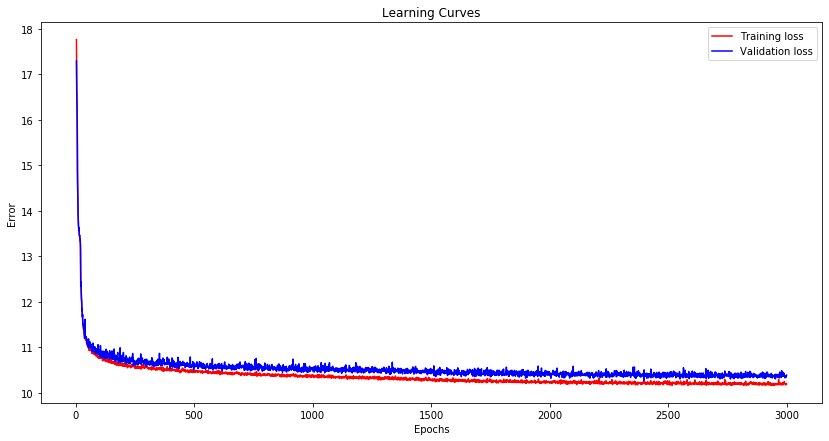

In [33]:
vae_Name='VAE_FC_h2_z15'
vae=vae_FC_h2_z15
train_data=VAE_train(vae, vae_Name)

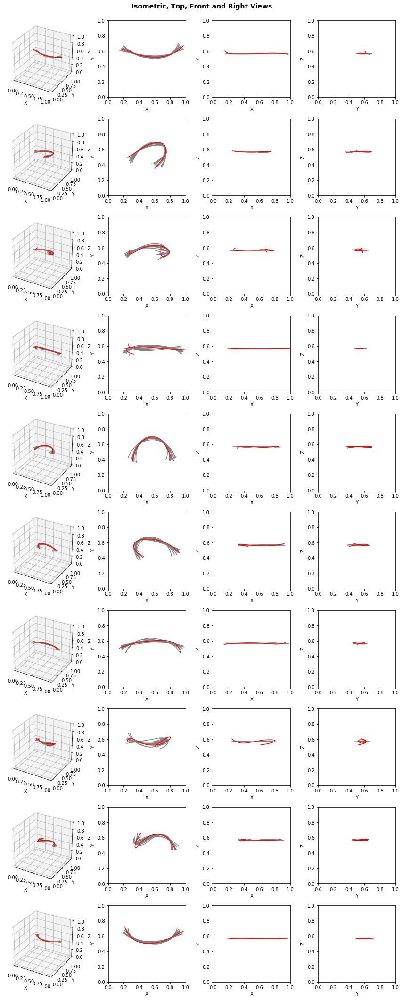

In [34]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=2, Z=30

Model: "model_57"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_29 (Flatten)            (None, 300)          0           input_29[0][0]                   
__________________________________________________________________________________________________
dense_159 (Dense)               (None, 150)          45150       flatten_29[0][0]                 
__________________________________________________________________________________________________
dense_160 (Dense)               (None, 75)           11325       dense_159[0][0]                  
___________________________________________________________________________________________

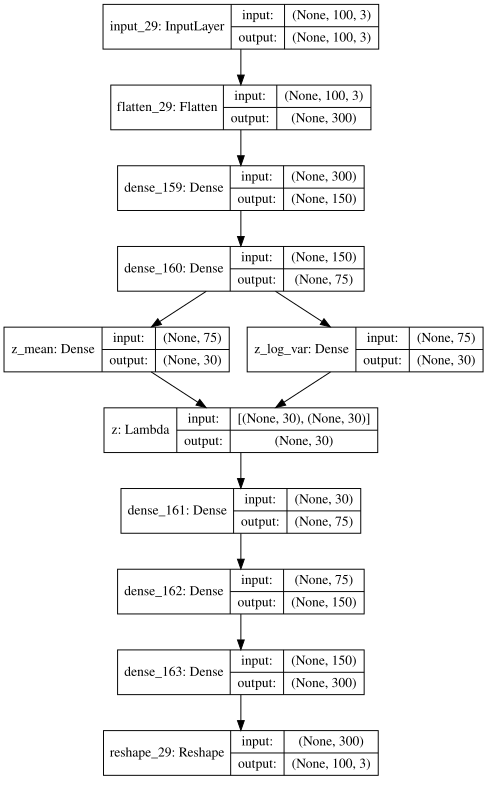

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 24us/step - loss: 72.2600 - reconstruction_loss: 70.5539 - kl_loss: 1.5761 - val_loss: 42.7589 - val_reconstruction_loss: 40.8372 - val_kl_loss: 1.7919

Epoch 00001: val_loss improved from inf to 42.75893, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 12us/step - loss: 39.4034 - reconstruction_loss: 38.4717 - kl_loss: 0.9053 - val_loss: 36.2213 - val_reconstruction_loss: 35.6059 - val_kl_loss: 0.4909

Epoch 00002: val_loss improved from 42.75893 to 36.22126, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 12us/step - loss: 33.2687 - reconstruction_loss: 32.3533 - kl_loss: 0.8699 - val_loss: 26.2193 - val_reconstruction_loss: 23.2759 - val_kl_loss: 2.8791

Epoch 00003: val_loss improved from 36.22126 to 26.21934, saving model to models_VAE/VAE_FC_h2_z30.h

16067/16067 [==============================] - 0s 12us/step - loss: 11.2044 - reconstruction_loss: 7.4546 - kl_loss: 3.7469 - val_loss: 11.3464 - val_reconstruction_loss: 7.6569 - val_kl_loss: 3.6600

Epoch 00054: val_loss did not improve from 11.27122
Epoch 55/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1761 - reconstruction_loss: 7.4471 - kl_loss: 3.7261 - val_loss: 11.1973 - val_reconstruction_loss: 7.4742 - val_kl_loss: 3.6942

Epoch 00055: val_loss improved from 11.27122 to 11.19727, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1522 - reconstruction_loss: 7.4079 - kl_loss: 3.7409 - val_loss: 11.2922 - val_reconstruction_loss: 7.5010 - val_kl_loss: 3.7607

Epoch 00056: val_loss did not improve from 11.19727
Epoch 57/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1570 - reconstruction_loss: 7.3663 - kl_loss: 3.7873 - val_loss: 11.2580 - v

16067/16067 [==============================] - 0s 12us/step - loss: 10.7851 - reconstruction_loss: 6.9466 - kl_loss: 3.8359 - val_loss: 10.8405 - val_reconstruction_loss: 6.9995 - val_kl_loss: 3.8144

Epoch 00113: val_loss improved from 10.84328 to 10.84053, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 114/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8244 - reconstruction_loss: 6.9995 - kl_loss: 3.8213 - val_loss: 10.9451 - val_reconstruction_loss: 7.1041 - val_kl_loss: 3.8115

Epoch 00114: val_loss did not improve from 10.84053
Epoch 115/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8139 - reconstruction_loss: 6.9939 - kl_loss: 3.8162 - val_loss: 10.8796 - val_reconstruction_loss: 7.0747 - val_kl_loss: 3.7789

Epoch 00115: val_loss did not improve from 10.84053
Epoch 116/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7846 - reconstruction_loss: 6.9483 - kl_loss: 3.8323 - val_loss: 10.8901 

16067/16067 [==============================] - 0s 12us/step - loss: 10.7085 - reconstruction_loss: 6.8770 - kl_loss: 3.8284 - val_loss: 10.8500 - val_reconstruction_loss: 7.0221 - val_kl_loss: 3.8038

Epoch 00143: val_loss did not improve from 10.77053
Epoch 144/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7286 - reconstruction_loss: 6.8989 - kl_loss: 3.8258 - val_loss: 10.8421 - val_reconstruction_loss: 7.0607 - val_kl_loss: 3.7544

Epoch 00144: val_loss did not improve from 10.77053
Epoch 145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7118 - reconstruction_loss: 6.8890 - kl_loss: 3.8199 - val_loss: 10.7291 - val_reconstruction_loss: 6.8486 - val_kl_loss: 3.8569

Epoch 00145: val_loss improved from 10.77053 to 10.72911, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7008 - reconstruction_loss: 6.8822 - kl_loss: 3.8159 - val_loss: 10.7940 

16067/16067 [==============================] - 0s 12us/step - loss: 10.6810 - reconstruction_loss: 6.8541 - kl_loss: 3.8226 - val_loss: 10.7178 - val_reconstruction_loss: 6.7862 - val_kl_loss: 3.9041

Epoch 00173: val_loss improved from 10.71844 to 10.71777, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 174/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6905 - reconstruction_loss: 6.8474 - kl_loss: 3.8407 - val_loss: 10.7990 - val_reconstruction_loss: 6.8278 - val_kl_loss: 3.9430

Epoch 00174: val_loss did not improve from 10.71777
Epoch 175/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6585 - reconstruction_loss: 6.8240 - kl_loss: 3.8312 - val_loss: 10.7109 - val_reconstruction_loss: 6.8573 - val_kl_loss: 3.8282

Epoch 00175: val_loss improved from 10.71777 to 10.71086, saving model to models_VAE/VAE_FC_h2_z30.hdf5
Epoch 176/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6580 - reconstruction

16067/16067 [==============================] - 0s 12us/step - loss: 10.6132 - reconstruction_loss: 6.7700 - kl_loss: 3.8404 - val_loss: 10.7078 - val_reconstruction_loss: 6.8999 - val_kl_loss: 3.7831

Epoch 00203: val_loss did not improve from 10.63815
Epoch 204/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6432 - reconstruction_loss: 6.8097 - kl_loss: 3.8300 - val_loss: 10.7834 - val_reconstruction_loss: 6.9891 - val_kl_loss: 3.7681

Epoch 00204: val_loss did not improve from 10.63815
Epoch 205/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6112 - reconstruction_loss: 6.7614 - kl_loss: 3.8471 - val_loss: 10.7161 - val_reconstruction_loss: 6.9931 - val_kl_loss: 3.6999

Epoch 00205: val_loss did not improve from 10.63815
Epoch 206/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6620 - reconstruction_loss: 6.8059 - kl_loss: 3.8523 - val_loss: 10.7867 - val_reconstruction_loss: 6.9690 - val_kl_loss: 3.7


Epoch 00263: val_loss did not improve from 10.62423
Epoch 264/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6049 - reconstruction_loss: 6.7359 - kl_loss: 3.8656 - val_loss: 10.6744 - val_reconstruction_loss: 6.7406 - val_kl_loss: 3.9069

Epoch 00264: val_loss did not improve from 10.62423
Epoch 265/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6161 - reconstruction_loss: 6.7310 - kl_loss: 3.8828 - val_loss: 10.6798 - val_reconstruction_loss: 6.6720 - val_kl_loss: 3.9844

Epoch 00265: val_loss did not improve from 10.62423
Epoch 266/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5583 - reconstruction_loss: 6.7199 - kl_loss: 3.8359 - val_loss: 10.8161 - val_reconstruction_loss: 7.0224 - val_kl_loss: 3.7662

Epoch 00266: val_loss did not improve from 10.62423
Epoch 267/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6019 - reconstruction_loss: 6.7642 - kl_loss: 3.8338 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.5633 - reconstruction_loss: 6.6809 - kl_loss: 3.8791 - val_loss: 10.6323 - val_reconstruction_loss: 6.7575 - val_kl_loss: 3.8492

Epoch 00324: val_loss did not improve from 10.58932
Epoch 325/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5933 - reconstruction_loss: 6.7352 - kl_loss: 3.8553 - val_loss: 10.6776 - val_reconstruction_loss: 6.7160 - val_kl_loss: 3.9356

Epoch 00325: val_loss did not improve from 10.58932
Epoch 326/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5538 - reconstruction_loss: 6.6871 - kl_loss: 3.8648 - val_loss: 10.5918 - val_reconstruction_loss: 6.7661 - val_kl_loss: 3.8030

Epoch 00326: val_loss did not improve from 10.58932
Epoch 327/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5666 - reconstruction_loss: 6.7088 - kl_loss: 3.8551 - val_loss: 10.6488 - val_reconstruction_loss: 6.7456 - val_kl_loss: 3.8


Epoch 00354: val_loss did not improve from 10.58932
Epoch 355/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5502 - reconstruction_loss: 6.6860 - kl_loss: 3.8616 - val_loss: 10.6138 - val_reconstruction_loss: 6.7257 - val_kl_loss: 3.8616

Epoch 00355: val_loss did not improve from 10.58932
Epoch 356/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5502 - reconstruction_loss: 6.6996 - kl_loss: 3.8477 - val_loss: 10.6261 - val_reconstruction_loss: 6.7738 - val_kl_loss: 3.8288

Epoch 00356: val_loss did not improve from 10.58932
Epoch 357/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5413 - reconstruction_loss: 6.6753 - kl_loss: 3.8638 - val_loss: 10.6768 - val_reconstruction_loss: 6.7713 - val_kl_loss: 3.8806

Epoch 00357: val_loss did not improve from 10.58932
Epoch 358/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5825 - reconstruction_loss: 6.7066 - kl_loss: 3.8725 - va


Epoch 00415: val_loss did not improve from 10.57084
Epoch 416/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5190 - reconstruction_loss: 6.6682 - kl_loss: 3.8473 - val_loss: 10.6075 - val_reconstruction_loss: 6.6766 - val_kl_loss: 3.9061

Epoch 00416: val_loss did not improve from 10.57084
Epoch 417/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5182 - reconstruction_loss: 6.6495 - kl_loss: 3.8659 - val_loss: 10.6073 - val_reconstruction_loss: 6.7284 - val_kl_loss: 3.8536

Epoch 00417: val_loss did not improve from 10.57084
Epoch 418/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5262 - reconstruction_loss: 6.6694 - kl_loss: 3.8538 - val_loss: 10.6122 - val_reconstruction_loss: 6.7857 - val_kl_loss: 3.7989

Epoch 00418: val_loss did not improve from 10.57084
Epoch 419/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5494 - reconstruction_loss: 6.6796 - kl_loss: 3.8663 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.4979 - reconstruction_loss: 6.6228 - kl_loss: 3.8719 - val_loss: 10.5859 - val_reconstruction_loss: 6.6789 - val_kl_loss: 3.8824

Epoch 00476: val_loss did not improve from 10.55782
Epoch 477/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5274 - reconstruction_loss: 6.6561 - kl_loss: 3.8684 - val_loss: 10.6157 - val_reconstruction_loss: 6.8739 - val_kl_loss: 3.7170

Epoch 00477: val_loss did not improve from 10.55782
Epoch 478/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5148 - reconstruction_loss: 6.6458 - kl_loss: 3.8645 - val_loss: 10.6531 - val_reconstruction_loss: 6.6965 - val_kl_loss: 3.9329

Epoch 00478: val_loss did not improve from 10.55782
Epoch 479/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5245 - reconstruction_loss: 6.6638 - kl_loss: 3.8578 - val_loss: 10.6992 - val_reconstruction_loss: 6.8442 - val_kl_loss: 3.8


Epoch 00506: val_loss did not improve from 10.55782
Epoch 507/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5257 - reconstruction_loss: 6.6755 - kl_loss: 3.8466 - val_loss: 10.6378 - val_reconstruction_loss: 6.6334 - val_kl_loss: 3.9799

Epoch 00507: val_loss did not improve from 10.55782
Epoch 508/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5143 - reconstruction_loss: 6.6243 - kl_loss: 3.8885 - val_loss: 10.6637 - val_reconstruction_loss: 6.7793 - val_kl_loss: 3.8621

Epoch 00508: val_loss did not improve from 10.55782
Epoch 509/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5165 - reconstruction_loss: 6.6299 - kl_loss: 3.8835 - val_loss: 10.5844 - val_reconstruction_loss: 6.6063 - val_kl_loss: 3.9553

Epoch 00509: val_loss did not improve from 10.55782
Epoch 510/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5185 - reconstruction_loss: 6.6278 - kl_loss: 3.8871 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.4723 - reconstruction_loss: 6.5938 - kl_loss: 3.8748 - val_loss: 10.6174 - val_reconstruction_loss: 6.6544 - val_kl_loss: 3.9380

Epoch 00567: val_loss did not improve from 10.54368
Epoch 568/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4593 - reconstruction_loss: 6.6188 - kl_loss: 3.8375 - val_loss: 10.6228 - val_reconstruction_loss: 6.6654 - val_kl_loss: 3.9343

Epoch 00568: val_loss did not improve from 10.54368
Epoch 569/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4722 - reconstruction_loss: 6.5974 - kl_loss: 3.8711 - val_loss: 10.5679 - val_reconstruction_loss: 6.6915 - val_kl_loss: 3.8508

Epoch 00569: val_loss did not improve from 10.54368
Epoch 570/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4576 - reconstruction_loss: 6.5724 - kl_loss: 3.8819 - val_loss: 10.5479 - val_reconstruction_loss: 6.6525 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 12us/step - loss: 10.4537 - reconstruction_loss: 6.5624 - kl_loss: 3.8879 - val_loss: 10.6726 - val_reconstruction_loss: 6.7240 - val_kl_loss: 3.9271

Epoch 00627: val_loss did not improve from 10.49085
Epoch 628/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4547 - reconstruction_loss: 6.5835 - kl_loss: 3.8674 - val_loss: 10.5357 - val_reconstruction_loss: 6.7173 - val_kl_loss: 3.7926

Epoch 00628: val_loss did not improve from 10.49085
Epoch 629/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4875 - reconstruction_loss: 6.5774 - kl_loss: 3.9069 - val_loss: 10.5656 - val_reconstruction_loss: 6.6476 - val_kl_loss: 3.8949

Epoch 00629: val_loss did not improve from 10.49085
Epoch 630/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4820 - reconstruction_loss: 6.5632 - kl_loss: 3.9156 - val_loss: 10.6509 - val_reconstruction_loss: 6.6741 - val_kl_loss: 3.9


Epoch 00657: val_loss did not improve from 10.49085
Epoch 658/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4609 - reconstruction_loss: 6.5623 - kl_loss: 3.8948 - val_loss: 10.5489 - val_reconstruction_loss: 6.6412 - val_kl_loss: 3.8840

Epoch 00658: val_loss did not improve from 10.49085
Epoch 659/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4808 - reconstruction_loss: 6.5827 - kl_loss: 3.8941 - val_loss: 10.5754 - val_reconstruction_loss: 6.6363 - val_kl_loss: 3.9166

Epoch 00659: val_loss did not improve from 10.49085
Epoch 660/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4763 - reconstruction_loss: 6.5560 - kl_loss: 3.9161 - val_loss: 10.5851 - val_reconstruction_loss: 6.5885 - val_kl_loss: 3.9713

Epoch 00660: val_loss did not improve from 10.49085
Epoch 661/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4888 - reconstruction_loss: 6.5857 - kl_loss: 3.8992 - va


Epoch 00718: val_loss did not improve from 10.49085
Epoch 719/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4509 - reconstruction_loss: 6.5573 - kl_loss: 3.8914 - val_loss: 10.5884 - val_reconstruction_loss: 6.6096 - val_kl_loss: 3.9537

Epoch 00719: val_loss did not improve from 10.49085
Epoch 720/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4388 - reconstruction_loss: 6.5417 - kl_loss: 3.8938 - val_loss: 10.5193 - val_reconstruction_loss: 6.5727 - val_kl_loss: 3.9201

Epoch 00720: val_loss did not improve from 10.49085
Epoch 721/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4516 - reconstruction_loss: 6.5571 - kl_loss: 3.8923 - val_loss: 10.6016 - val_reconstruction_loss: 6.6452 - val_kl_loss: 3.9332

Epoch 00721: val_loss did not improve from 10.49085
Epoch 722/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4421 - reconstruction_loss: 6.5475 - kl_loss: 3.8912 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.4349 - reconstruction_loss: 6.5055 - kl_loss: 3.9277 - val_loss: 10.5525 - val_reconstruction_loss: 6.5719 - val_kl_loss: 3.9557

Epoch 00779: val_loss did not improve from 10.49004
Epoch 780/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4559 - reconstruction_loss: 6.5511 - kl_loss: 3.9015 - val_loss: 10.6000 - val_reconstruction_loss: 6.7078 - val_kl_loss: 3.8700

Epoch 00780: val_loss did not improve from 10.49004
Epoch 781/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4460 - reconstruction_loss: 6.5333 - kl_loss: 3.9109 - val_loss: 10.5701 - val_reconstruction_loss: 6.6932 - val_kl_loss: 3.8558

Epoch 00781: val_loss did not improve from 10.49004
Epoch 782/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4490 - reconstruction_loss: 6.5641 - kl_loss: 3.8815 - val_loss: 10.5972 - val_reconstruction_loss: 6.7232 - val_kl_loss: 3.8


Epoch 00839: val_loss did not improve from 10.44898
Epoch 840/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4101 - reconstruction_loss: 6.5172 - kl_loss: 3.8893 - val_loss: 10.5490 - val_reconstruction_loss: 6.5988 - val_kl_loss: 3.9260

Epoch 00840: val_loss did not improve from 10.44898
Epoch 841/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4301 - reconstruction_loss: 6.5085 - kl_loss: 3.9184 - val_loss: 10.5041 - val_reconstruction_loss: 6.5351 - val_kl_loss: 3.9463

Epoch 00841: val_loss did not improve from 10.44898
Epoch 842/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4315 - reconstruction_loss: 6.5067 - kl_loss: 3.9224 - val_loss: 10.5634 - val_reconstruction_loss: 6.6671 - val_kl_loss: 3.8718

Epoch 00842: val_loss did not improve from 10.44898
Epoch 843/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4381 - reconstruction_loss: 6.5279 - kl_loss: 3.9083 - va


Epoch 00900: val_loss did not improve from 10.44898
Epoch 901/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4439 - reconstruction_loss: 6.5383 - kl_loss: 3.9020 - val_loss: 10.5686 - val_reconstruction_loss: 6.7170 - val_kl_loss: 3.8244

Epoch 00901: val_loss did not improve from 10.44898
Epoch 902/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4285 - reconstruction_loss: 6.5080 - kl_loss: 3.9180 - val_loss: 10.4777 - val_reconstruction_loss: 6.5994 - val_kl_loss: 3.8561

Epoch 00902: val_loss did not improve from 10.44898
Epoch 903/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4310 - reconstruction_loss: 6.4931 - kl_loss: 3.9350 - val_loss: 10.5285 - val_reconstruction_loss: 6.6185 - val_kl_loss: 3.8874

Epoch 00903: val_loss did not improve from 10.44898
Epoch 904/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4209 - reconstruction_loss: 6.5199 - kl_loss: 3.8987 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.3900 - reconstruction_loss: 6.4818 - kl_loss: 3.9058 - val_loss: 10.4786 - val_reconstruction_loss: 6.5243 - val_kl_loss: 3.9332

Epoch 00961: val_loss did not improve from 10.44821
Epoch 962/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3900 - reconstruction_loss: 6.4642 - kl_loss: 3.9226 - val_loss: 10.4903 - val_reconstruction_loss: 6.5123 - val_kl_loss: 3.9555

Epoch 00962: val_loss did not improve from 10.44821
Epoch 963/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3934 - reconstruction_loss: 6.4751 - kl_loss: 3.9156 - val_loss: 10.5003 - val_reconstruction_loss: 6.4251 - val_kl_loss: 4.0505

Epoch 00963: val_loss did not improve from 10.44821
Epoch 964/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3942 - reconstruction_loss: 6.4868 - kl_loss: 3.9046 - val_loss: 10.4567 - val_reconstruction_loss: 6.5653 - val_kl_loss: 3.8


Epoch 00991: val_loss did not improve from 10.44821
Epoch 992/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4149 - reconstruction_loss: 6.5040 - kl_loss: 3.9072 - val_loss: 10.5398 - val_reconstruction_loss: 6.4850 - val_kl_loss: 4.0336

Epoch 00992: val_loss did not improve from 10.44821
Epoch 993/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4203 - reconstruction_loss: 6.4619 - kl_loss: 3.9570 - val_loss: 10.5143 - val_reconstruction_loss: 6.5043 - val_kl_loss: 3.9821

Epoch 00993: val_loss did not improve from 10.44821
Epoch 994/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4079 - reconstruction_loss: 6.4728 - kl_loss: 3.9331 - val_loss: 10.4651 - val_reconstruction_loss: 6.6024 - val_kl_loss: 3.8396

Epoch 00994: val_loss did not improve from 10.44821
Epoch 995/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4226 - reconstruction_loss: 6.4853 - kl_loss: 3.9341 - va


Epoch 01052: val_loss did not improve from 10.44119
Epoch 1053/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3874 - reconstruction_loss: 6.4596 - kl_loss: 3.9251 - val_loss: 10.4533 - val_reconstruction_loss: 6.4404 - val_kl_loss: 3.9933

Epoch 01053: val_loss did not improve from 10.44119
Epoch 1054/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3798 - reconstruction_loss: 6.4390 - kl_loss: 3.9377 - val_loss: 10.5176 - val_reconstruction_loss: 6.6679 - val_kl_loss: 3.8223

Epoch 01054: val_loss did not improve from 10.44119
Epoch 1055/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3992 - reconstruction_loss: 6.4450 - kl_loss: 3.9529 - val_loss: 10.4626 - val_reconstruction_loss: 6.5653 - val_kl_loss: 3.8717

Epoch 01055: val_loss did not improve from 10.44119
Epoch 1056/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4171 - reconstruction_loss: 6.4730 - kl_loss: 3.9404 

16067/16067 [==============================] - 0s 12us/step - loss: 10.4036 - reconstruction_loss: 6.4531 - kl_loss: 3.9480 - val_loss: 10.5062 - val_reconstruction_loss: 6.4704 - val_kl_loss: 4.0117

Epoch 01113: val_loss did not improve from 10.39940
Epoch 1114/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3764 - reconstruction_loss: 6.4448 - kl_loss: 3.9292 - val_loss: 10.5969 - val_reconstruction_loss: 6.4777 - val_kl_loss: 4.0982

Epoch 01114: val_loss did not improve from 10.39940
Epoch 1115/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3681 - reconstruction_loss: 6.4353 - kl_loss: 3.9290 - val_loss: 10.4483 - val_reconstruction_loss: 6.4657 - val_kl_loss: 3.9594

Epoch 01115: val_loss did not improve from 10.39940
Epoch 1116/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3848 - reconstruction_loss: 6.4261 - kl_loss: 3.9557 - val_loss: 10.4748 - val_reconstruction_loss: 6.5396 - val_kl_loss: 


Epoch 01143: val_loss did not improve from 10.39940
Epoch 1144/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3844 - reconstruction_loss: 6.4301 - kl_loss: 3.9521 - val_loss: 10.4542 - val_reconstruction_loss: 6.4149 - val_kl_loss: 4.0171

Epoch 01144: val_loss did not improve from 10.39940
Epoch 1145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3682 - reconstruction_loss: 6.4078 - kl_loss: 3.9565 - val_loss: 10.4953 - val_reconstruction_loss: 6.3887 - val_kl_loss: 4.0843

Epoch 01145: val_loss did not improve from 10.39940
Epoch 1146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3620 - reconstruction_loss: 6.4260 - kl_loss: 3.9326 - val_loss: 10.4116 - val_reconstruction_loss: 6.4250 - val_kl_loss: 3.9646

Epoch 01146: val_loss did not improve from 10.39940
Epoch 1147/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3487 - reconstruction_loss: 6.4153 - kl_loss: 3.9316 


Epoch 01204: val_loss did not improve from 10.39940
Epoch 1205/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3433 - reconstruction_loss: 6.3905 - kl_loss: 3.9502 - val_loss: 10.4591 - val_reconstruction_loss: 6.4790 - val_kl_loss: 3.9585

Epoch 01205: val_loss did not improve from 10.39940
Epoch 1206/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3826 - reconstruction_loss: 6.4089 - kl_loss: 3.9735 - val_loss: 10.4652 - val_reconstruction_loss: 6.5156 - val_kl_loss: 3.9261

Epoch 01206: val_loss did not improve from 10.39940
Epoch 1207/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3655 - reconstruction_loss: 6.3827 - kl_loss: 3.9790 - val_loss: 10.4337 - val_reconstruction_loss: 6.4588 - val_kl_loss: 3.9521

Epoch 01207: val_loss did not improve from 10.39940
Epoch 1208/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3731 - reconstruction_loss: 6.4018 - kl_loss: 3.9680 


Epoch 01265: val_loss did not improve from 10.39940
Epoch 1266/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3732 - reconstruction_loss: 6.3904 - kl_loss: 3.9800 - val_loss: 10.5532 - val_reconstruction_loss: 6.4793 - val_kl_loss: 4.0541

Epoch 01266: val_loss did not improve from 10.39940
Epoch 1267/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3600 - reconstruction_loss: 6.3795 - kl_loss: 3.9768 - val_loss: 10.4695 - val_reconstruction_loss: 6.4346 - val_kl_loss: 4.0138

Epoch 01267: val_loss did not improve from 10.39940
Epoch 1268/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3360 - reconstruction_loss: 6.3631 - kl_loss: 3.9701 - val_loss: 10.4188 - val_reconstruction_loss: 6.5114 - val_kl_loss: 3.8867

Epoch 01268: val_loss did not improve from 10.39940
Epoch 1269/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3369 - reconstruction_loss: 6.3879 - kl_loss: 3.9461 

Epoch 1296/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3588 - reconstruction_loss: 6.3825 - kl_loss: 3.9741 - val_loss: 10.4686 - val_reconstruction_loss: 6.4356 - val_kl_loss: 4.0084

Epoch 01296: val_loss did not improve from 10.36010
Epoch 1297/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3496 - reconstruction_loss: 6.3637 - kl_loss: 3.9823 - val_loss: 10.4123 - val_reconstruction_loss: 6.3855 - val_kl_loss: 4.0067

Epoch 01297: val_loss did not improve from 10.36010
Epoch 1298/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3378 - reconstruction_loss: 6.3342 - kl_loss: 4.0009 - val_loss: 10.5175 - val_reconstruction_loss: 6.5748 - val_kl_loss: 3.9220

Epoch 01298: val_loss did not improve from 10.36010
Epoch 1299/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3408 - reconstruction_loss: 6.3476 - kl_loss: 3.9898 - val_loss: 10.4155 - val_reconstruction_loss: 6.4210

16067/16067 [==============================] - 0s 12us/step - loss: 10.3578 - reconstruction_loss: 6.3324 - kl_loss: 4.0231 - val_loss: 10.5065 - val_reconstruction_loss: 6.2934 - val_kl_loss: 4.1924

Epoch 01356: val_loss did not improve from 10.35840
Epoch 1357/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3309 - reconstruction_loss: 6.3211 - kl_loss: 4.0067 - val_loss: 10.4061 - val_reconstruction_loss: 6.3074 - val_kl_loss: 4.0779

Epoch 01357: val_loss did not improve from 10.35840
Epoch 1358/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3272 - reconstruction_loss: 6.3443 - kl_loss: 3.9800 - val_loss: 10.4396 - val_reconstruction_loss: 6.4004 - val_kl_loss: 4.0163

Epoch 01358: val_loss did not improve from 10.35840
Epoch 1359/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3194 - reconstruction_loss: 6.3234 - kl_loss: 3.9919 - val_loss: 10.4215 - val_reconstruction_loss: 6.2754 - val_kl_loss: 


Epoch 01386: val_loss did not improve from 10.35840
Epoch 1387/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2892 - reconstruction_loss: 6.2822 - kl_loss: 4.0050 - val_loss: 10.3746 - val_reconstruction_loss: 6.3454 - val_kl_loss: 4.0066

Epoch 01387: val_loss did not improve from 10.35840
Epoch 1388/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3018 - reconstruction_loss: 6.3166 - kl_loss: 3.9809 - val_loss: 10.4118 - val_reconstruction_loss: 6.4294 - val_kl_loss: 3.9579

Epoch 01388: val_loss did not improve from 10.35840
Epoch 1389/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3367 - reconstruction_loss: 6.3280 - kl_loss: 4.0064 - val_loss: 10.4737 - val_reconstruction_loss: 6.4325 - val_kl_loss: 4.0176

Epoch 01389: val_loss did not improve from 10.35840
Epoch 1390/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3251 - reconstruction_loss: 6.3298 - kl_loss: 3.9929 

16067/16067 [==============================] - 0s 12us/step - loss: 10.3181 - reconstruction_loss: 6.2846 - kl_loss: 4.0303 - val_loss: 10.4112 - val_reconstruction_loss: 6.3631 - val_kl_loss: 4.0246

Epoch 01447: val_loss did not improve from 10.33232
Epoch 1448/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3078 - reconstruction_loss: 6.2871 - kl_loss: 4.0184 - val_loss: 10.4757 - val_reconstruction_loss: 6.4610 - val_kl_loss: 3.9870

Epoch 01448: val_loss did not improve from 10.33232
Epoch 1449/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3358 - reconstruction_loss: 6.2997 - kl_loss: 4.0327 - val_loss: 10.4132 - val_reconstruction_loss: 6.2570 - val_kl_loss: 4.1295

Epoch 01449: val_loss did not improve from 10.33232
Epoch 1450/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3417 - reconstruction_loss: 6.2923 - kl_loss: 4.0462 - val_loss: 10.3999 - val_reconstruction_loss: 6.3036 - val_kl_loss: 


Epoch 01477: val_loss did not improve from 10.33232
Epoch 1478/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3204 - reconstruction_loss: 6.3018 - kl_loss: 4.0163 - val_loss: 10.4356 - val_reconstruction_loss: 6.3774 - val_kl_loss: 4.0316

Epoch 01478: val_loss did not improve from 10.33232
Epoch 1479/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3231 - reconstruction_loss: 6.2895 - kl_loss: 4.0307 - val_loss: 10.3690 - val_reconstruction_loss: 6.3147 - val_kl_loss: 4.0274

Epoch 01479: val_loss did not improve from 10.33232
Epoch 1480/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3264 - reconstruction_loss: 6.2947 - kl_loss: 4.0281 - val_loss: 10.4182 - val_reconstruction_loss: 6.3185 - val_kl_loss: 4.0745

Epoch 01480: val_loss did not improve from 10.33232
Epoch 1481/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3127 - reconstruction_loss: 6.2855 - kl_loss: 4.0249 


Epoch 01538: val_loss did not improve from 10.33232
Epoch 1539/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2862 - reconstruction_loss: 6.2685 - kl_loss: 4.0157 - val_loss: 10.4489 - val_reconstruction_loss: 6.4465 - val_kl_loss: 3.9760

Epoch 01539: val_loss did not improve from 10.33232
Epoch 1540/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3058 - reconstruction_loss: 6.2657 - kl_loss: 4.0372 - val_loss: 10.4669 - val_reconstruction_loss: 6.3816 - val_kl_loss: 4.0619

Epoch 01540: val_loss did not improve from 10.33232
Epoch 1541/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3386 - reconstruction_loss: 6.3149 - kl_loss: 4.0215 - val_loss: 10.4203 - val_reconstruction_loss: 6.3052 - val_kl_loss: 4.0908

Epoch 01541: val_loss did not improve from 10.33232
Epoch 1542/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3125 - reconstruction_loss: 6.2406 - kl_loss: 4.0698 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2851 - reconstruction_loss: 6.2561 - kl_loss: 4.0254 - val_loss: 10.3901 - val_reconstruction_loss: 6.2812 - val_kl_loss: 4.0815

Epoch 01599: val_loss did not improve from 10.33232
Epoch 1600/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3041 - reconstruction_loss: 6.2450 - kl_loss: 4.0557 - val_loss: 10.3872 - val_reconstruction_loss: 6.3239 - val_kl_loss: 4.0388

Epoch 01600: val_loss did not improve from 10.33232
Epoch 1601/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3280 - reconstruction_loss: 6.2755 - kl_loss: 4.0492 - val_loss: 10.4823 - val_reconstruction_loss: 6.3195 - val_kl_loss: 4.1355

Epoch 01601: val_loss did not improve from 10.33232
Epoch 1602/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2854 - reconstruction_loss: 6.2547 - kl_loss: 4.0267 - val_loss: 10.3605 - val_reconstruction_loss: 6.2355 - val_kl_loss: 


Epoch 01659: val_loss did not improve from 10.31514
Epoch 1660/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3038 - reconstruction_loss: 6.2499 - kl_loss: 4.0510 - val_loss: 10.3853 - val_reconstruction_loss: 6.2823 - val_kl_loss: 4.0781

Epoch 01660: val_loss did not improve from 10.31514
Epoch 1661/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2636 - reconstruction_loss: 6.2040 - kl_loss: 4.0574 - val_loss: 10.4044 - val_reconstruction_loss: 6.2331 - val_kl_loss: 4.1472

Epoch 01661: val_loss did not improve from 10.31514
Epoch 1662/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2777 - reconstruction_loss: 6.2388 - kl_loss: 4.0360 - val_loss: 10.4013 - val_reconstruction_loss: 6.2713 - val_kl_loss: 4.1056

Epoch 01662: val_loss did not improve from 10.31514
Epoch 1663/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2236 - reconstruction_loss: 6.2092 - kl_loss: 4.0115 


Epoch 01720: val_loss did not improve from 10.30842
Epoch 1721/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3047 - reconstruction_loss: 6.2189 - kl_loss: 4.0829 - val_loss: 10.3784 - val_reconstruction_loss: 6.3000 - val_kl_loss: 4.0564

Epoch 01721: val_loss did not improve from 10.30842
Epoch 1722/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2896 - reconstruction_loss: 6.2070 - kl_loss: 4.0796 - val_loss: 10.3779 - val_reconstruction_loss: 6.2793 - val_kl_loss: 4.0738

Epoch 01722: val_loss did not improve from 10.30842
Epoch 1723/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2489 - reconstruction_loss: 6.1949 - kl_loss: 4.0500 - val_loss: 10.3947 - val_reconstruction_loss: 6.3340 - val_kl_loss: 4.0369

Epoch 01723: val_loss did not improve from 10.30842
Epoch 1724/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2802 - reconstruction_loss: 6.2185 - kl_loss: 4.0590 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2800 - reconstruction_loss: 6.1969 - kl_loss: 4.0812 - val_loss: 10.4334 - val_reconstruction_loss: 6.4363 - val_kl_loss: 3.9687

Epoch 01781: val_loss did not improve from 10.30587
Epoch 1782/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2692 - reconstruction_loss: 6.2080 - kl_loss: 4.0578 - val_loss: 10.3621 - val_reconstruction_loss: 6.1827 - val_kl_loss: 4.1530

Epoch 01782: val_loss did not improve from 10.30587
Epoch 1783/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2824 - reconstruction_loss: 6.1920 - kl_loss: 4.0884 - val_loss: 10.4194 - val_reconstruction_loss: 6.3044 - val_kl_loss: 4.0897

Epoch 01783: val_loss did not improve from 10.30587
Epoch 1784/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2812 - reconstruction_loss: 6.2023 - kl_loss: 4.0752 - val_loss: 10.3686 - val_reconstruction_loss: 6.2357 - val_kl_loss: 


Epoch 01841: val_loss did not improve from 10.30402
Epoch 1842/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3134 - reconstruction_loss: 6.2033 - kl_loss: 4.1062 - val_loss: 10.3636 - val_reconstruction_loss: 6.2268 - val_kl_loss: 4.1091

Epoch 01842: val_loss did not improve from 10.30402
Epoch 1843/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2667 - reconstruction_loss: 6.1965 - kl_loss: 4.0671 - val_loss: 10.4187 - val_reconstruction_loss: 6.2429 - val_kl_loss: 4.1535

Epoch 01843: val_loss did not improve from 10.30402
Epoch 1844/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2543 - reconstruction_loss: 6.1809 - kl_loss: 4.0703 - val_loss: 10.3458 - val_reconstruction_loss: 6.3688 - val_kl_loss: 3.9577

Epoch 01844: val_loss did not improve from 10.30402
Epoch 1845/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2567 - reconstruction_loss: 6.1655 - kl_loss: 4.0876 


Epoch 01902: val_loss did not improve from 10.28842
Epoch 1903/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2439 - reconstruction_loss: 6.1703 - kl_loss: 4.0715 - val_loss: 10.4285 - val_reconstruction_loss: 6.3094 - val_kl_loss: 4.0964

Epoch 01903: val_loss did not improve from 10.28842
Epoch 1904/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2724 - reconstruction_loss: 6.1732 - kl_loss: 4.0954 - val_loss: 10.3523 - val_reconstruction_loss: 6.1214 - val_kl_loss: 4.2065

Epoch 01904: val_loss did not improve from 10.28842
Epoch 1905/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2618 - reconstruction_loss: 6.1751 - kl_loss: 4.0839 - val_loss: 10.4144 - val_reconstruction_loss: 6.3267 - val_kl_loss: 4.0621

Epoch 01905: val_loss did not improve from 10.28842
Epoch 1906/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2864 - reconstruction_loss: 6.1857 - kl_loss: 4.0970 


Epoch 01963: val_loss did not improve from 10.26880
Epoch 1964/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2715 - reconstruction_loss: 6.1789 - kl_loss: 4.0904 - val_loss: 10.3342 - val_reconstruction_loss: 6.1347 - val_kl_loss: 4.1711

Epoch 01964: val_loss did not improve from 10.26880
Epoch 1965/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2297 - reconstruction_loss: 6.1512 - kl_loss: 4.0756 - val_loss: 10.4323 - val_reconstruction_loss: 6.2689 - val_kl_loss: 4.1382

Epoch 01965: val_loss did not improve from 10.26880
Epoch 1966/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2530 - reconstruction_loss: 6.1705 - kl_loss: 4.0793 - val_loss: 10.4070 - val_reconstruction_loss: 6.2251 - val_kl_loss: 4.1596

Epoch 01966: val_loss did not improve from 10.26880
Epoch 1967/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2517 - reconstruction_loss: 6.1420 - kl_loss: 4.1061 


Epoch 02024: val_loss did not improve from 10.26880
Epoch 2025/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2506 - reconstruction_loss: 6.1577 - kl_loss: 4.0904 - val_loss: 10.3806 - val_reconstruction_loss: 6.2099 - val_kl_loss: 4.1442

Epoch 02025: val_loss did not improve from 10.26880
Epoch 2026/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2525 - reconstruction_loss: 6.1623 - kl_loss: 4.0872 - val_loss: 10.3777 - val_reconstruction_loss: 6.2361 - val_kl_loss: 4.1163

Epoch 02026: val_loss did not improve from 10.26880
Epoch 2027/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2357 - reconstruction_loss: 6.1523 - kl_loss: 4.0808 - val_loss: 10.3837 - val_reconstruction_loss: 6.3331 - val_kl_loss: 4.0248

Epoch 02027: val_loss did not improve from 10.26880
Epoch 2028/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2509 - reconstruction_loss: 6.1766 - kl_loss: 4.0709 


Epoch 02085: val_loss did not improve from 10.26880
Epoch 2086/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2441 - reconstruction_loss: 6.1413 - kl_loss: 4.0994 - val_loss: 10.3266 - val_reconstruction_loss: 6.0493 - val_kl_loss: 4.2547

Epoch 02086: val_loss did not improve from 10.26880
Epoch 2087/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2541 - reconstruction_loss: 6.1679 - kl_loss: 4.0828 - val_loss: 10.3471 - val_reconstruction_loss: 6.1069 - val_kl_loss: 4.2165

Epoch 02087: val_loss did not improve from 10.26880
Epoch 2088/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2597 - reconstruction_loss: 6.1262 - kl_loss: 4.1300 - val_loss: 10.3600 - val_reconstruction_loss: 6.1938 - val_kl_loss: 4.1428

Epoch 02088: val_loss did not improve from 10.26880
Epoch 2089/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2653 - reconstruction_loss: 6.1733 - kl_loss: 4.0880 


Epoch 02146: val_loss did not improve from 10.26880
Epoch 2147/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2520 - reconstruction_loss: 6.1294 - kl_loss: 4.1206 - val_loss: 10.3711 - val_reconstruction_loss: 6.3558 - val_kl_loss: 3.9883

Epoch 02147: val_loss did not improve from 10.26880
Epoch 2148/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2404 - reconstruction_loss: 6.1512 - kl_loss: 4.0862 - val_loss: 10.3316 - val_reconstruction_loss: 6.1813 - val_kl_loss: 4.1291

Epoch 02148: val_loss did not improve from 10.26880
Epoch 2149/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2560 - reconstruction_loss: 6.1412 - kl_loss: 4.1116 - val_loss: 10.3577 - val_reconstruction_loss: 6.2867 - val_kl_loss: 4.0479

Epoch 02149: val_loss did not improve from 10.26880
Epoch 2150/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2417 - reconstruction_loss: 6.1482 - kl_loss: 4.0895 


Epoch 02207: val_loss did not improve from 10.26880
Epoch 2208/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2461 - reconstruction_loss: 6.1413 - kl_loss: 4.1024 - val_loss: 10.3503 - val_reconstruction_loss: 6.1312 - val_kl_loss: 4.1970

Epoch 02208: val_loss did not improve from 10.26880
Epoch 2209/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2659 - reconstruction_loss: 6.1226 - kl_loss: 4.1399 - val_loss: 10.3864 - val_reconstruction_loss: 6.3080 - val_kl_loss: 4.0560

Epoch 02209: val_loss did not improve from 10.26880
Epoch 2210/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2356 - reconstruction_loss: 6.1464 - kl_loss: 4.0860 - val_loss: 10.4218 - val_reconstruction_loss: 6.3682 - val_kl_loss: 4.0265

Epoch 02210: val_loss did not improve from 10.26880
Epoch 2211/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2442 - reconstruction_loss: 6.1488 - kl_loss: 4.0931 


Epoch 02268: val_loss did not improve from 10.26880
Epoch 2269/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2178 - reconstruction_loss: 6.1163 - kl_loss: 4.0990 - val_loss: 10.3339 - val_reconstruction_loss: 6.2364 - val_kl_loss: 4.0736

Epoch 02269: val_loss did not improve from 10.26880
Epoch 2270/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1953 - reconstruction_loss: 6.0935 - kl_loss: 4.0988 - val_loss: 10.3074 - val_reconstruction_loss: 6.2186 - val_kl_loss: 4.0681

Epoch 02270: val_loss did not improve from 10.26880
Epoch 2271/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2498 - reconstruction_loss: 6.1312 - kl_loss: 4.1162 - val_loss: 10.3223 - val_reconstruction_loss: 6.2751 - val_kl_loss: 4.0249

Epoch 02271: val_loss did not improve from 10.26880
Epoch 2272/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2211 - reconstruction_loss: 6.1283 - kl_loss: 4.0891 


Epoch 02329: val_loss did not improve from 10.26880
Epoch 2330/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2118 - reconstruction_loss: 6.1059 - kl_loss: 4.1033 - val_loss: 10.3491 - val_reconstruction_loss: 6.1908 - val_kl_loss: 4.1340

Epoch 02330: val_loss did not improve from 10.26880
Epoch 2331/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2605 - reconstruction_loss: 6.1306 - kl_loss: 4.1271 - val_loss: 10.3740 - val_reconstruction_loss: 6.0579 - val_kl_loss: 4.2929

Epoch 02331: val_loss did not improve from 10.26880
Epoch 2332/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2328 - reconstruction_loss: 6.1144 - kl_loss: 4.1157 - val_loss: 10.3477 - val_reconstruction_loss: 6.3133 - val_kl_loss: 4.0099

Epoch 02332: val_loss did not improve from 10.26880
Epoch 2333/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2315 - reconstruction_loss: 6.1094 - kl_loss: 4.1188 


Epoch 02390: val_loss did not improve from 10.26211
Epoch 2391/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2579 - reconstruction_loss: 6.1492 - kl_loss: 4.1050 - val_loss: 10.4072 - val_reconstruction_loss: 6.2404 - val_kl_loss: 4.1415

Epoch 02391: val_loss did not improve from 10.26211
Epoch 2392/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2319 - reconstruction_loss: 6.1065 - kl_loss: 4.1232 - val_loss: 10.5064 - val_reconstruction_loss: 6.2517 - val_kl_loss: 4.2328

Epoch 02392: val_loss did not improve from 10.26211
Epoch 2393/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2905 - reconstruction_loss: 6.2221 - kl_loss: 4.0648 - val_loss: 10.3562 - val_reconstruction_loss: 6.1993 - val_kl_loss: 4.1347

Epoch 02393: val_loss did not improve from 10.26211
Epoch 2394/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2333 - reconstruction_loss: 6.1332 - kl_loss: 4.0951 


Epoch 02451: val_loss did not improve from 10.26211
Epoch 2452/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2116 - reconstruction_loss: 6.1030 - kl_loss: 4.1051 - val_loss: 10.3813 - val_reconstruction_loss: 6.2800 - val_kl_loss: 4.0767

Epoch 02452: val_loss did not improve from 10.26211
Epoch 2453/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2186 - reconstruction_loss: 6.1369 - kl_loss: 4.0778 - val_loss: 10.3844 - val_reconstruction_loss: 6.0961 - val_kl_loss: 4.2629

Epoch 02453: val_loss did not improve from 10.26211
Epoch 2454/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2394 - reconstruction_loss: 6.1322 - kl_loss: 4.1050 - val_loss: 10.3534 - val_reconstruction_loss: 6.1173 - val_kl_loss: 4.2137

Epoch 02454: val_loss did not improve from 10.26211
Epoch 2455/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2236 - reconstruction_loss: 6.1115 - kl_loss: 4.1092 


Epoch 02512: val_loss did not improve from 10.26211
Epoch 2513/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2478 - reconstruction_loss: 6.1088 - kl_loss: 4.1369 - val_loss: 10.3766 - val_reconstruction_loss: 6.0938 - val_kl_loss: 4.2620

Epoch 02513: val_loss did not improve from 10.26211
Epoch 2514/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2110 - reconstruction_loss: 6.0986 - kl_loss: 4.1090 - val_loss: 10.2929 - val_reconstruction_loss: 6.1952 - val_kl_loss: 4.0717

Epoch 02514: val_loss did not improve from 10.26211
Epoch 2515/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2207 - reconstruction_loss: 6.0996 - kl_loss: 4.1186 - val_loss: 10.2964 - val_reconstruction_loss: 6.1439 - val_kl_loss: 4.1288

Epoch 02515: val_loss did not improve from 10.26211
Epoch 2516/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2137 - reconstruction_loss: 6.0868 - kl_loss: 4.1249 


Epoch 02573: val_loss did not improve from 10.26211
Epoch 2574/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2116 - reconstruction_loss: 6.0877 - kl_loss: 4.1225 - val_loss: 10.3450 - val_reconstruction_loss: 6.1967 - val_kl_loss: 4.1238

Epoch 02574: val_loss did not improve from 10.26211
Epoch 2575/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2324 - reconstruction_loss: 6.1092 - kl_loss: 4.1206 - val_loss: 10.3324 - val_reconstruction_loss: 6.2501 - val_kl_loss: 4.0616

Epoch 02575: val_loss did not improve from 10.26211
Epoch 2576/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2387 - reconstruction_loss: 6.1133 - kl_loss: 4.1224 - val_loss: 10.3742 - val_reconstruction_loss: 6.2774 - val_kl_loss: 4.0729

Epoch 02576: val_loss did not improve from 10.26211
Epoch 2577/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2346 - reconstruction_loss: 6.1167 - kl_loss: 4.1148 


Epoch 02634: val_loss did not improve from 10.26211
Epoch 2635/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2241 - reconstruction_loss: 6.0812 - kl_loss: 4.1398 - val_loss: 10.4005 - val_reconstruction_loss: 6.2230 - val_kl_loss: 4.1537

Epoch 02635: val_loss did not improve from 10.26211
Epoch 2636/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2337 - reconstruction_loss: 6.1106 - kl_loss: 4.1204 - val_loss: 10.3850 - val_reconstruction_loss: 6.1263 - val_kl_loss: 4.2376

Epoch 02636: val_loss did not improve from 10.26211
Epoch 2637/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2150 - reconstruction_loss: 6.1032 - kl_loss: 4.1089 - val_loss: 10.3719 - val_reconstruction_loss: 6.2458 - val_kl_loss: 4.1054

Epoch 02637: val_loss did not improve from 10.26211
Epoch 2638/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2068 - reconstruction_loss: 6.1011 - kl_loss: 4.1035 


Epoch 02695: val_loss did not improve from 10.26211
Epoch 2696/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2392 - reconstruction_loss: 6.0833 - kl_loss: 4.1544 - val_loss: 10.2836 - val_reconstruction_loss: 6.1730 - val_kl_loss: 4.0889

Epoch 02696: val_loss did not improve from 10.26211
Epoch 2697/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1818 - reconstruction_loss: 6.0691 - kl_loss: 4.1088 - val_loss: 10.4117 - val_reconstruction_loss: 6.1132 - val_kl_loss: 4.2746

Epoch 02697: val_loss did not improve from 10.26211
Epoch 2698/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2159 - reconstruction_loss: 6.0890 - kl_loss: 4.1242 - val_loss: 10.3526 - val_reconstruction_loss: 6.2891 - val_kl_loss: 4.0382

Epoch 02698: val_loss did not improve from 10.26211
Epoch 2699/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2305 - reconstruction_loss: 6.0999 - kl_loss: 4.1274 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2302 - reconstruction_loss: 6.1086 - kl_loss: 4.1200 - val_loss: 10.3189 - val_reconstruction_loss: 6.1269 - val_kl_loss: 4.1687

Epoch 02756: val_loss did not improve from 10.25892
Epoch 2757/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2302 - reconstruction_loss: 6.1269 - kl_loss: 4.1005 - val_loss: 10.3226 - val_reconstruction_loss: 6.1331 - val_kl_loss: 4.1688

Epoch 02757: val_loss did not improve from 10.25892
Epoch 2758/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2089 - reconstruction_loss: 6.0574 - kl_loss: 4.1490 - val_loss: 10.3051 - val_reconstruction_loss: 6.1422 - val_kl_loss: 4.1412

Epoch 02758: val_loss did not improve from 10.25892
Epoch 2759/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2427 - reconstruction_loss: 6.1127 - kl_loss: 4.1271 - val_loss: 10.4008 - val_reconstruction_loss: 6.1522 - val_kl_loss: 


Epoch 02786: val_loss did not improve from 10.25892
Epoch 2787/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2432 - reconstruction_loss: 6.0882 - kl_loss: 4.1525 - val_loss: 10.4067 - val_reconstruction_loss: 6.2475 - val_kl_loss: 4.1358

Epoch 02787: val_loss did not improve from 10.25892
Epoch 2788/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2180 - reconstruction_loss: 6.1058 - kl_loss: 4.1104 - val_loss: 10.3233 - val_reconstruction_loss: 6.2954 - val_kl_loss: 3.9990

Epoch 02788: val_loss did not improve from 10.25892
Epoch 2789/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2199 - reconstruction_loss: 6.0842 - kl_loss: 4.1325 - val_loss: 10.2960 - val_reconstruction_loss: 6.2396 - val_kl_loss: 4.0327

Epoch 02789: val_loss did not improve from 10.25892
Epoch 2790/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2093 - reconstruction_loss: 6.1045 - kl_loss: 4.1025 


Epoch 02847: val_loss did not improve from 10.25892
Epoch 2848/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2086 - reconstruction_loss: 6.0649 - kl_loss: 4.1403 - val_loss: 10.3401 - val_reconstruction_loss: 6.1118 - val_kl_loss: 4.2086

Epoch 02848: val_loss did not improve from 10.25892
Epoch 2849/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1842 - reconstruction_loss: 6.0411 - kl_loss: 4.1391 - val_loss: 10.3105 - val_reconstruction_loss: 6.1015 - val_kl_loss: 4.1851

Epoch 02849: val_loss did not improve from 10.25892
Epoch 2850/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1915 - reconstruction_loss: 6.0709 - kl_loss: 4.1171 - val_loss: 10.3622 - val_reconstruction_loss: 6.1192 - val_kl_loss: 4.2225

Epoch 02850: val_loss did not improve from 10.25892
Epoch 2851/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2280 - reconstruction_loss: 6.0977 - kl_loss: 4.1274 


Epoch 02908: val_loss did not improve from 10.25892
Epoch 2909/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2181 - reconstruction_loss: 6.0972 - kl_loss: 4.1193 - val_loss: 10.4146 - val_reconstruction_loss: 6.4659 - val_kl_loss: 3.9221

Epoch 02909: val_loss did not improve from 10.25892
Epoch 2910/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2172 - reconstruction_loss: 6.0609 - kl_loss: 4.1533 - val_loss: 10.3903 - val_reconstruction_loss: 6.1888 - val_kl_loss: 4.1779

Epoch 02910: val_loss did not improve from 10.25892
Epoch 2911/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2228 - reconstruction_loss: 6.0829 - kl_loss: 4.1374 - val_loss: 10.3504 - val_reconstruction_loss: 6.1121 - val_kl_loss: 4.2146

Epoch 02911: val_loss did not improve from 10.25892
Epoch 2912/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2087 - reconstruction_loss: 6.0883 - kl_loss: 4.1161 


Epoch 02969: val_loss did not improve from 10.25892
Epoch 2970/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2122 - reconstruction_loss: 6.0568 - kl_loss: 4.1521 - val_loss: 10.3794 - val_reconstruction_loss: 6.1705 - val_kl_loss: 4.1855

Epoch 02970: val_loss did not improve from 10.25892
Epoch 2971/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1992 - reconstruction_loss: 6.0624 - kl_loss: 4.1345 - val_loss: 10.3471 - val_reconstruction_loss: 6.1168 - val_kl_loss: 4.2058

Epoch 02971: val_loss did not improve from 10.25892
Epoch 2972/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.1806 - reconstruction_loss: 6.0606 - kl_loss: 4.1163 - val_loss: 10.3426 - val_reconstruction_loss: 6.1354 - val_kl_loss: 4.1854

Epoch 02972: val_loss did not improve from 10.25892
Epoch 2973/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2090 - reconstruction_loss: 6.0800 - kl_loss: 4.1269 

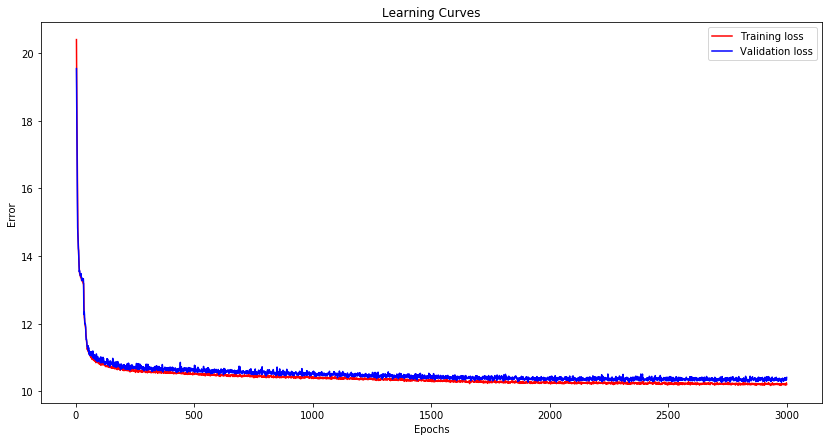

In [35]:
vae_Name='VAE_FC_h2_z30'
vae=vae_FC_h2_z30
train_data=VAE_train(vae, vae_Name)

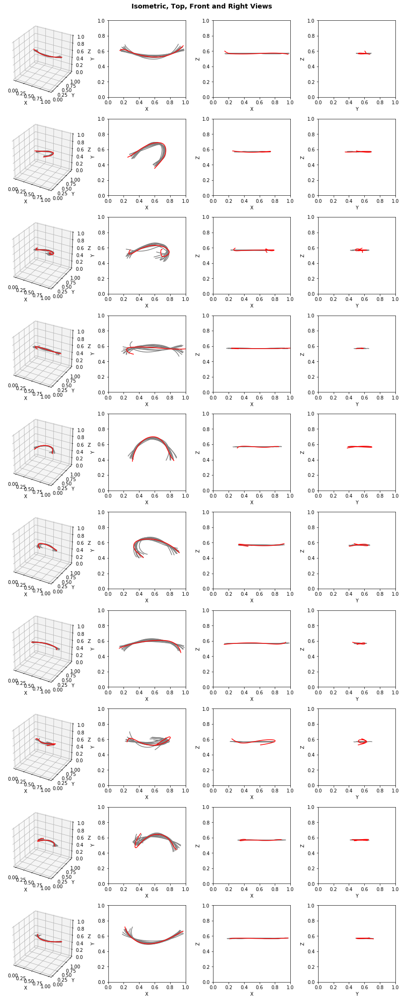

In [36]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=2, Z=60

Model: "model_59"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_30 (Flatten)            (None, 300)          0           input_30[0][0]                   
__________________________________________________________________________________________________
dense_164 (Dense)               (None, 150)          45150       flatten_30[0][0]                 
__________________________________________________________________________________________________
dense_165 (Dense)               (None, 75)           11325       dense_164[0][0]                  
___________________________________________________________________________________________

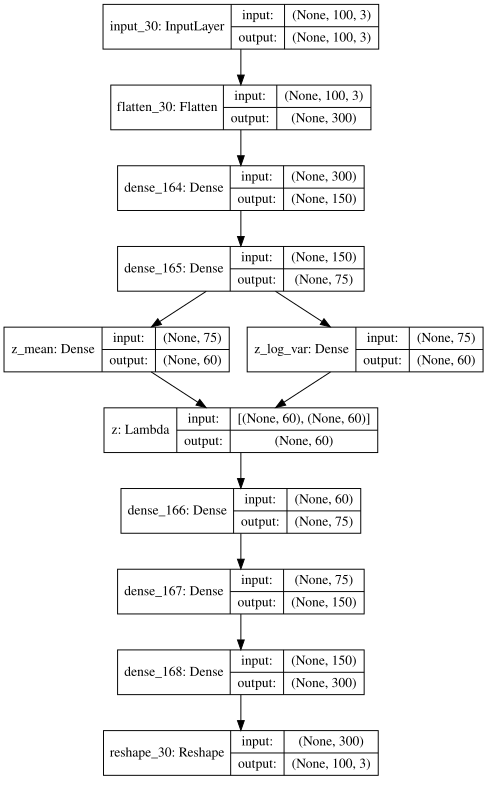

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 24us/step - loss: 74.0749 - reconstruction_loss: 71.8756 - kl_loss: 2.0750 - val_loss: 44.5284 - val_reconstruction_loss: 42.7412 - val_kl_loss: 1.6515

Epoch 00001: val_loss improved from inf to 44.52845, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 12us/step - loss: 40.2302 - reconstruction_loss: 39.3144 - kl_loss: 0.8847 - val_loss: 36.4615 - val_reconstruction_loss: 35.8241 - val_kl_loss: 0.5264

Epoch 00002: val_loss improved from 44.52845 to 36.46151, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 12us/step - loss: 31.6862 - reconstruction_loss: 30.1066 - kl_loss: 1.5463 - val_loss: 26.1972 - val_reconstruction_loss: 23.3388 - val_kl_loss: 2.7734

Epoch 00003: val_loss improved from 36.46151 to 26.19715, saving model to models_VAE/VAE_FC_h2_z60.h

Epoch 27/3000
16067/16067 [==============================] - 0s 12us/step - loss: 14.0965 - reconstruction_loss: 11.3550 - kl_loss: 2.7376 - val_loss: 14.0563 - val_reconstruction_loss: 11.2720 - val_kl_loss: 2.7416

Epoch 00027: val_loss improved from 14.06539 to 14.05628, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 12us/step - loss: 14.0041 - reconstruction_loss: 11.2785 - kl_loss: 2.7194 - val_loss: 14.0987 - val_reconstruction_loss: 11.2241 - val_kl_loss: 2.8342

Epoch 00028: val_loss did not improve from 14.05628
Epoch 29/3000
16067/16067 [==============================] - 0s 12us/step - loss: 13.8868 - reconstruction_loss: 11.1259 - kl_loss: 2.7557 - val_loss: 13.8258 - val_reconstruction_loss: 11.0209 - val_kl_loss: 2.7639

Epoch 00029: val_loss improved from 14.05628 to 13.82583, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 30/3000
16067/16067 [==============================] - 0s 12us/step - loss: 13.7414

Epoch 55/3000
16067/16067 [==============================] - 0s 12us/step - loss: 13.0725 - reconstruction_loss: 10.3541 - kl_loss: 2.7144 - val_loss: 13.0428 - val_reconstruction_loss: 10.2540 - val_kl_loss: 2.7480

Epoch 00055: val_loss improved from 13.17844 to 13.04279, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 12us/step - loss: 12.6786 - reconstruction_loss: 9.7139 - kl_loss: 2.9575 - val_loss: 12.3371 - val_reconstruction_loss: 8.8860 - val_kl_loss: 3.4172

Epoch 00056: val_loss improved from 13.04279 to 12.33710, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 57/3000
16067/16067 [==============================] - 0s 12us/step - loss: 12.2681 - reconstruction_loss: 8.8008 - kl_loss: 3.4615 - val_loss: 12.5110 - val_reconstruction_loss: 9.0233 - val_kl_loss: 3.4564

Epoch 00057: val_loss did not improve from 12.33710
Epoch 58/3000
16067/16067 [==============================] - 0s 12us/step - loss: 12.1737 - r


Epoch 00082: val_loss improved from 11.20850 to 11.13357, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 83/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1463 - reconstruction_loss: 7.4728 - kl_loss: 3.6703 - val_loss: 11.1756 - val_reconstruction_loss: 7.4693 - val_kl_loss: 3.6763

Epoch 00083: val_loss did not improve from 11.13357
Epoch 84/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1116 - reconstruction_loss: 7.4319 - kl_loss: 3.6764 - val_loss: 11.2158 - val_reconstruction_loss: 7.5145 - val_kl_loss: 3.6741

Epoch 00084: val_loss did not improve from 11.13357
Epoch 85/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1567 - reconstruction_loss: 7.4683 - kl_loss: 3.6852 - val_loss: 11.1545 - val_reconstruction_loss: 7.4266 - val_kl_loss: 3.6992

Epoch 00085: val_loss did not improve from 11.13357
Epoch 86/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.1017 - re


Epoch 00112: val_loss did not improve from 11.03051
Epoch 113/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.9635 - reconstruction_loss: 7.2387 - kl_loss: 3.7226 - val_loss: 11.0693 - val_reconstruction_loss: 7.4013 - val_kl_loss: 3.6402

Epoch 00113: val_loss did not improve from 11.03051
Epoch 114/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.9668 - reconstruction_loss: 7.2070 - kl_loss: 3.7556 - val_loss: 11.0255 - val_reconstruction_loss: 7.3037 - val_kl_loss: 3.6939

Epoch 00114: val_loss improved from 11.03051 to 11.02554, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 115/3000
16067/16067 [==============================] - 0s 12us/step - loss: 11.0091 - reconstruction_loss: 7.2567 - kl_loss: 3.7491 - val_loss: 11.1578 - val_reconstruction_loss: 7.4459 - val_kl_loss: 3.6875

Epoch 00115: val_loss did not improve from 11.02554
Epoch 116/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.9128 

Epoch 142/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8583 - reconstruction_loss: 7.0648 - kl_loss: 3.7893 - val_loss: 10.8922 - val_reconstruction_loss: 7.0922 - val_kl_loss: 3.7782

Epoch 00142: val_loss did not improve from 10.87946
Epoch 143/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8571 - reconstruction_loss: 7.0566 - kl_loss: 3.7978 - val_loss: 10.9363 - val_reconstruction_loss: 7.0562 - val_kl_loss: 3.8526

Epoch 00143: val_loss did not improve from 10.87946
Epoch 144/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8998 - reconstruction_loss: 7.0968 - kl_loss: 3.8004 - val_loss: 10.9582 - val_reconstruction_loss: 7.2310 - val_kl_loss: 3.7018

Epoch 00144: val_loss did not improve from 10.87946
Epoch 145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.8510 - reconstruction_loss: 7.0256 - kl_loss: 3.8218 - val_loss: 10.9053 - val_reconstruction_loss: 6.8492 - v

16067/16067 [==============================] - 0s 12us/step - loss: 10.8382 - reconstruction_loss: 7.0440 - kl_loss: 3.7910 - val_loss: 10.8800 - val_reconstruction_loss: 6.9977 - val_kl_loss: 3.8546

Epoch 00172: val_loss did not improve from 10.84023
Epoch 173/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7798 - reconstruction_loss: 6.9522 - kl_loss: 3.8229 - val_loss: 10.8177 - val_reconstruction_loss: 6.9678 - val_kl_loss: 3.8238

Epoch 00173: val_loss improved from 10.84023 to 10.81773, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 174/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7828 - reconstruction_loss: 6.9678 - kl_loss: 3.8118 - val_loss: 10.9872 - val_reconstruction_loss: 6.8646 - val_kl_loss: 4.0990

Epoch 00174: val_loss did not improve from 10.81773
Epoch 175/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7832 - reconstruction_loss: 6.9690 - kl_loss: 3.8106 - val_loss: 10.8368 

16067/16067 [==============================] - 0s 12us/step - loss: 10.7465 - reconstruction_loss: 6.9194 - kl_loss: 3.8245 - val_loss: 10.8238 - val_reconstruction_loss: 6.8338 - val_kl_loss: 3.9655

Epoch 00202: val_loss did not improve from 10.77414
Epoch 203/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7566 - reconstruction_loss: 6.9163 - kl_loss: 3.8376 - val_loss: 10.8121 - val_reconstruction_loss: 7.0534 - val_kl_loss: 3.7302

Epoch 00203: val_loss did not improve from 10.77414
Epoch 204/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7585 - reconstruction_loss: 6.9509 - kl_loss: 3.8035 - val_loss: 10.8286 - val_reconstruction_loss: 7.0859 - val_kl_loss: 3.7163

Epoch 00204: val_loss did not improve from 10.77414
Epoch 205/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.7401 - reconstruction_loss: 6.9349 - kl_loss: 3.8023 - val_loss: 10.8353 - val_reconstruction_loss: 7.1202 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 12us/step - loss: 10.6707 - reconstruction_loss: 6.8481 - kl_loss: 3.8186 - val_loss: 10.8348 - val_reconstruction_loss: 6.8763 - val_kl_loss: 3.9320

Epoch 00262: val_loss did not improve from 10.70397
Epoch 263/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6835 - reconstruction_loss: 6.8471 - kl_loss: 3.8334 - val_loss: 10.8187 - val_reconstruction_loss: 7.0444 - val_kl_loss: 3.7482

Epoch 00263: val_loss did not improve from 10.70397
Epoch 264/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6851 - reconstruction_loss: 6.8743 - kl_loss: 3.8086 - val_loss: 10.7707 - val_reconstruction_loss: 6.9173 - val_kl_loss: 3.8285

Epoch 00264: val_loss did not improve from 10.70397
Epoch 265/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6988 - reconstruction_loss: 6.8743 - kl_loss: 3.8210 - val_loss: 10.8266 - val_reconstruction_loss: 6.9086 - val_kl_loss: 3.8


Epoch 00292: val_loss did not improve from 10.70397
Epoch 293/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6864 - reconstruction_loss: 6.8486 - kl_loss: 3.8354 - val_loss: 10.7206 - val_reconstruction_loss: 6.9333 - val_kl_loss: 3.7629

Epoch 00293: val_loss did not improve from 10.70397
Epoch 294/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6442 - reconstruction_loss: 6.8233 - kl_loss: 3.8163 - val_loss: 10.7025 - val_reconstruction_loss: 6.8570 - val_kl_loss: 3.8192

Epoch 00294: val_loss improved from 10.70397 to 10.70249, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 295/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6417 - reconstruction_loss: 6.8010 - kl_loss: 3.8373 - val_loss: 10.7404 - val_reconstruction_loss: 6.9231 - val_kl_loss: 3.7877

Epoch 00295: val_loss did not improve from 10.70249
Epoch 296/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6434 

16067/16067 [==============================] - 0s 12us/step - loss: 10.6423 - reconstruction_loss: 6.8336 - kl_loss: 3.8041 - val_loss: 10.7204 - val_reconstruction_loss: 6.8437 - val_kl_loss: 3.8482

Epoch 00323: val_loss did not improve from 10.68302
Epoch 324/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6394 - reconstruction_loss: 6.8032 - kl_loss: 3.8342 - val_loss: 10.8052 - val_reconstruction_loss: 7.0681 - val_kl_loss: 3.7134

Epoch 00324: val_loss did not improve from 10.68302
Epoch 325/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6649 - reconstruction_loss: 6.8165 - kl_loss: 3.8451 - val_loss: 10.7688 - val_reconstruction_loss: 6.9440 - val_kl_loss: 3.8012

Epoch 00325: val_loss did not improve from 10.68302
Epoch 326/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6525 - reconstruction_loss: 6.7957 - kl_loss: 3.8539 - val_loss: 10.7455 - val_reconstruction_loss: 6.8873 - val_kl_loss: 3.8


Epoch 00383: val_loss did not improve from 10.64776
Epoch 384/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6305 - reconstruction_loss: 6.7855 - kl_loss: 3.8407 - val_loss: 10.7461 - val_reconstruction_loss: 6.9212 - val_kl_loss: 3.7973

Epoch 00384: val_loss did not improve from 10.64776
Epoch 385/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6117 - reconstruction_loss: 6.7927 - kl_loss: 3.8167 - val_loss: 10.7260 - val_reconstruction_loss: 6.9300 - val_kl_loss: 3.7742

Epoch 00385: val_loss did not improve from 10.64776
Epoch 386/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5978 - reconstruction_loss: 6.7698 - kl_loss: 3.8257 - val_loss: 10.6869 - val_reconstruction_loss: 6.8398 - val_kl_loss: 3.8232

Epoch 00386: val_loss did not improve from 10.64776
Epoch 387/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6181 - reconstruction_loss: 6.7958 - kl_loss: 3.8194 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.5841 - reconstruction_loss: 6.7638 - kl_loss: 3.8165 - val_loss: 10.6766 - val_reconstruction_loss: 6.8191 - val_kl_loss: 3.8319

Epoch 00444: val_loss did not improve from 10.63135
Epoch 445/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5721 - reconstruction_loss: 6.7484 - kl_loss: 3.8207 - val_loss: 10.7089 - val_reconstruction_loss: 6.8288 - val_kl_loss: 3.8552

Epoch 00445: val_loss did not improve from 10.63135
Epoch 446/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6026 - reconstruction_loss: 6.7766 - kl_loss: 3.8235 - val_loss: 10.7543 - val_reconstruction_loss: 6.8403 - val_kl_loss: 3.8888

Epoch 00446: val_loss did not improve from 10.63135
Epoch 447/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.6135 - reconstruction_loss: 6.7550 - kl_loss: 3.8556 - val_loss: 10.6207 - val_reconstruction_loss: 6.7998 - val_kl_loss: 3.7


Epoch 00504: val_loss did not improve from 10.60881
Epoch 505/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5631 - reconstruction_loss: 6.7092 - kl_loss: 3.8521 - val_loss: 10.6990 - val_reconstruction_loss: 6.8406 - val_kl_loss: 3.8337

Epoch 00505: val_loss did not improve from 10.60881
Epoch 506/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5437 - reconstruction_loss: 6.7032 - kl_loss: 3.8372 - val_loss: 10.6899 - val_reconstruction_loss: 6.7940 - val_kl_loss: 3.8689

Epoch 00506: val_loss did not improve from 10.60881
Epoch 507/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5503 - reconstruction_loss: 6.7116 - kl_loss: 3.8361 - val_loss: 10.6711 - val_reconstruction_loss: 6.9094 - val_kl_loss: 3.7398

Epoch 00507: val_loss did not improve from 10.60881
Epoch 508/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5252 - reconstruction_loss: 6.7042 - kl_loss: 3.8173 - va

16067/16067 [==============================] - 0s 12us/step - loss: 10.5800 - reconstruction_loss: 6.7319 - kl_loss: 3.8441 - val_loss: 10.6590 - val_reconstruction_loss: 6.7662 - val_kl_loss: 3.8693

Epoch 00535: val_loss did not improve from 10.58710
Epoch 536/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5523 - reconstruction_loss: 6.6912 - kl_loss: 3.8575 - val_loss: 10.6574 - val_reconstruction_loss: 6.7249 - val_kl_loss: 3.9075

Epoch 00536: val_loss did not improve from 10.58710
Epoch 537/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5335 - reconstruction_loss: 6.6865 - kl_loss: 3.8432 - val_loss: 10.7436 - val_reconstruction_loss: 6.8429 - val_kl_loss: 3.8765

Epoch 00537: val_loss did not improve from 10.58710
Epoch 538/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5379 - reconstruction_loss: 6.6958 - kl_loss: 3.8381 - val_loss: 10.6263 - val_reconstruction_loss: 6.7220 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 12us/step - loss: 10.5578 - reconstruction_loss: 6.7057 - kl_loss: 3.8478 - val_loss: 10.7311 - val_reconstruction_loss: 6.7425 - val_kl_loss: 3.9627

Epoch 00595: val_loss did not improve from 10.57201
Epoch 596/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5209 - reconstruction_loss: 6.6607 - kl_loss: 3.8567 - val_loss: 10.6201 - val_reconstruction_loss: 6.7512 - val_kl_loss: 3.8467

Epoch 00596: val_loss did not improve from 10.57201
Epoch 597/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5272 - reconstruction_loss: 6.6846 - kl_loss: 3.8393 - val_loss: 10.6753 - val_reconstruction_loss: 6.6827 - val_kl_loss: 3.9668

Epoch 00597: val_loss did not improve from 10.57201
Epoch 598/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5546 - reconstruction_loss: 6.6962 - kl_loss: 3.8545 - val_loss: 10.6318 - val_reconstruction_loss: 6.6961 - val_kl_loss: 3.9

16067/16067 [==============================] - 0s 12us/step - loss: 10.5352 - reconstruction_loss: 6.6770 - kl_loss: 3.8554 - val_loss: 10.6111 - val_reconstruction_loss: 6.6547 - val_kl_loss: 3.9315

Epoch 00655: val_loss did not improve from 10.54976
Epoch 656/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5200 - reconstruction_loss: 6.6496 - kl_loss: 3.8678 - val_loss: 10.6131 - val_reconstruction_loss: 6.8302 - val_kl_loss: 3.7601

Epoch 00656: val_loss did not improve from 10.54976
Epoch 657/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5078 - reconstruction_loss: 6.6392 - kl_loss: 3.8652 - val_loss: 10.6742 - val_reconstruction_loss: 6.8760 - val_kl_loss: 3.7748

Epoch 00657: val_loss did not improve from 10.54976
Epoch 658/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5198 - reconstruction_loss: 6.6746 - kl_loss: 3.8420 - val_loss: 10.6761 - val_reconstruction_loss: 6.9207 - val_kl_loss: 3.7


Epoch 00715: val_loss did not improve from 10.51479
Epoch 716/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4995 - reconstruction_loss: 6.6583 - kl_loss: 3.8374 - val_loss: 10.5700 - val_reconstruction_loss: 6.5800 - val_kl_loss: 3.9651

Epoch 00716: val_loss did not improve from 10.51479
Epoch 717/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5264 - reconstruction_loss: 6.6455 - kl_loss: 3.8769 - val_loss: 10.5855 - val_reconstruction_loss: 6.6360 - val_kl_loss: 3.9247

Epoch 00717: val_loss did not improve from 10.51479
Epoch 718/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4997 - reconstruction_loss: 6.6546 - kl_loss: 3.8418 - val_loss: 10.6433 - val_reconstruction_loss: 6.7550 - val_kl_loss: 3.8604

Epoch 00718: val_loss did not improve from 10.51479
Epoch 719/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4947 - reconstruction_loss: 6.6457 - kl_loss: 3.8459 - va


Epoch 00776: val_loss did not improve from 10.51479
Epoch 777/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4724 - reconstruction_loss: 6.6286 - kl_loss: 3.8408 - val_loss: 10.5822 - val_reconstruction_loss: 6.6905 - val_kl_loss: 3.8660

Epoch 00777: val_loss did not improve from 10.51479
Epoch 778/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.5176 - reconstruction_loss: 6.6683 - kl_loss: 3.8455 - val_loss: 10.6089 - val_reconstruction_loss: 6.6969 - val_kl_loss: 3.8859

Epoch 00778: val_loss did not improve from 10.51479
Epoch 779/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4659 - reconstruction_loss: 6.6195 - kl_loss: 3.8440 - val_loss: 10.5828 - val_reconstruction_loss: 6.7417 - val_kl_loss: 3.8191

Epoch 00779: val_loss did not improve from 10.51479
Epoch 780/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4715 - reconstruction_loss: 6.6259 - kl_loss: 3.8430 - va


Epoch 00837: val_loss did not improve from 10.51479
Epoch 838/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4902 - reconstruction_loss: 6.6299 - kl_loss: 3.8563 - val_loss: 10.6127 - val_reconstruction_loss: 6.6415 - val_kl_loss: 3.9456

Epoch 00838: val_loss did not improve from 10.51479
Epoch 839/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4765 - reconstruction_loss: 6.6130 - kl_loss: 3.8593 - val_loss: 10.6250 - val_reconstruction_loss: 6.5543 - val_kl_loss: 4.0453

Epoch 00839: val_loss did not improve from 10.51479
Epoch 840/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4761 - reconstruction_loss: 6.6224 - kl_loss: 3.8491 - val_loss: 10.6051 - val_reconstruction_loss: 6.6609 - val_kl_loss: 3.9214

Epoch 00840: val_loss did not improve from 10.51479
Epoch 841/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4850 - reconstruction_loss: 6.6075 - kl_loss: 3.8739 - va


Epoch 00898: val_loss did not improve from 10.51479
Epoch 899/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4695 - reconstruction_loss: 6.6217 - kl_loss: 3.8442 - val_loss: 10.5834 - val_reconstruction_loss: 6.8120 - val_kl_loss: 3.7432

Epoch 00899: val_loss did not improve from 10.51479
Epoch 900/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4589 - reconstruction_loss: 6.5875 - kl_loss: 3.8685 - val_loss: 10.5818 - val_reconstruction_loss: 6.7277 - val_kl_loss: 3.8302

Epoch 00900: val_loss did not improve from 10.51479
Epoch 901/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4835 - reconstruction_loss: 6.6351 - kl_loss: 3.8454 - val_loss: 10.6519 - val_reconstruction_loss: 6.7102 - val_kl_loss: 3.9166

Epoch 00901: val_loss did not improve from 10.51479
Epoch 902/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4558 - reconstruction_loss: 6.6007 - kl_loss: 3.8525 - va


Epoch 00959: val_loss did not improve from 10.51479
Epoch 960/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4543 - reconstruction_loss: 6.6180 - kl_loss: 3.8330 - val_loss: 10.6276 - val_reconstruction_loss: 6.7100 - val_kl_loss: 3.8930

Epoch 00960: val_loss did not improve from 10.51479
Epoch 961/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4616 - reconstruction_loss: 6.6042 - kl_loss: 3.8540 - val_loss: 10.5610 - val_reconstruction_loss: 6.5390 - val_kl_loss: 3.9978

Epoch 00961: val_loss did not improve from 10.51479
Epoch 962/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4655 - reconstruction_loss: 6.6166 - kl_loss: 3.8456 - val_loss: 10.5625 - val_reconstruction_loss: 6.7079 - val_kl_loss: 3.8295

Epoch 00962: val_loss did not improve from 10.51479
Epoch 963/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4382 - reconstruction_loss: 6.5906 - kl_loss: 3.8443 - va


Epoch 01020: val_loss did not improve from 10.50495
Epoch 1021/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4368 - reconstruction_loss: 6.5807 - kl_loss: 3.8533 - val_loss: 10.6134 - val_reconstruction_loss: 6.7876 - val_kl_loss: 3.8038

Epoch 01021: val_loss did not improve from 10.50495
Epoch 1022/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4320 - reconstruction_loss: 6.5959 - kl_loss: 3.8336 - val_loss: 10.5923 - val_reconstruction_loss: 6.7828 - val_kl_loss: 3.7852

Epoch 01022: val_loss did not improve from 10.50495
Epoch 1023/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4488 - reconstruction_loss: 6.5835 - kl_loss: 3.8614 - val_loss: 10.5828 - val_reconstruction_loss: 6.6977 - val_kl_loss: 3.8592

Epoch 01023: val_loss did not improve from 10.50495
Epoch 1024/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4606 - reconstruction_loss: 6.6093 - kl_loss: 3.8480 


Epoch 01081: val_loss did not improve from 10.50495
Epoch 1082/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4533 - reconstruction_loss: 6.5792 - kl_loss: 3.8718 - val_loss: 10.6542 - val_reconstruction_loss: 6.8144 - val_kl_loss: 3.8151

Epoch 01082: val_loss did not improve from 10.50495
Epoch 1083/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4697 - reconstruction_loss: 6.6075 - kl_loss: 3.8603 - val_loss: 10.5766 - val_reconstruction_loss: 6.7410 - val_kl_loss: 3.8088

Epoch 01083: val_loss did not improve from 10.50495
Epoch 1084/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4214 - reconstruction_loss: 6.5714 - kl_loss: 3.8465 - val_loss: 10.5990 - val_reconstruction_loss: 6.6764 - val_kl_loss: 3.9004

Epoch 01084: val_loss did not improve from 10.50495
Epoch 1085/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4622 - reconstruction_loss: 6.6134 - kl_loss: 3.8465 


Epoch 01142: val_loss did not improve from 10.49158
Epoch 1143/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4379 - reconstruction_loss: 6.5732 - kl_loss: 3.8620 - val_loss: 10.5893 - val_reconstruction_loss: 6.6821 - val_kl_loss: 3.8833

Epoch 01143: val_loss did not improve from 10.49158
Epoch 1144/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4205 - reconstruction_loss: 6.5490 - kl_loss: 3.8691 - val_loss: 10.5352 - val_reconstruction_loss: 6.7177 - val_kl_loss: 3.7920

Epoch 01144: val_loss did not improve from 10.49158
Epoch 1145/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4541 - reconstruction_loss: 6.5809 - kl_loss: 3.8697 - val_loss: 10.6889 - val_reconstruction_loss: 6.7607 - val_kl_loss: 3.9037

Epoch 01145: val_loss did not improve from 10.49158
Epoch 1146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4586 - reconstruction_loss: 6.6020 - kl_loss: 3.8538 


Epoch 01203: val_loss did not improve from 10.49158
Epoch 1204/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4087 - reconstruction_loss: 6.5517 - kl_loss: 3.8543 - val_loss: 10.6491 - val_reconstruction_loss: 6.8403 - val_kl_loss: 3.7845

Epoch 01204: val_loss did not improve from 10.49158
Epoch 1205/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4235 - reconstruction_loss: 6.5617 - kl_loss: 3.8589 - val_loss: 10.5342 - val_reconstruction_loss: 6.6212 - val_kl_loss: 3.8885

Epoch 01205: val_loss did not improve from 10.49158
Epoch 1206/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4265 - reconstruction_loss: 6.5569 - kl_loss: 3.8661 - val_loss: 10.5364 - val_reconstruction_loss: 6.6429 - val_kl_loss: 3.8699

Epoch 01206: val_loss did not improve from 10.49158
Epoch 1207/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4559 - reconstruction_loss: 6.5958 - kl_loss: 3.8579 


Epoch 01264: val_loss did not improve from 10.49158
Epoch 1265/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4499 - reconstruction_loss: 6.5627 - kl_loss: 3.8840 - val_loss: 10.5840 - val_reconstruction_loss: 6.7460 - val_kl_loss: 3.8131

Epoch 01265: val_loss did not improve from 10.49158
Epoch 1266/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4426 - reconstruction_loss: 6.5641 - kl_loss: 3.8762 - val_loss: 10.5685 - val_reconstruction_loss: 6.5751 - val_kl_loss: 3.9684

Epoch 01266: val_loss did not improve from 10.49158
Epoch 1267/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4217 - reconstruction_loss: 6.5361 - kl_loss: 3.8831 - val_loss: 10.6031 - val_reconstruction_loss: 6.8062 - val_kl_loss: 3.7741

Epoch 01267: val_loss did not improve from 10.49158
Epoch 1268/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4343 - reconstruction_loss: 6.5677 - kl_loss: 3.8638 


Epoch 01325: val_loss did not improve from 10.49158
Epoch 1326/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4249 - reconstruction_loss: 6.5322 - kl_loss: 3.8897 - val_loss: 10.5473 - val_reconstruction_loss: 6.6305 - val_kl_loss: 3.8908

Epoch 01326: val_loss did not improve from 10.49158
Epoch 1327/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4045 - reconstruction_loss: 6.5397 - kl_loss: 3.8603 - val_loss: 10.5056 - val_reconstruction_loss: 6.5093 - val_kl_loss: 3.9714

Epoch 01327: val_loss did not improve from 10.49158
Epoch 1328/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4213 - reconstruction_loss: 6.5306 - kl_loss: 3.8867 - val_loss: 10.5159 - val_reconstruction_loss: 6.5685 - val_kl_loss: 3.9246

Epoch 01328: val_loss did not improve from 10.49158
Epoch 1329/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4164 - reconstruction_loss: 6.5450 - kl_loss: 3.8696 

16067/16067 [==============================] - 0s 12us/step - loss: 10.4101 - reconstruction_loss: 6.5391 - kl_loss: 3.8677 - val_loss: 10.5586 - val_reconstruction_loss: 6.7838 - val_kl_loss: 3.7481

Epoch 01386: val_loss did not improve from 10.46471
Epoch 1387/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4023 - reconstruction_loss: 6.5530 - kl_loss: 3.8462 - val_loss: 10.4962 - val_reconstruction_loss: 6.5934 - val_kl_loss: 3.8758

Epoch 01387: val_loss did not improve from 10.46471
Epoch 1388/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3918 - reconstruction_loss: 6.5213 - kl_loss: 3.8682 - val_loss: 10.6223 - val_reconstruction_loss: 6.7366 - val_kl_loss: 3.8609

Epoch 01388: val_loss did not improve from 10.46471
Epoch 1389/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4341 - reconstruction_loss: 6.5548 - kl_loss: 3.8766 - val_loss: 10.5407 - val_reconstruction_loss: 6.6652 - val_kl_loss: 


Epoch 01416: val_loss did not improve from 10.46471
Epoch 1417/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4095 - reconstruction_loss: 6.5076 - kl_loss: 3.8983 - val_loss: 10.5309 - val_reconstruction_loss: 6.6172 - val_kl_loss: 3.8883

Epoch 01417: val_loss did not improve from 10.46471
Epoch 1418/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4390 - reconstruction_loss: 6.5560 - kl_loss: 3.8796 - val_loss: 10.5038 - val_reconstruction_loss: 6.6436 - val_kl_loss: 3.8368

Epoch 01418: val_loss did not improve from 10.46471
Epoch 1419/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4106 - reconstruction_loss: 6.5175 - kl_loss: 3.8891 - val_loss: 10.5624 - val_reconstruction_loss: 6.6778 - val_kl_loss: 3.8560

Epoch 01419: val_loss did not improve from 10.46471
Epoch 1420/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4183 - reconstruction_loss: 6.5489 - kl_loss: 3.8676 


Epoch 01477: val_loss did not improve from 10.46471
Epoch 1478/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4121 - reconstruction_loss: 6.5205 - kl_loss: 3.8893 - val_loss: 10.5900 - val_reconstruction_loss: 6.7661 - val_kl_loss: 3.7972

Epoch 01478: val_loss did not improve from 10.46471
Epoch 1479/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4037 - reconstruction_loss: 6.5281 - kl_loss: 3.8723 - val_loss: 10.5270 - val_reconstruction_loss: 6.5940 - val_kl_loss: 3.9099

Epoch 01479: val_loss did not improve from 10.46471
Epoch 1480/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3874 - reconstruction_loss: 6.5053 - kl_loss: 3.8797 - val_loss: 10.5891 - val_reconstruction_loss: 6.7053 - val_kl_loss: 3.8585

Epoch 01480: val_loss did not improve from 10.46471
Epoch 1481/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4122 - reconstruction_loss: 6.5361 - kl_loss: 3.8719 


Epoch 01538: val_loss did not improve from 10.46471
Epoch 1539/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4091 - reconstruction_loss: 6.5087 - kl_loss: 3.8967 - val_loss: 10.6180 - val_reconstruction_loss: 6.6495 - val_kl_loss: 3.9451

Epoch 01539: val_loss did not improve from 10.46471
Epoch 1540/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4007 - reconstruction_loss: 6.5211 - kl_loss: 3.8753 - val_loss: 10.5955 - val_reconstruction_loss: 6.5670 - val_kl_loss: 4.0039

Epoch 01540: val_loss did not improve from 10.46471
Epoch 1541/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3999 - reconstruction_loss: 6.5319 - kl_loss: 3.8653 - val_loss: 10.5237 - val_reconstruction_loss: 6.6208 - val_kl_loss: 3.8770

Epoch 01541: val_loss did not improve from 10.46471
Epoch 1542/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3922 - reconstruction_loss: 6.5161 - kl_loss: 3.8725 


Epoch 01599: val_loss did not improve from 10.46471
Epoch 1600/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3682 - reconstruction_loss: 6.4970 - kl_loss: 3.8676 - val_loss: 10.5226 - val_reconstruction_loss: 6.6190 - val_kl_loss: 3.8766

Epoch 01600: val_loss did not improve from 10.46471
Epoch 1601/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3782 - reconstruction_loss: 6.4909 - kl_loss: 3.8833 - val_loss: 10.5185 - val_reconstruction_loss: 6.6954 - val_kl_loss: 3.7966

Epoch 01601: val_loss did not improve from 10.46471
Epoch 1602/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4143 - reconstruction_loss: 6.5162 - kl_loss: 3.8954 - val_loss: 10.5789 - val_reconstruction_loss: 6.7155 - val_kl_loss: 3.8354

Epoch 01602: val_loss did not improve from 10.46471
Epoch 1603/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4117 - reconstruction_loss: 6.5182 - kl_loss: 3.8902 


Epoch 01660: val_loss did not improve from 10.46471
Epoch 1661/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.4113 - reconstruction_loss: 6.5076 - kl_loss: 3.8997 - val_loss: 10.6188 - val_reconstruction_loss: 6.7554 - val_kl_loss: 3.8343

Epoch 01661: val_loss did not improve from 10.46471
Epoch 1662/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3722 - reconstruction_loss: 6.4619 - kl_loss: 3.9064 - val_loss: 10.5646 - val_reconstruction_loss: 6.4860 - val_kl_loss: 4.0548

Epoch 01662: val_loss did not improve from 10.46471
Epoch 1663/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3611 - reconstruction_loss: 6.4386 - kl_loss: 3.9195 - val_loss: 10.4874 - val_reconstruction_loss: 6.6069 - val_kl_loss: 3.8538

Epoch 01663: val_loss did not improve from 10.46471
Epoch 1664/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3907 - reconstruction_loss: 6.4598 - kl_loss: 3.9289 


Epoch 01721: val_loss did not improve from 10.46471
Epoch 1722/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3577 - reconstruction_loss: 6.4088 - kl_loss: 3.9471 - val_loss: 10.5396 - val_reconstruction_loss: 6.5504 - val_kl_loss: 3.9628

Epoch 01722: val_loss did not improve from 10.46471
Epoch 1723/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3606 - reconstruction_loss: 6.4157 - kl_loss: 3.9429 - val_loss: 10.5253 - val_reconstruction_loss: 6.6042 - val_kl_loss: 3.8920

Epoch 01723: val_loss did not improve from 10.46471
Epoch 1724/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3861 - reconstruction_loss: 6.4370 - kl_loss: 3.9468 - val_loss: 10.5108 - val_reconstruction_loss: 6.5572 - val_kl_loss: 3.9279

Epoch 01724: val_loss did not improve from 10.46471
Epoch 1725/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3812 - reconstruction_loss: 6.4530 - kl_loss: 3.9260 

16067/16067 [==============================] - 0s 12us/step - loss: 10.3320 - reconstruction_loss: 6.3833 - kl_loss: 3.9462 - val_loss: 10.4919 - val_reconstruction_loss: 6.5233 - val_kl_loss: 3.9418

Epoch 01782: val_loss did not improve from 10.44228
Epoch 1783/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3384 - reconstruction_loss: 6.3669 - kl_loss: 3.9687 - val_loss: 10.4767 - val_reconstruction_loss: 6.5033 - val_kl_loss: 3.9470

Epoch 01783: val_loss did not improve from 10.44228
Epoch 1784/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3321 - reconstruction_loss: 6.3787 - kl_loss: 3.9513 - val_loss: 10.5389 - val_reconstruction_loss: 6.4210 - val_kl_loss: 4.0904

Epoch 01784: val_loss did not improve from 10.44228
Epoch 1785/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3524 - reconstruction_loss: 6.3744 - kl_loss: 3.9738 - val_loss: 10.5016 - val_reconstruction_loss: 6.4289 - val_kl_loss: 


Epoch 01812: val_loss improved from 10.44228 to 10.43412, saving model to models_VAE/VAE_FC_h2_z60.hdf5
Epoch 1813/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3344 - reconstruction_loss: 6.3449 - kl_loss: 3.9878 - val_loss: 10.5150 - val_reconstruction_loss: 6.5785 - val_kl_loss: 3.9121

Epoch 01813: val_loss did not improve from 10.43412
Epoch 1814/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3423 - reconstruction_loss: 6.3735 - kl_loss: 3.9661 - val_loss: 10.5302 - val_reconstruction_loss: 6.5466 - val_kl_loss: 3.9567

Epoch 01814: val_loss did not improve from 10.43412
Epoch 1815/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3284 - reconstruction_loss: 6.3343 - kl_loss: 3.9913 - val_loss: 10.4719 - val_reconstruction_loss: 6.4927 - val_kl_loss: 3.9538

Epoch 01815: val_loss did not improve from 10.43412
Epoch 1816/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3

16067/16067 [==============================] - 0s 12us/step - loss: 10.3521 - reconstruction_loss: 6.3275 - kl_loss: 4.0188 - val_loss: 10.4950 - val_reconstruction_loss: 6.2985 - val_kl_loss: 4.1742

Epoch 01872: val_loss did not improve from 10.39569
Epoch 1873/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3262 - reconstruction_loss: 6.3094 - kl_loss: 4.0134 - val_loss: 10.4587 - val_reconstruction_loss: 6.3959 - val_kl_loss: 4.0380

Epoch 01873: val_loss did not improve from 10.39569
Epoch 1874/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3396 - reconstruction_loss: 6.3053 - kl_loss: 4.0314 - val_loss: 10.5568 - val_reconstruction_loss: 6.4591 - val_kl_loss: 4.0707

Epoch 01874: val_loss did not improve from 10.39569
Epoch 1875/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3309 - reconstruction_loss: 6.3275 - kl_loss: 4.0008 - val_loss: 10.4762 - val_reconstruction_loss: 6.4009 - val_kl_loss: 


Epoch 01902: val_loss did not improve from 10.39569
Epoch 1903/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3280 - reconstruction_loss: 6.3214 - kl_loss: 4.0033 - val_loss: 10.4797 - val_reconstruction_loss: 6.4018 - val_kl_loss: 4.0503

Epoch 01903: val_loss did not improve from 10.39569
Epoch 1904/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3270 - reconstruction_loss: 6.3079 - kl_loss: 4.0167 - val_loss: 10.5135 - val_reconstruction_loss: 6.4015 - val_kl_loss: 4.0846

Epoch 01904: val_loss did not improve from 10.39569
Epoch 1905/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3121 - reconstruction_loss: 6.2635 - kl_loss: 4.0444 - val_loss: 10.4268 - val_reconstruction_loss: 6.3166 - val_kl_loss: 4.0860

Epoch 01905: val_loss did not improve from 10.39569
Epoch 1906/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2877 - reconstruction_loss: 6.2698 - kl_loss: 4.0147 

16067/16067 [==============================] - 0s 12us/step - loss: 10.3001 - reconstruction_loss: 6.2666 - kl_loss: 4.0299 - val_loss: 10.4556 - val_reconstruction_loss: 6.4645 - val_kl_loss: 3.9692

Epoch 01963: val_loss did not improve from 10.37014
Epoch 1964/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2778 - reconstruction_loss: 6.2697 - kl_loss: 4.0040 - val_loss: 10.4432 - val_reconstruction_loss: 6.3035 - val_kl_loss: 4.1143

Epoch 01964: val_loss did not improve from 10.37014
Epoch 1965/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3040 - reconstruction_loss: 6.2838 - kl_loss: 4.0166 - val_loss: 10.4499 - val_reconstruction_loss: 6.3730 - val_kl_loss: 4.0493

Epoch 01965: val_loss did not improve from 10.37014
Epoch 1966/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2831 - reconstruction_loss: 6.2490 - kl_loss: 4.0322 - val_loss: 10.4801 - val_reconstruction_loss: 6.4058 - val_kl_loss: 


Epoch 01993: val_loss did not improve from 10.37014
Epoch 1994/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2992 - reconstruction_loss: 6.2627 - kl_loss: 4.0336 - val_loss: 10.4706 - val_reconstruction_loss: 6.3797 - val_kl_loss: 4.0637

Epoch 01994: val_loss did not improve from 10.37014
Epoch 1995/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2998 - reconstruction_loss: 6.2664 - kl_loss: 4.0300 - val_loss: 10.3859 - val_reconstruction_loss: 6.2407 - val_kl_loss: 4.1174

Epoch 01995: val_loss did not improve from 10.37014
Epoch 1996/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3201 - reconstruction_loss: 6.2739 - kl_loss: 4.0447 - val_loss: 10.4697 - val_reconstruction_loss: 6.3155 - val_kl_loss: 4.1276

Epoch 01996: val_loss did not improve from 10.37014
Epoch 1997/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3011 - reconstruction_loss: 6.2481 - kl_loss: 4.0485 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2694 - reconstruction_loss: 6.2283 - kl_loss: 4.0376 - val_loss: 10.4392 - val_reconstruction_loss: 6.3950 - val_kl_loss: 4.0188

Epoch 02054: val_loss did not improve from 10.35667
Epoch 2055/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3419 - reconstruction_loss: 6.3011 - kl_loss: 4.0374 - val_loss: 10.4368 - val_reconstruction_loss: 6.4200 - val_kl_loss: 3.9941

Epoch 02055: val_loss did not improve from 10.35667
Epoch 2056/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3125 - reconstruction_loss: 6.2712 - kl_loss: 4.0378 - val_loss: 10.4424 - val_reconstruction_loss: 6.2095 - val_kl_loss: 4.2050

Epoch 02056: val_loss did not improve from 10.35667
Epoch 2057/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3023 - reconstruction_loss: 6.2434 - kl_loss: 4.0561 - val_loss: 10.3997 - val_reconstruction_loss: 6.3988 - val_kl_loss: 


Epoch 02084: val_loss did not improve from 10.35667
Epoch 2085/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2764 - reconstruction_loss: 6.2324 - kl_loss: 4.0414 - val_loss: 10.4735 - val_reconstruction_loss: 6.3719 - val_kl_loss: 4.0767

Epoch 02085: val_loss did not improve from 10.35667
Epoch 2086/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3221 - reconstruction_loss: 6.2748 - kl_loss: 4.0439 - val_loss: 10.4666 - val_reconstruction_loss: 6.3289 - val_kl_loss: 4.1137

Epoch 02086: val_loss did not improve from 10.35667
Epoch 2087/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2813 - reconstruction_loss: 6.2361 - kl_loss: 4.0434 - val_loss: 10.5275 - val_reconstruction_loss: 6.3339 - val_kl_loss: 4.1683

Epoch 02087: val_loss did not improve from 10.35667
Epoch 2088/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3386 - reconstruction_loss: 6.2665 - kl_loss: 4.0696 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2551 - reconstruction_loss: 6.2021 - kl_loss: 4.0497 - val_loss: 10.3963 - val_reconstruction_loss: 6.2809 - val_kl_loss: 4.0906

Epoch 02145: val_loss did not improve from 10.34191
Epoch 2146/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2628 - reconstruction_loss: 6.2059 - kl_loss: 4.0537 - val_loss: 10.4802 - val_reconstruction_loss: 6.4407 - val_kl_loss: 4.0139

Epoch 02146: val_loss did not improve from 10.34191
Epoch 2147/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.3097 - reconstruction_loss: 6.2516 - kl_loss: 4.0546 - val_loss: 10.4223 - val_reconstruction_loss: 6.3044 - val_kl_loss: 4.0944

Epoch 02147: val_loss did not improve from 10.34191
Epoch 2148/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2589 - reconstruction_loss: 6.1921 - kl_loss: 4.0649 - val_loss: 10.4657 - val_reconstruction_loss: 6.4782 - val_kl_loss: 


Epoch 02175: val_loss did not improve from 10.34191
Epoch 2176/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2645 - reconstruction_loss: 6.2119 - kl_loss: 4.0491 - val_loss: 10.4261 - val_reconstruction_loss: 6.2991 - val_kl_loss: 4.1028

Epoch 02176: val_loss did not improve from 10.34191
Epoch 2177/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2765 - reconstruction_loss: 6.2068 - kl_loss: 4.0673 - val_loss: 10.4816 - val_reconstruction_loss: 6.4837 - val_kl_loss: 3.9762

Epoch 02177: val_loss did not improve from 10.34191
Epoch 2178/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2748 - reconstruction_loss: 6.2437 - kl_loss: 4.0285 - val_loss: 10.4784 - val_reconstruction_loss: 6.4678 - val_kl_loss: 3.9870

Epoch 02178: val_loss did not improve from 10.34191
Epoch 2179/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2688 - reconstruction_loss: 6.1891 - kl_loss: 4.0767 


Epoch 02236: val_loss did not improve from 10.33840
Epoch 2237/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2789 - reconstruction_loss: 6.1985 - kl_loss: 4.0770 - val_loss: 10.4769 - val_reconstruction_loss: 6.3762 - val_kl_loss: 4.0751

Epoch 02237: val_loss did not improve from 10.33840
Epoch 2238/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2580 - reconstruction_loss: 6.2127 - kl_loss: 4.0439 - val_loss: 10.4224 - val_reconstruction_loss: 6.3773 - val_kl_loss: 4.0195

Epoch 02238: val_loss did not improve from 10.33840
Epoch 2239/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2940 - reconstruction_loss: 6.2264 - kl_loss: 4.0629 - val_loss: 10.3391 - val_reconstruction_loss: 6.2306 - val_kl_loss: 4.0824

Epoch 02239: val_loss did not improve from 10.33840
Epoch 2240/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2634 - reconstruction_loss: 6.2150 - kl_loss: 4.0443 


Epoch 02297: val_loss did not improve from 10.33840
Epoch 2298/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2687 - reconstruction_loss: 6.2089 - kl_loss: 4.0570 - val_loss: 10.4332 - val_reconstruction_loss: 6.2981 - val_kl_loss: 4.1094

Epoch 02298: val_loss did not improve from 10.33840
Epoch 2299/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2581 - reconstruction_loss: 6.2056 - kl_loss: 4.0497 - val_loss: 10.4153 - val_reconstruction_loss: 6.2736 - val_kl_loss: 4.1194

Epoch 02299: val_loss did not improve from 10.33840
Epoch 2300/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2937 - reconstruction_loss: 6.2289 - kl_loss: 4.0618 - val_loss: 10.3924 - val_reconstruction_loss: 6.3459 - val_kl_loss: 4.0250

Epoch 02300: val_loss did not improve from 10.33840
Epoch 2301/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2621 - reconstruction_loss: 6.2011 - kl_loss: 4.0593 


Epoch 02358: val_loss did not improve from 10.33840
Epoch 2359/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2866 - reconstruction_loss: 6.2169 - kl_loss: 4.0659 - val_loss: 10.4821 - val_reconstruction_loss: 6.2312 - val_kl_loss: 4.2270

Epoch 02359: val_loss did not improve from 10.33840
Epoch 2360/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2612 - reconstruction_loss: 6.1735 - kl_loss: 4.0844 - val_loss: 10.4049 - val_reconstruction_loss: 6.3331 - val_kl_loss: 4.0459

Epoch 02360: val_loss did not improve from 10.33840
Epoch 2361/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2457 - reconstruction_loss: 6.1750 - kl_loss: 4.0688 - val_loss: 10.3847 - val_reconstruction_loss: 6.2521 - val_kl_loss: 4.1163

Epoch 02361: val_loss did not improve from 10.33840
Epoch 2362/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2816 - reconstruction_loss: 6.2111 - kl_loss: 4.0672 


Epoch 02419: val_loss did not improve from 10.33840
Epoch 2420/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2844 - reconstruction_loss: 6.1993 - kl_loss: 4.0816 - val_loss: 10.3920 - val_reconstruction_loss: 6.1759 - val_kl_loss: 4.1939

Epoch 02420: val_loss did not improve from 10.33840
Epoch 2421/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2428 - reconstruction_loss: 6.1865 - kl_loss: 4.0531 - val_loss: 10.4443 - val_reconstruction_loss: 6.3154 - val_kl_loss: 4.1046

Epoch 02421: val_loss did not improve from 10.33840
Epoch 2422/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2415 - reconstruction_loss: 6.1631 - kl_loss: 4.0758 - val_loss: 10.4207 - val_reconstruction_loss: 6.3422 - val_kl_loss: 4.0524

Epoch 02422: val_loss did not improve from 10.33840
Epoch 2423/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2650 - reconstruction_loss: 6.1940 - kl_loss: 4.0681 

16067/16067 [==============================] - 0s 12us/step - loss: 10.2522 - reconstruction_loss: 6.1452 - kl_loss: 4.1045 - val_loss: 10.3697 - val_reconstruction_loss: 6.2925 - val_kl_loss: 4.0512

Epoch 02480: val_loss did not improve from 10.32806
Epoch 2481/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2782 - reconstruction_loss: 6.1854 - kl_loss: 4.0893 - val_loss: 10.4306 - val_reconstruction_loss: 6.1870 - val_kl_loss: 4.2208

Epoch 02481: val_loss did not improve from 10.32806
Epoch 2482/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2616 - reconstruction_loss: 6.1822 - kl_loss: 4.0761 - val_loss: 10.3577 - val_reconstruction_loss: 6.2903 - val_kl_loss: 4.0412

Epoch 02482: val_loss did not improve from 10.32806
Epoch 2483/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2581 - reconstruction_loss: 6.1877 - kl_loss: 4.0652 - val_loss: 10.3811 - val_reconstruction_loss: 6.2563 - val_kl_loss: 


Epoch 02510: val_loss did not improve from 10.32806
Epoch 2511/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2592 - reconstruction_loss: 6.1754 - kl_loss: 4.0808 - val_loss: 10.3761 - val_reconstruction_loss: 6.3059 - val_kl_loss: 4.0465

Epoch 02511: val_loss did not improve from 10.32806
Epoch 2512/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2531 - reconstruction_loss: 6.1859 - kl_loss: 4.0648 - val_loss: 10.3886 - val_reconstruction_loss: 6.3056 - val_kl_loss: 4.0589

Epoch 02512: val_loss did not improve from 10.32806
Epoch 2513/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2526 - reconstruction_loss: 6.1827 - kl_loss: 4.0678 - val_loss: 10.3665 - val_reconstruction_loss: 6.1989 - val_kl_loss: 4.1410

Epoch 02513: val_loss did not improve from 10.32806
Epoch 2514/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2567 - reconstruction_loss: 6.1770 - kl_loss: 4.0764 


Epoch 02571: val_loss did not improve from 10.31083
Epoch 2572/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2426 - reconstruction_loss: 6.1467 - kl_loss: 4.0928 - val_loss: 10.4085 - val_reconstruction_loss: 6.3442 - val_kl_loss: 4.0374

Epoch 02572: val_loss did not improve from 10.31083
Epoch 2573/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2344 - reconstruction_loss: 6.1755 - kl_loss: 4.0563 - val_loss: 10.3857 - val_reconstruction_loss: 6.3083 - val_kl_loss: 4.0515

Epoch 02573: val_loss did not improve from 10.31083
Epoch 2574/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2393 - reconstruction_loss: 6.1824 - kl_loss: 4.0531 - val_loss: 10.3652 - val_reconstruction_loss: 6.1904 - val_kl_loss: 4.1494

Epoch 02574: val_loss did not improve from 10.31083
Epoch 2575/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2556 - reconstruction_loss: 6.1611 - kl_loss: 4.0917 


Epoch 02632: val_loss did not improve from 10.31083
Epoch 2633/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2412 - reconstruction_loss: 6.1455 - kl_loss: 4.0930 - val_loss: 10.3469 - val_reconstruction_loss: 6.2119 - val_kl_loss: 4.1104

Epoch 02633: val_loss did not improve from 10.31083
Epoch 2634/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2236 - reconstruction_loss: 6.1460 - kl_loss: 4.0739 - val_loss: 10.3950 - val_reconstruction_loss: 6.2754 - val_kl_loss: 4.0928

Epoch 02634: val_loss did not improve from 10.31083
Epoch 2635/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2554 - reconstruction_loss: 6.1575 - kl_loss: 4.0947 - val_loss: 10.4043 - val_reconstruction_loss: 6.2497 - val_kl_loss: 4.1293

Epoch 02635: val_loss did not improve from 10.31083
Epoch 2636/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2480 - reconstruction_loss: 6.1676 - kl_loss: 4.0772 


Epoch 02693: val_loss did not improve from 10.31083
Epoch 2694/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2421 - reconstruction_loss: 6.1519 - kl_loss: 4.0880 - val_loss: 10.3994 - val_reconstruction_loss: 6.3493 - val_kl_loss: 4.0240

Epoch 02694: val_loss did not improve from 10.31083
Epoch 2695/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2252 - reconstruction_loss: 6.1522 - kl_loss: 4.0700 - val_loss: 10.3522 - val_reconstruction_loss: 6.3684 - val_kl_loss: 3.9608

Epoch 02695: val_loss did not improve from 10.31083
Epoch 2696/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2289 - reconstruction_loss: 6.1661 - kl_loss: 4.0607 - val_loss: 10.4177 - val_reconstruction_loss: 6.2497 - val_kl_loss: 4.1442

Epoch 02696: val_loss did not improve from 10.31083
Epoch 2697/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2491 - reconstruction_loss: 6.1398 - kl_loss: 4.1065 


Epoch 02754: val_loss did not improve from 10.31083
Epoch 2755/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2609 - reconstruction_loss: 6.1594 - kl_loss: 4.0982 - val_loss: 10.4280 - val_reconstruction_loss: 6.3668 - val_kl_loss: 4.0339

Epoch 02755: val_loss did not improve from 10.31083
Epoch 2756/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2324 - reconstruction_loss: 6.1322 - kl_loss: 4.0964 - val_loss: 10.3354 - val_reconstruction_loss: 6.1869 - val_kl_loss: 4.1237

Epoch 02756: val_loss did not improve from 10.31083
Epoch 2757/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2057 - reconstruction_loss: 6.1261 - kl_loss: 4.0763 - val_loss: 10.3470 - val_reconstruction_loss: 6.1694 - val_kl_loss: 4.1517

Epoch 02757: val_loss did not improve from 10.31083
Epoch 2758/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2372 - reconstruction_loss: 6.1399 - kl_loss: 4.0959 


Epoch 02815: val_loss did not improve from 10.31083
Epoch 2816/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2438 - reconstruction_loss: 6.1432 - kl_loss: 4.0979 - val_loss: 10.3728 - val_reconstruction_loss: 6.2526 - val_kl_loss: 4.0944

Epoch 02816: val_loss did not improve from 10.31083
Epoch 2817/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2587 - reconstruction_loss: 6.1463 - kl_loss: 4.1089 - val_loss: 10.4233 - val_reconstruction_loss: 6.3510 - val_kl_loss: 4.0479

Epoch 02817: val_loss did not improve from 10.31083
Epoch 2818/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2426 - reconstruction_loss: 6.1643 - kl_loss: 4.0752 - val_loss: 10.3881 - val_reconstruction_loss: 6.3609 - val_kl_loss: 4.0024

Epoch 02818: val_loss did not improve from 10.31083
Epoch 2819/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2392 - reconstruction_loss: 6.1699 - kl_loss: 4.0663 


Epoch 02876: val_loss did not improve from 10.29527
Epoch 2877/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2660 - reconstruction_loss: 6.1691 - kl_loss: 4.0937 - val_loss: 10.4498 - val_reconstruction_loss: 6.2978 - val_kl_loss: 4.1301

Epoch 02877: val_loss did not improve from 10.29527
Epoch 2878/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2362 - reconstruction_loss: 6.1618 - kl_loss: 4.0698 - val_loss: 10.3602 - val_reconstruction_loss: 6.2970 - val_kl_loss: 4.0368

Epoch 02878: val_loss did not improve from 10.29527
Epoch 2879/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2498 - reconstruction_loss: 6.1396 - kl_loss: 4.1066 - val_loss: 10.3850 - val_reconstruction_loss: 6.1619 - val_kl_loss: 4.1994

Epoch 02879: val_loss did not improve from 10.29527
Epoch 2880/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2577 - reconstruction_loss: 6.1481 - kl_loss: 4.1067 


Epoch 02937: val_loss did not improve from 10.28525
Epoch 2938/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2083 - reconstruction_loss: 6.1328 - kl_loss: 4.0730 - val_loss: 10.3829 - val_reconstruction_loss: 6.2550 - val_kl_loss: 4.1045

Epoch 02938: val_loss did not improve from 10.28525
Epoch 2939/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2393 - reconstruction_loss: 6.1797 - kl_loss: 4.0571 - val_loss: 10.3643 - val_reconstruction_loss: 6.2262 - val_kl_loss: 4.1146

Epoch 02939: val_loss did not improve from 10.28525
Epoch 2940/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2189 - reconstruction_loss: 6.1541 - kl_loss: 4.0623 - val_loss: 10.3883 - val_reconstruction_loss: 6.1834 - val_kl_loss: 4.1785

Epoch 02940: val_loss did not improve from 10.28525
Epoch 2941/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2160 - reconstruction_loss: 6.1126 - kl_loss: 4.0993 


Epoch 02998: val_loss did not improve from 10.28525
Epoch 2999/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2796 - reconstruction_loss: 6.1710 - kl_loss: 4.1048 - val_loss: 10.3782 - val_reconstruction_loss: 6.1654 - val_kl_loss: 4.1876

Epoch 02999: val_loss did not improve from 10.28525
Epoch 3000/3000
16067/16067 [==============================] - 0s 12us/step - loss: 10.2410 - reconstruction_loss: 6.1421 - kl_loss: 4.0969 - val_loss: 10.3204 - val_reconstruction_loss: 6.2065 - val_kl_loss: 4.0884

Epoch 03000: val_loss did not improve from 10.28525
Best Epoch: 2880
Training loss: 10.2577
Validation loss: 10.2853


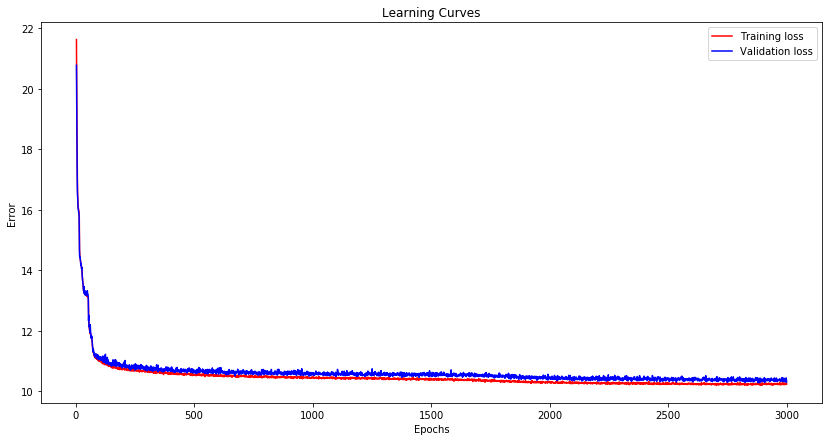

In [37]:
vae_Name='VAE_FC_h2_z60'
vae=vae_FC_h2_z60
train_data=VAE_train(vae, vae_Name)

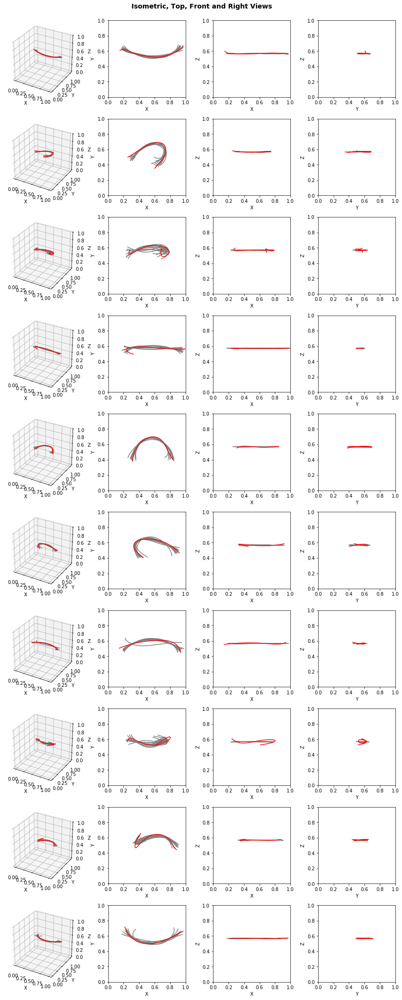

In [38]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=3, Z=15

Model: "model_61"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_31 (Flatten)            (None, 300)          0           input_31[0][0]                   
__________________________________________________________________________________________________
dense_169 (Dense)               (None, 200)          60200       flatten_31[0][0]                 
__________________________________________________________________________________________________
dense_170 (Dense)               (None, 100)          20100       dense_169[0][0]                  
___________________________________________________________________________________________

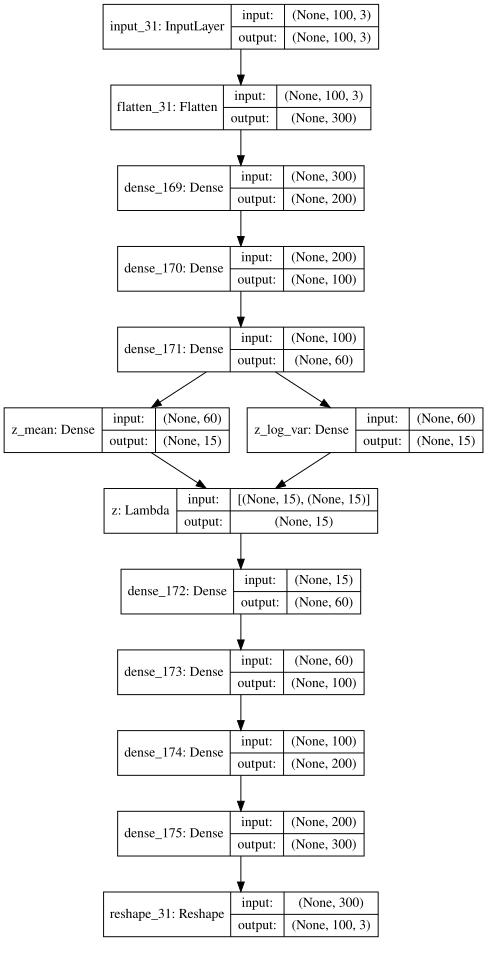

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 28us/step - loss: 62.8877 - reconstruction_loss: 61.8413 - kl_loss: 0.9364 - val_loss: 37.6141 - val_reconstruction_loss: 36.5952 - val_kl_loss: 0.8863

Epoch 00001: val_loss improved from inf to 37.61414, saving model to models_VAE/VAE_FC_h3_z15.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 13us/step - loss: 32.3977 - reconstruction_loss: 30.8517 - kl_loss: 1.4928 - val_loss: 23.2003 - val_reconstruction_loss: 19.8380 - val_kl_loss: 3.2916

Epoch 00002: val_loss improved from 37.61414 to 23.20027, saving model to models_VAE/VAE_FC_h3_z15.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 13us/step - loss: 20.7186 - reconstruction_loss: 17.7868 - kl_loss: 2.9219 - val_loss: 19.2206 - val_reconstruction_loss: 16.5312 - val_kl_loss: 2.6279

Epoch 00003: val_loss improved from 23.20027 to 19.22061, saving model to models_VAE/VAE_FC_h3_z15.h

16067/16067 [==============================] - 0s 13us/step - loss: 11.5232 - reconstruction_loss: 8.1163 - kl_loss: 3.4025 - val_loss: 11.6656 - val_reconstruction_loss: 8.2881 - val_kl_loss: 3.3425

Epoch 00054: val_loss did not improve from 11.49567
Epoch 55/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.3906 - reconstruction_loss: 7.9560 - kl_loss: 3.4328 - val_loss: 11.8613 - val_reconstruction_loss: 8.2048 - val_kl_loss: 3.6325

Epoch 00055: val_loss did not improve from 11.49567
Epoch 56/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.5112 - reconstruction_loss: 8.0594 - kl_loss: 3.4482 - val_loss: 11.5447 - val_reconstruction_loss: 8.1848 - val_kl_loss: 3.3289

Epoch 00056: val_loss did not improve from 11.49567
Epoch 57/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.4084 - reconstruction_loss: 7.9740 - kl_loss: 3.4302 - val_loss: 11.5668 - val_reconstruction_loss: 7.7832 - val_kl_loss: 3.7557


Epoch 00112: val_loss did not improve from 10.71503
Epoch 113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6401 - reconstruction_loss: 6.9986 - kl_loss: 3.6374 - val_loss: 10.7985 - val_reconstruction_loss: 7.1390 - val_kl_loss: 3.6297

Epoch 00113: val_loss did not improve from 10.71503
Epoch 114/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6624 - reconstruction_loss: 7.0384 - kl_loss: 3.6195 - val_loss: 10.8758 - val_reconstruction_loss: 7.2888 - val_kl_loss: 3.5580

Epoch 00114: val_loss did not improve from 10.71503
Epoch 115/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7440 - reconstruction_loss: 7.1117 - kl_loss: 3.6285 - val_loss: 11.0396 - val_reconstruction_loss: 7.3308 - val_kl_loss: 3.6779

Epoch 00115: val_loss did not improve from 10.71503
Epoch 116/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7196 - reconstruction_loss: 7.0972 - kl_loss: 3.6196 - va


Epoch 00142: val_loss did not improve from 10.61666
Epoch 143/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5953 - reconstruction_loss: 6.9370 - kl_loss: 3.6552 - val_loss: 11.2892 - val_reconstruction_loss: 7.6768 - val_kl_loss: 3.5870

Epoch 00143: val_loss did not improve from 10.61666
Epoch 144/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7083 - reconstruction_loss: 7.0860 - kl_loss: 3.6186 - val_loss: 10.7083 - val_reconstruction_loss: 7.0602 - val_kl_loss: 3.6255

Epoch 00144: val_loss did not improve from 10.61666
Epoch 145/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5276 - reconstruction_loss: 6.8901 - kl_loss: 3.6343 - val_loss: 10.8635 - val_reconstruction_loss: 7.1828 - val_kl_loss: 3.6529

Epoch 00145: val_loss did not improve from 10.61666
Epoch 146/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7252 - reconstruction_loss: 7.0749 - kl_loss: 3.6466 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.5328 - reconstruction_loss: 6.8951 - kl_loss: 3.6334 - val_loss: 10.7355 - val_reconstruction_loss: 7.0544 - val_kl_loss: 3.6541

Epoch 00203: val_loss did not improve from 10.58359
Epoch 204/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5612 - reconstruction_loss: 6.9253 - kl_loss: 3.6327 - val_loss: 10.6327 - val_reconstruction_loss: 6.9023 - val_kl_loss: 3.7020

Epoch 00204: val_loss did not improve from 10.58359
Epoch 205/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4939 - reconstruction_loss: 6.8391 - kl_loss: 3.6532 - val_loss: 10.7213 - val_reconstruction_loss: 7.0828 - val_kl_loss: 3.6102

Epoch 00205: val_loss did not improve from 10.58359
Epoch 206/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5386 - reconstruction_loss: 6.8941 - kl_loss: 3.6412 - val_loss: 10.5730 - val_reconstruction_loss: 6.9367 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 13us/step - loss: 10.5020 - reconstruction_loss: 6.8759 - kl_loss: 3.6214 - val_loss: 10.5433 - val_reconstruction_loss: 6.7517 - val_kl_loss: 3.7642

Epoch 00233: val_loss did not improve from 10.49272
Epoch 234/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4567 - reconstruction_loss: 6.7999 - kl_loss: 3.6546 - val_loss: 10.6277 - val_reconstruction_loss: 6.8209 - val_kl_loss: 3.7768

Epoch 00234: val_loss did not improve from 10.49272
Epoch 235/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4970 - reconstruction_loss: 6.8470 - kl_loss: 3.6471 - val_loss: 10.7511 - val_reconstruction_loss: 6.9216 - val_kl_loss: 3.8020

Epoch 00235: val_loss did not improve from 10.49272
Epoch 236/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5175 - reconstruction_loss: 6.8376 - kl_loss: 3.6753 - val_loss: 10.5540 - val_reconstruction_loss: 6.7812 - val_kl_loss: 3.7


Epoch 00293: val_loss improved from 10.48022 to 10.47322, saving model to models_VAE/VAE_FC_h3_z15.hdf5
Epoch 294/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5321 - reconstruction_loss: 6.8751 - kl_loss: 3.6552 - val_loss: 10.5581 - val_reconstruction_loss: 6.8526 - val_kl_loss: 3.6766

Epoch 00294: val_loss did not improve from 10.47322
Epoch 295/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4268 - reconstruction_loss: 6.7521 - kl_loss: 3.6710 - val_loss: 10.4840 - val_reconstruction_loss: 6.8966 - val_kl_loss: 3.5621

Epoch 00295: val_loss did not improve from 10.47322
Epoch 296/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3861 - reconstruction_loss: 6.6993 - kl_loss: 3.6840 - val_loss: 10.5880 - val_reconstruction_loss: 7.0081 - val_kl_loss: 3.5528

Epoch 00296: val_loss did not improve from 10.47322
Epoch 297/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4156 

16067/16067 [==============================] - 0s 13us/step - loss: 10.4384 - reconstruction_loss: 6.7487 - kl_loss: 3.6863 - val_loss: 10.5157 - val_reconstruction_loss: 6.9722 - val_kl_loss: 3.5159

Epoch 00324: val_loss did not improve from 10.43732
Epoch 325/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3387 - reconstruction_loss: 6.6729 - kl_loss: 3.6624 - val_loss: 10.4835 - val_reconstruction_loss: 6.8539 - val_kl_loss: 3.6034

Epoch 00325: val_loss did not improve from 10.43732
Epoch 326/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3980 - reconstruction_loss: 6.7161 - kl_loss: 3.6791 - val_loss: 10.5713 - val_reconstruction_loss: 6.8117 - val_kl_loss: 3.7323

Epoch 00326: val_loss did not improve from 10.43732
Epoch 327/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4763 - reconstruction_loss: 6.8277 - kl_loss: 3.6459 - val_loss: 10.5102 - val_reconstruction_loss: 6.8089 - val_kl_loss: 3.6


Epoch 00354: val_loss did not improve from 10.43732
Epoch 355/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3423 - reconstruction_loss: 6.6612 - kl_loss: 3.6774 - val_loss: 10.4942 - val_reconstruction_loss: 6.9050 - val_kl_loss: 3.5624

Epoch 00355: val_loss did not improve from 10.43732
Epoch 356/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4087 - reconstruction_loss: 6.7339 - kl_loss: 3.6718 - val_loss: 10.5293 - val_reconstruction_loss: 6.9332 - val_kl_loss: 3.5699

Epoch 00356: val_loss did not improve from 10.43732
Epoch 357/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3649 - reconstruction_loss: 6.7013 - kl_loss: 3.6605 - val_loss: 10.5085 - val_reconstruction_loss: 6.8581 - val_kl_loss: 3.6263

Epoch 00357: val_loss did not improve from 10.43732
Epoch 358/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3559 - reconstruction_loss: 6.6798 - kl_loss: 3.6713 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.3672 - reconstruction_loss: 6.6701 - kl_loss: 3.6948 - val_loss: 10.3902 - val_reconstruction_loss: 6.6456 - val_kl_loss: 3.7211

Epoch 00415: val_loss improved from 10.40100 to 10.39023, saving model to models_VAE/VAE_FC_h3_z15.hdf5
Epoch 416/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3213 - reconstruction_loss: 6.6535 - kl_loss: 3.6650 - val_loss: 10.4360 - val_reconstruction_loss: 6.7657 - val_kl_loss: 3.6456

Epoch 00416: val_loss did not improve from 10.39023
Epoch 417/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3086 - reconstruction_loss: 6.6150 - kl_loss: 3.6913 - val_loss: 10.4110 - val_reconstruction_loss: 6.6624 - val_kl_loss: 3.7229

Epoch 00417: val_loss did not improve from 10.39023
Epoch 418/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3287 - reconstruction_loss: 6.6633 - kl_loss: 3.6617 - val_loss: 10.4566 

16067/16067 [==============================] - 0s 13us/step - loss: 10.3940 - reconstruction_loss: 6.6882 - kl_loss: 3.7028 - val_loss: 10.7168 - val_reconstruction_loss: 6.9386 - val_kl_loss: 3.7497

Epoch 00475: val_loss did not improve from 10.33524
Epoch 476/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4682 - reconstruction_loss: 6.7642 - kl_loss: 3.7000 - val_loss: 10.4517 - val_reconstruction_loss: 6.7659 - val_kl_loss: 3.6605

Epoch 00476: val_loss did not improve from 10.33524
Epoch 477/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3449 - reconstruction_loss: 6.6720 - kl_loss: 3.6703 - val_loss: 10.5058 - val_reconstruction_loss: 6.7550 - val_kl_loss: 3.7275

Epoch 00477: val_loss did not improve from 10.33524
Epoch 478/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3409 - reconstruction_loss: 6.6298 - kl_loss: 3.7064 - val_loss: 10.5250 - val_reconstruction_loss: 6.7649 - val_kl_loss: 3.7


Epoch 00505: val_loss did not improve from 10.33524
Epoch 506/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2825 - reconstruction_loss: 6.5825 - kl_loss: 3.6959 - val_loss: 10.3821 - val_reconstruction_loss: 6.7042 - val_kl_loss: 3.6516

Epoch 00506: val_loss did not improve from 10.33524
Epoch 507/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4090 - reconstruction_loss: 6.7122 - kl_loss: 3.6947 - val_loss: 10.5354 - val_reconstruction_loss: 6.8745 - val_kl_loss: 3.6333

Epoch 00507: val_loss did not improve from 10.33524
Epoch 508/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3305 - reconstruction_loss: 6.6463 - kl_loss: 3.6799 - val_loss: 10.3981 - val_reconstruction_loss: 6.6081 - val_kl_loss: 3.7618

Epoch 00508: val_loss did not improve from 10.33524
Epoch 509/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2991 - reconstruction_loss: 6.5837 - kl_loss: 3.7112 - va


Epoch 00566: val_loss did not improve from 10.33383
Epoch 567/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3077 - reconstruction_loss: 6.6170 - kl_loss: 3.6885 - val_loss: 10.4599 - val_reconstruction_loss: 6.6672 - val_kl_loss: 3.7685

Epoch 00567: val_loss did not improve from 10.33383
Epoch 568/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2689 - reconstruction_loss: 6.5631 - kl_loss: 3.7027 - val_loss: 10.4605 - val_reconstruction_loss: 6.8523 - val_kl_loss: 3.5828

Epoch 00568: val_loss did not improve from 10.33383
Epoch 569/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2802 - reconstruction_loss: 6.5639 - kl_loss: 3.7144 - val_loss: 10.3810 - val_reconstruction_loss: 6.7048 - val_kl_loss: 3.6482

Epoch 00569: val_loss did not improve from 10.33383
Epoch 570/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2602 - reconstruction_loss: 6.5580 - kl_loss: 3.6994 - va


Epoch 00627: val_loss did not improve from 10.33383
Epoch 628/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2880 - reconstruction_loss: 6.5643 - kl_loss: 3.7201 - val_loss: 10.4480 - val_reconstruction_loss: 6.7260 - val_kl_loss: 3.6939

Epoch 00628: val_loss did not improve from 10.33383
Epoch 629/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2597 - reconstruction_loss: 6.5521 - kl_loss: 3.7049 - val_loss: 10.3910 - val_reconstruction_loss: 6.6512 - val_kl_loss: 3.7130

Epoch 00629: val_loss did not improve from 10.33383
Epoch 630/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2138 - reconstruction_loss: 6.4913 - kl_loss: 3.7203 - val_loss: 10.4199 - val_reconstruction_loss: 6.5877 - val_kl_loss: 3.8065

Epoch 00630: val_loss did not improve from 10.33383
Epoch 631/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2304 - reconstruction_loss: 6.5424 - kl_loss: 3.6845 - va


Epoch 00688: val_loss did not improve from 10.33383
Epoch 689/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2841 - reconstruction_loss: 6.5718 - kl_loss: 3.7079 - val_loss: 10.4159 - val_reconstruction_loss: 6.6331 - val_kl_loss: 3.7559

Epoch 00689: val_loss did not improve from 10.33383
Epoch 690/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2288 - reconstruction_loss: 6.4888 - kl_loss: 3.7369 - val_loss: 10.3882 - val_reconstruction_loss: 6.6151 - val_kl_loss: 3.7522

Epoch 00690: val_loss did not improve from 10.33383
Epoch 691/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2465 - reconstruction_loss: 6.5010 - kl_loss: 3.7433 - val_loss: 10.4820 - val_reconstruction_loss: 6.7378 - val_kl_loss: 3.7196

Epoch 00691: val_loss did not improve from 10.33383
Epoch 692/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2392 - reconstruction_loss: 6.4928 - kl_loss: 3.7443 - va


Epoch 00718: val_loss did not improve from 10.30586
Epoch 719/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2400 - reconstruction_loss: 6.4771 - kl_loss: 3.7598 - val_loss: 10.3582 - val_reconstruction_loss: 6.5414 - val_kl_loss: 3.7879

Epoch 00719: val_loss did not improve from 10.30586
Epoch 720/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2625 - reconstruction_loss: 6.5166 - kl_loss: 3.7419 - val_loss: 10.4524 - val_reconstruction_loss: 6.7239 - val_kl_loss: 3.7045

Epoch 00720: val_loss did not improve from 10.30586
Epoch 721/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2436 - reconstruction_loss: 6.4873 - kl_loss: 3.7532 - val_loss: 10.3670 - val_reconstruction_loss: 6.5479 - val_kl_loss: 3.7949

Epoch 00721: val_loss did not improve from 10.30586
Epoch 722/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2334 - reconstruction_loss: 6.4758 - kl_loss: 3.7539 - va


Epoch 00779: val_loss did not improve from 10.29258
Epoch 780/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2292 - reconstruction_loss: 6.4466 - kl_loss: 3.7794 - val_loss: 10.2738 - val_reconstruction_loss: 6.4269 - val_kl_loss: 3.8274

Epoch 00780: val_loss improved from 10.29258 to 10.27380, saving model to models_VAE/VAE_FC_h3_z15.hdf5
Epoch 781/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2167 - reconstruction_loss: 6.4329 - kl_loss: 3.7804 - val_loss: 10.5714 - val_reconstruction_loss: 6.6057 - val_kl_loss: 3.9448

Epoch 00781: val_loss did not improve from 10.27380
Epoch 782/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2428 - reconstruction_loss: 6.4739 - kl_loss: 3.7667 - val_loss: 10.3261 - val_reconstruction_loss: 6.5493 - val_kl_loss: 3.7520

Epoch 00782: val_loss did not improve from 10.27380
Epoch 783/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2130 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1953 - reconstruction_loss: 6.3589 - kl_loss: 3.8344 - val_loss: 10.6629 - val_reconstruction_loss: 6.6187 - val_kl_loss: 4.0225

Epoch 00840: val_loss did not improve from 10.26037
Epoch 841/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2821 - reconstruction_loss: 6.4736 - kl_loss: 3.8067 - val_loss: 10.3079 - val_reconstruction_loss: 6.4625 - val_kl_loss: 3.8206

Epoch 00841: val_loss did not improve from 10.26037
Epoch 842/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1673 - reconstruction_loss: 6.3282 - kl_loss: 3.8370 - val_loss: 10.2760 - val_reconstruction_loss: 6.4064 - val_kl_loss: 3.8471

Epoch 00842: val_loss did not improve from 10.26037
Epoch 843/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1642 - reconstruction_loss: 6.3323 - kl_loss: 3.8276 - val_loss: 10.2654 - val_reconstruction_loss: 6.4345 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 13us/step - loss: 10.1531 - reconstruction_loss: 6.2734 - kl_loss: 3.8785 - val_loss: 10.3379 - val_reconstruction_loss: 6.3912 - val_kl_loss: 3.9222

Epoch 00900: val_loss did not improve from 10.22704
Epoch 901/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1615 - reconstruction_loss: 6.2534 - kl_loss: 3.9044 - val_loss: 10.3134 - val_reconstruction_loss: 6.2093 - val_kl_loss: 4.0788

Epoch 00901: val_loss did not improve from 10.22704
Epoch 902/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2010 - reconstruction_loss: 6.3202 - kl_loss: 3.8772 - val_loss: 10.3070 - val_reconstruction_loss: 6.3476 - val_kl_loss: 3.9353

Epoch 00902: val_loss did not improve from 10.22704
Epoch 903/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2103 - reconstruction_loss: 6.3006 - kl_loss: 3.9068 - val_loss: 10.2692 - val_reconstruction_loss: 6.2385 - val_kl_loss: 4.0

16067/16067 [==============================] - 0s 13us/step - loss: 10.1477 - reconstruction_loss: 6.2645 - kl_loss: 3.8802 - val_loss: 10.2287 - val_reconstruction_loss: 6.3649 - val_kl_loss: 3.8384

Epoch 00930: val_loss did not improve from 10.20556
Epoch 931/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0990 - reconstruction_loss: 6.1919 - kl_loss: 3.9048 - val_loss: 10.2190 - val_reconstruction_loss: 6.2993 - val_kl_loss: 3.8923

Epoch 00931: val_loss did not improve from 10.20556
Epoch 932/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1380 - reconstruction_loss: 6.2477 - kl_loss: 3.8878 - val_loss: 10.2989 - val_reconstruction_loss: 6.2683 - val_kl_loss: 4.0050

Epoch 00932: val_loss did not improve from 10.20556
Epoch 933/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1975 - reconstruction_loss: 6.2641 - kl_loss: 3.9312 - val_loss: 10.2290 - val_reconstruction_loss: 6.3163 - val_kl_loss: 3.8


Epoch 00990: val_loss did not improve from 10.18973
Epoch 991/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1117 - reconstruction_loss: 6.1622 - kl_loss: 3.9470 - val_loss: 10.2291 - val_reconstruction_loss: 6.2182 - val_kl_loss: 3.9869

Epoch 00991: val_loss did not improve from 10.18973
Epoch 992/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1252 - reconstruction_loss: 6.2031 - kl_loss: 3.9196 - val_loss: 10.2670 - val_reconstruction_loss: 6.1889 - val_kl_loss: 4.0536

Epoch 00992: val_loss did not improve from 10.18973
Epoch 993/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1708 - reconstruction_loss: 6.2324 - kl_loss: 3.9350 - val_loss: 10.2036 - val_reconstruction_loss: 6.2504 - val_kl_loss: 3.9273

Epoch 00993: val_loss did not improve from 10.18973
Epoch 994/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1707 - reconstruction_loss: 6.2456 - kl_loss: 3.9214 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.1381 - reconstruction_loss: 6.1557 - kl_loss: 3.9800 - val_loss: 10.2986 - val_reconstruction_loss: 6.1508 - val_kl_loss: 4.1237

Epoch 01051: val_loss did not improve from 10.17435
Epoch 1052/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1289 - reconstruction_loss: 6.1656 - kl_loss: 3.9597 - val_loss: 10.2697 - val_reconstruction_loss: 6.2056 - val_kl_loss: 4.0407

Epoch 01052: val_loss did not improve from 10.17435
Epoch 1053/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0813 - reconstruction_loss: 6.1079 - kl_loss: 3.9708 - val_loss: 10.2325 - val_reconstruction_loss: 6.1985 - val_kl_loss: 4.0120

Epoch 01053: val_loss did not improve from 10.17435
Epoch 1054/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2721 - reconstruction_loss: 6.2596 - kl_loss: 4.0105 - val_loss: 10.3189 - val_reconstruction_loss: 6.3517 - val_kl_loss: 


Epoch 01111: val_loss did not improve from 10.13931
Epoch 1112/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1345 - reconstruction_loss: 6.1547 - kl_loss: 3.9766 - val_loss: 10.3019 - val_reconstruction_loss: 6.2771 - val_kl_loss: 3.9982

Epoch 01112: val_loss did not improve from 10.13931
Epoch 1113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1324 - reconstruction_loss: 6.1627 - kl_loss: 3.9657 - val_loss: 10.2664 - val_reconstruction_loss: 6.2037 - val_kl_loss: 4.0386

Epoch 01113: val_loss did not improve from 10.13931
Epoch 1114/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1288 - reconstruction_loss: 6.1869 - kl_loss: 3.9385 - val_loss: 10.1987 - val_reconstruction_loss: 6.2201 - val_kl_loss: 3.9545

Epoch 01114: val_loss did not improve from 10.13931
Epoch 1115/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0859 - reconstruction_loss: 6.1545 - kl_loss: 3.9283 


Epoch 01172: val_loss did not improve from 10.13931
Epoch 1173/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0681 - reconstruction_loss: 6.1274 - kl_loss: 3.9372 - val_loss: 10.1845 - val_reconstruction_loss: 6.2288 - val_kl_loss: 3.9307

Epoch 01173: val_loss did not improve from 10.13931
Epoch 1174/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0685 - reconstruction_loss: 6.1157 - kl_loss: 3.9494 - val_loss: 10.2057 - val_reconstruction_loss: 6.1773 - val_kl_loss: 4.0033

Epoch 01174: val_loss did not improve from 10.13931
Epoch 1175/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1215 - reconstruction_loss: 6.1611 - kl_loss: 3.9569 - val_loss: 10.3649 - val_reconstruction_loss: 6.4596 - val_kl_loss: 3.8778

Epoch 01175: val_loss did not improve from 10.13931
Epoch 1176/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1046 - reconstruction_loss: 6.1350 - kl_loss: 3.9683 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0907 - reconstruction_loss: 6.0738 - kl_loss: 4.0139 - val_loss: 10.3725 - val_reconstruction_loss: 6.3888 - val_kl_loss: 3.9569

Epoch 01233: val_loss did not improve from 10.13886
Epoch 1234/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1355 - reconstruction_loss: 6.1901 - kl_loss: 3.9423 - val_loss: 10.2357 - val_reconstruction_loss: 6.1268 - val_kl_loss: 4.0872

Epoch 01234: val_loss did not improve from 10.13886
Epoch 1235/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1082 - reconstruction_loss: 6.1186 - kl_loss: 3.9874 - val_loss: 10.2669 - val_reconstruction_loss: 6.1348 - val_kl_loss: 4.1077

Epoch 01235: val_loss did not improve from 10.13886
Epoch 1236/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0709 - reconstruction_loss: 6.0763 - kl_loss: 3.9908 - val_loss: 10.2347 - val_reconstruction_loss: 6.2654 - val_kl_loss: 


Epoch 01263: val_loss did not improve from 10.13886
Epoch 1264/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0793 - reconstruction_loss: 6.0943 - kl_loss: 3.9814 - val_loss: 10.2555 - val_reconstruction_loss: 6.2661 - val_kl_loss: 3.9622

Epoch 01264: val_loss did not improve from 10.13886
Epoch 1265/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3191 - reconstruction_loss: 6.3869 - kl_loss: 3.9291 - val_loss: 10.2635 - val_reconstruction_loss: 6.2300 - val_kl_loss: 4.0085

Epoch 01265: val_loss did not improve from 10.13886
Epoch 1266/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1147 - reconstruction_loss: 6.1578 - kl_loss: 3.9531 - val_loss: 10.2430 - val_reconstruction_loss: 6.2368 - val_kl_loss: 3.9837

Epoch 01266: val_loss did not improve from 10.13886
Epoch 1267/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0793 - reconstruction_loss: 6.1094 - kl_loss: 3.9660 


Epoch 01324: val_loss did not improve from 10.13886
Epoch 1325/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0899 - reconstruction_loss: 6.0866 - kl_loss: 4.0006 - val_loss: 10.3108 - val_reconstruction_loss: 6.3332 - val_kl_loss: 3.9528

Epoch 01325: val_loss did not improve from 10.13886
Epoch 1326/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0923 - reconstruction_loss: 6.1056 - kl_loss: 3.9837 - val_loss: 10.1667 - val_reconstruction_loss: 6.1923 - val_kl_loss: 3.9504

Epoch 01326: val_loss did not improve from 10.13886
Epoch 1327/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0474 - reconstruction_loss: 6.0722 - kl_loss: 3.9725 - val_loss: 10.2242 - val_reconstruction_loss: 6.3040 - val_kl_loss: 3.8953

Epoch 01327: val_loss did not improve from 10.13886
Epoch 1328/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0323 - reconstruction_loss: 6.0612 - kl_loss: 3.9679 


Epoch 01385: val_loss did not improve from 10.12393
Epoch 1386/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0816 - reconstruction_loss: 6.0795 - kl_loss: 3.9987 - val_loss: 10.1424 - val_reconstruction_loss: 6.0616 - val_kl_loss: 4.0564

Epoch 01386: val_loss did not improve from 10.12393
Epoch 1387/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0521 - reconstruction_loss: 6.0902 - kl_loss: 3.9576 - val_loss: 10.1525 - val_reconstruction_loss: 5.9999 - val_kl_loss: 4.1294

Epoch 01387: val_loss did not improve from 10.12393
Epoch 1388/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1927 - reconstruction_loss: 6.1993 - kl_loss: 3.9893 - val_loss: 10.1525 - val_reconstruction_loss: 6.1292 - val_kl_loss: 3.9980

Epoch 01388: val_loss did not improve from 10.12393
Epoch 1389/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1128 - reconstruction_loss: 6.1411 - kl_loss: 3.9692 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0657 - reconstruction_loss: 6.0454 - kl_loss: 4.0176 - val_loss: 10.2150 - val_reconstruction_loss: 6.2621 - val_kl_loss: 3.9306

Epoch 01446: val_loss did not improve from 10.11956
Epoch 1447/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0244 - reconstruction_loss: 6.0327 - kl_loss: 3.9890 - val_loss: 10.2276 - val_reconstruction_loss: 6.1314 - val_kl_loss: 4.0718

Epoch 01447: val_loss did not improve from 10.11956
Epoch 1448/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0913 - reconstruction_loss: 6.0765 - kl_loss: 4.0118 - val_loss: 10.1932 - val_reconstruction_loss: 6.0640 - val_kl_loss: 4.1093

Epoch 01448: val_loss did not improve from 10.11956
Epoch 1449/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0204 - reconstruction_loss: 6.0133 - kl_loss: 4.0039 - val_loss: 10.1727 - val_reconstruction_loss: 6.0927 - val_kl_loss: 


Epoch 01476: val_loss did not improve from 10.11956
Epoch 1477/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0740 - reconstruction_loss: 6.0511 - kl_loss: 4.0206 - val_loss: 10.1526 - val_reconstruction_loss: 6.0340 - val_kl_loss: 4.0963

Epoch 01477: val_loss did not improve from 10.11956
Epoch 1478/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0634 - reconstruction_loss: 6.0010 - kl_loss: 4.0592 - val_loss: 10.3359 - val_reconstruction_loss: 6.1972 - val_kl_loss: 4.1134

Epoch 01478: val_loss did not improve from 10.11956
Epoch 1479/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1159 - reconstruction_loss: 6.1193 - kl_loss: 3.9934 - val_loss: 10.2321 - val_reconstruction_loss: 6.0604 - val_kl_loss: 4.1461

Epoch 01479: val_loss did not improve from 10.11956
Epoch 1480/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0230 - reconstruction_loss: 6.0194 - kl_loss: 4.0000 


Epoch 01537: val_loss did not improve from 10.11956
Epoch 1538/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1699 - reconstruction_loss: 6.2255 - kl_loss: 3.9417 - val_loss: 10.2996 - val_reconstruction_loss: 6.3632 - val_kl_loss: 3.9128

Epoch 01538: val_loss did not improve from 10.11956
Epoch 1539/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3477 - reconstruction_loss: 6.3681 - kl_loss: 3.9769 - val_loss: 10.6778 - val_reconstruction_loss: 6.8991 - val_kl_loss: 3.7538

Epoch 01539: val_loss did not improve from 10.11956
Epoch 1540/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2835 - reconstruction_loss: 6.3672 - kl_loss: 3.9128 - val_loss: 10.4448 - val_reconstruction_loss: 6.3447 - val_kl_loss: 4.0752

Epoch 01540: val_loss did not improve from 10.11956
Epoch 1541/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1719 - reconstruction_loss: 6.2119 - kl_loss: 3.9575 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0280 - reconstruction_loss: 5.9856 - kl_loss: 4.0400 - val_loss: 10.2234 - val_reconstruction_loss: 6.1241 - val_kl_loss: 4.0755

Epoch 01598: val_loss did not improve from 10.11815
Epoch 1599/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1048 - reconstruction_loss: 6.1147 - kl_loss: 3.9869 - val_loss: 10.1510 - val_reconstruction_loss: 6.0707 - val_kl_loss: 4.0571

Epoch 01599: val_loss did not improve from 10.11815
Epoch 1600/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0433 - reconstruction_loss: 6.0345 - kl_loss: 4.0048 - val_loss: 10.2615 - val_reconstruction_loss: 6.2848 - val_kl_loss: 3.9521

Epoch 01600: val_loss did not improve from 10.11815
Epoch 1601/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1079 - reconstruction_loss: 6.1293 - kl_loss: 3.9760 - val_loss: 10.2990 - val_reconstruction_loss: 6.2838 - val_kl_loss: 


Epoch 01628: val_loss did not improve from 10.11815
Epoch 1629/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1289 - reconstruction_loss: 6.1311 - kl_loss: 3.9962 - val_loss: 10.2389 - val_reconstruction_loss: 6.1309 - val_kl_loss: 4.0844

Epoch 01629: val_loss did not improve from 10.11815
Epoch 1630/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1422 - reconstruction_loss: 6.1130 - kl_loss: 4.0265 - val_loss: 10.2650 - val_reconstruction_loss: 6.2091 - val_kl_loss: 4.0333

Epoch 01630: val_loss did not improve from 10.11815
Epoch 1631/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0326 - reconstruction_loss: 6.0336 - kl_loss: 3.9974 - val_loss: 10.2445 - val_reconstruction_loss: 6.1450 - val_kl_loss: 4.0761

Epoch 01631: val_loss did not improve from 10.11815
Epoch 1632/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0458 - reconstruction_loss: 6.0048 - kl_loss: 4.0379 


Epoch 01689: val_loss did not improve from 10.09992
Epoch 1690/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0595 - reconstruction_loss: 6.0159 - kl_loss: 4.0406 - val_loss: 10.2228 - val_reconstruction_loss: 6.1564 - val_kl_loss: 4.0432

Epoch 01690: val_loss did not improve from 10.09992
Epoch 1691/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0441 - reconstruction_loss: 5.9888 - kl_loss: 4.0519 - val_loss: 10.2235 - val_reconstruction_loss: 6.1305 - val_kl_loss: 4.0658

Epoch 01691: val_loss did not improve from 10.09992
Epoch 1692/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0315 - reconstruction_loss: 6.0287 - kl_loss: 3.9988 - val_loss: 10.1881 - val_reconstruction_loss: 6.0429 - val_kl_loss: 4.1182

Epoch 01692: val_loss did not improve from 10.09992
Epoch 1693/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9969 - reconstruction_loss: 5.9508 - kl_loss: 4.0428 -


Epoch 01750: val_loss did not improve from 10.09992
Epoch 1751/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6699 - reconstruction_loss: 6.6898 - kl_loss: 3.9771 - val_loss: 10.8139 - val_reconstruction_loss: 6.7133 - val_kl_loss: 4.0752

Epoch 01751: val_loss did not improve from 10.09992
Epoch 1752/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5872 - reconstruction_loss: 6.5875 - kl_loss: 3.9964 - val_loss: 10.6647 - val_reconstruction_loss: 6.6237 - val_kl_loss: 4.0138

Epoch 01752: val_loss did not improve from 10.09992
Epoch 1753/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5327 - reconstruction_loss: 6.5830 - kl_loss: 3.9461 - val_loss: 10.6166 - val_reconstruction_loss: 6.5411 - val_kl_loss: 4.0494

Epoch 01753: val_loss did not improve from 10.09992
Epoch 1754/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5127 - reconstruction_loss: 6.5524 - kl_loss: 3.9565 


Epoch 01811: val_loss did not improve from 10.09992
Epoch 1812/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3056 - reconstruction_loss: 6.2881 - kl_loss: 4.0148 - val_loss: 10.4966 - val_reconstruction_loss: 6.4504 - val_kl_loss: 4.0229

Epoch 01812: val_loss did not improve from 10.09992
Epoch 1813/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3701 - reconstruction_loss: 6.3333 - kl_loss: 4.0336 - val_loss: 10.4089 - val_reconstruction_loss: 6.3937 - val_kl_loss: 3.9890

Epoch 01813: val_loss did not improve from 10.09992
Epoch 1814/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2973 - reconstruction_loss: 6.3089 - kl_loss: 3.9854 - val_loss: 10.3933 - val_reconstruction_loss: 6.3109 - val_kl_loss: 4.0533

Epoch 01814: val_loss did not improve from 10.09992
Epoch 1815/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3340 - reconstruction_loss: 6.3325 - kl_loss: 3.9982 


Epoch 01872: val_loss did not improve from 10.09992
Epoch 1873/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3060 - reconstruction_loss: 6.2428 - kl_loss: 4.0596 - val_loss: 10.5203 - val_reconstruction_loss: 6.3986 - val_kl_loss: 4.0946

Epoch 01873: val_loss did not improve from 10.09992
Epoch 1874/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2909 - reconstruction_loss: 6.2517 - kl_loss: 4.0370 - val_loss: 10.3893 - val_reconstruction_loss: 6.3137 - val_kl_loss: 4.0503

Epoch 01874: val_loss did not improve from 10.09992
Epoch 1875/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2594 - reconstruction_loss: 6.2243 - kl_loss: 4.0321 - val_loss: 10.4372 - val_reconstruction_loss: 6.2792 - val_kl_loss: 4.1347

Epoch 01875: val_loss did not improve from 10.09992
Epoch 1876/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2676 - reconstruction_loss: 6.2421 - kl_loss: 4.0240 


Epoch 01933: val_loss did not improve from 10.09992
Epoch 1934/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2866 - reconstruction_loss: 6.2531 - kl_loss: 4.0308 - val_loss: 10.7054 - val_reconstruction_loss: 6.4857 - val_kl_loss: 4.1928

Epoch 01934: val_loss did not improve from 10.09992
Epoch 1935/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3137 - reconstruction_loss: 6.2726 - kl_loss: 4.0382 - val_loss: 10.3047 - val_reconstruction_loss: 6.2008 - val_kl_loss: 4.0785

Epoch 01935: val_loss did not improve from 10.09992
Epoch 1936/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2023 - reconstruction_loss: 6.1497 - kl_loss: 4.0496 - val_loss: 10.3143 - val_reconstruction_loss: 6.2206 - val_kl_loss: 4.0696

Epoch 01936: val_loss did not improve from 10.09992
Epoch 1937/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1549 - reconstruction_loss: 6.1527 - kl_loss: 3.9991 


Epoch 01994: val_loss did not improve from 10.09992
Epoch 1995/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2044 - reconstruction_loss: 6.1752 - kl_loss: 4.0247 - val_loss: 10.3336 - val_reconstruction_loss: 6.2159 - val_kl_loss: 4.0918

Epoch 01995: val_loss did not improve from 10.09992
Epoch 1996/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1808 - reconstruction_loss: 6.1336 - kl_loss: 4.0455 - val_loss: 10.3777 - val_reconstruction_loss: 6.2269 - val_kl_loss: 4.1247

Epoch 01996: val_loss did not improve from 10.09992
Epoch 1997/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1530 - reconstruction_loss: 6.0985 - kl_loss: 4.0514 - val_loss: 10.2421 - val_reconstruction_loss: 6.1480 - val_kl_loss: 4.0697

Epoch 01997: val_loss did not improve from 10.09992
Epoch 1998/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1774 - reconstruction_loss: 6.1355 - kl_loss: 4.0384 


Epoch 02055: val_loss did not improve from 10.09992
Epoch 2056/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2068 - reconstruction_loss: 6.1478 - kl_loss: 4.0560 - val_loss: 10.4142 - val_reconstruction_loss: 6.2833 - val_kl_loss: 4.1040

Epoch 02056: val_loss did not improve from 10.09992
Epoch 2057/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2859 - reconstruction_loss: 6.2166 - kl_loss: 4.0669 - val_loss: 10.4166 - val_reconstruction_loss: 6.4017 - val_kl_loss: 3.9900

Epoch 02057: val_loss did not improve from 10.09992
Epoch 2058/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2276 - reconstruction_loss: 6.2263 - kl_loss: 3.9978 - val_loss: 10.4410 - val_reconstruction_loss: 6.2479 - val_kl_loss: 4.1673

Epoch 02058: val_loss did not improve from 10.09992
Epoch 2059/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3077 - reconstruction_loss: 6.2089 - kl_loss: 4.0949 


Epoch 02116: val_loss did not improve from 10.09992
Epoch 2117/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2052 - reconstruction_loss: 6.0899 - kl_loss: 4.1119 - val_loss: 10.3338 - val_reconstruction_loss: 6.0572 - val_kl_loss: 4.2519

Epoch 02117: val_loss did not improve from 10.09992
Epoch 2118/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2462 - reconstruction_loss: 6.1630 - kl_loss: 4.0806 - val_loss: 10.3748 - val_reconstruction_loss: 6.1632 - val_kl_loss: 4.1859

Epoch 02118: val_loss did not improve from 10.09992
Epoch 2119/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1808 - reconstruction_loss: 6.0965 - kl_loss: 4.0825 - val_loss: 10.3646 - val_reconstruction_loss: 6.2145 - val_kl_loss: 4.1269

Epoch 02119: val_loss did not improve from 10.09992
Epoch 2120/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2222 - reconstruction_loss: 6.1513 - kl_loss: 4.0667 


Epoch 02177: val_loss did not improve from 10.09992
Epoch 2178/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1276 - reconstruction_loss: 6.0670 - kl_loss: 4.0584 - val_loss: 10.2958 - val_reconstruction_loss: 6.2589 - val_kl_loss: 4.0141

Epoch 02178: val_loss did not improve from 10.09992
Epoch 2179/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1798 - reconstruction_loss: 6.1360 - kl_loss: 4.0406 - val_loss: 10.2770 - val_reconstruction_loss: 6.1130 - val_kl_loss: 4.1396

Epoch 02179: val_loss did not improve from 10.09992
Epoch 2180/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1616 - reconstruction_loss: 6.0693 - kl_loss: 4.0896 - val_loss: 10.3549 - val_reconstruction_loss: 6.2204 - val_kl_loss: 4.1135

Epoch 02180: val_loss did not improve from 10.09992
Epoch 2181/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2157 - reconstruction_loss: 6.1492 - kl_loss: 4.0632 


Epoch 02238: val_loss did not improve from 10.09992
Epoch 2239/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3018 - reconstruction_loss: 6.2258 - kl_loss: 4.0739 - val_loss: 10.5743 - val_reconstruction_loss: 6.5030 - val_kl_loss: 4.0476

Epoch 02239: val_loss did not improve from 10.09992
Epoch 2240/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4061 - reconstruction_loss: 6.2897 - kl_loss: 4.1141 - val_loss: 10.5803 - val_reconstruction_loss: 6.5410 - val_kl_loss: 4.0118

Epoch 02240: val_loss did not improve from 10.09992
Epoch 2241/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4279 - reconstruction_loss: 6.3578 - kl_loss: 4.0685 - val_loss: 11.2208 - val_reconstruction_loss: 6.7775 - val_kl_loss: 4.4152

Epoch 02241: val_loss did not improve from 10.09992
Epoch 2242/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4819 - reconstruction_loss: 6.4069 - kl_loss: 4.0723 


Epoch 02299: val_loss did not improve from 10.09992
Epoch 2300/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1282 - reconstruction_loss: 6.0373 - kl_loss: 4.0890 - val_loss: 10.3109 - val_reconstruction_loss: 6.2423 - val_kl_loss: 4.0434

Epoch 02300: val_loss did not improve from 10.09992
Epoch 2301/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1295 - reconstruction_loss: 6.0414 - kl_loss: 4.0850 - val_loss: 10.3448 - val_reconstruction_loss: 6.1872 - val_kl_loss: 4.1309

Epoch 02301: val_loss did not improve from 10.09992
Epoch 2302/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1257 - reconstruction_loss: 6.0470 - kl_loss: 4.0753 - val_loss: 10.2666 - val_reconstruction_loss: 6.1021 - val_kl_loss: 4.1407

Epoch 02302: val_loss did not improve from 10.09992
Epoch 2303/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1232 - reconstruction_loss: 6.0569 - kl_loss: 4.0636 


Epoch 02360: val_loss did not improve from 10.09992
Epoch 2361/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1231 - reconstruction_loss: 6.0320 - kl_loss: 4.0889 - val_loss: 10.2974 - val_reconstruction_loss: 6.2196 - val_kl_loss: 4.0540

Epoch 02361: val_loss did not improve from 10.09992
Epoch 2362/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1786 - reconstruction_loss: 6.0995 - kl_loss: 4.0766 - val_loss: 10.2927 - val_reconstruction_loss: 6.1668 - val_kl_loss: 4.1015

Epoch 02362: val_loss did not improve from 10.09992
Epoch 2363/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1716 - reconstruction_loss: 6.1015 - kl_loss: 4.0677 - val_loss: 10.3591 - val_reconstruction_loss: 6.2768 - val_kl_loss: 4.0590

Epoch 02363: val_loss did not improve from 10.09992
Epoch 2364/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1840 - reconstruction_loss: 6.1112 - kl_loss: 4.0699 


Epoch 02421: val_loss did not improve from 10.09992
Epoch 2422/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2131 - reconstruction_loss: 6.1075 - kl_loss: 4.1032 - val_loss: 10.3072 - val_reconstruction_loss: 6.1961 - val_kl_loss: 4.0884

Epoch 02422: val_loss did not improve from 10.09992
Epoch 2423/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1155 - reconstruction_loss: 6.0494 - kl_loss: 4.0635 - val_loss: 10.2981 - val_reconstruction_loss: 6.1895 - val_kl_loss: 4.0862

Epoch 02423: val_loss did not improve from 10.09992
Epoch 2424/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2155 - reconstruction_loss: 6.1514 - kl_loss: 4.0604 - val_loss: 10.3140 - val_reconstruction_loss: 6.1804 - val_kl_loss: 4.1147

Epoch 02424: val_loss did not improve from 10.09992
Epoch 2425/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1763 - reconstruction_loss: 6.1280 - kl_loss: 4.0454 


Epoch 02482: val_loss did not improve from 10.09992
Epoch 2483/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1596 - reconstruction_loss: 6.1101 - kl_loss: 4.0469 - val_loss: 10.3507 - val_reconstruction_loss: 6.2560 - val_kl_loss: 4.0687

Epoch 02483: val_loss did not improve from 10.09992
Epoch 2484/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1646 - reconstruction_loss: 6.1174 - kl_loss: 4.0443 - val_loss: 10.2812 - val_reconstruction_loss: 6.1653 - val_kl_loss: 4.0944

Epoch 02484: val_loss did not improve from 10.09992
Epoch 2485/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1519 - reconstruction_loss: 6.0387 - kl_loss: 4.1117 - val_loss: 10.2738 - val_reconstruction_loss: 6.1228 - val_kl_loss: 4.1272

Epoch 02485: val_loss did not improve from 10.09992
Epoch 2486/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0735 - reconstruction_loss: 6.0094 - kl_loss: 4.0602 


Epoch 02543: val_loss did not improve from 10.09992
Epoch 2544/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1901 - reconstruction_loss: 6.1004 - kl_loss: 4.0864 - val_loss: 10.4087 - val_reconstruction_loss: 6.2147 - val_kl_loss: 4.1707

Epoch 02544: val_loss did not improve from 10.09992
Epoch 2545/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1605 - reconstruction_loss: 6.0782 - kl_loss: 4.0797 - val_loss: 10.2387 - val_reconstruction_loss: 6.0352 - val_kl_loss: 4.1788

Epoch 02545: val_loss did not improve from 10.09992
Epoch 2546/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0780 - reconstruction_loss: 5.9811 - kl_loss: 4.0937 - val_loss: 10.2097 - val_reconstruction_loss: 6.0574 - val_kl_loss: 4.1305

Epoch 02546: val_loss did not improve from 10.09992
Epoch 2547/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1011 - reconstruction_loss: 5.9769 - kl_loss: 4.1215 


Epoch 02604: val_loss did not improve from 10.09992
Epoch 2605/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1770 - reconstruction_loss: 6.1082 - kl_loss: 4.0663 - val_loss: 10.2180 - val_reconstruction_loss: 6.1705 - val_kl_loss: 4.0223

Epoch 02605: val_loss did not improve from 10.09992
Epoch 2606/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1034 - reconstruction_loss: 6.0290 - kl_loss: 4.0709 - val_loss: 10.2657 - val_reconstruction_loss: 6.1501 - val_kl_loss: 4.0916

Epoch 02606: val_loss did not improve from 10.09992
Epoch 2607/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1175 - reconstruction_loss: 6.0429 - kl_loss: 4.0716 - val_loss: 10.2507 - val_reconstruction_loss: 6.0567 - val_kl_loss: 4.1700

Epoch 02607: val_loss did not improve from 10.09992
Epoch 2608/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0683 - reconstruction_loss: 6.0235 - kl_loss: 4.0413 


Epoch 02665: val_loss did not improve from 10.09992
Epoch 2666/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1410 - reconstruction_loss: 6.0068 - kl_loss: 4.1315 - val_loss: 10.2230 - val_reconstruction_loss: 6.0384 - val_kl_loss: 4.1614

Epoch 02666: val_loss did not improve from 10.09992
Epoch 2667/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0858 - reconstruction_loss: 5.9969 - kl_loss: 4.0871 - val_loss: 10.2213 - val_reconstruction_loss: 6.0283 - val_kl_loss: 4.1687

Epoch 02667: val_loss did not improve from 10.09992
Epoch 2668/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0738 - reconstruction_loss: 5.9637 - kl_loss: 4.1075 - val_loss: 10.1789 - val_reconstruction_loss: 6.1386 - val_kl_loss: 4.0168

Epoch 02668: val_loss did not improve from 10.09992
Epoch 2669/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0869 - reconstruction_loss: 5.9979 - kl_loss: 4.0866 


Epoch 02726: val_loss did not improve from 10.09992
Epoch 2727/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2955 - reconstruction_loss: 6.1789 - kl_loss: 4.1134 - val_loss: 10.4818 - val_reconstruction_loss: 6.3235 - val_kl_loss: 4.1332

Epoch 02727: val_loss did not improve from 10.09992
Epoch 2728/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5267 - reconstruction_loss: 6.4275 - kl_loss: 4.0957 - val_loss: 10.7740 - val_reconstruction_loss: 6.5991 - val_kl_loss: 4.1472

Epoch 02728: val_loss did not improve from 10.09992
Epoch 2729/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6002 - reconstruction_loss: 6.5048 - kl_loss: 4.0927 - val_loss: 10.5611 - val_reconstruction_loss: 6.4130 - val_kl_loss: 4.1225

Epoch 02729: val_loss did not improve from 10.09992
Epoch 2730/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2859 - reconstruction_loss: 6.1916 - kl_loss: 4.0908 


Epoch 02787: val_loss did not improve from 10.09992
Epoch 2788/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1683 - reconstruction_loss: 6.0941 - kl_loss: 4.0705 - val_loss: 10.2800 - val_reconstruction_loss: 6.1426 - val_kl_loss: 4.1131

Epoch 02788: val_loss did not improve from 10.09992
Epoch 2789/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2828 - reconstruction_loss: 6.1739 - kl_loss: 4.1059 - val_loss: 10.4556 - val_reconstruction_loss: 6.2972 - val_kl_loss: 4.1361

Epoch 02789: val_loss did not improve from 10.09992
Epoch 2790/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3385 - reconstruction_loss: 6.2582 - kl_loss: 4.0753 - val_loss: 10.3379 - val_reconstruction_loss: 6.1165 - val_kl_loss: 4.1978

Epoch 02790: val_loss did not improve from 10.09992
Epoch 2791/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3652 - reconstruction_loss: 6.2076 - kl_loss: 4.1547 


Epoch 02848: val_loss did not improve from 10.09992
Epoch 2849/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2565 - reconstruction_loss: 6.1964 - kl_loss: 4.0564 - val_loss: 10.4234 - val_reconstruction_loss: 6.1970 - val_kl_loss: 4.2011

Epoch 02849: val_loss did not improve from 10.09992
Epoch 2850/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2622 - reconstruction_loss: 6.1550 - kl_loss: 4.1074 - val_loss: 10.3403 - val_reconstruction_loss: 6.2649 - val_kl_loss: 4.0501

Epoch 02850: val_loss did not improve from 10.09992
Epoch 2851/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1594 - reconstruction_loss: 6.0613 - kl_loss: 4.0947 - val_loss: 10.2234 - val_reconstruction_loss: 6.0488 - val_kl_loss: 4.1518

Epoch 02851: val_loss did not improve from 10.09992
Epoch 2852/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0845 - reconstruction_loss: 5.9803 - kl_loss: 4.1016 


Epoch 02909: val_loss did not improve from 10.09992
Epoch 2910/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1546 - reconstruction_loss: 6.0728 - kl_loss: 4.0802 - val_loss: 10.2485 - val_reconstruction_loss: 6.1324 - val_kl_loss: 4.0924

Epoch 02910: val_loss did not improve from 10.09992
Epoch 2911/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1329 - reconstruction_loss: 6.0332 - kl_loss: 4.0962 - val_loss: 10.2849 - val_reconstruction_loss: 5.9777 - val_kl_loss: 4.2846

Epoch 02911: val_loss did not improve from 10.09992
Epoch 2912/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1370 - reconstruction_loss: 6.0367 - kl_loss: 4.0975 - val_loss: 10.2674 - val_reconstruction_loss: 6.1198 - val_kl_loss: 4.1213

Epoch 02912: val_loss did not improve from 10.09992
Epoch 2913/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1229 - reconstruction_loss: 6.0214 - kl_loss: 4.0978 


Epoch 02970: val_loss did not improve from 10.09992
Epoch 2971/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0462 - reconstruction_loss: 5.9596 - kl_loss: 4.0833 - val_loss: 10.1858 - val_reconstruction_loss: 6.0114 - val_kl_loss: 4.1517

Epoch 02971: val_loss did not improve from 10.09992
Epoch 2972/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1087 - reconstruction_loss: 5.9971 - kl_loss: 4.1092 - val_loss: 10.2726 - val_reconstruction_loss: 6.0720 - val_kl_loss: 4.1738

Epoch 02972: val_loss did not improve from 10.09992
Epoch 2973/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1342 - reconstruction_loss: 5.9788 - kl_loss: 4.1522 - val_loss: 10.2665 - val_reconstruction_loss: 6.1398 - val_kl_loss: 4.1049

Epoch 02973: val_loss did not improve from 10.09992
Epoch 2974/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0676 - reconstruction_loss: 5.9823 - kl_loss: 4.0829 

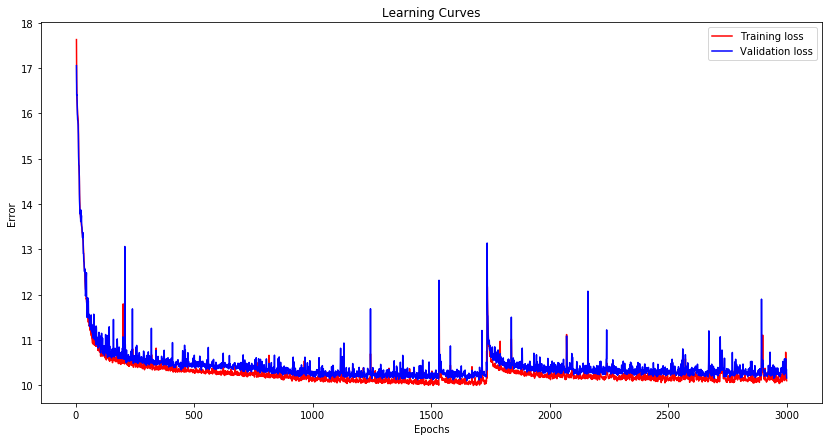

In [39]:
vae_Name='VAE_FC_h3_z15'
vae=vae_FC_h3_z15
train_data=VAE_train(vae, vae_Name)

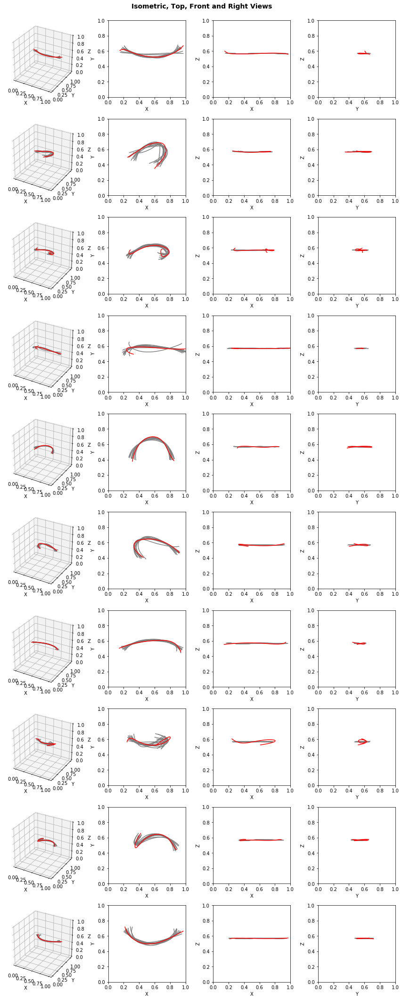

In [40]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=3, Z=30

Model: "model_63"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_32 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_32 (Flatten)            (None, 300)          0           input_32[0][0]                   
__________________________________________________________________________________________________
dense_176 (Dense)               (None, 200)          60200       flatten_32[0][0]                 
__________________________________________________________________________________________________
dense_177 (Dense)               (None, 100)          20100       dense_176[0][0]                  
___________________________________________________________________________________________

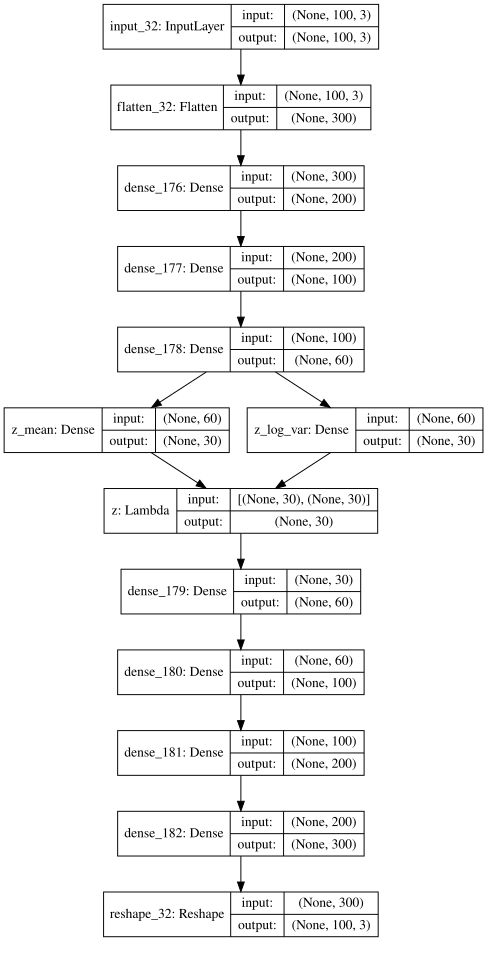

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 28us/step - loss: 62.5538 - reconstruction_loss: 61.8480 - kl_loss: 0.5937 - val_loss: 38.2268 - val_reconstruction_loss: 37.8439 - val_kl_loss: 0.2496

Epoch 00001: val_loss improved from inf to 38.22677, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 13us/step - loss: 35.8620 - reconstruction_loss: 35.6173 - kl_loss: 0.2244 - val_loss: 33.6349 - val_reconstruction_loss: 33.3925 - val_kl_loss: 0.1296

Epoch 00002: val_loss improved from 38.22677 to 33.63494, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 14us/step - loss: 32.4878 - reconstruction_loss: 32.2849 - kl_loss: 0.1893 - val_loss: 30.8750 - val_reconstruction_loss: 30.3793 - val_kl_loss: 0.3972

Epoch 00003: val_loss improved from 33.63494 to 30.87499, saving model to models_VAE/VAE_FC_h3_z30.h

16067/16067 [==============================] - 0s 13us/step - loss: 14.1247 - reconstruction_loss: 11.8164 - kl_loss: 2.3030 - val_loss: 14.0067 - val_reconstruction_loss: 11.5410 - val_kl_loss: 2.4165

Epoch 00027: val_loss improved from 14.47724 to 14.00668, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.8955 - reconstruction_loss: 11.4904 - kl_loss: 2.4002 - val_loss: 13.9486 - val_reconstruction_loss: 11.5799 - val_kl_loss: 2.3169

Epoch 00028: val_loss improved from 14.00668 to 13.94859, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 13us/step - loss: 13.8715 - reconstruction_loss: 11.4657 - kl_loss: 2.3982 - val_loss: 13.8013 - val_reconstruction_loss: 11.3427 - val_kl_loss: 2.4152

Epoch 00029: val_loss improved from 13.94859 to 13.80131, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 30/3000
16067/16067 [========================


Epoch 00053: val_loss did not improve from 11.95202
Epoch 54/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.8316 - reconstruction_loss: 8.6430 - kl_loss: 3.1866 - val_loss: 12.0052 - val_reconstruction_loss: 9.0313 - val_kl_loss: 2.9372

Epoch 00054: val_loss did not improve from 11.95202
Epoch 55/3000
16067/16067 [==============================] - 0s 14us/step - loss: 11.8627 - reconstruction_loss: 8.6830 - kl_loss: 3.1739 - val_loss: 11.8443 - val_reconstruction_loss: 8.6101 - val_kl_loss: 3.2014

Epoch 00055: val_loss improved from 11.95202 to 11.84427, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.6994 - reconstruction_loss: 8.5065 - kl_loss: 3.1898 - val_loss: 11.8208 - val_reconstruction_loss: 8.5623 - val_kl_loss: 3.2239

Epoch 00056: val_loss improved from 11.84427 to 11.82084, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 57/3000
16067/16067 [===============


Epoch 00081: val_loss did not improve from 11.18536
Epoch 82/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.0101 - reconstruction_loss: 7.5309 - kl_loss: 3.4755 - val_loss: 11.3867 - val_reconstruction_loss: 7.9185 - val_kl_loss: 3.4392

Epoch 00082: val_loss did not improve from 11.18536
Epoch 83/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.9862 - reconstruction_loss: 7.5030 - kl_loss: 3.4780 - val_loss: 11.0901 - val_reconstruction_loss: 7.4843 - val_kl_loss: 3.5780

Epoch 00083: val_loss improved from 11.18536 to 11.09006, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 84/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.9698 - reconstruction_loss: 7.4377 - kl_loss: 3.5275 - val_loss: 11.1090 - val_reconstruction_loss: 7.5965 - val_kl_loss: 3.4818

Epoch 00084: val_loss did not improve from 11.09006
Epoch 85/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.9580 - re


Epoch 00110: val_loss did not improve from 10.82444
Epoch 111/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7354 - reconstruction_loss: 7.1643 - kl_loss: 3.5685 - val_loss: 10.8483 - val_reconstruction_loss: 7.2069 - val_kl_loss: 3.6159

Epoch 00111: val_loss did not improve from 10.82444
Epoch 112/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7462 - reconstruction_loss: 7.1490 - kl_loss: 3.5937 - val_loss: 10.9452 - val_reconstruction_loss: 7.3845 - val_kl_loss: 3.5291

Epoch 00112: val_loss did not improve from 10.82444
Epoch 113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7410 - reconstruction_loss: 7.1615 - kl_loss: 3.5794 - val_loss: 10.7945 - val_reconstruction_loss: 7.2808 - val_kl_loss: 3.4849

Epoch 00113: val_loss improved from 10.82444 to 10.79452, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 114/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7722 


Epoch 00140: val_loss improved from 10.69612 to 10.67888, saving model to models_VAE/VAE_FC_h3_z30.hdf5
Epoch 141/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5888 - reconstruction_loss: 6.9804 - kl_loss: 3.6069 - val_loss: 10.7829 - val_reconstruction_loss: 7.3112 - val_kl_loss: 3.4403

Epoch 00141: val_loss did not improve from 10.67888
Epoch 142/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6044 - reconstruction_loss: 6.9877 - kl_loss: 3.6137 - val_loss: 10.8789 - val_reconstruction_loss: 7.1969 - val_kl_loss: 3.6557

Epoch 00142: val_loss did not improve from 10.67888
Epoch 143/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6722 - reconstruction_loss: 7.0698 - kl_loss: 3.5987 - val_loss: 10.6875 - val_reconstruction_loss: 6.9754 - val_kl_loss: 3.6863

Epoch 00143: val_loss did not improve from 10.67888
Epoch 144/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6435 


Epoch 00170: val_loss did not improve from 10.63637
Epoch 171/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5541 - reconstruction_loss: 6.9115 - kl_loss: 3.6392 - val_loss: 10.6691 - val_reconstruction_loss: 7.0225 - val_kl_loss: 3.6190

Epoch 00171: val_loss did not improve from 10.63637
Epoch 172/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5690 - reconstruction_loss: 6.9348 - kl_loss: 3.6336 - val_loss: 10.7675 - val_reconstruction_loss: 7.3364 - val_kl_loss: 3.4034

Epoch 00172: val_loss did not improve from 10.63637
Epoch 173/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5344 - reconstruction_loss: 6.9074 - kl_loss: 3.6240 - val_loss: 10.7229 - val_reconstruction_loss: 7.1521 - val_kl_loss: 3.5433

Epoch 00173: val_loss did not improve from 10.63637
Epoch 174/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5505 - reconstruction_loss: 6.9061 - kl_loss: 3.6410 - va


Epoch 00200: val_loss did not improve from 10.53673
Epoch 201/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4978 - reconstruction_loss: 6.8169 - kl_loss: 3.6777 - val_loss: 10.6460 - val_reconstruction_loss: 6.9780 - val_kl_loss: 3.6431

Epoch 00201: val_loss did not improve from 10.53673
Epoch 202/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4884 - reconstruction_loss: 6.8383 - kl_loss: 3.6476 - val_loss: 10.5943 - val_reconstruction_loss: 6.8651 - val_kl_loss: 3.7038

Epoch 00202: val_loss did not improve from 10.53673
Epoch 203/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4811 - reconstruction_loss: 6.8186 - kl_loss: 3.6594 - val_loss: 10.5819 - val_reconstruction_loss: 6.9111 - val_kl_loss: 3.6476

Epoch 00203: val_loss did not improve from 10.53673
Epoch 204/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4917 - reconstruction_loss: 6.8407 - kl_loss: 3.6479 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.4623 - reconstruction_loss: 6.8033 - kl_loss: 3.6553 - val_loss: 10.5590 - val_reconstruction_loss: 6.8910 - val_kl_loss: 3.6422

Epoch 00231: val_loss did not improve from 10.51036
Epoch 232/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4853 - reconstruction_loss: 6.8024 - kl_loss: 3.6797 - val_loss: 10.6362 - val_reconstruction_loss: 6.9242 - val_kl_loss: 3.6871

Epoch 00232: val_loss did not improve from 10.51036
Epoch 233/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4987 - reconstruction_loss: 6.8589 - kl_loss: 3.6356 - val_loss: 10.7076 - val_reconstruction_loss: 7.0564 - val_kl_loss: 3.6256

Epoch 00233: val_loss did not improve from 10.51036
Epoch 234/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5156 - reconstruction_loss: 6.8294 - kl_loss: 3.6842 - val_loss: 10.5865 - val_reconstruction_loss: 6.9006 - val_kl_loss: 3.6


Epoch 00291: val_loss did not improve from 10.45929
Epoch 292/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4135 - reconstruction_loss: 6.7640 - kl_loss: 3.6462 - val_loss: 10.6598 - val_reconstruction_loss: 6.9444 - val_kl_loss: 3.6879

Epoch 00292: val_loss did not improve from 10.45929
Epoch 293/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4990 - reconstruction_loss: 6.8076 - kl_loss: 3.6872 - val_loss: 10.5101 - val_reconstruction_loss: 6.7977 - val_kl_loss: 3.6875

Epoch 00293: val_loss did not improve from 10.45929
Epoch 294/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4094 - reconstruction_loss: 6.7449 - kl_loss: 3.6625 - val_loss: 10.5219 - val_reconstruction_loss: 6.7680 - val_kl_loss: 3.7292

Epoch 00294: val_loss did not improve from 10.45929
Epoch 295/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4308 - reconstruction_loss: 6.7484 - kl_loss: 3.6796 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.4782 - reconstruction_loss: 6.7794 - kl_loss: 3.6968 - val_loss: 10.5313 - val_reconstruction_loss: 6.9308 - val_kl_loss: 3.5723

Epoch 00352: val_loss did not improve from 10.44487
Epoch 353/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4213 - reconstruction_loss: 6.7653 - kl_loss: 3.6527 - val_loss: 10.6046 - val_reconstruction_loss: 6.8395 - val_kl_loss: 3.7381

Epoch 00353: val_loss did not improve from 10.44487
Epoch 354/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4261 - reconstruction_loss: 6.7498 - kl_loss: 3.6732 - val_loss: 10.5739 - val_reconstruction_loss: 6.9685 - val_kl_loss: 3.5741

Epoch 00354: val_loss did not improve from 10.44487
Epoch 355/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3862 - reconstruction_loss: 6.6998 - kl_loss: 3.6835 - val_loss: 10.4893 - val_reconstruction_loss: 6.7827 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 13us/step - loss: 10.3533 - reconstruction_loss: 6.6836 - kl_loss: 3.6657 - val_loss: 10.4390 - val_reconstruction_loss: 6.6932 - val_kl_loss: 3.7194

Epoch 00412: val_loss did not improve from 10.42650
Epoch 413/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3381 - reconstruction_loss: 6.6496 - kl_loss: 3.6861 - val_loss: 10.4838 - val_reconstruction_loss: 6.7402 - val_kl_loss: 3.7189

Epoch 00413: val_loss did not improve from 10.42650
Epoch 414/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4007 - reconstruction_loss: 6.6995 - kl_loss: 3.6969 - val_loss: 10.4998 - val_reconstruction_loss: 6.7932 - val_kl_loss: 3.6818

Epoch 00414: val_loss did not improve from 10.42650
Epoch 415/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3284 - reconstruction_loss: 6.6544 - kl_loss: 3.6717 - val_loss: 10.4643 - val_reconstruction_loss: 6.7945 - val_kl_loss: 3.6


Epoch 00472: val_loss did not improve from 10.39424
Epoch 473/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3594 - reconstruction_loss: 6.6446 - kl_loss: 3.7115 - val_loss: 10.4326 - val_reconstruction_loss: 6.6841 - val_kl_loss: 3.7217

Epoch 00473: val_loss did not improve from 10.39424
Epoch 474/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3295 - reconstruction_loss: 6.6531 - kl_loss: 3.6707 - val_loss: 10.6894 - val_reconstruction_loss: 6.8723 - val_kl_loss: 3.7908

Epoch 00474: val_loss did not improve from 10.39424
Epoch 475/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3750 - reconstruction_loss: 6.6819 - kl_loss: 3.6901 - val_loss: 10.4655 - val_reconstruction_loss: 6.8569 - val_kl_loss: 3.5813

Epoch 00475: val_loss did not improve from 10.39424
Epoch 476/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3953 - reconstruction_loss: 6.7262 - kl_loss: 3.6668 - va


Epoch 00533: val_loss did not improve from 10.38951
Epoch 534/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3047 - reconstruction_loss: 6.5763 - kl_loss: 3.7262 - val_loss: 10.4343 - val_reconstruction_loss: 6.7412 - val_kl_loss: 3.6684

Epoch 00534: val_loss did not improve from 10.38951
Epoch 535/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2748 - reconstruction_loss: 6.5583 - kl_loss: 3.7135 - val_loss: 10.3971 - val_reconstruction_loss: 6.6143 - val_kl_loss: 3.7571

Epoch 00535: val_loss did not improve from 10.38951
Epoch 536/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2734 - reconstruction_loss: 6.5385 - kl_loss: 3.7318 - val_loss: 10.4153 - val_reconstruction_loss: 6.6616 - val_kl_loss: 3.7269

Epoch 00536: val_loss did not improve from 10.38951
Epoch 537/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2921 - reconstruction_loss: 6.5671 - kl_loss: 3.7217 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.3036 - reconstruction_loss: 6.5342 - kl_loss: 3.7656 - val_loss: 10.5705 - val_reconstruction_loss: 6.6325 - val_kl_loss: 3.9135

Epoch 00594: val_loss did not improve from 10.37413
Epoch 595/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3313 - reconstruction_loss: 6.6090 - kl_loss: 3.7183 - val_loss: 10.5199 - val_reconstruction_loss: 6.6389 - val_kl_loss: 3.8569

Epoch 00595: val_loss did not improve from 10.37413
Epoch 596/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3069 - reconstruction_loss: 6.5678 - kl_loss: 3.7364 - val_loss: 10.4369 - val_reconstruction_loss: 6.6453 - val_kl_loss: 3.7648

Epoch 00596: val_loss did not improve from 10.37413
Epoch 597/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2888 - reconstruction_loss: 6.5664 - kl_loss: 3.7190 - val_loss: 10.4512 - val_reconstruction_loss: 6.6987 - val_kl_loss: 3.7


Epoch 00654: val_loss did not improve from 10.36240
Epoch 655/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3502 - reconstruction_loss: 6.6065 - kl_loss: 3.7411 - val_loss: 10.4678 - val_reconstruction_loss: 6.7751 - val_kl_loss: 3.6648

Epoch 00655: val_loss did not improve from 10.36240
Epoch 656/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3170 - reconstruction_loss: 6.5818 - kl_loss: 3.7334 - val_loss: 10.3813 - val_reconstruction_loss: 6.6055 - val_kl_loss: 3.7492

Epoch 00656: val_loss did not improve from 10.36240
Epoch 657/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4039 - reconstruction_loss: 6.6583 - kl_loss: 3.7434 - val_loss: 10.7325 - val_reconstruction_loss: 7.0514 - val_kl_loss: 3.6537

Epoch 00657: val_loss did not improve from 10.36240
Epoch 658/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3684 - reconstruction_loss: 6.6476 - kl_loss: 3.7179 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.2993 - reconstruction_loss: 6.5167 - kl_loss: 3.7800 - val_loss: 10.3473 - val_reconstruction_loss: 6.5997 - val_kl_loss: 3.7228

Epoch 00715: val_loss did not improve from 10.32596
Epoch 716/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2604 - reconstruction_loss: 6.4932 - kl_loss: 3.7642 - val_loss: 10.4004 - val_reconstruction_loss: 6.7144 - val_kl_loss: 3.6615

Epoch 00716: val_loss did not improve from 10.32596
Epoch 717/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2898 - reconstruction_loss: 6.5014 - kl_loss: 3.7852 - val_loss: 10.3866 - val_reconstruction_loss: 6.6149 - val_kl_loss: 3.7494

Epoch 00717: val_loss did not improve from 10.32596
Epoch 718/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2412 - reconstruction_loss: 6.4733 - kl_loss: 3.7647 - val_loss: 10.3829 - val_reconstruction_loss: 6.5781 - val_kl_loss: 3.7


Epoch 00745: val_loss did not improve from 10.32596
Epoch 746/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2595 - reconstruction_loss: 6.4854 - kl_loss: 3.7706 - val_loss: 10.3630 - val_reconstruction_loss: 6.4868 - val_kl_loss: 3.8507

Epoch 00746: val_loss did not improve from 10.32596
Epoch 747/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2557 - reconstruction_loss: 6.4635 - kl_loss: 3.7916 - val_loss: 10.4999 - val_reconstruction_loss: 6.8508 - val_kl_loss: 3.6242

Epoch 00747: val_loss did not improve from 10.32596
Epoch 748/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2928 - reconstruction_loss: 6.5056 - kl_loss: 3.7832 - val_loss: 10.4221 - val_reconstruction_loss: 6.5796 - val_kl_loss: 3.8162

Epoch 00748: val_loss did not improve from 10.32596
Epoch 749/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2580 - reconstruction_loss: 6.4675 - kl_loss: 3.7867 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.2141 - reconstruction_loss: 6.3366 - kl_loss: 3.8760 - val_loss: 10.3922 - val_reconstruction_loss: 6.6034 - val_kl_loss: 3.7624

Epoch 00806: val_loss did not improve from 10.28688
Epoch 807/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2439 - reconstruction_loss: 6.3918 - kl_loss: 3.8485 - val_loss: 10.3369 - val_reconstruction_loss: 6.4825 - val_kl_loss: 3.8266

Epoch 00807: val_loss did not improve from 10.28688
Epoch 808/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2051 - reconstruction_loss: 6.3653 - kl_loss: 3.8377 - val_loss: 10.3225 - val_reconstruction_loss: 6.3600 - val_kl_loss: 3.9375

Epoch 00808: val_loss did not improve from 10.28688
Epoch 809/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2247 - reconstruction_loss: 6.3759 - kl_loss: 3.8458 - val_loss: 10.2942 - val_reconstruction_loss: 6.4101 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 13us/step - loss: 10.2310 - reconstruction_loss: 6.3290 - kl_loss: 3.9004 - val_loss: 10.3344 - val_reconstruction_loss: 6.3674 - val_kl_loss: 3.9419

Epoch 00866: val_loss did not improve from 10.27265
Epoch 867/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2144 - reconstruction_loss: 6.3339 - kl_loss: 3.8778 - val_loss: 10.3156 - val_reconstruction_loss: 6.3918 - val_kl_loss: 3.9008

Epoch 00867: val_loss did not improve from 10.27265
Epoch 868/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2124 - reconstruction_loss: 6.3151 - kl_loss: 3.8955 - val_loss: 10.4242 - val_reconstruction_loss: 6.4848 - val_kl_loss: 3.9126

Epoch 00868: val_loss did not improve from 10.27265
Epoch 869/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2561 - reconstruction_loss: 6.3390 - kl_loss: 3.9133 - val_loss: 10.3691 - val_reconstruction_loss: 6.5125 - val_kl_loss: 3.8

16067/16067 [==============================] - 0s 13us/step - loss: 10.1304 - reconstruction_loss: 6.1922 - kl_loss: 3.9351 - val_loss: 10.2433 - val_reconstruction_loss: 6.2903 - val_kl_loss: 3.9282

Epoch 00926: val_loss did not improve from 10.22357
Epoch 927/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1742 - reconstruction_loss: 6.2436 - kl_loss: 3.9273 - val_loss: 10.2885 - val_reconstruction_loss: 6.3103 - val_kl_loss: 3.9531

Epoch 00927: val_loss did not improve from 10.22357
Epoch 928/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1633 - reconstruction_loss: 6.2646 - kl_loss: 3.8958 - val_loss: 10.3198 - val_reconstruction_loss: 6.2622 - val_kl_loss: 4.0348

Epoch 00928: val_loss did not improve from 10.22357
Epoch 929/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1760 - reconstruction_loss: 6.2397 - kl_loss: 3.9329 - val_loss: 10.3203 - val_reconstruction_loss: 6.3614 - val_kl_loss: 3.9


Epoch 00986: val_loss did not improve from 10.19844
Epoch 987/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1955 - reconstruction_loss: 6.2610 - kl_loss: 3.9304 - val_loss: 10.2992 - val_reconstruction_loss: 6.3272 - val_kl_loss: 3.9484

Epoch 00987: val_loss did not improve from 10.19844
Epoch 988/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1255 - reconstruction_loss: 6.2058 - kl_loss: 3.9163 - val_loss: 10.3189 - val_reconstruction_loss: 6.3644 - val_kl_loss: 3.9315

Epoch 00988: val_loss did not improve from 10.19844
Epoch 989/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1376 - reconstruction_loss: 6.1901 - kl_loss: 3.9436 - val_loss: 10.3008 - val_reconstruction_loss: 6.2479 - val_kl_loss: 4.0283

Epoch 00989: val_loss did not improve from 10.19844
Epoch 990/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1739 - reconstruction_loss: 6.2286 - kl_loss: 3.9436 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.3317 - reconstruction_loss: 6.4504 - kl_loss: 3.8762 - val_loss: 10.3722 - val_reconstruction_loss: 6.3941 - val_kl_loss: 3.9514

Epoch 01047: val_loss did not improve from 10.19807
Epoch 1048/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1918 - reconstruction_loss: 6.2442 - kl_loss: 3.9440 - val_loss: 10.2002 - val_reconstruction_loss: 6.2306 - val_kl_loss: 3.9465

Epoch 01048: val_loss did not improve from 10.19807
Epoch 1049/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2595 - reconstruction_loss: 6.3359 - kl_loss: 3.9204 - val_loss: 10.3517 - val_reconstruction_loss: 6.4115 - val_kl_loss: 3.9136

Epoch 01049: val_loss did not improve from 10.19807
Epoch 1050/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2247 - reconstruction_loss: 6.2911 - kl_loss: 3.9316 - val_loss: 10.2752 - val_reconstruction_loss: 6.3866 - val_kl_loss: 


Epoch 01107: val_loss did not improve from 10.17876
Epoch 1108/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1285 - reconstruction_loss: 6.1406 - kl_loss: 3.9847 - val_loss: 10.3019 - val_reconstruction_loss: 6.3972 - val_kl_loss: 3.8830

Epoch 01108: val_loss did not improve from 10.17876
Epoch 1109/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1004 - reconstruction_loss: 6.1265 - kl_loss: 3.9708 - val_loss: 10.2324 - val_reconstruction_loss: 6.1756 - val_kl_loss: 4.0319

Epoch 01109: val_loss did not improve from 10.17876
Epoch 1110/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1104 - reconstruction_loss: 6.1245 - kl_loss: 3.9832 - val_loss: 10.2960 - val_reconstruction_loss: 6.3385 - val_kl_loss: 3.9339

Epoch 01110: val_loss did not improve from 10.17876
Epoch 1111/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1346 - reconstruction_loss: 6.1517 - kl_loss: 3.9804 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1163 - reconstruction_loss: 6.0992 - kl_loss: 4.0147 - val_loss: 10.2351 - val_reconstruction_loss: 6.2832 - val_kl_loss: 3.9291

Epoch 01168: val_loss did not improve from 10.13817
Epoch 1169/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1473 - reconstruction_loss: 6.1388 - kl_loss: 4.0051 - val_loss: 10.2577 - val_reconstruction_loss: 6.1774 - val_kl_loss: 4.0576

Epoch 01169: val_loss did not improve from 10.13817
Epoch 1170/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1376 - reconstruction_loss: 6.1671 - kl_loss: 3.9682 - val_loss: 10.2570 - val_reconstruction_loss: 6.2060 - val_kl_loss: 4.0245

Epoch 01170: val_loss did not improve from 10.13817
Epoch 1171/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1121 - reconstruction_loss: 6.1250 - kl_loss: 3.9840 - val_loss: 10.2019 - val_reconstruction_loss: 6.1394 - val_kl_loss: 


Epoch 01198: val_loss did not improve from 10.13817
Epoch 1199/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1377 - reconstruction_loss: 6.1622 - kl_loss: 3.9726 - val_loss: 10.2683 - val_reconstruction_loss: 6.1425 - val_kl_loss: 4.1008

Epoch 01199: val_loss did not improve from 10.13817
Epoch 1200/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1101 - reconstruction_loss: 6.1043 - kl_loss: 4.0048 - val_loss: 10.2378 - val_reconstruction_loss: 6.2204 - val_kl_loss: 3.9933

Epoch 01200: val_loss did not improve from 10.13817
Epoch 1201/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1072 - reconstruction_loss: 6.1354 - kl_loss: 3.9695 - val_loss: 10.2302 - val_reconstruction_loss: 6.2611 - val_kl_loss: 3.9427

Epoch 01201: val_loss did not improve from 10.13817
Epoch 1202/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1142 - reconstruction_loss: 6.1243 - kl_loss: 3.9881 


Epoch 01259: val_loss did not improve from 10.13817
Epoch 1260/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0667 - reconstruction_loss: 6.0673 - kl_loss: 3.9956 - val_loss: 10.3137 - val_reconstruction_loss: 6.2960 - val_kl_loss: 3.9923

Epoch 01260: val_loss did not improve from 10.13817
Epoch 1261/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1099 - reconstruction_loss: 6.1495 - kl_loss: 3.9570 - val_loss: 10.2661 - val_reconstruction_loss: 6.3263 - val_kl_loss: 3.9138

Epoch 01261: val_loss did not improve from 10.13817
Epoch 1262/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1274 - reconstruction_loss: 6.1180 - kl_loss: 4.0063 - val_loss: 10.5069 - val_reconstruction_loss: 6.4649 - val_kl_loss: 4.0181

Epoch 01262: val_loss did not improve from 10.13817
Epoch 1263/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1491 - reconstruction_loss: 6.1551 - kl_loss: 3.9899 


Epoch 01320: val_loss did not improve from 10.13817
Epoch 1321/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1281 - reconstruction_loss: 6.0946 - kl_loss: 4.0298 - val_loss: 10.2116 - val_reconstruction_loss: 6.0884 - val_kl_loss: 4.1001

Epoch 01321: val_loss did not improve from 10.13817
Epoch 1322/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1129 - reconstruction_loss: 6.1077 - kl_loss: 4.0016 - val_loss: 10.3214 - val_reconstruction_loss: 6.3207 - val_kl_loss: 3.9778

Epoch 01322: val_loss did not improve from 10.13817
Epoch 1323/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0964 - reconstruction_loss: 6.1087 - kl_loss: 3.9850 - val_loss: 10.2725 - val_reconstruction_loss: 6.1729 - val_kl_loss: 4.0733

Epoch 01323: val_loss did not improve from 10.13817
Epoch 1324/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1210 - reconstruction_loss: 6.1240 - kl_loss: 3.9931 


Epoch 01381: val_loss did not improve from 10.13817
Epoch 1382/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0514 - reconstruction_loss: 6.0651 - kl_loss: 3.9831 - val_loss: 10.2381 - val_reconstruction_loss: 6.2674 - val_kl_loss: 3.9454

Epoch 01382: val_loss did not improve from 10.13817
Epoch 1383/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0908 - reconstruction_loss: 6.0786 - kl_loss: 4.0102 - val_loss: 10.2317 - val_reconstruction_loss: 6.1930 - val_kl_loss: 4.0167

Epoch 01383: val_loss did not improve from 10.13817
Epoch 1384/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0654 - reconstruction_loss: 6.0544 - kl_loss: 4.0079 - val_loss: 10.1536 - val_reconstruction_loss: 6.1584 - val_kl_loss: 3.9703

Epoch 01384: val_loss did not improve from 10.13817
Epoch 1385/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0798 - reconstruction_loss: 6.0657 - kl_loss: 4.0119 


Epoch 01442: val_loss did not improve from 10.13817
Epoch 1443/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0426 - reconstruction_loss: 6.0501 - kl_loss: 3.9898 - val_loss: 10.1674 - val_reconstruction_loss: 6.1147 - val_kl_loss: 4.0283

Epoch 01443: val_loss did not improve from 10.13817
Epoch 1444/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0383 - reconstruction_loss: 6.0258 - kl_loss: 4.0088 - val_loss: 10.1687 - val_reconstruction_loss: 6.0742 - val_kl_loss: 4.0696

Epoch 01444: val_loss did not improve from 10.13817
Epoch 1445/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0699 - reconstruction_loss: 6.0626 - kl_loss: 4.0043 - val_loss: 10.2337 - val_reconstruction_loss: 6.1312 - val_kl_loss: 4.0766

Epoch 01445: val_loss did not improve from 10.13817
Epoch 1446/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0399 - reconstruction_loss: 6.0271 - kl_loss: 4.0097 


Epoch 01503: val_loss did not improve from 10.13817
Epoch 1504/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1080 - reconstruction_loss: 6.0919 - kl_loss: 4.0142 - val_loss: 10.2122 - val_reconstruction_loss: 6.1694 - val_kl_loss: 4.0162

Epoch 01504: val_loss did not improve from 10.13817
Epoch 1505/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0390 - reconstruction_loss: 6.0304 - kl_loss: 4.0052 - val_loss: 10.1872 - val_reconstruction_loss: 6.1295 - val_kl_loss: 4.0327

Epoch 01505: val_loss did not improve from 10.13817
Epoch 1506/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0946 - reconstruction_loss: 6.1055 - kl_loss: 3.9863 - val_loss: 10.2332 - val_reconstruction_loss: 6.1442 - val_kl_loss: 4.0637

Epoch 01506: val_loss did not improve from 10.13817
Epoch 1507/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0538 - reconstruction_loss: 6.0239 - kl_loss: 4.0270 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0427 - reconstruction_loss: 6.0080 - kl_loss: 4.0312 - val_loss: 10.2298 - val_reconstruction_loss: 6.1361 - val_kl_loss: 4.0702

Epoch 01534: val_loss did not improve from 10.13017
Epoch 1535/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0712 - reconstruction_loss: 6.0614 - kl_loss: 4.0069 - val_loss: 10.2439 - val_reconstruction_loss: 6.2082 - val_kl_loss: 4.0089

Epoch 01535: val_loss did not improve from 10.13017
Epoch 1536/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0700 - reconstruction_loss: 6.0805 - kl_loss: 3.9868 - val_loss: 10.2162 - val_reconstruction_loss: 6.1846 - val_kl_loss: 4.0072

Epoch 01536: val_loss did not improve from 10.13017
Epoch 1537/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0332 - reconstruction_loss: 6.0286 - kl_loss: 4.0018 - val_loss: 10.2156 - val_reconstruction_loss: 6.1844 - val_kl_loss: 


Epoch 01564: val_loss did not improve from 10.13017
Epoch 1565/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0621 - reconstruction_loss: 6.0371 - kl_loss: 4.0212 - val_loss: 10.1954 - val_reconstruction_loss: 6.0099 - val_kl_loss: 4.1583

Epoch 01565: val_loss did not improve from 10.13017
Epoch 1566/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0560 - reconstruction_loss: 6.0148 - kl_loss: 4.0382 - val_loss: 10.1863 - val_reconstruction_loss: 6.1626 - val_kl_loss: 3.9982

Epoch 01566: val_loss did not improve from 10.13017
Epoch 1567/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0526 - reconstruction_loss: 6.0256 - kl_loss: 4.0230 - val_loss: 10.1775 - val_reconstruction_loss: 6.1090 - val_kl_loss: 4.0444

Epoch 01567: val_loss did not improve from 10.13017
Epoch 1568/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0628 - reconstruction_loss: 6.0387 - kl_loss: 4.0222 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0723 - reconstruction_loss: 6.0340 - kl_loss: 4.0359 - val_loss: 10.1647 - val_reconstruction_loss: 6.0630 - val_kl_loss: 4.0783

Epoch 01595: val_loss did not improve from 10.12043
Epoch 1596/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0553 - reconstruction_loss: 6.0236 - kl_loss: 4.0278 - val_loss: 10.1622 - val_reconstruction_loss: 6.1558 - val_kl_loss: 3.9850

Epoch 01596: val_loss did not improve from 10.12043
Epoch 1597/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0362 - reconstruction_loss: 6.0067 - kl_loss: 4.0271 - val_loss: 10.1899 - val_reconstruction_loss: 6.1530 - val_kl_loss: 4.0145

Epoch 01597: val_loss did not improve from 10.12043
Epoch 1598/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0153 - reconstruction_loss: 6.0275 - kl_loss: 3.9864 - val_loss: 10.2168 - val_reconstruction_loss: 6.1961 - val_kl_loss: 


Epoch 01655: val_loss did not improve from 10.11127
Epoch 1656/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0620 - reconstruction_loss: 6.0222 - kl_loss: 4.0365 - val_loss: 10.1755 - val_reconstruction_loss: 6.0646 - val_kl_loss: 4.0892

Epoch 01656: val_loss did not improve from 10.11127
Epoch 1657/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0980 - reconstruction_loss: 6.0663 - kl_loss: 4.0288 - val_loss: 10.1652 - val_reconstruction_loss: 6.1369 - val_kl_loss: 4.0016

Epoch 01657: val_loss did not improve from 10.11127
Epoch 1658/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0644 - reconstruction_loss: 6.0540 - kl_loss: 4.0076 - val_loss: 10.1793 - val_reconstruction_loss: 6.0928 - val_kl_loss: 4.0626

Epoch 01658: val_loss did not improve from 10.11127
Epoch 1659/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0331 - reconstruction_loss: 6.0072 - kl_loss: 4.0240 


Epoch 01716: val_loss did not improve from 10.11127
Epoch 1717/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0168 - reconstruction_loss: 6.0111 - kl_loss: 4.0027 - val_loss: 10.2241 - val_reconstruction_loss: 6.1517 - val_kl_loss: 4.0471

Epoch 01717: val_loss did not improve from 10.11127
Epoch 1718/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0468 - reconstruction_loss: 6.0038 - kl_loss: 4.0410 - val_loss: 10.1917 - val_reconstruction_loss: 6.1156 - val_kl_loss: 4.0503

Epoch 01718: val_loss did not improve from 10.11127
Epoch 1719/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0527 - reconstruction_loss: 6.0331 - kl_loss: 4.0174 - val_loss: 10.1840 - val_reconstruction_loss: 6.0959 - val_kl_loss: 4.0643

Epoch 01719: val_loss did not improve from 10.11127
Epoch 1720/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0658 - reconstruction_loss: 6.0168 - kl_loss: 4.0469 


Epoch 01777: val_loss did not improve from 10.11127
Epoch 1778/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0565 - reconstruction_loss: 5.9707 - kl_loss: 4.0832 - val_loss: 10.2287 - val_reconstruction_loss: 6.1040 - val_kl_loss: 4.0986

Epoch 01778: val_loss did not improve from 10.11127
Epoch 1779/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0515 - reconstruction_loss: 6.0267 - kl_loss: 4.0223 - val_loss: 10.1595 - val_reconstruction_loss: 6.1017 - val_kl_loss: 4.0312

Epoch 01779: val_loss did not improve from 10.11127
Epoch 1780/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0187 - reconstruction_loss: 5.9754 - kl_loss: 4.0414 - val_loss: 10.1505 - val_reconstruction_loss: 6.0388 - val_kl_loss: 4.0848

Epoch 01780: val_loss did not improve from 10.11127
Epoch 1781/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0111 - reconstruction_loss: 5.9671 - kl_loss: 4.0410 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0925 - reconstruction_loss: 6.0457 - kl_loss: 4.0429 - val_loss: 10.3045 - val_reconstruction_loss: 6.2226 - val_kl_loss: 4.0564

Epoch 01838: val_loss did not improve from 10.10806
Epoch 1839/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0800 - reconstruction_loss: 6.0493 - kl_loss: 4.0277 - val_loss: 10.2409 - val_reconstruction_loss: 6.1918 - val_kl_loss: 4.0278

Epoch 01839: val_loss did not improve from 10.10806
Epoch 1840/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0642 - reconstruction_loss: 6.0158 - kl_loss: 4.0457 - val_loss: 10.2212 - val_reconstruction_loss: 6.0983 - val_kl_loss: 4.0982

Epoch 01840: val_loss did not improve from 10.10806
Epoch 1841/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0399 - reconstruction_loss: 5.9982 - kl_loss: 4.0399 - val_loss: 10.2171 - val_reconstruction_loss: 6.1703 - val_kl_loss: 


Epoch 01868: val_loss did not improve from 10.10806
Epoch 1869/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0432 - reconstruction_loss: 5.9730 - kl_loss: 4.0679 - val_loss: 10.1510 - val_reconstruction_loss: 6.0541 - val_kl_loss: 4.0729

Epoch 01869: val_loss did not improve from 10.10806
Epoch 1870/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0554 - reconstruction_loss: 6.0059 - kl_loss: 4.0460 - val_loss: 10.2116 - val_reconstruction_loss: 6.0355 - val_kl_loss: 4.1492

Epoch 01870: val_loss did not improve from 10.10806
Epoch 1871/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0636 - reconstruction_loss: 6.0028 - kl_loss: 4.0575 - val_loss: 10.1884 - val_reconstruction_loss: 6.0860 - val_kl_loss: 4.0759

Epoch 01871: val_loss did not improve from 10.10806
Epoch 1872/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0905 - reconstruction_loss: 6.0425 - kl_loss: 4.0460 


Epoch 01929: val_loss did not improve from 10.10806
Epoch 1930/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0303 - reconstruction_loss: 5.9985 - kl_loss: 4.0288 - val_loss: 10.1582 - val_reconstruction_loss: 6.0656 - val_kl_loss: 4.0674

Epoch 01930: val_loss did not improve from 10.10806
Epoch 1931/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0339 - reconstruction_loss: 6.0081 - kl_loss: 4.0232 - val_loss: 10.1367 - val_reconstruction_loss: 6.0249 - val_kl_loss: 4.0877

Epoch 01931: val_loss did not improve from 10.10806
Epoch 1932/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0163 - reconstruction_loss: 6.0058 - kl_loss: 4.0068 - val_loss: 10.1748 - val_reconstruction_loss: 6.0552 - val_kl_loss: 4.0973

Epoch 01932: val_loss did not improve from 10.10806
Epoch 1933/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0511 - reconstruction_loss: 6.0005 - kl_loss: 4.0474 


Epoch 01990: val_loss did not improve from 10.10806
Epoch 1991/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0245 - reconstruction_loss: 5.9867 - kl_loss: 4.0352 - val_loss: 10.2102 - val_reconstruction_loss: 6.1025 - val_kl_loss: 4.0831

Epoch 01991: val_loss did not improve from 10.10806
Epoch 1992/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0592 - reconstruction_loss: 6.0413 - kl_loss: 4.0154 - val_loss: 10.4188 - val_reconstruction_loss: 6.3766 - val_kl_loss: 4.0151

Epoch 01992: val_loss did not improve from 10.10806
Epoch 1993/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1890 - reconstruction_loss: 6.1926 - kl_loss: 3.9932 - val_loss: 10.3141 - val_reconstruction_loss: 6.3041 - val_kl_loss: 3.9841

Epoch 01993: val_loss did not improve from 10.10806
Epoch 1994/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0399 - reconstruction_loss: 6.0151 - kl_loss: 4.0227 


Epoch 02051: val_loss did not improve from 10.10806
Epoch 2052/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0095 - reconstruction_loss: 5.9584 - kl_loss: 4.0486 - val_loss: 10.1539 - val_reconstruction_loss: 6.0704 - val_kl_loss: 4.0616

Epoch 02052: val_loss did not improve from 10.10806
Epoch 2053/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0129 - reconstruction_loss: 6.0029 - kl_loss: 4.0077 - val_loss: 10.1337 - val_reconstruction_loss: 6.0053 - val_kl_loss: 4.1047

Epoch 02053: val_loss did not improve from 10.10806
Epoch 2054/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9858 - reconstruction_loss: 5.9380 - kl_loss: 4.0449 - val_loss: 10.1429 - val_reconstruction_loss: 6.0294 - val_kl_loss: 4.0908

Epoch 02054: val_loss did not improve from 10.10806
Epoch 2055/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0054 - reconstruction_loss: 5.9663 - kl_loss: 4.0371 -


Epoch 02112: val_loss did not improve from 10.10806
Epoch 2113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9976 - reconstruction_loss: 5.9475 - kl_loss: 4.0470 - val_loss: 10.1437 - val_reconstruction_loss: 5.9932 - val_kl_loss: 4.1249

Epoch 02113: val_loss did not improve from 10.10806
Epoch 2114/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9978 - reconstruction_loss: 5.9452 - kl_loss: 4.0500 - val_loss: 10.1495 - val_reconstruction_loss: 6.0849 - val_kl_loss: 4.0396

Epoch 02114: val_loss did not improve from 10.10806
Epoch 2115/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9891 - reconstruction_loss: 5.9264 - kl_loss: 4.0594 - val_loss: 10.1607 - val_reconstruction_loss: 6.0720 - val_kl_loss: 4.0645

Epoch 02115: val_loss did not improve from 10.10806
Epoch 2116/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0212 - reconstruction_loss: 5.9635 - kl_loss: 4.0548 - v


Epoch 02173: val_loss did not improve from 10.10806
Epoch 2174/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1183 - reconstruction_loss: 6.0789 - kl_loss: 4.0356 - val_loss: 10.2939 - val_reconstruction_loss: 6.3120 - val_kl_loss: 3.9568

Epoch 02174: val_loss did not improve from 10.10806
Epoch 2175/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0311 - reconstruction_loss: 6.0187 - kl_loss: 4.0088 - val_loss: 10.2191 - val_reconstruction_loss: 6.0813 - val_kl_loss: 4.1155

Epoch 02175: val_loss did not improve from 10.10806
Epoch 2176/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0618 - reconstruction_loss: 6.0083 - kl_loss: 4.0506 - val_loss: 10.1702 - val_reconstruction_loss: 6.0890 - val_kl_loss: 4.0538

Epoch 02176: val_loss did not improve from 10.10806
Epoch 2177/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0020 - reconstruction_loss: 5.9586 - kl_loss: 4.0401 


Epoch 02234: val_loss did not improve from 10.10806
Epoch 2235/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0227 - reconstruction_loss: 6.0111 - kl_loss: 4.0097 - val_loss: 10.2352 - val_reconstruction_loss: 6.1016 - val_kl_loss: 4.1080

Epoch 02235: val_loss did not improve from 10.10806
Epoch 2236/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0648 - reconstruction_loss: 6.0117 - kl_loss: 4.0507 - val_loss: 10.2182 - val_reconstruction_loss: 6.2117 - val_kl_loss: 3.9806

Epoch 02236: val_loss did not improve from 10.10806
Epoch 2237/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0332 - reconstruction_loss: 5.9964 - kl_loss: 4.0341 - val_loss: 10.2197 - val_reconstruction_loss: 6.1516 - val_kl_loss: 4.0411

Epoch 02237: val_loss did not improve from 10.10806
Epoch 2238/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0120 - reconstruction_loss: 5.9530 - kl_loss: 4.0566 


Epoch 02295: val_loss did not improve from 10.10806
Epoch 2296/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0454 - reconstruction_loss: 5.9942 - kl_loss: 4.0484 - val_loss: 10.2121 - val_reconstruction_loss: 6.0788 - val_kl_loss: 4.1095

Epoch 02296: val_loss did not improve from 10.10806
Epoch 2297/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0330 - reconstruction_loss: 5.9722 - kl_loss: 4.0587 - val_loss: 10.2195 - val_reconstruction_loss: 6.1620 - val_kl_loss: 4.0325

Epoch 02297: val_loss did not improve from 10.10806
Epoch 2298/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0284 - reconstruction_loss: 5.9533 - kl_loss: 4.0720 - val_loss: 10.1516 - val_reconstruction_loss: 5.9742 - val_kl_loss: 4.1520

Epoch 02298: val_loss did not improve from 10.10806
Epoch 2299/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0176 - reconstruction_loss: 5.9326 - kl_loss: 4.0824 


Epoch 02356: val_loss did not improve from 10.08102
Epoch 2357/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9908 - reconstruction_loss: 5.9405 - kl_loss: 4.0471 - val_loss: 10.1163 - val_reconstruction_loss: 5.8868 - val_kl_loss: 4.2051

Epoch 02357: val_loss did not improve from 10.08102
Epoch 2358/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9942 - reconstruction_loss: 5.9213 - kl_loss: 4.0690 - val_loss: 10.1224 - val_reconstruction_loss: 5.9885 - val_kl_loss: 4.1122

Epoch 02358: val_loss did not improve from 10.08102
Epoch 2359/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0195 - reconstruction_loss: 5.9566 - kl_loss: 4.0615 - val_loss: 10.1297 - val_reconstruction_loss: 6.0242 - val_kl_loss: 4.0820

Epoch 02359: val_loss did not improve from 10.08102
Epoch 2360/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0077 - reconstruction_loss: 5.9320 - kl_loss: 4.0722 - 


Epoch 02417: val_loss did not improve from 10.08102
Epoch 2418/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0788 - reconstruction_loss: 6.0030 - kl_loss: 4.0725 - val_loss: 10.1830 - val_reconstruction_loss: 6.1411 - val_kl_loss: 4.0157

Epoch 02418: val_loss did not improve from 10.08102
Epoch 2419/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0147 - reconstruction_loss: 5.9450 - kl_loss: 4.0667 - val_loss: 10.2440 - val_reconstruction_loss: 6.1647 - val_kl_loss: 4.0518

Epoch 02419: val_loss did not improve from 10.08102
Epoch 2420/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0395 - reconstruction_loss: 5.9713 - kl_loss: 4.0653 - val_loss: 10.1123 - val_reconstruction_loss: 6.0454 - val_kl_loss: 4.0420

Epoch 02420: val_loss did not improve from 10.08102
Epoch 2421/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9949 - reconstruction_loss: 5.9491 - kl_loss: 4.0425 -


Epoch 02478: val_loss did not improve from 10.08102
Epoch 2479/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0219 - reconstruction_loss: 5.9583 - kl_loss: 4.0607 - val_loss: 10.1307 - val_reconstruction_loss: 6.0250 - val_kl_loss: 4.0800

Epoch 02479: val_loss did not improve from 10.08102
Epoch 2480/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9923 - reconstruction_loss: 5.9513 - kl_loss: 4.0376 - val_loss: 10.1740 - val_reconstruction_loss: 5.9991 - val_kl_loss: 4.1504

Epoch 02480: val_loss did not improve from 10.08102
Epoch 2481/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9923 - reconstruction_loss: 5.9364 - kl_loss: 4.0529 - val_loss: 10.1687 - val_reconstruction_loss: 6.0725 - val_kl_loss: 4.0679

Epoch 02481: val_loss did not improve from 10.08102
Epoch 2482/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0000 - reconstruction_loss: 5.9495 - kl_loss: 4.0481 - 


Epoch 02539: val_loss did not improve from 10.08102
Epoch 2540/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0537 - reconstruction_loss: 5.9902 - kl_loss: 4.0611 - val_loss: 10.2250 - val_reconstruction_loss: 6.1284 - val_kl_loss: 4.0732

Epoch 02540: val_loss did not improve from 10.08102
Epoch 2541/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0242 - reconstruction_loss: 5.9665 - kl_loss: 4.0540 - val_loss: 10.1921 - val_reconstruction_loss: 6.0332 - val_kl_loss: 4.1352

Epoch 02541: val_loss did not improve from 10.08102
Epoch 2542/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0135 - reconstruction_loss: 5.9582 - kl_loss: 4.0525 - val_loss: 10.1788 - val_reconstruction_loss: 6.0641 - val_kl_loss: 4.0917

Epoch 02542: val_loss did not improve from 10.08102
Epoch 2543/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0079 - reconstruction_loss: 5.9391 - kl_loss: 4.0654 


Epoch 02600: val_loss did not improve from 10.08102
Epoch 2601/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0617 - reconstruction_loss: 6.0401 - kl_loss: 4.0191 - val_loss: 10.2567 - val_reconstruction_loss: 6.2624 - val_kl_loss: 3.9706

Epoch 02601: val_loss did not improve from 10.08102
Epoch 2602/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0204 - reconstruction_loss: 5.9884 - kl_loss: 4.0297 - val_loss: 10.1811 - val_reconstruction_loss: 6.0619 - val_kl_loss: 4.0949

Epoch 02602: val_loss did not improve from 10.08102
Epoch 2603/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0407 - reconstruction_loss: 5.9851 - kl_loss: 4.0521 - val_loss: 10.1363 - val_reconstruction_loss: 6.0450 - val_kl_loss: 4.0706

Epoch 02603: val_loss did not improve from 10.08102
Epoch 2604/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1174 - reconstruction_loss: 6.0747 - kl_loss: 4.0408 


Epoch 02661: val_loss did not improve from 10.08102
Epoch 2662/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0124 - reconstruction_loss: 5.9522 - kl_loss: 4.0582 - val_loss: 10.2741 - val_reconstruction_loss: 6.1484 - val_kl_loss: 4.1007

Epoch 02662: val_loss did not improve from 10.08102
Epoch 2663/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0522 - reconstruction_loss: 6.0210 - kl_loss: 4.0282 - val_loss: 10.2194 - val_reconstruction_loss: 6.1865 - val_kl_loss: 4.0115

Epoch 02663: val_loss did not improve from 10.08102
Epoch 2664/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0564 - reconstruction_loss: 6.0159 - kl_loss: 4.0387 - val_loss: 10.2546 - val_reconstruction_loss: 6.1761 - val_kl_loss: 4.0512

Epoch 02664: val_loss did not improve from 10.08102
Epoch 2665/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0298 - reconstruction_loss: 5.9871 - kl_loss: 4.0399 


Epoch 02722: val_loss did not improve from 10.08102
Epoch 2723/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9892 - reconstruction_loss: 5.9391 - kl_loss: 4.0465 - val_loss: 10.0925 - val_reconstruction_loss: 6.0209 - val_kl_loss: 4.0461

Epoch 02723: val_loss did not improve from 10.08102
Epoch 2724/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9961 - reconstruction_loss: 5.9299 - kl_loss: 4.0633 - val_loss: 10.1348 - val_reconstruction_loss: 6.0438 - val_kl_loss: 4.0677

Epoch 02724: val_loss did not improve from 10.08102
Epoch 2725/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0050 - reconstruction_loss: 5.9407 - kl_loss: 4.0614 - val_loss: 10.1348 - val_reconstruction_loss: 6.0036 - val_kl_loss: 4.1080

Epoch 02725: val_loss did not improve from 10.08102
Epoch 2726/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9768 - reconstruction_loss: 5.9134 - kl_loss: 4.0604 - v

16067/16067 [==============================] - 0s 13us/step - loss: 10.0419 - reconstruction_loss: 5.9970 - kl_loss: 4.0420 - val_loss: 10.1865 - val_reconstruction_loss: 6.1270 - val_kl_loss: 4.0338

Epoch 02783: val_loss did not improve from 10.07734
Epoch 2784/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0128 - reconstruction_loss: 5.9315 - kl_loss: 4.0789 - val_loss: 10.1509 - val_reconstruction_loss: 6.0172 - val_kl_loss: 4.1124

Epoch 02784: val_loss did not improve from 10.07734
Epoch 2785/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9934 - reconstruction_loss: 5.9397 - kl_loss: 4.0503 - val_loss: 10.1280 - val_reconstruction_loss: 5.9868 - val_kl_loss: 4.1171

Epoch 02785: val_loss did not improve from 10.07734
Epoch 2786/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0011 - reconstruction_loss: 5.9287 - kl_loss: 4.0698 - val_loss: 10.1291 - val_reconstruction_loss: 6.0022 - val_kl_loss: 4


Epoch 02813: val_loss did not improve from 10.07734
Epoch 2814/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9983 - reconstruction_loss: 5.9312 - kl_loss: 4.0645 - val_loss: 10.1292 - val_reconstruction_loss: 5.9759 - val_kl_loss: 4.1311

Epoch 02814: val_loss did not improve from 10.07734
Epoch 2815/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9899 - reconstruction_loss: 5.9047 - kl_loss: 4.0833 - val_loss: 10.1193 - val_reconstruction_loss: 5.9852 - val_kl_loss: 4.1109

Epoch 02815: val_loss did not improve from 10.07734
Epoch 2816/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9658 - reconstruction_loss: 5.8874 - kl_loss: 4.0755 - val_loss: 10.1678 - val_reconstruction_loss: 6.0540 - val_kl_loss: 4.0908

Epoch 02816: val_loss did not improve from 10.07734
Epoch 2817/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0614 - reconstruction_loss: 6.0061 - kl_loss: 4.0526 - v


Epoch 02874: val_loss did not improve from 10.07734
Epoch 2875/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0404 - reconstruction_loss: 5.9769 - kl_loss: 4.0607 - val_loss: 10.2448 - val_reconstruction_loss: 6.0334 - val_kl_loss: 4.1876

Epoch 02875: val_loss did not improve from 10.07734
Epoch 2876/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0010 - reconstruction_loss: 5.9530 - kl_loss: 4.0450 - val_loss: 10.1498 - val_reconstruction_loss: 5.9836 - val_kl_loss: 4.1427

Epoch 02876: val_loss did not improve from 10.07734
Epoch 2877/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0068 - reconstruction_loss: 5.9393 - kl_loss: 4.0646 - val_loss: 10.2286 - val_reconstruction_loss: 6.0517 - val_kl_loss: 4.1497

Epoch 02877: val_loss did not improve from 10.07734
Epoch 2878/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0351 - reconstruction_loss: 5.9472 - kl_loss: 4.0842 


Epoch 02935: val_loss did not improve from 10.07734
Epoch 2936/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0107 - reconstruction_loss: 5.9214 - kl_loss: 4.0866 - val_loss: 10.1724 - val_reconstruction_loss: 6.0279 - val_kl_loss: 4.1194

Epoch 02936: val_loss did not improve from 10.07734
Epoch 2937/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9846 - reconstruction_loss: 5.9171 - kl_loss: 4.0646 - val_loss: 10.1634 - val_reconstruction_loss: 5.9308 - val_kl_loss: 4.2082

Epoch 02937: val_loss did not improve from 10.07734
Epoch 2938/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0036 - reconstruction_loss: 5.9224 - kl_loss: 4.0785 - val_loss: 10.2147 - val_reconstruction_loss: 6.1825 - val_kl_loss: 4.0052

Epoch 02938: val_loss did not improve from 10.07734
Epoch 2939/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9715 - reconstruction_loss: 5.9273 - kl_loss: 4.0423 - 


Epoch 02996: val_loss did not improve from 10.07604
Epoch 2997/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1010 - reconstruction_loss: 6.0455 - kl_loss: 4.0526 - val_loss: 10.1275 - val_reconstruction_loss: 6.0166 - val_kl_loss: 4.0876

Epoch 02997: val_loss did not improve from 10.07604
Epoch 2998/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1222 - reconstruction_loss: 6.0934 - kl_loss: 4.0250 - val_loss: 10.0975 - val_reconstruction_loss: 5.9905 - val_kl_loss: 4.0839

Epoch 02998: val_loss did not improve from 10.07604
Epoch 2999/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9999 - reconstruction_loss: 5.9302 - kl_loss: 4.0668 - val_loss: 10.1990 - val_reconstruction_loss: 6.0365 - val_kl_loss: 4.1391

Epoch 02999: val_loss did not improve from 10.07604
Epoch 3000/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0179 - reconstruction_loss: 5.9378 - kl_loss: 4.0778 -

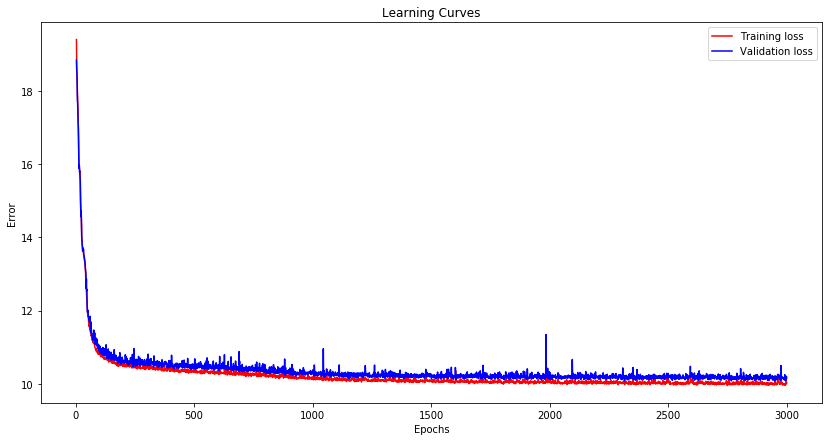

In [41]:
vae_Name='VAE_FC_h3_z30'
vae=vae_FC_h3_z30
train_data=VAE_train(vae, vae_Name)

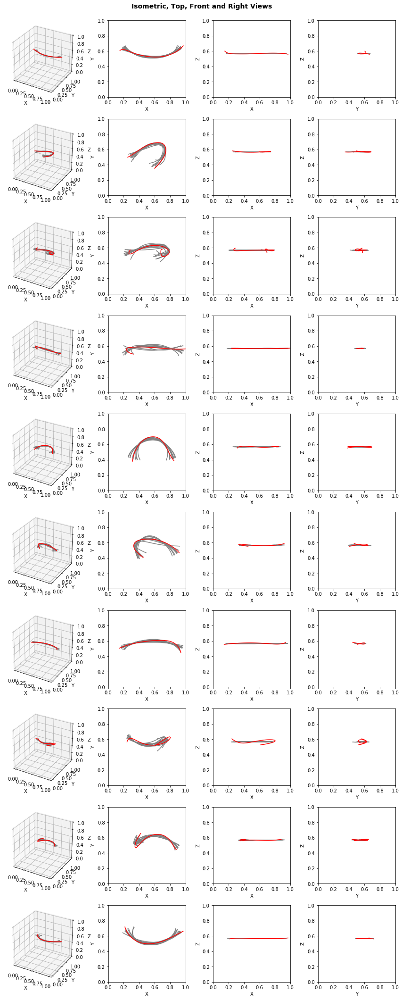

In [42]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=3, Z=60

Model: "model_65"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_33 (Flatten)            (None, 300)          0           input_33[0][0]                   
__________________________________________________________________________________________________
dense_183 (Dense)               (None, 200)          60200       flatten_33[0][0]                 
__________________________________________________________________________________________________
dense_184 (Dense)               (None, 100)          20100       dense_183[0][0]                  
___________________________________________________________________________________________

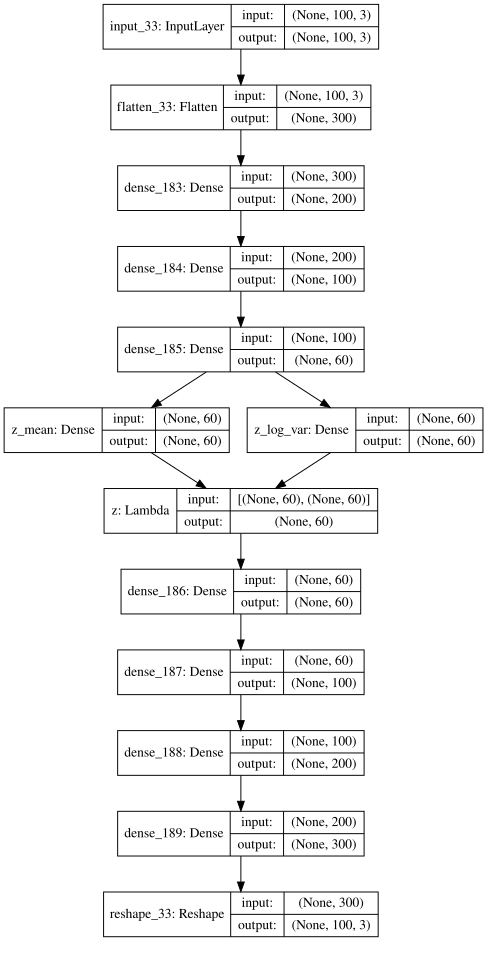

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 0s 28us/step - loss: 64.3524 - reconstruction_loss: 63.8899 - kl_loss: 0.3498 - val_loss: 38.8773 - val_reconstruction_loss: 38.5345 - val_kl_loss: 0.2162

Epoch 00001: val_loss improved from inf to 38.87731, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 13us/step - loss: 36.2279 - reconstruction_loss: 35.9784 - kl_loss: 0.2212 - val_loss: 33.4104 - val_reconstruction_loss: 32.7413 - val_kl_loss: 0.5707

Epoch 00002: val_loss improved from 38.87731 to 33.41036, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 13us/step - loss: 27.2301 - reconstruction_loss: 25.1412 - kl_loss: 2.0630 - val_loss: 23.7791 - val_reconstruction_loss: 21.2644 - val_kl_loss: 2.4327

Epoch 00003: val_loss improved from 33.41036 to 23.77907, saving model to models_VAE/VAE_FC_h3_z60.h

16067/16067 [==============================] - 0s 13us/step - loss: 15.7980 - reconstruction_loss: 14.2349 - kl_loss: 1.5584 - val_loss: 15.7609 - val_reconstruction_loss: 14.1810 - val_kl_loss: 1.5298

Epoch 00027: val_loss did not improve from 15.73998
Epoch 28/3000
16067/16067 [==============================] - 0s 13us/step - loss: 15.8049 - reconstruction_loss: 14.2303 - kl_loss: 1.5679 - val_loss: 15.7277 - val_reconstruction_loss: 14.1069 - val_kl_loss: 1.5695

Epoch 00028: val_loss improved from 15.73998 to 15.72766, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 13us/step - loss: 15.7349 - reconstruction_loss: 14.1677 - kl_loss: 1.5599 - val_loss: 15.6960 - val_reconstruction_loss: 14.1333 - val_kl_loss: 1.5128

Epoch 00029: val_loss improved from 15.72766 to 15.69597, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 30/3000
16067/16067 [==============================] - 0s 13us/step - loss: 15.7106 - reconstruct

16067/16067 [==============================] - 0s 13us/step - loss: 11.2564 - reconstruction_loss: 7.8332 - kl_loss: 3.4205 - val_loss: 11.2964 - val_reconstruction_loss: 7.9309 - val_kl_loss: 3.3332

Epoch 00080: val_loss improved from 11.33883 to 11.29643, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 81/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.1139 - reconstruction_loss: 7.6851 - kl_loss: 3.4253 - val_loss: 11.2094 - val_reconstruction_loss: 7.7866 - val_kl_loss: 3.3916

Epoch 00081: val_loss improved from 11.29643 to 11.20945, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 82/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.2880 - reconstruction_loss: 7.8792 - kl_loss: 3.4057 - val_loss: 11.3635 - val_reconstruction_loss: 7.8047 - val_kl_loss: 3.5318

Epoch 00082: val_loss did not improve from 11.20945
Epoch 83/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.2799 - reconstruction_lo

16067/16067 [==============================] - 0s 13us/step - loss: 11.0616 - reconstruction_loss: 7.5505 - kl_loss: 3.5085 - val_loss: 11.2054 - val_reconstruction_loss: 7.6637 - val_kl_loss: 3.5094

Epoch 00110: val_loss did not improve from 11.09052
Epoch 111/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.1687 - reconstruction_loss: 7.6536 - kl_loss: 3.5114 - val_loss: 11.2462 - val_reconstruction_loss: 7.7611 - val_kl_loss: 3.4583

Epoch 00111: val_loss did not improve from 11.09052
Epoch 112/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.0503 - reconstruction_loss: 7.5735 - kl_loss: 3.4735 - val_loss: 11.0891 - val_reconstruction_loss: 7.5964 - val_kl_loss: 3.4609

Epoch 00112: val_loss improved from 11.09052 to 11.08909, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.1061 - reconstruction_loss: 7.5394 - kl_loss: 3.5647 - val_loss: 11.5790 


Epoch 00139: val_loss did not improve from 10.87535
Epoch 140/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.1596 - reconstruction_loss: 7.5833 - kl_loss: 3.5713 - val_loss: 10.9687 - val_reconstruction_loss: 7.4354 - val_kl_loss: 3.5016

Epoch 00140: val_loss did not improve from 10.87535
Epoch 141/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8240 - reconstruction_loss: 7.3104 - kl_loss: 3.5103 - val_loss: 11.0572 - val_reconstruction_loss: 7.5154 - val_kl_loss: 3.5119

Epoch 00141: val_loss did not improve from 10.87535
Epoch 142/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8967 - reconstruction_loss: 7.3653 - kl_loss: 3.5271 - val_loss: 10.9017 - val_reconstruction_loss: 7.2072 - val_kl_loss: 3.6648

Epoch 00142: val_loss did not improve from 10.87535
Epoch 143/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8676 - reconstruction_loss: 7.3239 - kl_loss: 3.5393 - va


Epoch 00169: val_loss did not improve from 10.71416
Epoch 170/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8667 - reconstruction_loss: 7.2861 - kl_loss: 3.5758 - val_loss: 10.8955 - val_reconstruction_loss: 7.3232 - val_kl_loss: 3.5435

Epoch 00170: val_loss did not improve from 10.71416
Epoch 171/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7340 - reconstruction_loss: 7.1135 - kl_loss: 3.6185 - val_loss: 10.8720 - val_reconstruction_loss: 7.1735 - val_kl_loss: 3.6704

Epoch 00171: val_loss did not improve from 10.71416
Epoch 172/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6867 - reconstruction_loss: 7.1298 - kl_loss: 3.5530 - val_loss: 10.7660 - val_reconstruction_loss: 7.1885 - val_kl_loss: 3.5510

Epoch 00172: val_loss did not improve from 10.71416
Epoch 173/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8287 - reconstruction_loss: 7.2175 - kl_loss: 3.6081 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.7569 - reconstruction_loss: 7.1391 - kl_loss: 3.6139 - val_loss: 10.8661 - val_reconstruction_loss: 7.1019 - val_kl_loss: 3.7391

Epoch 00230: val_loss did not improve from 10.64850
Epoch 231/3000
16067/16067 [==============================] - 0s 13us/step - loss: 11.5239 - reconstruction_loss: 7.9930 - kl_loss: 3.5293 - val_loss: 12.9702 - val_reconstruction_loss: 9.1756 - val_kl_loss: 3.7491

Epoch 00231: val_loss did not improve from 10.64850
Epoch 232/3000
16067/16067 [==============================] - 0s 13us/step - loss: 12.1753 - reconstruction_loss: 8.6416 - kl_loss: 3.5271 - val_loss: 11.2636 - val_reconstruction_loss: 7.7968 - val_kl_loss: 3.4347

Epoch 00232: val_loss did not improve from 10.64850
Epoch 233/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.8402 - reconstruction_loss: 7.2077 - kl_loss: 3.6293 - val_loss: 10.9034 - val_reconstruction_loss: 7.1813 - val_kl_loss: 3.6


Epoch 00260: val_loss did not improve from 10.64850
Epoch 261/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6287 - reconstruction_loss: 7.0287 - kl_loss: 3.5978 - val_loss: 10.8256 - val_reconstruction_loss: 7.1691 - val_kl_loss: 3.6285

Epoch 00261: val_loss did not improve from 10.64850
Epoch 262/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6658 - reconstruction_loss: 6.9669 - kl_loss: 3.6979 - val_loss: 11.0448 - val_reconstruction_loss: 7.2955 - val_kl_loss: 3.7210

Epoch 00262: val_loss did not improve from 10.64850
Epoch 263/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.7155 - reconstruction_loss: 7.0478 - kl_loss: 3.6653 - val_loss: 10.7693 - val_reconstruction_loss: 7.1554 - val_kl_loss: 3.5887

Epoch 00263: val_loss did not improve from 10.64850
Epoch 264/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.6802 - reconstruction_loss: 7.0365 - kl_loss: 3.6403 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.5209 - reconstruction_loss: 6.8299 - kl_loss: 3.6883 - val_loss: 10.6712 - val_reconstruction_loss: 6.9995 - val_kl_loss: 3.6425

Epoch 00321: val_loss did not improve from 10.57635
Epoch 322/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5094 - reconstruction_loss: 6.8284 - kl_loss: 3.6774 - val_loss: 10.7719 - val_reconstruction_loss: 6.9878 - val_kl_loss: 3.7581

Epoch 00322: val_loss did not improve from 10.57635
Epoch 323/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.5011 - reconstruction_loss: 6.8142 - kl_loss: 3.6837 - val_loss: 10.6645 - val_reconstruction_loss: 6.8911 - val_kl_loss: 3.7442

Epoch 00323: val_loss did not improve from 10.57635
Epoch 324/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4824 - reconstruction_loss: 6.8187 - kl_loss: 3.6604 - val_loss: 10.5757 - val_reconstruction_loss: 6.8195 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 13us/step - loss: 10.4128 - reconstruction_loss: 6.7319 - kl_loss: 3.6763 - val_loss: 10.5536 - val_reconstruction_loss: 6.8055 - val_kl_loss: 3.7229

Epoch 00381: val_loss did not improve from 10.53201
Epoch 382/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4566 - reconstruction_loss: 6.7476 - kl_loss: 3.7052 - val_loss: 10.5712 - val_reconstruction_loss: 6.7372 - val_kl_loss: 3.8067

Epoch 00382: val_loss did not improve from 10.53201
Epoch 383/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4908 - reconstruction_loss: 6.7935 - kl_loss: 3.6934 - val_loss: 10.6125 - val_reconstruction_loss: 6.8968 - val_kl_loss: 3.6899

Epoch 00383: val_loss did not improve from 10.53201
Epoch 384/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4931 - reconstruction_loss: 6.8128 - kl_loss: 3.6772 - val_loss: 10.6598 - val_reconstruction_loss: 7.0129 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 13us/step - loss: 10.4374 - reconstruction_loss: 6.7335 - kl_loss: 3.7001 - val_loss: 10.5777 - val_reconstruction_loss: 6.7572 - val_kl_loss: 3.7975

Epoch 00441: val_loss did not improve from 10.48659
Epoch 442/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4471 - reconstruction_loss: 6.7684 - kl_loss: 3.6754 - val_loss: 10.4993 - val_reconstruction_loss: 6.8055 - val_kl_loss: 3.6691

Epoch 00442: val_loss did not improve from 10.48659
Epoch 443/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4439 - reconstruction_loss: 6.7533 - kl_loss: 3.6872 - val_loss: 10.6312 - val_reconstruction_loss: 6.9706 - val_kl_loss: 3.6337

Epoch 00443: val_loss did not improve from 10.48659
Epoch 444/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.4404 - reconstruction_loss: 6.7578 - kl_loss: 3.6804 - val_loss: 10.5399 - val_reconstruction_loss: 6.9193 - val_kl_loss: 3.5

16067/16067 [==============================] - 0s 13us/step - loss: 10.3712 - reconstruction_loss: 6.6690 - kl_loss: 3.7000 - val_loss: 10.4849 - val_reconstruction_loss: 6.7877 - val_kl_loss: 3.6710

Epoch 00501: val_loss did not improve from 10.46091
Epoch 502/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3930 - reconstruction_loss: 6.7007 - kl_loss: 3.6894 - val_loss: 10.5053 - val_reconstruction_loss: 6.7795 - val_kl_loss: 3.6997

Epoch 00502: val_loss did not improve from 10.46091
Epoch 503/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3721 - reconstruction_loss: 6.6758 - kl_loss: 3.6926 - val_loss: 10.4953 - val_reconstruction_loss: 6.7978 - val_kl_loss: 3.6704

Epoch 00503: val_loss did not improve from 10.46091
Epoch 504/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3996 - reconstruction_loss: 6.7182 - kl_loss: 3.6798 - val_loss: 10.5744 - val_reconstruction_loss: 6.7549 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 13us/step - loss: 10.3751 - reconstruction_loss: 6.6849 - kl_loss: 3.6858 - val_loss: 10.6188 - val_reconstruction_loss: 6.9585 - val_kl_loss: 3.6313

Epoch 00561: val_loss did not improve from 10.42784
Epoch 562/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3461 - reconstruction_loss: 6.6764 - kl_loss: 3.6655 - val_loss: 10.5113 - val_reconstruction_loss: 6.8432 - val_kl_loss: 3.6425

Epoch 00562: val_loss did not improve from 10.42784
Epoch 563/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3716 - reconstruction_loss: 6.6602 - kl_loss: 3.7084 - val_loss: 10.5930 - val_reconstruction_loss: 6.8035 - val_kl_loss: 3.7634

Epoch 00563: val_loss did not improve from 10.42784
Epoch 564/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3856 - reconstruction_loss: 6.7027 - kl_loss: 3.6797 - val_loss: 10.4933 - val_reconstruction_loss: 6.8269 - val_kl_loss: 3.6


Epoch 00591: val_loss did not improve from 10.42784
Epoch 592/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3476 - reconstruction_loss: 6.6418 - kl_loss: 3.7014 - val_loss: 10.4871 - val_reconstruction_loss: 6.7977 - val_kl_loss: 3.6618

Epoch 00592: val_loss did not improve from 10.42784
Epoch 593/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3322 - reconstruction_loss: 6.6257 - kl_loss: 3.7042 - val_loss: 10.5039 - val_reconstruction_loss: 6.7853 - val_kl_loss: 3.6915

Epoch 00593: val_loss did not improve from 10.42784
Epoch 594/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3425 - reconstruction_loss: 6.6442 - kl_loss: 3.6964 - val_loss: 10.5228 - val_reconstruction_loss: 6.8279 - val_kl_loss: 3.6685

Epoch 00594: val_loss did not improve from 10.42784
Epoch 595/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3743 - reconstruction_loss: 6.6560 - kl_loss: 3.7151 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.3461 - reconstruction_loss: 6.6283 - kl_loss: 3.7130 - val_loss: 10.4875 - val_reconstruction_loss: 6.6506 - val_kl_loss: 3.8120

Epoch 00622: val_loss did not improve from 10.42492
Epoch 623/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3426 - reconstruction_loss: 6.6228 - kl_loss: 3.7177 - val_loss: 10.4817 - val_reconstruction_loss: 6.7413 - val_kl_loss: 3.7132

Epoch 00623: val_loss did not improve from 10.42492
Epoch 624/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3668 - reconstruction_loss: 6.6559 - kl_loss: 3.7065 - val_loss: 10.4560 - val_reconstruction_loss: 6.6128 - val_kl_loss: 3.8161

Epoch 00624: val_loss did not improve from 10.42492
Epoch 625/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3025 - reconstruction_loss: 6.6059 - kl_loss: 3.6939 - val_loss: 10.4637 - val_reconstruction_loss: 6.7687 - val_kl_loss: 3.6


Epoch 00682: val_loss did not improve from 10.41170
Epoch 683/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3399 - reconstruction_loss: 6.6230 - kl_loss: 3.7136 - val_loss: 10.4745 - val_reconstruction_loss: 6.7253 - val_kl_loss: 3.7245

Epoch 00683: val_loss did not improve from 10.41170
Epoch 684/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3094 - reconstruction_loss: 6.5641 - kl_loss: 3.7418 - val_loss: 10.4831 - val_reconstruction_loss: 6.7660 - val_kl_loss: 3.6914

Epoch 00684: val_loss did not improve from 10.41170
Epoch 685/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3204 - reconstruction_loss: 6.5956 - kl_loss: 3.7212 - val_loss: 10.5072 - val_reconstruction_loss: 6.7681 - val_kl_loss: 3.7126

Epoch 00685: val_loss did not improve from 10.41170
Epoch 686/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3085 - reconstruction_loss: 6.5981 - kl_loss: 3.7079 - va


Epoch 00743: val_loss did not improve from 10.41170
Epoch 744/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2926 - reconstruction_loss: 6.5762 - kl_loss: 3.7130 - val_loss: 10.4091 - val_reconstruction_loss: 6.6211 - val_kl_loss: 3.7649

Epoch 00744: val_loss improved from 10.41170 to 10.40915, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 745/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3062 - reconstruction_loss: 6.5875 - kl_loss: 3.7144 - val_loss: 10.4440 - val_reconstruction_loss: 6.7339 - val_kl_loss: 3.6857

Epoch 00745: val_loss did not improve from 10.40915
Epoch 746/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2916 - reconstruction_loss: 6.5687 - kl_loss: 3.7184 - val_loss: 10.4980 - val_reconstruction_loss: 6.7499 - val_kl_loss: 3.7214

Epoch 00746: val_loss did not improve from 10.40915
Epoch 747/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2957 

16067/16067 [==============================] - 0s 13us/step - loss: 10.3317 - reconstruction_loss: 6.5792 - kl_loss: 3.7490 - val_loss: 10.5192 - val_reconstruction_loss: 6.6745 - val_kl_loss: 3.8226

Epoch 00774: val_loss did not improve from 10.40005
Epoch 775/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2857 - reconstruction_loss: 6.5636 - kl_loss: 3.7196 - val_loss: 10.4584 - val_reconstruction_loss: 6.7487 - val_kl_loss: 3.6826

Epoch 00775: val_loss did not improve from 10.40005
Epoch 776/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2846 - reconstruction_loss: 6.5557 - kl_loss: 3.7262 - val_loss: 10.4770 - val_reconstruction_loss: 6.6535 - val_kl_loss: 3.7965

Epoch 00776: val_loss did not improve from 10.40005
Epoch 777/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3131 - reconstruction_loss: 6.5886 - kl_loss: 3.7226 - val_loss: 10.5485 - val_reconstruction_loss: 6.7821 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 13us/step - loss: 10.2950 - reconstruction_loss: 6.5352 - kl_loss: 3.7557 - val_loss: 10.4432 - val_reconstruction_loss: 6.6594 - val_kl_loss: 3.7581

Epoch 00834: val_loss did not improve from 10.36634
Epoch 835/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3347 - reconstruction_loss: 6.5831 - kl_loss: 3.7486 - val_loss: 10.4526 - val_reconstruction_loss: 6.6401 - val_kl_loss: 3.7861

Epoch 00835: val_loss did not improve from 10.36634
Epoch 836/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2876 - reconstruction_loss: 6.5321 - kl_loss: 3.7525 - val_loss: 10.4962 - val_reconstruction_loss: 6.7235 - val_kl_loss: 3.7436

Epoch 00836: val_loss did not improve from 10.36634
Epoch 837/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3233 - reconstruction_loss: 6.5937 - kl_loss: 3.7253 - val_loss: 10.4899 - val_reconstruction_loss: 6.6881 - val_kl_loss: 3.7


Epoch 00864: val_loss improved from 10.36634 to 10.35358, saving model to models_VAE/VAE_FC_h3_z60.hdf5
Epoch 865/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2612 - reconstruction_loss: 6.5274 - kl_loss: 3.7302 - val_loss: 10.4970 - val_reconstruction_loss: 6.7553 - val_kl_loss: 3.7161

Epoch 00865: val_loss did not improve from 10.35358
Epoch 866/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2916 - reconstruction_loss: 6.5485 - kl_loss: 3.7399 - val_loss: 10.5411 - val_reconstruction_loss: 6.8155 - val_kl_loss: 3.7008

Epoch 00866: val_loss did not improve from 10.35358
Epoch 867/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3140 - reconstruction_loss: 6.5497 - kl_loss: 3.7598 - val_loss: 10.5208 - val_reconstruction_loss: 6.6269 - val_kl_loss: 3.8686

Epoch 00867: val_loss did not improve from 10.35358
Epoch 868/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2548 


Epoch 00925: val_loss did not improve from 10.35358
Epoch 926/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2605 - reconstruction_loss: 6.5139 - kl_loss: 3.7428 - val_loss: 10.3874 - val_reconstruction_loss: 6.6332 - val_kl_loss: 3.7286

Epoch 00926: val_loss did not improve from 10.35358
Epoch 927/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3110 - reconstruction_loss: 6.5877 - kl_loss: 3.7195 - val_loss: 10.4605 - val_reconstruction_loss: 6.6639 - val_kl_loss: 3.7713

Epoch 00927: val_loss did not improve from 10.35358
Epoch 928/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2556 - reconstruction_loss: 6.5261 - kl_loss: 3.7266 - val_loss: 10.4525 - val_reconstruction_loss: 6.6719 - val_kl_loss: 3.7531

Epoch 00928: val_loss did not improve from 10.35358
Epoch 929/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2926 - reconstruction_loss: 6.5455 - kl_loss: 3.7439 - va


Epoch 00986: val_loss did not improve from 10.35358
Epoch 987/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2591 - reconstruction_loss: 6.4993 - kl_loss: 3.7561 - val_loss: 10.3910 - val_reconstruction_loss: 6.5628 - val_kl_loss: 3.8046

Epoch 00987: val_loss did not improve from 10.35358
Epoch 988/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2547 - reconstruction_loss: 6.5150 - kl_loss: 3.7385 - val_loss: 10.4972 - val_reconstruction_loss: 6.7940 - val_kl_loss: 3.6777

Epoch 00988: val_loss did not improve from 10.35358
Epoch 989/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3733 - reconstruction_loss: 6.6349 - kl_loss: 3.7348 - val_loss: 10.3864 - val_reconstruction_loss: 6.5836 - val_kl_loss: 3.7761

Epoch 00989: val_loss did not improve from 10.35358
Epoch 990/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2929 - reconstruction_loss: 6.5254 - kl_loss: 3.7636 - va

16067/16067 [==============================] - 0s 13us/step - loss: 10.2235 - reconstruction_loss: 6.4780 - kl_loss: 3.7428 - val_loss: 10.4093 - val_reconstruction_loss: 6.7064 - val_kl_loss: 3.6786

Epoch 01047: val_loss did not improve from 10.32809
Epoch 1048/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2272 - reconstruction_loss: 6.4851 - kl_loss: 3.7384 - val_loss: 10.4249 - val_reconstruction_loss: 6.5622 - val_kl_loss: 3.8369

Epoch 01048: val_loss did not improve from 10.32809
Epoch 1049/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2368 - reconstruction_loss: 6.5075 - kl_loss: 3.7263 - val_loss: 10.5077 - val_reconstruction_loss: 6.7481 - val_kl_loss: 3.7327

Epoch 01049: val_loss did not improve from 10.32809
Epoch 1050/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2834 - reconstruction_loss: 6.5355 - kl_loss: 3.7461 - val_loss: 10.5815 - val_reconstruction_loss: 6.8175 - val_kl_loss: 


Epoch 01077: val_loss did not improve from 10.32809
Epoch 1078/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2446 - reconstruction_loss: 6.4881 - kl_loss: 3.7536 - val_loss: 10.4111 - val_reconstruction_loss: 6.6041 - val_kl_loss: 3.7799

Epoch 01078: val_loss did not improve from 10.32809
Epoch 1079/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2623 - reconstruction_loss: 6.4817 - kl_loss: 3.7771 - val_loss: 10.3831 - val_reconstruction_loss: 6.6242 - val_kl_loss: 3.7349

Epoch 01079: val_loss did not improve from 10.32809
Epoch 1080/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2542 - reconstruction_loss: 6.4819 - kl_loss: 3.7683 - val_loss: 10.4239 - val_reconstruction_loss: 6.6423 - val_kl_loss: 3.7554

Epoch 01080: val_loss did not improve from 10.32809
Epoch 1081/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2566 - reconstruction_loss: 6.5119 - kl_loss: 3.7421 


Epoch 01138: val_loss did not improve from 10.32809
Epoch 1139/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2846 - reconstruction_loss: 6.5177 - kl_loss: 3.7630 - val_loss: 10.3717 - val_reconstruction_loss: 6.5367 - val_kl_loss: 3.8077

Epoch 01139: val_loss did not improve from 10.32809
Epoch 1140/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2372 - reconstruction_loss: 6.4820 - kl_loss: 3.7533 - val_loss: 10.4190 - val_reconstruction_loss: 6.6137 - val_kl_loss: 3.7761

Epoch 01140: val_loss did not improve from 10.32809
Epoch 1141/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3070 - reconstruction_loss: 6.5525 - kl_loss: 3.7520 - val_loss: 10.4219 - val_reconstruction_loss: 6.6737 - val_kl_loss: 3.7207

Epoch 01141: val_loss did not improve from 10.32809
Epoch 1142/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2651 - reconstruction_loss: 6.5005 - kl_loss: 3.7617 

16067/16067 [==============================] - 0s 13us/step - loss: 10.2275 - reconstruction_loss: 6.4607 - kl_loss: 3.7635 - val_loss: 10.3453 - val_reconstruction_loss: 6.5712 - val_kl_loss: 3.7482

Epoch 01199: val_loss did not improve from 10.31051
Epoch 1200/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2997 - reconstruction_loss: 6.5238 - kl_loss: 3.7719 - val_loss: 10.3799 - val_reconstruction_loss: 6.5901 - val_kl_loss: 3.7671

Epoch 01200: val_loss did not improve from 10.31051
Epoch 1201/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2345 - reconstruction_loss: 6.4428 - kl_loss: 3.7886 - val_loss: 10.4753 - val_reconstruction_loss: 6.5948 - val_kl_loss: 3.8576

Epoch 01201: val_loss did not improve from 10.31051
Epoch 1202/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.3000 - reconstruction_loss: 6.5211 - kl_loss: 3.7751 - val_loss: 10.4397 - val_reconstruction_loss: 6.6109 - val_kl_loss: 


Epoch 01229: val_loss did not improve from 10.31051
Epoch 1230/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2318 - reconstruction_loss: 6.4574 - kl_loss: 3.7713 - val_loss: 10.3546 - val_reconstruction_loss: 6.5344 - val_kl_loss: 3.7928

Epoch 01230: val_loss did not improve from 10.31051
Epoch 1231/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2542 - reconstruction_loss: 6.4683 - kl_loss: 3.7832 - val_loss: 10.4257 - val_reconstruction_loss: 6.6125 - val_kl_loss: 3.7872

Epoch 01231: val_loss did not improve from 10.31051
Epoch 1232/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2514 - reconstruction_loss: 6.4548 - kl_loss: 3.7923 - val_loss: 10.3719 - val_reconstruction_loss: 6.5164 - val_kl_loss: 3.8321

Epoch 01232: val_loss did not improve from 10.31051
Epoch 1233/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2472 - reconstruction_loss: 6.4646 - kl_loss: 3.7783 

16067/16067 [==============================] - 0s 13us/step - loss: 10.2396 - reconstruction_loss: 6.4109 - kl_loss: 3.8255 - val_loss: 10.3576 - val_reconstruction_loss: 6.4948 - val_kl_loss: 3.8369

Epoch 01290: val_loss did not improve from 10.29041
Epoch 1291/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2282 - reconstruction_loss: 6.4243 - kl_loss: 3.8015 - val_loss: 10.3652 - val_reconstruction_loss: 6.5394 - val_kl_loss: 3.8016

Epoch 01291: val_loss did not improve from 10.29041
Epoch 1292/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2208 - reconstruction_loss: 6.4090 - kl_loss: 3.8083 - val_loss: 10.3686 - val_reconstruction_loss: 6.5439 - val_kl_loss: 3.7990

Epoch 01292: val_loss did not improve from 10.29041
Epoch 1293/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1958 - reconstruction_loss: 6.4063 - kl_loss: 3.7873 - val_loss: 10.3361 - val_reconstruction_loss: 6.4219 - val_kl_loss: 


Epoch 01320: val_loss did not improve from 10.29041
Epoch 1321/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2217 - reconstruction_loss: 6.4002 - kl_loss: 3.8186 - val_loss: 10.3768 - val_reconstruction_loss: 6.4623 - val_kl_loss: 3.8892

Epoch 01321: val_loss did not improve from 10.29041
Epoch 1322/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2095 - reconstruction_loss: 6.3903 - kl_loss: 3.8156 - val_loss: 10.3607 - val_reconstruction_loss: 6.4747 - val_kl_loss: 3.8622

Epoch 01322: val_loss did not improve from 10.29041
Epoch 1323/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2149 - reconstruction_loss: 6.4122 - kl_loss: 3.7996 - val_loss: 10.3617 - val_reconstruction_loss: 6.4307 - val_kl_loss: 3.9049

Epoch 01323: val_loss did not improve from 10.29041
Epoch 1324/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2264 - reconstruction_loss: 6.3942 - kl_loss: 3.8296 


Epoch 01381: val_loss did not improve from 10.29041
Epoch 1382/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2325 - reconstruction_loss: 6.3890 - kl_loss: 3.8396 - val_loss: 10.3998 - val_reconstruction_loss: 6.4793 - val_kl_loss: 3.8954

Epoch 01382: val_loss did not improve from 10.29041
Epoch 1383/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2188 - reconstruction_loss: 6.3687 - kl_loss: 3.8467 - val_loss: 10.3828 - val_reconstruction_loss: 6.4399 - val_kl_loss: 3.9180

Epoch 01383: val_loss did not improve from 10.29041
Epoch 1384/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2308 - reconstruction_loss: 6.3816 - kl_loss: 3.8468 - val_loss: 10.3409 - val_reconstruction_loss: 6.4451 - val_kl_loss: 3.8700

Epoch 01384: val_loss did not improve from 10.29041
Epoch 1385/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1765 - reconstruction_loss: 6.3476 - kl_loss: 3.8264 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1522 - reconstruction_loss: 6.2719 - kl_loss: 3.8762 - val_loss: 10.3425 - val_reconstruction_loss: 6.4575 - val_kl_loss: 3.8616

Epoch 01442: val_loss did not improve from 10.26255
Epoch 1443/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1540 - reconstruction_loss: 6.2810 - kl_loss: 3.8698 - val_loss: 10.3721 - val_reconstruction_loss: 6.4178 - val_kl_loss: 3.9312

Epoch 01443: val_loss did not improve from 10.26255
Epoch 1444/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1930 - reconstruction_loss: 6.2947 - kl_loss: 3.8956 - val_loss: 10.3778 - val_reconstruction_loss: 6.4180 - val_kl_loss: 3.9353

Epoch 01444: val_loss did not improve from 10.26255
Epoch 1445/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1933 - reconstruction_loss: 6.2974 - kl_loss: 3.8933 - val_loss: 10.3227 - val_reconstruction_loss: 6.3585 - val_kl_loss: 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1448 - reconstruction_loss: 6.2069 - kl_loss: 3.9346 - val_loss: 10.2798 - val_reconstruction_loss: 6.2854 - val_kl_loss: 3.9711

Epoch 01502: val_loss did not improve from 10.24610
Epoch 1503/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1510 - reconstruction_loss: 6.1876 - kl_loss: 3.9603 - val_loss: 10.4006 - val_reconstruction_loss: 6.3996 - val_kl_loss: 3.9756

Epoch 01503: val_loss did not improve from 10.24610
Epoch 1504/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1813 - reconstruction_loss: 6.2544 - kl_loss: 3.9247 - val_loss: 10.3384 - val_reconstruction_loss: 6.3519 - val_kl_loss: 3.9630

Epoch 01504: val_loss did not improve from 10.24610
Epoch 1505/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1391 - reconstruction_loss: 6.2210 - kl_loss: 3.9162 - val_loss: 10.3095 - val_reconstruction_loss: 6.3085 - val_kl_loss: 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1473 - reconstruction_loss: 6.1852 - kl_loss: 3.9597 - val_loss: 10.3392 - val_reconstruction_loss: 6.3787 - val_kl_loss: 3.9384

Epoch 01562: val_loss did not improve from 10.20651
Epoch 1563/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1443 - reconstruction_loss: 6.1766 - kl_loss: 3.9643 - val_loss: 10.3089 - val_reconstruction_loss: 6.3236 - val_kl_loss: 3.9607

Epoch 01563: val_loss did not improve from 10.20651
Epoch 1564/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1434 - reconstruction_loss: 6.1604 - kl_loss: 3.9802 - val_loss: 10.3642 - val_reconstruction_loss: 6.3720 - val_kl_loss: 3.9674

Epoch 01564: val_loss did not improve from 10.20651
Epoch 1565/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2499 - reconstruction_loss: 6.2640 - kl_loss: 3.9824 - val_loss: 10.3526 - val_reconstruction_loss: 6.3911 - val_kl_loss: 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0794 - reconstruction_loss: 6.1107 - kl_loss: 3.9657 - val_loss: 10.2321 - val_reconstruction_loss: 6.2022 - val_kl_loss: 4.0035

Epoch 01622: val_loss did not improve from 10.16808
Epoch 1623/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1127 - reconstruction_loss: 6.1333 - kl_loss: 3.9760 - val_loss: 10.2179 - val_reconstruction_loss: 6.2076 - val_kl_loss: 3.9868

Epoch 01623: val_loss did not improve from 10.16808
Epoch 1624/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0837 - reconstruction_loss: 6.1382 - kl_loss: 3.9422 - val_loss: 10.2551 - val_reconstruction_loss: 6.2051 - val_kl_loss: 4.0253

Epoch 01624: val_loss did not improve from 10.16808
Epoch 1625/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1459 - reconstruction_loss: 6.1594 - kl_loss: 3.9838 - val_loss: 10.2855 - val_reconstruction_loss: 6.2332 - val_kl_loss: 


Epoch 01652: val_loss did not improve from 10.16808
Epoch 1653/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1456 - reconstruction_loss: 6.1734 - kl_loss: 3.9689 - val_loss: 10.2815 - val_reconstruction_loss: 6.2604 - val_kl_loss: 3.9970

Epoch 01653: val_loss did not improve from 10.16808
Epoch 1654/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1045 - reconstruction_loss: 6.1407 - kl_loss: 3.9601 - val_loss: 10.2935 - val_reconstruction_loss: 6.2373 - val_kl_loss: 4.0314

Epoch 01654: val_loss did not improve from 10.16808
Epoch 1655/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2489 - reconstruction_loss: 6.3072 - kl_loss: 3.9381 - val_loss: 10.2606 - val_reconstruction_loss: 6.2441 - val_kl_loss: 3.9893

Epoch 01655: val_loss did not improve from 10.16808
Epoch 1656/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1623 - reconstruction_loss: 6.2167 - kl_loss: 3.9413 


Epoch 01713: val_loss did not improve from 10.16808
Epoch 1714/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0948 - reconstruction_loss: 6.0950 - kl_loss: 3.9963 - val_loss: 10.2646 - val_reconstruction_loss: 6.2292 - val_kl_loss: 4.0142

Epoch 01714: val_loss did not improve from 10.16808
Epoch 1715/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1281 - reconstruction_loss: 6.1517 - kl_loss: 3.9734 - val_loss: 10.2740 - val_reconstruction_loss: 6.2665 - val_kl_loss: 3.9830

Epoch 01715: val_loss did not improve from 10.16808
Epoch 1716/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0882 - reconstruction_loss: 6.1068 - kl_loss: 3.9792 - val_loss: 10.2281 - val_reconstruction_loss: 6.1715 - val_kl_loss: 4.0314

Epoch 01716: val_loss did not improve from 10.16808
Epoch 1717/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1073 - reconstruction_loss: 6.1047 - kl_loss: 4.0005 


Epoch 01774: val_loss did not improve from 10.14066
Epoch 1775/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1021 - reconstruction_loss: 6.0987 - kl_loss: 4.0002 - val_loss: 10.2081 - val_reconstruction_loss: 6.2043 - val_kl_loss: 3.9802

Epoch 01775: val_loss did not improve from 10.14066
Epoch 1776/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0743 - reconstruction_loss: 6.0892 - kl_loss: 3.9815 - val_loss: 10.1953 - val_reconstruction_loss: 6.0856 - val_kl_loss: 4.0845

Epoch 01776: val_loss did not improve from 10.14066
Epoch 1777/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0474 - reconstruction_loss: 6.0701 - kl_loss: 3.9741 - val_loss: 10.2437 - val_reconstruction_loss: 6.1797 - val_kl_loss: 4.0413

Epoch 01777: val_loss did not improve from 10.14066
Epoch 1778/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1181 - reconstruction_loss: 6.1312 - kl_loss: 3.9839 


Epoch 01835: val_loss did not improve from 10.14066
Epoch 1836/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0772 - reconstruction_loss: 6.0780 - kl_loss: 3.9961 - val_loss: 10.2249 - val_reconstruction_loss: 6.0979 - val_kl_loss: 4.1039

Epoch 01836: val_loss did not improve from 10.14066
Epoch 1837/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0792 - reconstruction_loss: 6.0545 - kl_loss: 4.0225 - val_loss: 10.2298 - val_reconstruction_loss: 6.1680 - val_kl_loss: 4.0358

Epoch 01837: val_loss did not improve from 10.14066
Epoch 1838/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0673 - reconstruction_loss: 6.0560 - kl_loss: 4.0085 - val_loss: 10.2366 - val_reconstruction_loss: 6.1401 - val_kl_loss: 4.0720

Epoch 01838: val_loss did not improve from 10.14066
Epoch 1839/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0816 - reconstruction_loss: 6.0537 - kl_loss: 4.0253 


Epoch 01896: val_loss did not improve from 10.13234
Epoch 1897/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.2913 - reconstruction_loss: 6.2961 - kl_loss: 3.9916 - val_loss: 10.2318 - val_reconstruction_loss: 6.1840 - val_kl_loss: 4.0223

Epoch 01897: val_loss did not improve from 10.13234
Epoch 1898/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0938 - reconstruction_loss: 6.0959 - kl_loss: 3.9950 - val_loss: 10.3030 - val_reconstruction_loss: 6.2984 - val_kl_loss: 3.9810

Epoch 01898: val_loss did not improve from 10.13234
Epoch 1899/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1008 - reconstruction_loss: 6.0861 - kl_loss: 4.0117 - val_loss: 10.1790 - val_reconstruction_loss: 6.1199 - val_kl_loss: 4.0373

Epoch 01899: val_loss did not improve from 10.13234
Epoch 1900/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0867 - reconstruction_loss: 6.0497 - kl_loss: 4.0343 

16067/16067 [==============================] - 0s 13us/step - loss: 10.1135 - reconstruction_loss: 6.1022 - kl_loss: 4.0084 - val_loss: 10.2826 - val_reconstruction_loss: 6.2209 - val_kl_loss: 4.0379

Epoch 01957: val_loss did not improve from 10.12756
Epoch 1958/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0712 - reconstruction_loss: 6.0447 - kl_loss: 4.0236 - val_loss: 10.2116 - val_reconstruction_loss: 6.1324 - val_kl_loss: 4.0547

Epoch 01958: val_loss did not improve from 10.12756
Epoch 1959/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0561 - reconstruction_loss: 6.0515 - kl_loss: 4.0019 - val_loss: 10.1746 - val_reconstruction_loss: 6.0823 - val_kl_loss: 4.0699

Epoch 01959: val_loss did not improve from 10.12756
Epoch 1960/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0666 - reconstruction_loss: 6.0578 - kl_loss: 4.0059 - val_loss: 10.2330 - val_reconstruction_loss: 6.1940 - val_kl_loss: 


Epoch 01987: val_loss did not improve from 10.12756
Epoch 1988/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0778 - reconstruction_loss: 6.0265 - kl_loss: 4.0492 - val_loss: 10.1875 - val_reconstruction_loss: 6.1502 - val_kl_loss: 4.0150

Epoch 01988: val_loss did not improve from 10.12756
Epoch 1989/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0487 - reconstruction_loss: 6.0219 - kl_loss: 4.0236 - val_loss: 10.2163 - val_reconstruction_loss: 6.1387 - val_kl_loss: 4.0539

Epoch 01989: val_loss did not improve from 10.12756
Epoch 1990/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1037 - reconstruction_loss: 6.1125 - kl_loss: 3.9887 - val_loss: 10.2285 - val_reconstruction_loss: 6.2409 - val_kl_loss: 3.9620

Epoch 01990: val_loss did not improve from 10.12756
Epoch 1991/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0740 - reconstruction_loss: 6.0437 - kl_loss: 4.0268 


Epoch 02048: val_loss did not improve from 10.12756
Epoch 2049/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0661 - reconstruction_loss: 6.0335 - kl_loss: 4.0304 - val_loss: 10.1811 - val_reconstruction_loss: 6.0914 - val_kl_loss: 4.0641

Epoch 02049: val_loss did not improve from 10.12756
Epoch 2050/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0607 - reconstruction_loss: 6.0236 - kl_loss: 4.0327 - val_loss: 10.1666 - val_reconstruction_loss: 6.0540 - val_kl_loss: 4.0901

Epoch 02050: val_loss did not improve from 10.12756
Epoch 2051/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1072 - reconstruction_loss: 6.1053 - kl_loss: 3.9992 - val_loss: 10.4277 - val_reconstruction_loss: 6.3074 - val_kl_loss: 4.0939

Epoch 02051: val_loss did not improve from 10.12756
Epoch 2052/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0962 - reconstruction_loss: 6.0835 - kl_loss: 4.0109 


Epoch 02109: val_loss did not improve from 10.12756
Epoch 2110/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0669 - reconstruction_loss: 6.0362 - kl_loss: 4.0283 - val_loss: 10.3282 - val_reconstruction_loss: 6.3506 - val_kl_loss: 3.9520

Epoch 02110: val_loss did not improve from 10.12756
Epoch 2111/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1218 - reconstruction_loss: 6.1150 - kl_loss: 4.0048 - val_loss: 10.2299 - val_reconstruction_loss: 6.1674 - val_kl_loss: 4.0400

Epoch 02111: val_loss did not improve from 10.12756
Epoch 2112/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0721 - reconstruction_loss: 6.0456 - kl_loss: 4.0238 - val_loss: 10.2547 - val_reconstruction_loss: 6.2084 - val_kl_loss: 4.0216

Epoch 02112: val_loss did not improve from 10.12756
Epoch 2113/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0598 - reconstruction_loss: 6.0483 - kl_loss: 4.0083 


Epoch 02170: val_loss did not improve from 10.12756
Epoch 2171/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0503 - reconstruction_loss: 6.0387 - kl_loss: 4.0077 - val_loss: 10.1783 - val_reconstruction_loss: 6.0905 - val_kl_loss: 4.0631

Epoch 02171: val_loss did not improve from 10.12756
Epoch 2172/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0360 - reconstruction_loss: 6.0279 - kl_loss: 4.0065 - val_loss: 10.2203 - val_reconstruction_loss: 6.1664 - val_kl_loss: 4.0278

Epoch 02172: val_loss did not improve from 10.12756
Epoch 2173/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0348 - reconstruction_loss: 5.9898 - kl_loss: 4.0417 - val_loss: 10.1746 - val_reconstruction_loss: 6.0243 - val_kl_loss: 4.1250

Epoch 02173: val_loss did not improve from 10.12756
Epoch 2174/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0439 - reconstruction_loss: 5.9939 - kl_loss: 4.0473 


Epoch 02231: val_loss did not improve from 10.12756
Epoch 2232/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0678 - reconstruction_loss: 6.0543 - kl_loss: 4.0098 - val_loss: 10.1783 - val_reconstruction_loss: 6.1403 - val_kl_loss: 4.0160

Epoch 02232: val_loss did not improve from 10.12756
Epoch 2233/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0770 - reconstruction_loss: 6.0520 - kl_loss: 4.0220 - val_loss: 10.2723 - val_reconstruction_loss: 6.2238 - val_kl_loss: 4.0238

Epoch 02233: val_loss did not improve from 10.12756
Epoch 2234/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0688 - reconstruction_loss: 6.0473 - kl_loss: 4.0199 - val_loss: 10.1923 - val_reconstruction_loss: 6.0985 - val_kl_loss: 4.0673

Epoch 02234: val_loss did not improve from 10.12756
Epoch 2235/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0420 - reconstruction_loss: 6.0320 - kl_loss: 4.0055 


Epoch 02292: val_loss did not improve from 10.12756
Epoch 2293/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1071 - reconstruction_loss: 6.0679 - kl_loss: 4.0363 - val_loss: 10.2475 - val_reconstruction_loss: 6.1849 - val_kl_loss: 4.0395

Epoch 02293: val_loss did not improve from 10.12756
Epoch 2294/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0363 - reconstruction_loss: 6.0178 - kl_loss: 4.0158 - val_loss: 10.1883 - val_reconstruction_loss: 6.0703 - val_kl_loss: 4.0926

Epoch 02294: val_loss did not improve from 10.12756
Epoch 2295/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0337 - reconstruction_loss: 5.9820 - kl_loss: 4.0493 - val_loss: 10.1782 - val_reconstruction_loss: 6.0850 - val_kl_loss: 4.0677

Epoch 02295: val_loss did not improve from 10.12756
Epoch 2296/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0618 - reconstruction_loss: 6.0595 - kl_loss: 3.9997 


Epoch 02353: val_loss did not improve from 10.12756
Epoch 2354/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0639 - reconstruction_loss: 6.0346 - kl_loss: 4.0262 - val_loss: 10.1714 - val_reconstruction_loss: 6.0763 - val_kl_loss: 4.0724

Epoch 02354: val_loss did not improve from 10.12756
Epoch 2355/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0956 - reconstruction_loss: 6.0631 - kl_loss: 4.0296 - val_loss: 10.2667 - val_reconstruction_loss: 6.2780 - val_kl_loss: 3.9660

Epoch 02355: val_loss did not improve from 10.12756
Epoch 2356/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1317 - reconstruction_loss: 6.0875 - kl_loss: 4.0415 - val_loss: 10.2239 - val_reconstruction_loss: 6.1589 - val_kl_loss: 4.0446

Epoch 02356: val_loss did not improve from 10.12756
Epoch 2357/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0570 - reconstruction_loss: 6.0303 - kl_loss: 4.0239 

16067/16067 [==============================] - 0s 13us/step - loss: 10.0444 - reconstruction_loss: 5.9657 - kl_loss: 4.0764 - val_loss: 10.2310 - val_reconstruction_loss: 6.1689 - val_kl_loss: 4.0374

Epoch 02414: val_loss did not improve from 10.11561
Epoch 2415/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1287 - reconstruction_loss: 6.1002 - kl_loss: 4.0250 - val_loss: 10.2086 - val_reconstruction_loss: 6.0627 - val_kl_loss: 4.1215

Epoch 02415: val_loss did not improve from 10.11561
Epoch 2416/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0675 - reconstruction_loss: 6.0217 - kl_loss: 4.0428 - val_loss: 10.1768 - val_reconstruction_loss: 6.0446 - val_kl_loss: 4.1099

Epoch 02416: val_loss did not improve from 10.11561
Epoch 2417/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0346 - reconstruction_loss: 6.0127 - kl_loss: 4.0196 - val_loss: 10.1731 - val_reconstruction_loss: 6.0999 - val_kl_loss: 


Epoch 02474: val_loss did not improve from 10.10741
Epoch 2475/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0535 - reconstruction_loss: 6.0010 - kl_loss: 4.0496 - val_loss: 10.1171 - val_reconstruction_loss: 6.0774 - val_kl_loss: 4.0165

Epoch 02475: val_loss did not improve from 10.10741
Epoch 2476/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0244 - reconstruction_loss: 5.9805 - kl_loss: 4.0409 - val_loss: 10.1624 - val_reconstruction_loss: 6.0313 - val_kl_loss: 4.1087

Epoch 02476: val_loss did not improve from 10.10741
Epoch 2477/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0572 - reconstruction_loss: 6.0132 - kl_loss: 4.0408 - val_loss: 10.1907 - val_reconstruction_loss: 6.0774 - val_kl_loss: 4.0897

Epoch 02477: val_loss did not improve from 10.10741
Epoch 2478/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0778 - reconstruction_loss: 5.9989 - kl_loss: 4.0770 


Epoch 02535: val_loss did not improve from 10.10741
Epoch 2536/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0702 - reconstruction_loss: 6.0267 - kl_loss: 4.0401 - val_loss: 10.2025 - val_reconstruction_loss: 6.0755 - val_kl_loss: 4.1066

Epoch 02536: val_loss did not improve from 10.10741
Epoch 2537/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0570 - reconstruction_loss: 6.0053 - kl_loss: 4.0486 - val_loss: 10.2052 - val_reconstruction_loss: 6.1327 - val_kl_loss: 4.0483

Epoch 02537: val_loss did not improve from 10.10741
Epoch 2538/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0551 - reconstruction_loss: 6.0086 - kl_loss: 4.0434 - val_loss: 10.1794 - val_reconstruction_loss: 6.0648 - val_kl_loss: 4.0904

Epoch 02538: val_loss did not improve from 10.10741
Epoch 2539/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0276 - reconstruction_loss: 5.9909 - kl_loss: 4.0337 


Epoch 02596: val_loss did not improve from 10.10741
Epoch 2597/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0233 - reconstruction_loss: 5.9659 - kl_loss: 4.0543 - val_loss: 10.1358 - val_reconstruction_loss: 6.0377 - val_kl_loss: 4.0770

Epoch 02597: val_loss did not improve from 10.10741
Epoch 2598/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0304 - reconstruction_loss: 5.9901 - kl_loss: 4.0382 - val_loss: 10.4354 - val_reconstruction_loss: 6.2904 - val_kl_loss: 4.1176

Epoch 02598: val_loss did not improve from 10.10741
Epoch 2599/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1537 - reconstruction_loss: 6.1053 - kl_loss: 4.0448 - val_loss: 10.2021 - val_reconstruction_loss: 6.1107 - val_kl_loss: 4.0692

Epoch 02599: val_loss did not improve from 10.10741
Epoch 2600/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1412 - reconstruction_loss: 6.1103 - kl_loss: 4.0277 


Epoch 02657: val_loss did not improve from 10.10741
Epoch 2658/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0436 - reconstruction_loss: 5.9947 - kl_loss: 4.0448 - val_loss: 10.1759 - val_reconstruction_loss: 6.0585 - val_kl_loss: 4.0955

Epoch 02658: val_loss did not improve from 10.10741
Epoch 2659/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0491 - reconstruction_loss: 6.0089 - kl_loss: 4.0390 - val_loss: 10.1564 - val_reconstruction_loss: 6.0771 - val_kl_loss: 4.0566

Epoch 02659: val_loss did not improve from 10.10741
Epoch 2660/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0260 - reconstruction_loss: 5.9770 - kl_loss: 4.0465 - val_loss: 10.1463 - val_reconstruction_loss: 6.0528 - val_kl_loss: 4.0709

Epoch 02660: val_loss did not improve from 10.10741
Epoch 2661/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.1391 - reconstruction_loss: 6.0835 - kl_loss: 4.0531 


Epoch 02718: val_loss did not improve from 10.10741
Epoch 2719/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0436 - reconstruction_loss: 5.9821 - kl_loss: 4.0588 - val_loss: 10.1878 - val_reconstruction_loss: 6.0728 - val_kl_loss: 4.0925

Epoch 02719: val_loss did not improve from 10.10741
Epoch 2720/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0202 - reconstruction_loss: 5.9726 - kl_loss: 4.0457 - val_loss: 10.1790 - val_reconstruction_loss: 6.1384 - val_kl_loss: 4.0162

Epoch 02720: val_loss did not improve from 10.10741
Epoch 2721/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0137 - reconstruction_loss: 5.9633 - kl_loss: 4.0470 - val_loss: 10.1830 - val_reconstruction_loss: 6.0797 - val_kl_loss: 4.0843

Epoch 02721: val_loss did not improve from 10.10741
Epoch 2722/3000
16067/16067 [==============================] - 0s 13us/step - loss: 9.9919 - reconstruction_loss: 5.9279 - kl_loss: 4.0619 -


Epoch 02779: val_loss did not improve from 10.10741
Epoch 2780/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0070 - reconstruction_loss: 5.9638 - kl_loss: 4.0403 - val_loss: 10.1727 - val_reconstruction_loss: 6.0431 - val_kl_loss: 4.1061

Epoch 02780: val_loss did not improve from 10.10741
Epoch 2781/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0156 - reconstruction_loss: 5.9857 - kl_loss: 4.0259 - val_loss: 10.1860 - val_reconstruction_loss: 6.0451 - val_kl_loss: 4.1178

Epoch 02781: val_loss did not improve from 10.10741
Epoch 2782/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0261 - reconstruction_loss: 5.9872 - kl_loss: 4.0366 - val_loss: 10.1775 - val_reconstruction_loss: 6.1103 - val_kl_loss: 4.0462

Epoch 02782: val_loss did not improve from 10.10741
Epoch 2783/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0320 - reconstruction_loss: 5.9614 - kl_loss: 4.0679 


Epoch 02840: val_loss did not improve from 10.10741
Epoch 2841/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0275 - reconstruction_loss: 5.9546 - kl_loss: 4.0698 - val_loss: 10.2276 - val_reconstruction_loss: 6.0879 - val_kl_loss: 4.1172

Epoch 02841: val_loss did not improve from 10.10741
Epoch 2842/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0205 - reconstruction_loss: 5.9692 - kl_loss: 4.0490 - val_loss: 10.2253 - val_reconstruction_loss: 6.1732 - val_kl_loss: 4.0289

Epoch 02842: val_loss did not improve from 10.10741
Epoch 2843/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0527 - reconstruction_loss: 6.0218 - kl_loss: 4.0285 - val_loss: 10.3174 - val_reconstruction_loss: 6.1583 - val_kl_loss: 4.1352

Epoch 02843: val_loss did not improve from 10.10741
Epoch 2844/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0663 - reconstruction_loss: 5.9684 - kl_loss: 4.0957 


Epoch 02901: val_loss did not improve from 10.08206
Epoch 2902/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0101 - reconstruction_loss: 5.9601 - kl_loss: 4.0477 - val_loss: 10.2214 - val_reconstruction_loss: 6.0929 - val_kl_loss: 4.1017

Epoch 02902: val_loss did not improve from 10.08206
Epoch 2903/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0529 - reconstruction_loss: 5.9578 - kl_loss: 4.0925 - val_loss: 10.2080 - val_reconstruction_loss: 6.0890 - val_kl_loss: 4.0964

Epoch 02903: val_loss did not improve from 10.08206
Epoch 2904/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0356 - reconstruction_loss: 5.9794 - kl_loss: 4.0534 - val_loss: 10.2370 - val_reconstruction_loss: 6.0329 - val_kl_loss: 4.1788

Epoch 02904: val_loss did not improve from 10.08206
Epoch 2905/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0920 - reconstruction_loss: 6.0254 - kl_loss: 4.0622 


Epoch 02962: val_loss did not improve from 10.08206
Epoch 2963/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0515 - reconstruction_loss: 5.9964 - kl_loss: 4.0525 - val_loss: 10.2024 - val_reconstruction_loss: 6.0407 - val_kl_loss: 4.1359

Epoch 02963: val_loss did not improve from 10.08206
Epoch 2964/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0064 - reconstruction_loss: 5.9369 - kl_loss: 4.0664 - val_loss: 10.2172 - val_reconstruction_loss: 6.0652 - val_kl_loss: 4.1277

Epoch 02964: val_loss did not improve from 10.08206
Epoch 2965/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0382 - reconstruction_loss: 5.9501 - kl_loss: 4.0854 - val_loss: 10.2015 - val_reconstruction_loss: 6.0736 - val_kl_loss: 4.1048

Epoch 02965: val_loss did not improve from 10.08206
Epoch 2966/3000
16067/16067 [==============================] - 0s 13us/step - loss: 10.0604 - reconstruction_loss: 6.0034 - kl_loss: 4.0536 

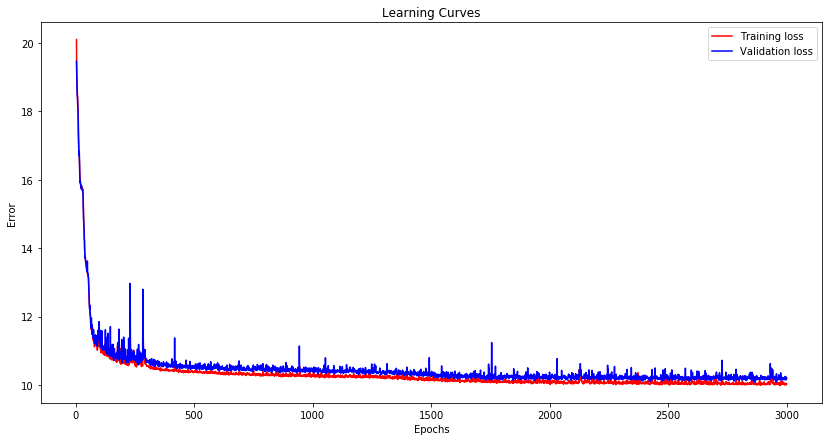

In [43]:
vae_Name='VAE_FC_h3_z60'
vae=vae_FC_h3_z60
train_data=VAE_train(vae, vae_Name)

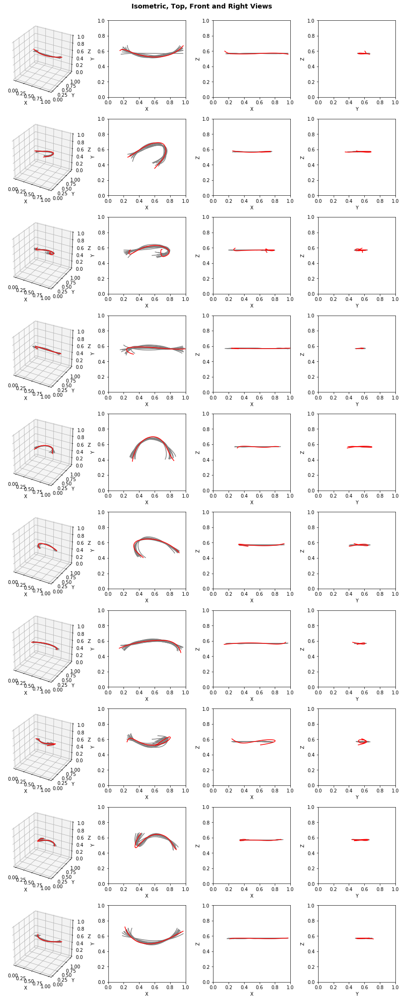

In [44]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=4, Z=15

Model: "model_67"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_34 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_34 (Flatten)            (None, 300)          0           input_34[0][0]                   
__________________________________________________________________________________________________
dense_190 (Dense)               (None, 200)          60200       flatten_34[0][0]                 
__________________________________________________________________________________________________
dense_191 (Dense)               (None, 150)          30150       dense_190[0][0]                  
___________________________________________________________________________________________

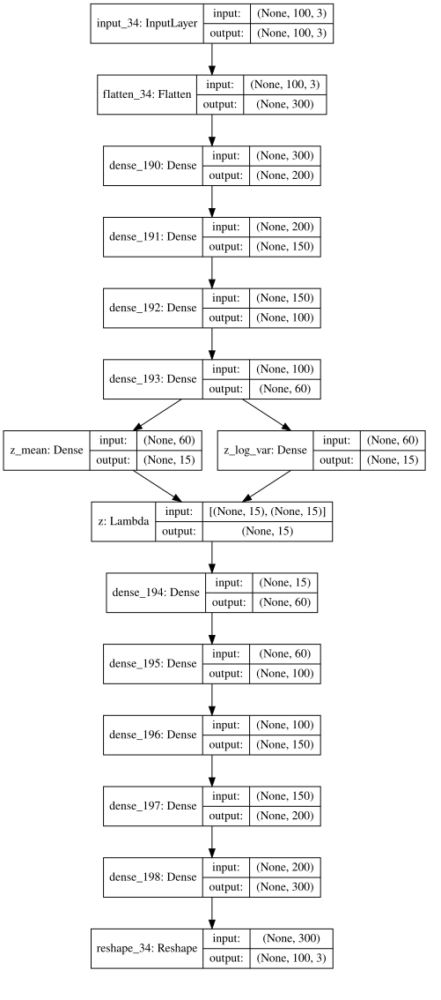

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 1s 31us/step - loss: 59.9671 - reconstruction_loss: 59.5055 - kl_loss: 0.3577 - val_loss: 36.3406 - val_reconstruction_loss: 36.1131 - val_kl_loss: 0.1039

Epoch 00001: val_loss improved from inf to 36.34060, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 15us/step - loss: 33.5407 - reconstruction_loss: 33.3794 - kl_loss: 0.1400 - val_loss: 31.3558 - val_reconstruction_loss: 31.1307 - val_kl_loss: 0.1182

Epoch 00002: val_loss improved from 36.34060 to 31.35580, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 15us/step - loss: 30.9128 - reconstruction_loss: 30.7860 - kl_loss: 0.1115 - val_loss: 29.7369 - val_reconstruction_loss: 29.3257 - val_kl_loss: 0.3112

Epoch 00003: val_loss improved from 31.35580 to 29.73687, saving model to models_VAE/VAE_FC_h4_z15.h

16067/16067 [==============================] - 0s 14us/step - loss: 13.6666 - reconstruction_loss: 11.4811 - kl_loss: 2.1806 - val_loss: 13.9048 - val_reconstruction_loss: 11.5425 - val_kl_loss: 2.3173

Epoch 00028: val_loss did not improve from 13.87104
Epoch 29/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.6085 - reconstruction_loss: 11.4237 - kl_loss: 2.1810 - val_loss: 13.8693 - val_reconstruction_loss: 11.5976 - val_kl_loss: 2.2236

Epoch 00029: val_loss improved from 13.87104 to 13.86926, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 30/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.7226 - reconstruction_loss: 11.5315 - kl_loss: 2.1856 - val_loss: 13.6076 - val_reconstruction_loss: 11.2356 - val_kl_loss: 2.3239

Epoch 00030: val_loss improved from 13.86926 to 13.60763, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 31/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.5067 - reconstruct


Epoch 00056: val_loss did not improve from 13.11961
Epoch 57/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.1934 - reconstruction_loss: 10.8804 - kl_loss: 2.3085 - val_loss: 13.2317 - val_reconstruction_loss: 10.8803 - val_kl_loss: 2.3116

Epoch 00057: val_loss did not improve from 13.11961
Epoch 58/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.0366 - reconstruction_loss: 10.7032 - kl_loss: 2.3289 - val_loss: 13.1031 - val_reconstruction_loss: 10.7440 - val_kl_loss: 2.3185

Epoch 00058: val_loss improved from 13.11961 to 13.10310, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 59/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.2177 - reconstruction_loss: 10.9356 - kl_loss: 2.2768 - val_loss: 13.5314 - val_reconstruction_loss: 10.9336 - val_kl_loss: 2.5519

Epoch 00059: val_loss did not improve from 13.10310
Epoch 60/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.187


Epoch 00115: val_loss improved from 12.44165 to 12.33576, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 116/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.5006 - reconstruction_loss: 9.9522 - kl_loss: 2.5415 - val_loss: 12.1740 - val_reconstruction_loss: 9.4439 - val_kl_loss: 2.6936

Epoch 00116: val_loss improved from 12.33576 to 12.17399, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 117/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.4800 - reconstruction_loss: 9.9213 - kl_loss: 2.5527 - val_loss: 12.3920 - val_reconstruction_loss: 9.7860 - val_kl_loss: 2.5698

Epoch 00117: val_loss did not improve from 12.17399
Epoch 118/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.0875 - reconstruction_loss: 9.4215 - kl_loss: 2.6615 - val_loss: 12.1207 - val_reconstruction_loss: 9.3952 - val_kl_loss: 2.6863

Epoch 00118: val_loss improved from 12.17399 to 12.12071, saving model to models_VAE/VAE_FC

16067/16067 [==============================] - 0s 14us/step - loss: 11.2638 - reconstruction_loss: 7.6474 - kl_loss: 3.6116 - val_loss: 11.3169 - val_reconstruction_loss: 7.5834 - val_kl_loss: 3.7008

Epoch 00145: val_loss improved from 11.47887 to 11.31694, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 146/3000
16067/16067 [==============================] - 0s 15us/step - loss: 11.2397 - reconstruction_loss: 7.5836 - kl_loss: 3.6533 - val_loss: 11.3132 - val_reconstruction_loss: 7.6650 - val_kl_loss: 3.6171

Epoch 00146: val_loss improved from 11.31694 to 11.31319, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 147/3000
16067/16067 [==============================] - 0s 15us/step - loss: 11.2030 - reconstruction_loss: 7.5748 - kl_loss: 3.6243 - val_loss: 11.2733 - val_reconstruction_loss: 7.5070 - val_kl_loss: 3.7346

Epoch 00147: val_loss improved from 11.31319 to 11.27333, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 148/3000
16067/16067 [===========================


Epoch 00173: val_loss improved from 10.97717 to 10.93641, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 174/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8786 - reconstruction_loss: 7.2517 - kl_loss: 3.6254 - val_loss: 11.0168 - val_reconstruction_loss: 7.3447 - val_kl_loss: 3.6445

Epoch 00174: val_loss did not improve from 10.93641
Epoch 175/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.8527 - reconstruction_loss: 7.2368 - kl_loss: 3.6121 - val_loss: 10.9073 - val_reconstruction_loss: 7.2596 - val_kl_loss: 3.6196

Epoch 00175: val_loss improved from 10.93641 to 10.90731, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 176/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.7894 - reconstruction_loss: 7.1453 - kl_loss: 3.6413 - val_loss: 10.9127 - val_reconstruction_loss: 7.2819 - val_kl_loss: 3.6050

Epoch 00176: val_loss did not improve from 10.90731
Epoch 177/3000
16067/16067 [===========

16067/16067 [==============================] - 0s 14us/step - loss: 10.6935 - reconstruction_loss: 7.0563 - kl_loss: 3.6352 - val_loss: 10.9008 - val_reconstruction_loss: 7.3655 - val_kl_loss: 3.5042

Epoch 00233: val_loss did not improve from 10.66149
Epoch 234/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6632 - reconstruction_loss: 7.0074 - kl_loss: 3.6529 - val_loss: 10.8679 - val_reconstruction_loss: 7.1293 - val_kl_loss: 3.7112

Epoch 00234: val_loss did not improve from 10.66149
Epoch 235/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6735 - reconstruction_loss: 7.0175 - kl_loss: 3.6526 - val_loss: 10.7060 - val_reconstruction_loss: 7.0351 - val_kl_loss: 3.6417

Epoch 00235: val_loss did not improve from 10.66149
Epoch 236/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5879 - reconstruction_loss: 6.9131 - kl_loss: 3.6727 - val_loss: 10.7909 - val_reconstruction_loss: 7.0722 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 15us/step - loss: 10.5405 - reconstruction_loss: 6.8929 - kl_loss: 3.6429 - val_loss: 10.6825 - val_reconstruction_loss: 7.0080 - val_kl_loss: 3.6478

Epoch 00263: val_loss did not improve from 10.60287
Epoch 264/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5136 - reconstruction_loss: 6.8503 - kl_loss: 3.6589 - val_loss: 10.7571 - val_reconstruction_loss: 7.0243 - val_kl_loss: 3.7044

Epoch 00264: val_loss did not improve from 10.60287
Epoch 265/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5330 - reconstruction_loss: 6.8877 - kl_loss: 3.6413 - val_loss: 10.6887 - val_reconstruction_loss: 7.0169 - val_kl_loss: 3.6447

Epoch 00265: val_loss did not improve from 10.60287
Epoch 266/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5969 - reconstruction_loss: 6.9426 - kl_loss: 3.6505 - val_loss: 10.7021 - val_reconstruction_loss: 6.9393 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 15us/step - loss: 10.5512 - reconstruction_loss: 6.8836 - kl_loss: 3.6645 - val_loss: 10.5659 - val_reconstruction_loss: 6.8314 - val_kl_loss: 3.7082

Epoch 00323: val_loss did not improve from 10.52181
Epoch 324/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4363 - reconstruction_loss: 6.7590 - kl_loss: 3.6749 - val_loss: 10.6266 - val_reconstruction_loss: 7.0062 - val_kl_loss: 3.5944

Epoch 00324: val_loss did not improve from 10.52181
Epoch 325/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4719 - reconstruction_loss: 6.8127 - kl_loss: 3.6555 - val_loss: 10.5576 - val_reconstruction_loss: 6.9464 - val_kl_loss: 3.5840

Epoch 00325: val_loss did not improve from 10.52181
Epoch 326/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5181 - reconstruction_loss: 6.8377 - kl_loss: 3.6788 - val_loss: 10.6411 - val_reconstruction_loss: 6.9365 - val_kl_loss: 3.6


Epoch 00353: val_loss did not improve from 10.52181
Epoch 354/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4380 - reconstruction_loss: 6.7808 - kl_loss: 3.6536 - val_loss: 10.6452 - val_reconstruction_loss: 6.9197 - val_kl_loss: 3.6993

Epoch 00354: val_loss did not improve from 10.52181
Epoch 355/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4266 - reconstruction_loss: 6.7711 - kl_loss: 3.6510 - val_loss: 10.5290 - val_reconstruction_loss: 6.8622 - val_kl_loss: 3.6378

Epoch 00355: val_loss did not improve from 10.52181
Epoch 356/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4654 - reconstruction_loss: 6.8062 - kl_loss: 3.6559 - val_loss: 10.5713 - val_reconstruction_loss: 6.8876 - val_kl_loss: 3.6572

Epoch 00356: val_loss did not improve from 10.52181
Epoch 357/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4222 - reconstruction_loss: 6.7416 - kl_loss: 3.6765 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.4085 - reconstruction_loss: 6.7247 - kl_loss: 3.6790 - val_loss: 10.4902 - val_reconstruction_loss: 6.7783 - val_kl_loss: 3.6847

Epoch 00414: val_loss did not improve from 10.48935
Epoch 415/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4000 - reconstruction_loss: 6.7061 - kl_loss: 3.6909 - val_loss: 10.5402 - val_reconstruction_loss: 6.7456 - val_kl_loss: 3.7710

Epoch 00415: val_loss did not improve from 10.48935
Epoch 416/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3800 - reconstruction_loss: 6.7209 - kl_loss: 3.6563 - val_loss: 10.5901 - val_reconstruction_loss: 6.9161 - val_kl_loss: 3.6488

Epoch 00416: val_loss did not improve from 10.48935
Epoch 417/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4381 - reconstruction_loss: 6.7478 - kl_loss: 3.6882 - val_loss: 10.5703 - val_reconstruction_loss: 6.8180 - val_kl_loss: 3.7


Epoch 00444: val_loss did not improve from 10.48935
Epoch 445/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3437 - reconstruction_loss: 6.6922 - kl_loss: 3.6488 - val_loss: 10.5835 - val_reconstruction_loss: 6.8627 - val_kl_loss: 3.6930

Epoch 00445: val_loss did not improve from 10.48935
Epoch 446/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3676 - reconstruction_loss: 6.6830 - kl_loss: 3.6814 - val_loss: 10.5051 - val_reconstruction_loss: 6.7852 - val_kl_loss: 3.6957

Epoch 00446: val_loss did not improve from 10.48935
Epoch 447/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3992 - reconstruction_loss: 6.7235 - kl_loss: 3.6745 - val_loss: 10.5114 - val_reconstruction_loss: 6.7769 - val_kl_loss: 3.7078

Epoch 00447: val_loss did not improve from 10.48935
Epoch 448/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3521 - reconstruction_loss: 6.6620 - kl_loss: 3.6875 - va


Epoch 00474: val_loss did not improve from 10.46680
Epoch 475/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3590 - reconstruction_loss: 6.6584 - kl_loss: 3.6970 - val_loss: 10.6017 - val_reconstruction_loss: 6.8038 - val_kl_loss: 3.7693

Epoch 00475: val_loss did not improve from 10.46680
Epoch 476/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4125 - reconstruction_loss: 6.7008 - kl_loss: 3.7092 - val_loss: 10.4947 - val_reconstruction_loss: 6.7915 - val_kl_loss: 3.6759

Epoch 00476: val_loss did not improve from 10.46680
Epoch 477/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4319 - reconstruction_loss: 6.7307 - kl_loss: 3.6970 - val_loss: 10.5858 - val_reconstruction_loss: 6.7629 - val_kl_loss: 3.7953

Epoch 00477: val_loss did not improve from 10.46680
Epoch 478/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3770 - reconstruction_loss: 6.7047 - kl_loss: 3.6690 - va

16067/16067 [==============================] - 0s 15us/step - loss: 10.3794 - reconstruction_loss: 6.7043 - kl_loss: 3.6716 - val_loss: 10.5118 - val_reconstruction_loss: 6.7734 - val_kl_loss: 3.7121

Epoch 00535: val_loss did not improve from 10.43755
Epoch 536/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3533 - reconstruction_loss: 6.6366 - kl_loss: 3.7159 - val_loss: 10.5582 - val_reconstruction_loss: 6.8460 - val_kl_loss: 3.6852

Epoch 00536: val_loss did not improve from 10.43755
Epoch 537/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3369 - reconstruction_loss: 6.6538 - kl_loss: 3.6805 - val_loss: 10.5240 - val_reconstruction_loss: 6.7137 - val_kl_loss: 3.7829

Epoch 00537: val_loss did not improve from 10.43755
Epoch 538/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3641 - reconstruction_loss: 6.6512 - kl_loss: 3.7098 - val_loss: 10.5706 - val_reconstruction_loss: 6.7940 - val_kl_loss: 3.7


Epoch 00565: val_loss did not improve from 10.43755
Epoch 566/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3963 - reconstruction_loss: 6.6954 - kl_loss: 3.6983 - val_loss: 10.5297 - val_reconstruction_loss: 6.8021 - val_kl_loss: 3.7013

Epoch 00566: val_loss did not improve from 10.43755
Epoch 567/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3550 - reconstruction_loss: 6.6439 - kl_loss: 3.7076 - val_loss: 10.5124 - val_reconstruction_loss: 6.7196 - val_kl_loss: 3.7670

Epoch 00567: val_loss did not improve from 10.43755
Epoch 568/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3755 - reconstruction_loss: 6.6516 - kl_loss: 3.7198 - val_loss: 10.5123 - val_reconstruction_loss: 6.6944 - val_kl_loss: 3.7903

Epoch 00568: val_loss did not improve from 10.43755
Epoch 569/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3215 - reconstruction_loss: 6.6076 - kl_loss: 3.7092 - va


Epoch 00595: val_loss did not improve from 10.42227
Epoch 596/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3886 - reconstruction_loss: 6.6943 - kl_loss: 3.6910 - val_loss: 10.5374 - val_reconstruction_loss: 6.7912 - val_kl_loss: 3.7195

Epoch 00596: val_loss did not improve from 10.42227
Epoch 597/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3420 - reconstruction_loss: 6.6262 - kl_loss: 3.7123 - val_loss: 10.6609 - val_reconstruction_loss: 6.7886 - val_kl_loss: 3.8459

Epoch 00597: val_loss did not improve from 10.42227
Epoch 598/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3109 - reconstruction_loss: 6.5880 - kl_loss: 3.7194 - val_loss: 10.4791 - val_reconstruction_loss: 6.6945 - val_kl_loss: 3.7594

Epoch 00598: val_loss did not improve from 10.42227
Epoch 599/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3957 - reconstruction_loss: 6.7020 - kl_loss: 3.6907 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.3496 - reconstruction_loss: 6.6425 - kl_loss: 3.7036 - val_loss: 10.5247 - val_reconstruction_loss: 6.7317 - val_kl_loss: 3.7708

Epoch 00656: val_loss did not improve from 10.40369
Epoch 657/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3144 - reconstruction_loss: 6.5825 - kl_loss: 3.7290 - val_loss: 10.4766 - val_reconstruction_loss: 6.6803 - val_kl_loss: 3.7701

Epoch 00657: val_loss did not improve from 10.40369
Epoch 658/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2490 - reconstruction_loss: 6.5533 - kl_loss: 3.6937 - val_loss: 10.5109 - val_reconstruction_loss: 6.8276 - val_kl_loss: 3.6553

Epoch 00658: val_loss did not improve from 10.40369
Epoch 659/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3364 - reconstruction_loss: 6.6309 - kl_loss: 3.7029 - val_loss: 10.4529 - val_reconstruction_loss: 6.6468 - val_kl_loss: 3.7


Epoch 00686: val_loss did not improve from 10.40369
Epoch 687/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3153 - reconstruction_loss: 6.5891 - kl_loss: 3.7229 - val_loss: 10.4256 - val_reconstruction_loss: 6.6416 - val_kl_loss: 3.7569

Epoch 00687: val_loss did not improve from 10.40369
Epoch 688/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2921 - reconstruction_loss: 6.5766 - kl_loss: 3.7118 - val_loss: 10.4658 - val_reconstruction_loss: 6.7041 - val_kl_loss: 3.7355

Epoch 00688: val_loss did not improve from 10.40369
Epoch 689/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3051 - reconstruction_loss: 6.5775 - kl_loss: 3.7239 - val_loss: 10.5721 - val_reconstruction_loss: 6.7090 - val_kl_loss: 3.8395

Epoch 00689: val_loss did not improve from 10.40369
Epoch 690/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3392 - reconstruction_loss: 6.6001 - kl_loss: 3.7353 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.2970 - reconstruction_loss: 6.5944 - kl_loss: 3.6989 - val_loss: 10.4606 - val_reconstruction_loss: 6.7308 - val_kl_loss: 3.7040

Epoch 00747: val_loss did not improve from 10.39059
Epoch 748/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3059 - reconstruction_loss: 6.5909 - kl_loss: 3.7126 - val_loss: 10.6975 - val_reconstruction_loss: 6.8650 - val_kl_loss: 3.8042

Epoch 00748: val_loss did not improve from 10.39059
Epoch 749/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3242 - reconstruction_loss: 6.6043 - kl_loss: 3.7165 - val_loss: 10.4588 - val_reconstruction_loss: 6.7996 - val_kl_loss: 3.6353

Epoch 00749: val_loss did not improve from 10.39059
Epoch 750/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2719 - reconstruction_loss: 6.5780 - kl_loss: 3.6893 - val_loss: 10.4476 - val_reconstruction_loss: 6.6844 - val_kl_loss: 3.7


Epoch 00777: val_loss did not improve from 10.39059
Epoch 778/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2674 - reconstruction_loss: 6.5442 - kl_loss: 3.7197 - val_loss: 10.5508 - val_reconstruction_loss: 6.7783 - val_kl_loss: 3.7460

Epoch 00778: val_loss did not improve from 10.39059
Epoch 779/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2719 - reconstruction_loss: 6.5423 - kl_loss: 3.7271 - val_loss: 10.4087 - val_reconstruction_loss: 6.6979 - val_kl_loss: 3.6873

Epoch 00779: val_loss did not improve from 10.39059
Epoch 780/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2854 - reconstruction_loss: 6.5588 - kl_loss: 3.7226 - val_loss: 10.4186 - val_reconstruction_loss: 6.6416 - val_kl_loss: 3.7501

Epoch 00780: val_loss did not improve from 10.39059
Epoch 781/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3038 - reconstruction_loss: 6.5939 - kl_loss: 3.7054 - va


Epoch 00838: val_loss did not improve from 10.39059
Epoch 839/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3222 - reconstruction_loss: 6.5949 - kl_loss: 3.7238 - val_loss: 10.4821 - val_reconstruction_loss: 6.6982 - val_kl_loss: 3.7588

Epoch 00839: val_loss did not improve from 10.39059
Epoch 840/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2893 - reconstruction_loss: 6.5361 - kl_loss: 3.7495 - val_loss: 10.4689 - val_reconstruction_loss: 6.6601 - val_kl_loss: 3.7808

Epoch 00840: val_loss did not improve from 10.39059
Epoch 841/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2681 - reconstruction_loss: 6.5110 - kl_loss: 3.7531 - val_loss: 10.4193 - val_reconstruction_loss: 6.6220 - val_kl_loss: 3.7715

Epoch 00841: val_loss did not improve from 10.39059
Epoch 842/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2606 - reconstruction_loss: 6.5254 - kl_loss: 3.7319 - va


Epoch 00899: val_loss did not improve from 10.35383
Epoch 900/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2921 - reconstruction_loss: 6.5296 - kl_loss: 3.7601 - val_loss: 10.4594 - val_reconstruction_loss: 6.7311 - val_kl_loss: 3.7005

Epoch 00900: val_loss did not improve from 10.35383
Epoch 901/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3328 - reconstruction_loss: 6.5778 - kl_loss: 3.7515 - val_loss: 10.4811 - val_reconstruction_loss: 6.7489 - val_kl_loss: 3.7035

Epoch 00901: val_loss did not improve from 10.35383
Epoch 902/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2555 - reconstruction_loss: 6.5037 - kl_loss: 3.7486 - val_loss: 10.3713 - val_reconstruction_loss: 6.6132 - val_kl_loss: 3.7335

Epoch 00902: val_loss did not improve from 10.35383
Epoch 903/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3878 - reconstruction_loss: 6.6651 - kl_loss: 3.7186 - va

16067/16067 [==============================] - 0s 15us/step - loss: 10.3371 - reconstruction_loss: 6.5743 - kl_loss: 3.7586 - val_loss: 10.4437 - val_reconstruction_loss: 6.6636 - val_kl_loss: 3.7536

Epoch 00960: val_loss did not improve from 10.32919
Epoch 961/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2859 - reconstruction_loss: 6.5328 - kl_loss: 3.7514 - val_loss: 10.5548 - val_reconstruction_loss: 6.7114 - val_kl_loss: 3.8140

Epoch 00961: val_loss did not improve from 10.32919
Epoch 962/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3532 - reconstruction_loss: 6.6002 - kl_loss: 3.7499 - val_loss: 10.5522 - val_reconstruction_loss: 6.7882 - val_kl_loss: 3.7352

Epoch 00962: val_loss did not improve from 10.32919
Epoch 963/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2864 - reconstruction_loss: 6.5355 - kl_loss: 3.7477 - val_loss: 10.4606 - val_reconstruction_loss: 6.7416 - val_kl_loss: 3.6


Epoch 00990: val_loss did not improve from 10.32919
Epoch 991/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2562 - reconstruction_loss: 6.5086 - kl_loss: 3.7442 - val_loss: 10.4755 - val_reconstruction_loss: 6.5369 - val_kl_loss: 3.9115

Epoch 00991: val_loss did not improve from 10.32919
Epoch 992/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2173 - reconstruction_loss: 6.4612 - kl_loss: 3.7526 - val_loss: 10.4431 - val_reconstruction_loss: 6.7134 - val_kl_loss: 3.7036

Epoch 00992: val_loss did not improve from 10.32919
Epoch 993/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2144 - reconstruction_loss: 6.4733 - kl_loss: 3.7368 - val_loss: 10.4153 - val_reconstruction_loss: 6.5981 - val_kl_loss: 3.7907

Epoch 00993: val_loss did not improve from 10.32919
Epoch 994/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2398 - reconstruction_loss: 6.4951 - kl_loss: 3.7402 - va


Epoch 01051: val_loss did not improve from 10.32919
Epoch 1052/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2280 - reconstruction_loss: 6.4525 - kl_loss: 3.7731 - val_loss: 10.4366 - val_reconstruction_loss: 6.6837 - val_kl_loss: 3.7276

Epoch 01052: val_loss did not improve from 10.32919
Epoch 1053/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2553 - reconstruction_loss: 6.5030 - kl_loss: 3.7501 - val_loss: 10.3928 - val_reconstruction_loss: 6.6063 - val_kl_loss: 3.7597

Epoch 01053: val_loss did not improve from 10.32919
Epoch 1054/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2532 - reconstruction_loss: 6.4648 - kl_loss: 3.7849 - val_loss: 10.4110 - val_reconstruction_loss: 6.5951 - val_kl_loss: 3.7909

Epoch 01054: val_loss did not improve from 10.32919
Epoch 1055/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1966 - reconstruction_loss: 6.4356 - kl_loss: 3.7582 


Epoch 01112: val_loss did not improve from 10.32919
Epoch 1113/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2116 - reconstruction_loss: 6.4490 - kl_loss: 3.7595 - val_loss: 10.4704 - val_reconstruction_loss: 6.6685 - val_kl_loss: 3.7765

Epoch 01113: val_loss did not improve from 10.32919
Epoch 1114/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2445 - reconstruction_loss: 6.4490 - kl_loss: 3.7922 - val_loss: 10.4004 - val_reconstruction_loss: 6.5437 - val_kl_loss: 3.8331

Epoch 01114: val_loss did not improve from 10.32919
Epoch 1115/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2153 - reconstruction_loss: 6.4200 - kl_loss: 3.7918 - val_loss: 10.3578 - val_reconstruction_loss: 6.5387 - val_kl_loss: 3.7938

Epoch 01115: val_loss did not improve from 10.32919
Epoch 1116/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2690 - reconstruction_loss: 6.4971 - kl_loss: 3.7683 


Epoch 01173: val_loss did not improve from 10.32919
Epoch 1174/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2294 - reconstruction_loss: 6.4610 - kl_loss: 3.7662 - val_loss: 10.3697 - val_reconstruction_loss: 6.5987 - val_kl_loss: 3.7474

Epoch 01174: val_loss did not improve from 10.32919
Epoch 1175/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2054 - reconstruction_loss: 6.4151 - kl_loss: 3.7876 - val_loss: 10.3778 - val_reconstruction_loss: 6.5813 - val_kl_loss: 3.7721

Epoch 01175: val_loss did not improve from 10.32919
Epoch 1176/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2101 - reconstruction_loss: 6.4347 - kl_loss: 3.7723 - val_loss: 10.4319 - val_reconstruction_loss: 6.5874 - val_kl_loss: 3.8183

Epoch 01176: val_loss did not improve from 10.32919
Epoch 1177/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2188 - reconstruction_loss: 6.4250 - kl_loss: 3.7901 


Epoch 01234: val_loss did not improve from 10.32621
Epoch 1235/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2049 - reconstruction_loss: 6.4148 - kl_loss: 3.7870 - val_loss: 10.4009 - val_reconstruction_loss: 6.5203 - val_kl_loss: 3.8563

Epoch 01235: val_loss did not improve from 10.32621
Epoch 1236/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2285 - reconstruction_loss: 6.4563 - kl_loss: 3.7698 - val_loss: 10.4612 - val_reconstruction_loss: 6.6991 - val_kl_loss: 3.7370

Epoch 01236: val_loss did not improve from 10.32621
Epoch 1237/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2234 - reconstruction_loss: 6.4572 - kl_loss: 3.7630 - val_loss: 10.4086 - val_reconstruction_loss: 6.6060 - val_kl_loss: 3.7793

Epoch 01237: val_loss did not improve from 10.32621
Epoch 1238/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2233 - reconstruction_loss: 6.4459 - kl_loss: 3.7732 

16067/16067 [==============================] - 0s 14us/step - loss: 10.2117 - reconstruction_loss: 6.4141 - kl_loss: 3.7951 - val_loss: 10.4729 - val_reconstruction_loss: 6.5983 - val_kl_loss: 3.8499

Epoch 01295: val_loss did not improve from 10.32227
Epoch 1296/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2353 - reconstruction_loss: 6.4482 - kl_loss: 3.7848 - val_loss: 10.4322 - val_reconstruction_loss: 6.6735 - val_kl_loss: 3.7360

Epoch 01296: val_loss did not improve from 10.32227
Epoch 1297/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2260 - reconstruction_loss: 6.4401 - kl_loss: 3.7828 - val_loss: 10.4057 - val_reconstruction_loss: 6.6839 - val_kl_loss: 3.7020

Epoch 01297: val_loss did not improve from 10.32227
Epoch 1298/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2163 - reconstruction_loss: 6.4051 - kl_loss: 3.8080 - val_loss: 10.4528 - val_reconstruction_loss: 6.6097 - val_kl_loss: 


Epoch 01325: val_loss did not improve from 10.32227
Epoch 1326/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1864 - reconstruction_loss: 6.3724 - kl_loss: 3.8117 - val_loss: 10.3428 - val_reconstruction_loss: 6.5014 - val_kl_loss: 3.8192

Epoch 01326: val_loss did not improve from 10.32227
Epoch 1327/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2013 - reconstruction_loss: 6.3667 - kl_loss: 3.8314 - val_loss: 10.3860 - val_reconstruction_loss: 6.4494 - val_kl_loss: 3.9136

Epoch 01327: val_loss did not improve from 10.32227
Epoch 1328/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2298 - reconstruction_loss: 6.4436 - kl_loss: 3.7837 - val_loss: 10.4762 - val_reconstruction_loss: 6.6900 - val_kl_loss: 3.7646

Epoch 01328: val_loss did not improve from 10.32227
Epoch 1329/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2343 - reconstruction_loss: 6.4324 - kl_loss: 3.7987 


Epoch 01386: val_loss did not improve from 10.32227
Epoch 1387/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1836 - reconstruction_loss: 6.3584 - kl_loss: 3.8228 - val_loss: 10.3685 - val_reconstruction_loss: 6.5180 - val_kl_loss: 3.8289

Epoch 01387: val_loss did not improve from 10.32227
Epoch 1388/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1731 - reconstruction_loss: 6.3761 - kl_loss: 3.7952 - val_loss: 10.4138 - val_reconstruction_loss: 6.4805 - val_kl_loss: 3.9045

Epoch 01388: val_loss did not improve from 10.32227
Epoch 1389/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1728 - reconstruction_loss: 6.3643 - kl_loss: 3.8054 - val_loss: 10.4331 - val_reconstruction_loss: 6.5460 - val_kl_loss: 3.8613

Epoch 01389: val_loss did not improve from 10.32227
Epoch 1390/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2038 - reconstruction_loss: 6.3819 - kl_loss: 3.8191 


Epoch 01447: val_loss did not improve from 10.31085
Epoch 1448/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2708 - reconstruction_loss: 6.4693 - kl_loss: 3.7986 - val_loss: 10.3474 - val_reconstruction_loss: 6.4511 - val_kl_loss: 3.8711

Epoch 01448: val_loss did not improve from 10.31085
Epoch 1449/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1498 - reconstruction_loss: 6.3507 - kl_loss: 3.7974 - val_loss: 10.3660 - val_reconstruction_loss: 6.5561 - val_kl_loss: 3.7825

Epoch 01449: val_loss did not improve from 10.31085
Epoch 1450/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2085 - reconstruction_loss: 6.3781 - kl_loss: 3.8282 - val_loss: 10.3831 - val_reconstruction_loss: 6.4854 - val_kl_loss: 3.8732

Epoch 01450: val_loss did not improve from 10.31085
Epoch 1451/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1511 - reconstruction_loss: 6.3632 - kl_loss: 3.7839 


Epoch 01508: val_loss did not improve from 10.31085
Epoch 1509/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1963 - reconstruction_loss: 6.3556 - kl_loss: 3.8376 - val_loss: 10.3719 - val_reconstruction_loss: 6.4947 - val_kl_loss: 3.8501

Epoch 01509: val_loss did not improve from 10.31085
Epoch 1510/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2395 - reconstruction_loss: 6.4014 - kl_loss: 3.8344 - val_loss: 10.5661 - val_reconstruction_loss: 6.7534 - val_kl_loss: 3.7884

Epoch 01510: val_loss did not improve from 10.31085
Epoch 1511/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1778 - reconstruction_loss: 6.3376 - kl_loss: 3.8374 - val_loss: 10.3175 - val_reconstruction_loss: 6.4898 - val_kl_loss: 3.8005

Epoch 01511: val_loss did not improve from 10.31085
Epoch 1512/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1668 - reconstruction_loss: 6.3388 - kl_loss: 3.8246 

16067/16067 [==============================] - 0s 15us/step - loss: 10.1261 - reconstruction_loss: 6.2363 - kl_loss: 3.8880 - val_loss: 10.3633 - val_reconstruction_loss: 6.3717 - val_kl_loss: 3.9657

Epoch 01569: val_loss did not improve from 10.28024
Epoch 1570/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1588 - reconstruction_loss: 6.2632 - kl_loss: 3.8909 - val_loss: 10.4075 - val_reconstruction_loss: 6.4787 - val_kl_loss: 3.9018

Epoch 01570: val_loss did not improve from 10.28024
Epoch 1571/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1563 - reconstruction_loss: 6.2644 - kl_loss: 3.8888 - val_loss: 10.4127 - val_reconstruction_loss: 6.5156 - val_kl_loss: 3.8709

Epoch 01571: val_loss did not improve from 10.28024
Epoch 1572/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1561 - reconstruction_loss: 6.2817 - kl_loss: 3.8706 - val_loss: 10.3277 - val_reconstruction_loss: 6.3822 - val_kl_loss: 


Epoch 01599: val_loss did not improve from 10.28024
Epoch 1600/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1565 - reconstruction_loss: 6.2727 - kl_loss: 3.8817 - val_loss: 10.3468 - val_reconstruction_loss: 6.4021 - val_kl_loss: 3.9219

Epoch 01600: val_loss did not improve from 10.28024
Epoch 1601/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1597 - reconstruction_loss: 6.2991 - kl_loss: 3.8561 - val_loss: 10.3140 - val_reconstruction_loss: 6.3761 - val_kl_loss: 3.9119

Epoch 01601: val_loss did not improve from 10.28024
Epoch 1602/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1620 - reconstruction_loss: 6.2674 - kl_loss: 3.8909 - val_loss: 10.3752 - val_reconstruction_loss: 6.4463 - val_kl_loss: 3.9048

Epoch 01602: val_loss did not improve from 10.28024
Epoch 1603/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1695 - reconstruction_loss: 6.2901 - kl_loss: 3.8761 

16067/16067 [==============================] - 0s 14us/step - loss: 10.1599 - reconstruction_loss: 6.2420 - kl_loss: 3.9154 - val_loss: 10.4803 - val_reconstruction_loss: 6.6023 - val_kl_loss: 3.8534

Epoch 01660: val_loss did not improve from 10.26105
Epoch 1661/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1391 - reconstruction_loss: 6.2600 - kl_loss: 3.8757 - val_loss: 10.3764 - val_reconstruction_loss: 6.3862 - val_kl_loss: 3.9670

Epoch 01661: val_loss did not improve from 10.26105
Epoch 1662/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1111 - reconstruction_loss: 6.2010 - kl_loss: 3.9065 - val_loss: 10.2970 - val_reconstruction_loss: 6.3310 - val_kl_loss: 3.9413

Epoch 01662: val_loss did not improve from 10.26105
Epoch 1663/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2522 - reconstruction_loss: 6.3629 - kl_loss: 3.8874 - val_loss: 10.5050 - val_reconstruction_loss: 6.5310 - val_kl_loss: 


Epoch 01720: val_loss did not improve from 10.25699
Epoch 1721/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1349 - reconstruction_loss: 6.2124 - kl_loss: 3.9195 - val_loss: 10.2969 - val_reconstruction_loss: 6.2363 - val_kl_loss: 4.0373

Epoch 01721: val_loss did not improve from 10.25699
Epoch 1722/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1146 - reconstruction_loss: 6.1954 - kl_loss: 3.9172 - val_loss: 10.3058 - val_reconstruction_loss: 6.4250 - val_kl_loss: 3.8552

Epoch 01722: val_loss did not improve from 10.25699
Epoch 1723/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1068 - reconstruction_loss: 6.1926 - kl_loss: 3.9113 - val_loss: 10.3176 - val_reconstruction_loss: 6.3101 - val_kl_loss: 3.9856

Epoch 01723: val_loss did not improve from 10.25699
Epoch 1724/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1051 - reconstruction_loss: 6.1751 - kl_loss: 3.9283 


Epoch 01781: val_loss did not improve from 10.24882
Epoch 1782/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1823 - reconstruction_loss: 6.2389 - kl_loss: 3.9412 - val_loss: 10.3395 - val_reconstruction_loss: 6.4103 - val_kl_loss: 3.9029

Epoch 01782: val_loss did not improve from 10.24882
Epoch 1783/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1129 - reconstruction_loss: 6.2076 - kl_loss: 3.9026 - val_loss: 10.2599 - val_reconstruction_loss: 6.3411 - val_kl_loss: 3.8915

Epoch 01783: val_loss did not improve from 10.24882
Epoch 1784/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1647 - reconstruction_loss: 6.2479 - kl_loss: 3.9136 - val_loss: 10.3747 - val_reconstruction_loss: 6.3838 - val_kl_loss: 3.9689

Epoch 01784: val_loss did not improve from 10.24882
Epoch 1785/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1331 - reconstruction_loss: 6.2186 - kl_loss: 3.9110 

16067/16067 [==============================] - 0s 14us/step - loss: 10.0737 - reconstruction_loss: 6.1506 - kl_loss: 3.9199 - val_loss: 10.2694 - val_reconstruction_loss: 6.2764 - val_kl_loss: 3.9660

Epoch 01842: val_loss did not improve from 10.22030
Epoch 1843/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1336 - reconstruction_loss: 6.1757 - kl_loss: 3.9557 - val_loss: 10.3605 - val_reconstruction_loss: 6.3769 - val_kl_loss: 3.9584

Epoch 01843: val_loss did not improve from 10.22030
Epoch 1844/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1598 - reconstruction_loss: 6.2334 - kl_loss: 3.9242 - val_loss: 10.6080 - val_reconstruction_loss: 6.6545 - val_kl_loss: 3.9261

Epoch 01844: val_loss did not improve from 10.22030
Epoch 1845/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1866 - reconstruction_loss: 6.2800 - kl_loss: 3.9037 - val_loss: 10.3299 - val_reconstruction_loss: 6.3856 - val_kl_loss: 


Epoch 01872: val_loss did not improve from 10.22030
Epoch 1873/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1211 - reconstruction_loss: 6.2121 - kl_loss: 3.9058 - val_loss: 10.2370 - val_reconstruction_loss: 6.2601 - val_kl_loss: 3.9548

Epoch 01873: val_loss did not improve from 10.22030
Epoch 1874/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1037 - reconstruction_loss: 6.1893 - kl_loss: 3.9116 - val_loss: 10.3717 - val_reconstruction_loss: 6.3244 - val_kl_loss: 4.0213

Epoch 01874: val_loss did not improve from 10.22030
Epoch 1875/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0732 - reconstruction_loss: 6.1572 - kl_loss: 3.9128 - val_loss: 10.3325 - val_reconstruction_loss: 6.3292 - val_kl_loss: 3.9785

Epoch 01875: val_loss did not improve from 10.22030
Epoch 1876/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0973 - reconstruction_loss: 6.1291 - kl_loss: 3.9650 

16067/16067 [==============================] - 0s 14us/step - loss: 10.1222 - reconstruction_loss: 6.2014 - kl_loss: 3.9189 - val_loss: 10.3283 - val_reconstruction_loss: 6.3404 - val_kl_loss: 3.9627

Epoch 01933: val_loss did not improve from 10.19575
Epoch 1934/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1731 - reconstruction_loss: 6.2536 - kl_loss: 3.9180 - val_loss: 10.3205 - val_reconstruction_loss: 6.2929 - val_kl_loss: 4.0025

Epoch 01934: val_loss did not improve from 10.19575
Epoch 1935/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1318 - reconstruction_loss: 6.1826 - kl_loss: 3.9457 - val_loss: 10.3504 - val_reconstruction_loss: 6.3687 - val_kl_loss: 3.9540

Epoch 01935: val_loss did not improve from 10.19575
Epoch 1936/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0800 - reconstruction_loss: 6.1244 - kl_loss: 3.9523 - val_loss: 10.2888 - val_reconstruction_loss: 6.3470 - val_kl_loss: 


Epoch 01963: val_loss did not improve from 10.19575
Epoch 1964/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1206 - reconstruction_loss: 6.1523 - kl_loss: 3.9661 - val_loss: 10.2568 - val_reconstruction_loss: 6.2668 - val_kl_loss: 3.9648

Epoch 01964: val_loss did not improve from 10.19575
Epoch 1965/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0616 - reconstruction_loss: 6.0907 - kl_loss: 3.9678 - val_loss: 10.2785 - val_reconstruction_loss: 6.2844 - val_kl_loss: 3.9722

Epoch 01965: val_loss did not improve from 10.19575
Epoch 1966/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0863 - reconstruction_loss: 6.1088 - kl_loss: 3.9744 - val_loss: 10.2889 - val_reconstruction_loss: 6.2542 - val_kl_loss: 4.0098

Epoch 01966: val_loss did not improve from 10.19575
Epoch 1967/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0781 - reconstruction_loss: 6.1313 - kl_loss: 3.9435 


Epoch 02024: val_loss did not improve from 10.19575
Epoch 2025/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2885 - reconstruction_loss: 6.3771 - kl_loss: 3.9089 - val_loss: 10.3929 - val_reconstruction_loss: 6.4983 - val_kl_loss: 3.8701

Epoch 02025: val_loss did not improve from 10.19575
Epoch 2026/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2067 - reconstruction_loss: 6.2834 - kl_loss: 3.9204 - val_loss: 10.5132 - val_reconstruction_loss: 6.4269 - val_kl_loss: 4.0597

Epoch 02026: val_loss did not improve from 10.19575
Epoch 2027/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2117 - reconstruction_loss: 6.2512 - kl_loss: 3.9567 - val_loss: 10.4033 - val_reconstruction_loss: 6.4880 - val_kl_loss: 3.8875

Epoch 02027: val_loss did not improve from 10.19575
Epoch 2028/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1883 - reconstruction_loss: 6.2332 - kl_loss: 3.9519 


Epoch 02085: val_loss did not improve from 10.19575
Epoch 2086/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1556 - reconstruction_loss: 6.1899 - kl_loss: 3.9616 - val_loss: 10.2949 - val_reconstruction_loss: 6.2718 - val_kl_loss: 4.0000

Epoch 02086: val_loss did not improve from 10.19575
Epoch 2087/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1210 - reconstruction_loss: 6.1617 - kl_loss: 3.9561 - val_loss: 10.2424 - val_reconstruction_loss: 6.1639 - val_kl_loss: 4.0552

Epoch 02087: val_loss did not improve from 10.19575
Epoch 2088/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1273 - reconstruction_loss: 6.1834 - kl_loss: 3.9411 - val_loss: 10.2509 - val_reconstruction_loss: 6.1990 - val_kl_loss: 4.0245

Epoch 02088: val_loss did not improve from 10.19575
Epoch 2089/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0771 - reconstruction_loss: 6.1219 - kl_loss: 3.9530 


Epoch 02146: val_loss did not improve from 10.19575
Epoch 2147/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2815 - reconstruction_loss: 6.3495 - kl_loss: 3.9290 - val_loss: 10.3478 - val_reconstruction_loss: 6.4435 - val_kl_loss: 3.8803

Epoch 02147: val_loss did not improve from 10.19575
Epoch 2148/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1896 - reconstruction_loss: 6.2476 - kl_loss: 3.9391 - val_loss: 10.3198 - val_reconstruction_loss: 6.3534 - val_kl_loss: 3.9394

Epoch 02148: val_loss did not improve from 10.19575
Epoch 2149/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1419 - reconstruction_loss: 6.1885 - kl_loss: 3.9516 - val_loss: 10.3118 - val_reconstruction_loss: 6.2165 - val_kl_loss: 4.0687

Epoch 02149: val_loss did not improve from 10.19575
Epoch 2150/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1870 - reconstruction_loss: 6.2428 - kl_loss: 3.9408 


Epoch 02207: val_loss did not improve from 10.19575
Epoch 2208/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0947 - reconstruction_loss: 6.1221 - kl_loss: 3.9703 - val_loss: 10.2457 - val_reconstruction_loss: 6.2262 - val_kl_loss: 3.9960

Epoch 02208: val_loss did not improve from 10.19575
Epoch 2209/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0715 - reconstruction_loss: 6.1075 - kl_loss: 3.9609 - val_loss: 10.3559 - val_reconstruction_loss: 6.3772 - val_kl_loss: 3.9560

Epoch 02209: val_loss did not improve from 10.19575
Epoch 2210/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0662 - reconstruction_loss: 6.0910 - kl_loss: 3.9722 - val_loss: 10.2608 - val_reconstruction_loss: 6.2069 - val_kl_loss: 4.0279

Epoch 02210: val_loss did not improve from 10.19575
Epoch 2211/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0622 - reconstruction_loss: 6.0860 - kl_loss: 3.9719 


Epoch 02268: val_loss did not improve from 10.19575
Epoch 2269/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0820 - reconstruction_loss: 6.1166 - kl_loss: 3.9629 - val_loss: 10.3398 - val_reconstruction_loss: 6.3528 - val_kl_loss: 3.9604

Epoch 02269: val_loss did not improve from 10.19575
Epoch 2270/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1155 - reconstruction_loss: 6.1633 - kl_loss: 3.9488 - val_loss: 10.2613 - val_reconstruction_loss: 6.2484 - val_kl_loss: 3.9874

Epoch 02270: val_loss did not improve from 10.19575
Epoch 2271/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0725 - reconstruction_loss: 6.0886 - kl_loss: 3.9817 - val_loss: 10.3870 - val_reconstruction_loss: 6.3323 - val_kl_loss: 4.0293

Epoch 02271: val_loss did not improve from 10.19575
Epoch 2272/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0661 - reconstruction_loss: 6.0922 - kl_loss: 3.9710 

16067/16067 [==============================] - 0s 14us/step - loss: 10.0471 - reconstruction_loss: 6.0607 - kl_loss: 3.9839 - val_loss: 10.2814 - val_reconstruction_loss: 6.2347 - val_kl_loss: 4.0211

Epoch 02329: val_loss did not improve from 10.19080
Epoch 2330/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0609 - reconstruction_loss: 6.0751 - kl_loss: 3.9825 - val_loss: 10.3240 - val_reconstruction_loss: 6.3110 - val_kl_loss: 3.9874

Epoch 02330: val_loss did not improve from 10.19080
Epoch 2331/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0819 - reconstruction_loss: 6.1155 - kl_loss: 3.9625 - val_loss: 10.2070 - val_reconstruction_loss: 6.1649 - val_kl_loss: 4.0184

Epoch 02331: val_loss did not improve from 10.19080
Epoch 2332/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1037 - reconstruction_loss: 6.1340 - kl_loss: 3.9667 - val_loss: 10.2609 - val_reconstruction_loss: 6.2865 - val_kl_loss: 


Epoch 02359: val_loss did not improve from 10.19080
Epoch 2360/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0500 - reconstruction_loss: 6.0735 - kl_loss: 3.9730 - val_loss: 10.2840 - val_reconstruction_loss: 6.1913 - val_kl_loss: 4.0694

Epoch 02360: val_loss did not improve from 10.19080
Epoch 2361/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1189 - reconstruction_loss: 6.1277 - kl_loss: 3.9888 - val_loss: 10.3819 - val_reconstruction_loss: 6.3405 - val_kl_loss: 4.0139

Epoch 02361: val_loss did not improve from 10.19080
Epoch 2362/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1575 - reconstruction_loss: 6.1833 - kl_loss: 3.9720 - val_loss: 10.3820 - val_reconstruction_loss: 6.3042 - val_kl_loss: 4.0553

Epoch 02362: val_loss did not improve from 10.19080
Epoch 2363/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1161 - reconstruction_loss: 6.1184 - kl_loss: 3.9955 


Epoch 02420: val_loss did not improve from 10.19080
Epoch 2421/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0373 - reconstruction_loss: 6.0362 - kl_loss: 3.9989 - val_loss: 10.2840 - val_reconstruction_loss: 6.2954 - val_kl_loss: 3.9644

Epoch 02421: val_loss did not improve from 10.19080
Epoch 2422/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1254 - reconstruction_loss: 6.1120 - kl_loss: 4.0120 - val_loss: 10.4659 - val_reconstruction_loss: 6.3771 - val_kl_loss: 4.0613

Epoch 02422: val_loss did not improve from 10.19080
Epoch 2423/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0880 - reconstruction_loss: 6.1321 - kl_loss: 3.9533 - val_loss: 10.2177 - val_reconstruction_loss: 6.1760 - val_kl_loss: 4.0211

Epoch 02423: val_loss did not improve from 10.19080
Epoch 2424/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0623 - reconstruction_loss: 6.0651 - kl_loss: 3.9937 

16067/16067 [==============================] - 0s 15us/step - loss: 10.1588 - reconstruction_loss: 6.1729 - kl_loss: 3.9820 - val_loss: 10.3822 - val_reconstruction_loss: 6.3775 - val_kl_loss: 3.9778

Epoch 02481: val_loss did not improve from 10.16979
Epoch 2482/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1109 - reconstruction_loss: 6.1254 - kl_loss: 3.9832 - val_loss: 10.2393 - val_reconstruction_loss: 6.1967 - val_kl_loss: 4.0151

Epoch 02482: val_loss did not improve from 10.16979
Epoch 2483/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0712 - reconstruction_loss: 6.0489 - kl_loss: 4.0199 - val_loss: 10.2093 - val_reconstruction_loss: 6.1650 - val_kl_loss: 4.0199

Epoch 02483: val_loss did not improve from 10.16979
Epoch 2484/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0866 - reconstruction_loss: 6.0357 - kl_loss: 4.0495 - val_loss: 10.2333 - val_reconstruction_loss: 6.1138 - val_kl_loss: 


Epoch 02511: val_loss did not improve from 10.16979
Epoch 2512/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0747 - reconstruction_loss: 6.0537 - kl_loss: 4.0181 - val_loss: 10.1661 - val_reconstruction_loss: 6.0742 - val_kl_loss: 4.0673

Epoch 02512: val_loss improved from 10.16979 to 10.16606, saving model to models_VAE/VAE_FC_h4_z15.hdf5
Epoch 2513/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0460 - reconstruction_loss: 6.0237 - kl_loss: 4.0195 - val_loss: 10.3052 - val_reconstruction_loss: 6.2071 - val_kl_loss: 4.0754

Epoch 02513: val_loss did not improve from 10.16606
Epoch 2514/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1229 - reconstruction_loss: 6.0879 - kl_loss: 4.0322 - val_loss: 10.3474 - val_reconstruction_loss: 6.3308 - val_kl_loss: 3.9885

Epoch 02514: val_loss did not improve from 10.16606
Epoch 2515/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0

16067/16067 [==============================] - 0s 14us/step - loss: 10.0098 - reconstruction_loss: 5.9903 - kl_loss: 4.0163 - val_loss: 10.2526 - val_reconstruction_loss: 6.1694 - val_kl_loss: 4.0604

Epoch 02542: val_loss did not improve from 10.11548
Epoch 2543/3000
16067/16067 [==============================] - 0s 14us/step - loss: 9.9896 - reconstruction_loss: 5.9634 - kl_loss: 4.0237 - val_loss: 10.1932 - val_reconstruction_loss: 6.0890 - val_kl_loss: 4.0765

Epoch 02543: val_loss did not improve from 10.11548
Epoch 2544/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0474 - reconstruction_loss: 6.0180 - kl_loss: 4.0265 - val_loss: 10.2801 - val_reconstruction_loss: 6.1410 - val_kl_loss: 4.1116

Epoch 02544: val_loss did not improve from 10.11548
Epoch 2545/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0065 - reconstruction_loss: 5.9861 - kl_loss: 4.0178 - val_loss: 10.1903 - val_reconstruction_loss: 6.1214 - val_kl_loss: 4


Epoch 02572: val_loss did not improve from 10.11548
Epoch 2573/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0108 - reconstruction_loss: 5.9592 - kl_loss: 4.0489 - val_loss: 10.2118 - val_reconstruction_loss: 6.1253 - val_kl_loss: 4.0614

Epoch 02573: val_loss did not improve from 10.11548
Epoch 2574/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0642 - reconstruction_loss: 6.0418 - kl_loss: 4.0201 - val_loss: 10.2186 - val_reconstruction_loss: 6.1088 - val_kl_loss: 4.0839

Epoch 02574: val_loss did not improve from 10.11548
Epoch 2575/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0977 - reconstruction_loss: 6.0512 - kl_loss: 4.0455 - val_loss: 10.2482 - val_reconstruction_loss: 6.2247 - val_kl_loss: 3.9981

Epoch 02575: val_loss did not improve from 10.11548
Epoch 2576/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1008 - reconstruction_loss: 6.0711 - kl_loss: 4.0263 


Epoch 02633: val_loss did not improve from 10.11548
Epoch 2634/3000
16067/16067 [==============================] - 0s 14us/step - loss: 9.9907 - reconstruction_loss: 5.9675 - kl_loss: 4.0205 - val_loss: 10.1969 - val_reconstruction_loss: 6.1230 - val_kl_loss: 4.0514

Epoch 02634: val_loss did not improve from 10.11548
Epoch 2635/3000
16067/16067 [==============================] - 0s 14us/step - loss: 9.9814 - reconstruction_loss: 5.9413 - kl_loss: 4.0370 - val_loss: 10.2051 - val_reconstruction_loss: 6.1465 - val_kl_loss: 4.0341

Epoch 02635: val_loss did not improve from 10.11548
Epoch 2636/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0020 - reconstruction_loss: 5.9720 - kl_loss: 4.0267 - val_loss: 10.2039 - val_reconstruction_loss: 6.0941 - val_kl_loss: 4.0860

Epoch 02636: val_loss did not improve from 10.11548
Epoch 2637/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0440 - reconstruction_loss: 6.0026 - kl_loss: 4.0385 - 


Epoch 02694: val_loss did not improve from 10.11548
Epoch 2695/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0456 - reconstruction_loss: 6.0087 - kl_loss: 4.0342 - val_loss: 10.2473 - val_reconstruction_loss: 6.2148 - val_kl_loss: 4.0046

Epoch 02695: val_loss did not improve from 10.11548
Epoch 2696/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0417 - reconstruction_loss: 5.9822 - kl_loss: 4.0571 - val_loss: 10.2696 - val_reconstruction_loss: 6.1043 - val_kl_loss: 4.1396

Epoch 02696: val_loss did not improve from 10.11548
Epoch 2697/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0122 - reconstruction_loss: 6.0006 - kl_loss: 4.0088 - val_loss: 10.1947 - val_reconstruction_loss: 6.0616 - val_kl_loss: 4.1117

Epoch 02697: val_loss did not improve from 10.11548
Epoch 2698/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0030 - reconstruction_loss: 5.9475 - kl_loss: 4.0537 


Epoch 02755: val_loss did not improve from 10.11548
Epoch 2756/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0291 - reconstruction_loss: 5.9933 - kl_loss: 4.0337 - val_loss: 10.1998 - val_reconstruction_loss: 6.0647 - val_kl_loss: 4.1110

Epoch 02756: val_loss did not improve from 10.11548
Epoch 2757/3000
16067/16067 [==============================] - 0s 15us/step - loss: 9.9921 - reconstruction_loss: 5.9503 - kl_loss: 4.0386 - val_loss: 10.1987 - val_reconstruction_loss: 6.0530 - val_kl_loss: 4.1201

Epoch 02757: val_loss did not improve from 10.11548
Epoch 2758/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0683 - reconstruction_loss: 5.9873 - kl_loss: 4.0791 - val_loss: 10.1864 - val_reconstruction_loss: 6.0615 - val_kl_loss: 4.0999

Epoch 02758: val_loss did not improve from 10.11548
Epoch 2759/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0057 - reconstruction_loss: 5.9545 - kl_loss: 4.0482 -


Epoch 02816: val_loss did not improve from 10.11548
Epoch 2817/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0302 - reconstruction_loss: 6.0059 - kl_loss: 4.0223 - val_loss: 10.2559 - val_reconstruction_loss: 6.1729 - val_kl_loss: 4.0586

Epoch 02817: val_loss did not improve from 10.11548
Epoch 2818/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0880 - reconstruction_loss: 6.0544 - kl_loss: 4.0317 - val_loss: 10.3176 - val_reconstruction_loss: 6.1760 - val_kl_loss: 4.1165

Epoch 02818: val_loss did not improve from 10.11548
Epoch 2819/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0752 - reconstruction_loss: 6.0471 - kl_loss: 4.0260 - val_loss: 10.2728 - val_reconstruction_loss: 6.1646 - val_kl_loss: 4.0848

Epoch 02819: val_loss did not improve from 10.11548
Epoch 2820/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0856 - reconstruction_loss: 6.0304 - kl_loss: 4.0518 


Epoch 02877: val_loss did not improve from 10.11548
Epoch 2878/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0348 - reconstruction_loss: 5.9930 - kl_loss: 4.0380 - val_loss: 10.2466 - val_reconstruction_loss: 6.2067 - val_kl_loss: 4.0134

Epoch 02878: val_loss did not improve from 10.11548
Epoch 2879/3000
16067/16067 [==============================] - 0s 14us/step - loss: 9.9675 - reconstruction_loss: 5.9243 - kl_loss: 4.0412 - val_loss: 10.2289 - val_reconstruction_loss: 6.1748 - val_kl_loss: 4.0295

Epoch 02879: val_loss did not improve from 10.11548
Epoch 2880/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0707 - reconstruction_loss: 6.0150 - kl_loss: 4.0533 - val_loss: 10.2868 - val_reconstruction_loss: 6.1684 - val_kl_loss: 4.0936

Epoch 02880: val_loss did not improve from 10.11548
Epoch 2881/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0379 - reconstruction_loss: 6.0007 - kl_loss: 4.0334 -


Epoch 02938: val_loss did not improve from 10.11548
Epoch 2939/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0259 - reconstruction_loss: 5.9892 - kl_loss: 4.0344 - val_loss: 10.2378 - val_reconstruction_loss: 6.2243 - val_kl_loss: 3.9892

Epoch 02939: val_loss did not improve from 10.11548
Epoch 2940/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1480 - reconstruction_loss: 6.0297 - kl_loss: 4.1157 - val_loss: 10.1990 - val_reconstruction_loss: 6.1447 - val_kl_loss: 4.0332

Epoch 02940: val_loss did not improve from 10.11548
Epoch 2941/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.0291 - reconstruction_loss: 5.9815 - kl_loss: 4.0446 - val_loss: 10.3351 - val_reconstruction_loss: 6.2574 - val_kl_loss: 4.0546

Epoch 02941: val_loss did not improve from 10.11548
Epoch 2942/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.0584 - reconstruction_loss: 6.0382 - kl_loss: 4.0176 


Epoch 02999: val_loss did not improve from 10.11548
Epoch 3000/3000
16067/16067 [==============================] - 0s 14us/step - loss: 9.9763 - reconstruction_loss: 5.9328 - kl_loss: 4.0406 - val_loss: 10.2089 - val_reconstruction_loss: 6.0493 - val_kl_loss: 4.1358

Epoch 03000: val_loss did not improve from 10.11548
Best Epoch: 2530
Training loss: 10.0175
Validation loss: 10.1155


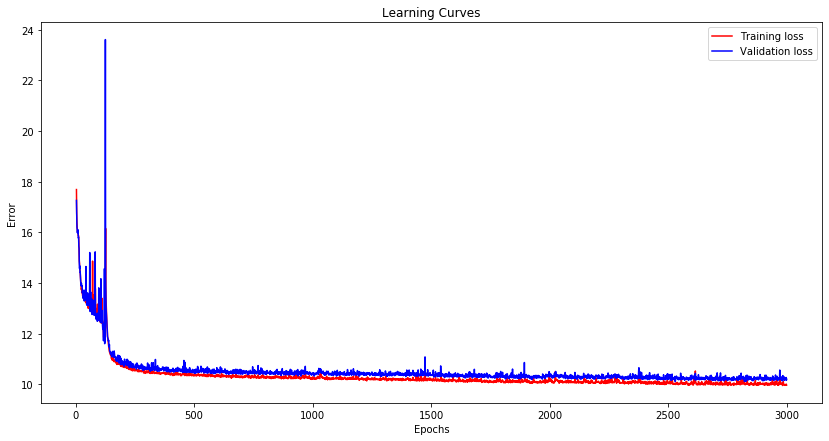

In [45]:
vae_Name='VAE_FC_h4_z15'
vae=vae_FC_h4_z15
train_data=VAE_train(vae, vae_Name)

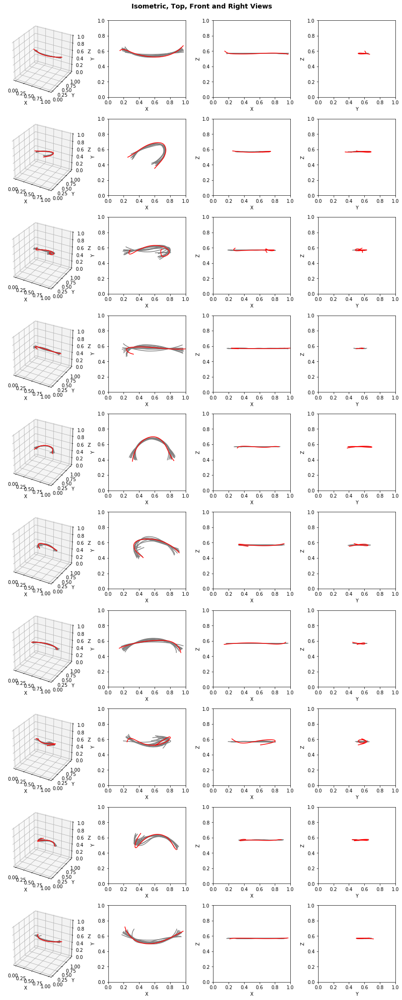

In [46]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=4, Z=30

Model: "model_69"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_35 (Flatten)            (None, 300)          0           input_35[0][0]                   
__________________________________________________________________________________________________
dense_199 (Dense)               (None, 200)          60200       flatten_35[0][0]                 
__________________________________________________________________________________________________
dense_200 (Dense)               (None, 150)          30150       dense_199[0][0]                  
___________________________________________________________________________________________

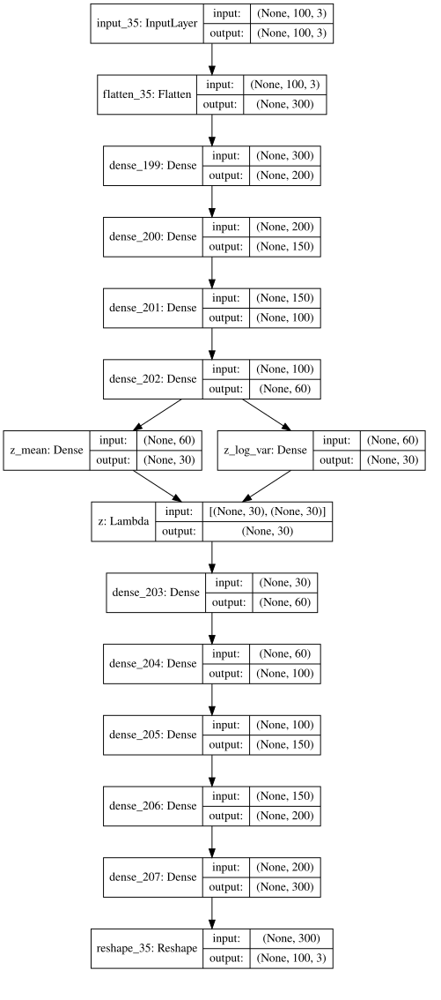

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 1s 31us/step - loss: 57.6506 - reconstruction_loss: 57.2793 - kl_loss: 0.2752 - val_loss: 35.9172 - val_reconstruction_loss: 35.7065 - val_kl_loss: 0.0916

Epoch 00001: val_loss improved from inf to 35.91721, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 15us/step - loss: 33.5523 - reconstruction_loss: 33.2656 - kl_loss: 0.2557 - val_loss: 29.7263 - val_reconstruction_loss: 28.6594 - val_kl_loss: 0.9761

Epoch 00002: val_loss improved from 35.91721 to 29.72635, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 14us/step - loss: 22.6015 - reconstruction_loss: 20.1504 - kl_loss: 2.4318 - val_loss: 20.1344 - val_reconstruction_loss: 17.6383 - val_kl_loss: 2.4347

Epoch 00003: val_loss improved from 29.72635 to 20.13438, saving model to models_VAE/VAE_FC_h4_z30.h

16067/16067 [==============================] - 0s 14us/step - loss: 12.2542 - reconstruction_loss: 9.4499 - kl_loss: 2.7989 - val_loss: 12.1776 - val_reconstruction_loss: 9.1018 - val_kl_loss: 3.0467

Epoch 00055: val_loss improved from 12.31764 to 12.17762, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 56/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.0664 - reconstruction_loss: 9.2308 - kl_loss: 2.8321 - val_loss: 12.1661 - val_reconstruction_loss: 9.1715 - val_kl_loss: 2.9604

Epoch 00056: val_loss improved from 12.17762 to 12.16607, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 57/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.0189 - reconstruction_loss: 9.1403 - kl_loss: 2.8731 - val_loss: 11.9099 - val_reconstruction_loss: 8.9533 - val_kl_loss: 2.9244

Epoch 00057: val_loss improved from 12.16607 to 11.90994, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 58/3000
16067/16067 [==============================

16067/16067 [==============================] - 0s 14us/step - loss: 10.9608 - reconstruction_loss: 7.5612 - kl_loss: 3.3968 - val_loss: 11.1659 - val_reconstruction_loss: 7.7369 - val_kl_loss: 3.3989

Epoch 00114: val_loss did not improve from 10.87797
Epoch 115/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8797 - reconstruction_loss: 7.4860 - kl_loss: 3.3901 - val_loss: 11.0365 - val_reconstruction_loss: 7.3999 - val_kl_loss: 3.6159

Epoch 00115: val_loss did not improve from 10.87797
Epoch 116/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.8767 - reconstruction_loss: 7.4670 - kl_loss: 3.4058 - val_loss: 11.0095 - val_reconstruction_loss: 7.4304 - val_kl_loss: 3.5524

Epoch 00116: val_loss did not improve from 10.87797
Epoch 117/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.7796 - reconstruction_loss: 7.3474 - kl_loss: 3.4306 - val_loss: 10.8523 - val_reconstruction_loss: 7.3788 - val_kl_loss: 3.4

16067/16067 [==============================] - 0s 14us/step - loss: 10.9037 - reconstruction_loss: 7.4062 - kl_loss: 3.4944 - val_loss: 10.8657 - val_reconstruction_loss: 7.4972 - val_kl_loss: 3.3415

Epoch 00174: val_loss did not improve from 10.63450
Epoch 175/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6481 - reconstruction_loss: 7.1784 - kl_loss: 3.4665 - val_loss: 10.6862 - val_reconstruction_loss: 7.1089 - val_kl_loss: 3.5511

Epoch 00175: val_loss did not improve from 10.63450
Epoch 176/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6758 - reconstruction_loss: 7.1604 - kl_loss: 3.5128 - val_loss: 10.6952 - val_reconstruction_loss: 7.2275 - val_kl_loss: 3.4457

Epoch 00176: val_loss did not improve from 10.63450
Epoch 177/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6189 - reconstruction_loss: 7.1533 - kl_loss: 3.4633 - val_loss: 10.9084 - val_reconstruction_loss: 7.5268 - val_kl_loss: 3.3

16067/16067 [==============================] - 0s 15us/step - loss: 10.5132 - reconstruction_loss: 7.0179 - kl_loss: 3.4901 - val_loss: 10.6803 - val_reconstruction_loss: 7.1321 - val_kl_loss: 3.5223

Epoch 00234: val_loss did not improve from 10.57464
Epoch 235/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5642 - reconstruction_loss: 7.0411 - kl_loss: 3.5196 - val_loss: 10.6822 - val_reconstruction_loss: 7.0447 - val_kl_loss: 3.6100

Epoch 00235: val_loss did not improve from 10.57464
Epoch 236/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6428 - reconstruction_loss: 7.1232 - kl_loss: 3.5153 - val_loss: 10.6515 - val_reconstruction_loss: 7.1710 - val_kl_loss: 3.4513

Epoch 00236: val_loss did not improve from 10.57464
Epoch 237/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6094 - reconstruction_loss: 7.0785 - kl_loss: 3.5303 - val_loss: 10.5860 - val_reconstruction_loss: 7.0799 - val_kl_loss: 3.4

16067/16067 [==============================] - 0s 14us/step - loss: 10.6091 - reconstruction_loss: 7.0165 - kl_loss: 3.5882 - val_loss: 10.6589 - val_reconstruction_loss: 7.0578 - val_kl_loss: 3.5707

Epoch 00294: val_loss did not improve from 10.49920
Epoch 295/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6013 - reconstruction_loss: 7.0103 - kl_loss: 3.5874 - val_loss: 10.6769 - val_reconstruction_loss: 7.1013 - val_kl_loss: 3.5443

Epoch 00295: val_loss did not improve from 10.49920
Epoch 296/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6057 - reconstruction_loss: 7.0349 - kl_loss: 3.5668 - val_loss: 10.6755 - val_reconstruction_loss: 7.1280 - val_kl_loss: 3.5218

Epoch 00296: val_loss did not improve from 10.49920
Epoch 297/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5997 - reconstruction_loss: 7.0133 - kl_loss: 3.5866 - val_loss: 10.7086 - val_reconstruction_loss: 7.0279 - val_kl_loss: 3.6


Epoch 00324: val_loss improved from 10.49920 to 10.49471, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 325/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4386 - reconstruction_loss: 6.8589 - kl_loss: 3.5759 - val_loss: 10.5663 - val_reconstruction_loss: 6.7432 - val_kl_loss: 3.7964

Epoch 00325: val_loss did not improve from 10.49471
Epoch 326/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4213 - reconstruction_loss: 6.8236 - kl_loss: 3.5940 - val_loss: 10.5800 - val_reconstruction_loss: 6.9401 - val_kl_loss: 3.6109

Epoch 00326: val_loss did not improve from 10.49471
Epoch 327/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4485 - reconstruction_loss: 6.8317 - kl_loss: 3.6127 - val_loss: 10.5972 - val_reconstruction_loss: 6.8796 - val_kl_loss: 3.6919

Epoch 00327: val_loss did not improve from 10.49471
Epoch 328/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4272 

16067/16067 [==============================] - 0s 14us/step - loss: 10.4091 - reconstruction_loss: 6.8062 - kl_loss: 3.5993 - val_loss: 10.5027 - val_reconstruction_loss: 6.9344 - val_kl_loss: 3.5415

Epoch 00355: val_loss did not improve from 10.41131
Epoch 356/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3858 - reconstruction_loss: 6.7798 - kl_loss: 3.6031 - val_loss: 10.4783 - val_reconstruction_loss: 6.8294 - val_kl_loss: 3.6193

Epoch 00356: val_loss did not improve from 10.41131
Epoch 357/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4030 - reconstruction_loss: 6.7923 - kl_loss: 3.6075 - val_loss: 10.5617 - val_reconstruction_loss: 6.9248 - val_kl_loss: 3.6111

Epoch 00357: val_loss did not improve from 10.41131
Epoch 358/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3955 - reconstruction_loss: 6.7984 - kl_loss: 3.5950 - val_loss: 10.6522 - val_reconstruction_loss: 7.0243 - val_kl_loss: 3.6


Epoch 00415: val_loss did not improve from 10.38375
Epoch 416/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3840 - reconstruction_loss: 6.8054 - kl_loss: 3.5774 - val_loss: 10.4427 - val_reconstruction_loss: 6.7412 - val_kl_loss: 3.6752

Epoch 00416: val_loss did not improve from 10.38375
Epoch 417/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3481 - reconstruction_loss: 6.7464 - kl_loss: 3.6003 - val_loss: 10.5837 - val_reconstruction_loss: 6.9284 - val_kl_loss: 3.6286

Epoch 00417: val_loss did not improve from 10.38375
Epoch 418/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4273 - reconstruction_loss: 6.8296 - kl_loss: 3.5939 - val_loss: 10.4276 - val_reconstruction_loss: 6.8352 - val_kl_loss: 3.5639

Epoch 00418: val_loss did not improve from 10.38375
Epoch 419/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3210 - reconstruction_loss: 6.7127 - kl_loss: 3.6034 - va


Epoch 00476: val_loss did not improve from 10.35012
Epoch 477/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5119 - reconstruction_loss: 6.9429 - kl_loss: 3.5659 - val_loss: 10.5461 - val_reconstruction_loss: 7.1245 - val_kl_loss: 3.3959

Epoch 00477: val_loss did not improve from 10.35012
Epoch 478/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3489 - reconstruction_loss: 6.7350 - kl_loss: 3.6093 - val_loss: 10.4350 - val_reconstruction_loss: 6.7681 - val_kl_loss: 3.6421

Epoch 00478: val_loss did not improve from 10.35012
Epoch 479/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3161 - reconstruction_loss: 6.6926 - kl_loss: 3.6206 - val_loss: 10.3648 - val_reconstruction_loss: 6.6848 - val_kl_loss: 3.6539

Epoch 00479: val_loss did not improve from 10.35012
Epoch 480/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3040 - reconstruction_loss: 6.6609 - kl_loss: 3.6412 - va


Epoch 00537: val_loss did not improve from 10.33867
Epoch 538/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2997 - reconstruction_loss: 6.6641 - kl_loss: 3.6332 - val_loss: 10.4173 - val_reconstruction_loss: 6.7911 - val_kl_loss: 3.5993

Epoch 00538: val_loss did not improve from 10.33867
Epoch 539/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3102 - reconstruction_loss: 6.7009 - kl_loss: 3.6058 - val_loss: 10.4185 - val_reconstruction_loss: 6.6330 - val_kl_loss: 3.7608

Epoch 00539: val_loss did not improve from 10.33867
Epoch 540/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2871 - reconstruction_loss: 6.6617 - kl_loss: 3.6220 - val_loss: 10.4770 - val_reconstruction_loss: 6.6822 - val_kl_loss: 3.7645

Epoch 00540: val_loss did not improve from 10.33867
Epoch 541/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3024 - reconstruction_loss: 6.6445 - kl_loss: 3.6552 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.3497 - reconstruction_loss: 6.7376 - kl_loss: 3.6084 - val_loss: 10.5490 - val_reconstruction_loss: 7.0176 - val_kl_loss: 3.5050

Epoch 00598: val_loss did not improve from 10.33336
Epoch 599/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3690 - reconstruction_loss: 6.7414 - kl_loss: 3.6248 - val_loss: 10.5637 - val_reconstruction_loss: 6.9047 - val_kl_loss: 3.6316

Epoch 00599: val_loss did not improve from 10.33336
Epoch 600/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3861 - reconstruction_loss: 6.7801 - kl_loss: 3.6022 - val_loss: 10.4544 - val_reconstruction_loss: 6.7777 - val_kl_loss: 3.6494

Epoch 00600: val_loss did not improve from 10.33336
Epoch 601/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2785 - reconstruction_loss: 6.6632 - kl_loss: 3.6109 - val_loss: 10.4650 - val_reconstruction_loss: 6.7899 - val_kl_loss: 3.6

16067/16067 [==============================] - 0s 14us/step - loss: 10.3259 - reconstruction_loss: 6.7048 - kl_loss: 3.6179 - val_loss: 10.3223 - val_reconstruction_loss: 6.6081 - val_kl_loss: 3.6929

Epoch 00658: val_loss improved from 10.32461 to 10.32235, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 659/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2174 - reconstruction_loss: 6.5781 - kl_loss: 3.6368 - val_loss: 10.3391 - val_reconstruction_loss: 6.6429 - val_kl_loss: 3.6696

Epoch 00659: val_loss did not improve from 10.32235
Epoch 660/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2213 - reconstruction_loss: 6.5885 - kl_loss: 3.6278 - val_loss: 10.3692 - val_reconstruction_loss: 6.6942 - val_kl_loss: 3.6505

Epoch 00660: val_loss did not improve from 10.32235
Epoch 661/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2814 - reconstruction_loss: 6.6207 - kl_loss: 3.6575 - val_loss: 10.4524 

16067/16067 [==============================] - 0s 14us/step - loss: 10.2681 - reconstruction_loss: 6.6209 - kl_loss: 3.6447 - val_loss: 10.4186 - val_reconstruction_loss: 6.7072 - val_kl_loss: 3.6858

Epoch 00718: val_loss did not improve from 10.30080
Epoch 719/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2532 - reconstruction_loss: 6.6109 - kl_loss: 3.6400 - val_loss: 10.3644 - val_reconstruction_loss: 6.6527 - val_kl_loss: 3.6855

Epoch 00719: val_loss did not improve from 10.30080
Epoch 720/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2445 - reconstruction_loss: 6.5830 - kl_loss: 3.6585 - val_loss: 10.3857 - val_reconstruction_loss: 6.6869 - val_kl_loss: 3.6716

Epoch 00720: val_loss did not improve from 10.30080
Epoch 721/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2217 - reconstruction_loss: 6.5724 - kl_loss: 3.6474 - val_loss: 10.4261 - val_reconstruction_loss: 6.7255 - val_kl_loss: 3.6


Epoch 00778: val_loss did not improve from 10.30026
Epoch 779/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2626 - reconstruction_loss: 6.6324 - kl_loss: 3.6280 - val_loss: 10.4381 - val_reconstruction_loss: 6.8190 - val_kl_loss: 3.5969

Epoch 00779: val_loss did not improve from 10.30026
Epoch 780/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2828 - reconstruction_loss: 6.6590 - kl_loss: 3.6209 - val_loss: 10.4231 - val_reconstruction_loss: 6.7748 - val_kl_loss: 3.6230

Epoch 00780: val_loss did not improve from 10.30026
Epoch 781/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2207 - reconstruction_loss: 6.5800 - kl_loss: 3.6381 - val_loss: 10.3777 - val_reconstruction_loss: 6.6333 - val_kl_loss: 3.7181

Epoch 00781: val_loss did not improve from 10.30026
Epoch 782/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2194 - reconstruction_loss: 6.5906 - kl_loss: 3.6262 - va


Epoch 00839: val_loss did not improve from 10.29676
Epoch 840/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2115 - reconstruction_loss: 6.5764 - kl_loss: 3.6326 - val_loss: 10.4667 - val_reconstruction_loss: 6.7587 - val_kl_loss: 3.6819

Epoch 00840: val_loss did not improve from 10.29676
Epoch 841/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2885 - reconstruction_loss: 6.6369 - kl_loss: 3.6493 - val_loss: 10.3874 - val_reconstruction_loss: 6.7108 - val_kl_loss: 3.6511

Epoch 00841: val_loss did not improve from 10.29676
Epoch 842/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4141 - reconstruction_loss: 6.7488 - kl_loss: 3.6627 - val_loss: 10.4386 - val_reconstruction_loss: 6.7761 - val_kl_loss: 3.6376

Epoch 00842: val_loss did not improve from 10.29676
Epoch 843/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2541 - reconstruction_loss: 6.5995 - kl_loss: 3.6521 - va


Epoch 00900: val_loss did not improve from 10.28899
Epoch 901/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2502 - reconstruction_loss: 6.6292 - kl_loss: 3.6176 - val_loss: 10.4152 - val_reconstruction_loss: 6.6183 - val_kl_loss: 3.7699

Epoch 00901: val_loss did not improve from 10.28899
Epoch 902/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2197 - reconstruction_loss: 6.5807 - kl_loss: 3.6348 - val_loss: 10.2552 - val_reconstruction_loss: 6.5646 - val_kl_loss: 3.6648

Epoch 00902: val_loss improved from 10.28899 to 10.25517, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 903/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2230 - reconstruction_loss: 6.5659 - kl_loss: 3.6547 - val_loss: 10.4332 - val_reconstruction_loss: 6.6859 - val_kl_loss: 3.7183

Epoch 00903: val_loss did not improve from 10.25517
Epoch 904/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2875 


Epoch 00961: val_loss did not improve from 10.25517
Epoch 962/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2561 - reconstruction_loss: 6.6068 - kl_loss: 3.6473 - val_loss: 10.3753 - val_reconstruction_loss: 6.7263 - val_kl_loss: 3.6214

Epoch 00962: val_loss did not improve from 10.25517
Epoch 963/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3686 - reconstruction_loss: 6.7238 - kl_loss: 3.6412 - val_loss: 10.5139 - val_reconstruction_loss: 6.8287 - val_kl_loss: 3.6603

Epoch 00963: val_loss did not improve from 10.25517
Epoch 964/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3134 - reconstruction_loss: 6.6571 - kl_loss: 3.6541 - val_loss: 10.5127 - val_reconstruction_loss: 6.8544 - val_kl_loss: 3.6293

Epoch 00964: val_loss did not improve from 10.25517
Epoch 965/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4547 - reconstruction_loss: 6.8417 - kl_loss: 3.6109 - va


Epoch 01022: val_loss did not improve from 10.25517
Epoch 1023/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2101 - reconstruction_loss: 6.5610 - kl_loss: 3.6460 - val_loss: 10.3010 - val_reconstruction_loss: 6.5745 - val_kl_loss: 3.7009

Epoch 01023: val_loss did not improve from 10.25517
Epoch 1024/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2067 - reconstruction_loss: 6.5423 - kl_loss: 3.6606 - val_loss: 10.4406 - val_reconstruction_loss: 6.7049 - val_kl_loss: 3.7098

Epoch 01024: val_loss did not improve from 10.25517
Epoch 1025/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2555 - reconstruction_loss: 6.6292 - kl_loss: 3.6223 - val_loss: 10.4062 - val_reconstruction_loss: 6.7028 - val_kl_loss: 3.6749

Epoch 01025: val_loss did not improve from 10.25517
Epoch 1026/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2520 - reconstruction_loss: 6.5887 - kl_loss: 3.6604 


Epoch 01083: val_loss did not improve from 10.25517
Epoch 1084/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2339 - reconstruction_loss: 6.5748 - kl_loss: 3.6569 - val_loss: 10.3654 - val_reconstruction_loss: 6.6932 - val_kl_loss: 3.6474

Epoch 01084: val_loss did not improve from 10.25517
Epoch 1085/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2254 - reconstruction_loss: 6.5491 - kl_loss: 3.6737 - val_loss: 10.3536 - val_reconstruction_loss: 6.7356 - val_kl_loss: 3.5921

Epoch 01085: val_loss did not improve from 10.25517
Epoch 1086/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1783 - reconstruction_loss: 6.5272 - kl_loss: 3.6471 - val_loss: 10.3419 - val_reconstruction_loss: 6.6309 - val_kl_loss: 3.6826

Epoch 01086: val_loss did not improve from 10.25517
Epoch 1087/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1952 - reconstruction_loss: 6.5395 - kl_loss: 3.6529 


Epoch 01144: val_loss did not improve from 10.24991
Epoch 1145/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1736 - reconstruction_loss: 6.5043 - kl_loss: 3.6655 - val_loss: 10.2817 - val_reconstruction_loss: 6.6056 - val_kl_loss: 3.6532

Epoch 01145: val_loss did not improve from 10.24991
Epoch 1146/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1591 - reconstruction_loss: 6.5050 - kl_loss: 3.6518 - val_loss: 10.3051 - val_reconstruction_loss: 6.5916 - val_kl_loss: 3.6893

Epoch 01146: val_loss did not improve from 10.24991
Epoch 1147/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2083 - reconstruction_loss: 6.5302 - kl_loss: 3.6742 - val_loss: 10.2993 - val_reconstruction_loss: 6.5785 - val_kl_loss: 3.6941

Epoch 01147: val_loss did not improve from 10.24991
Epoch 1148/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1968 - reconstruction_loss: 6.5319 - kl_loss: 3.6623 


Epoch 01205: val_loss did not improve from 10.24991
Epoch 1206/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1537 - reconstruction_loss: 6.5101 - kl_loss: 3.6399 - val_loss: 10.2670 - val_reconstruction_loss: 6.5173 - val_kl_loss: 3.7251

Epoch 01206: val_loss did not improve from 10.24991
Epoch 1207/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1847 - reconstruction_loss: 6.4978 - kl_loss: 3.6844 - val_loss: 10.3648 - val_reconstruction_loss: 6.6424 - val_kl_loss: 3.6955

Epoch 01207: val_loss did not improve from 10.24991
Epoch 1208/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2754 - reconstruction_loss: 6.6085 - kl_loss: 3.6641 - val_loss: 10.5096 - val_reconstruction_loss: 6.9092 - val_kl_loss: 3.5729

Epoch 01208: val_loss did not improve from 10.24991
Epoch 1209/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3159 - reconstruction_loss: 6.6779 - kl_loss: 3.6331 


Epoch 01266: val_loss did not improve from 10.24991
Epoch 1267/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2458 - reconstruction_loss: 6.5997 - kl_loss: 3.6420 - val_loss: 10.3133 - val_reconstruction_loss: 6.6400 - val_kl_loss: 3.6474

Epoch 01267: val_loss did not improve from 10.24991
Epoch 1268/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3236 - reconstruction_loss: 6.6524 - kl_loss: 3.6681 - val_loss: 10.4094 - val_reconstruction_loss: 6.7240 - val_kl_loss: 3.6589

Epoch 01268: val_loss did not improve from 10.24991
Epoch 1269/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1934 - reconstruction_loss: 6.5484 - kl_loss: 3.6421 - val_loss: 10.4051 - val_reconstruction_loss: 6.6482 - val_kl_loss: 3.7295

Epoch 01269: val_loss did not improve from 10.24991
Epoch 1270/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2332 - reconstruction_loss: 6.6045 - kl_loss: 3.6275 


Epoch 01327: val_loss did not improve from 10.24991
Epoch 1328/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1798 - reconstruction_loss: 6.4821 - kl_loss: 3.6930 - val_loss: 10.3031 - val_reconstruction_loss: 6.6128 - val_kl_loss: 3.6642

Epoch 01328: val_loss did not improve from 10.24991
Epoch 1329/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1825 - reconstruction_loss: 6.5261 - kl_loss: 3.6542 - val_loss: 10.2930 - val_reconstruction_loss: 6.6370 - val_kl_loss: 3.6300

Epoch 01329: val_loss did not improve from 10.24991
Epoch 1330/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3120 - reconstruction_loss: 6.6452 - kl_loss: 3.6625 - val_loss: 10.5999 - val_reconstruction_loss: 6.8623 - val_kl_loss: 3.7074

Epoch 01330: val_loss did not improve from 10.24991
Epoch 1331/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4589 - reconstruction_loss: 6.7960 - kl_loss: 3.6602 


Epoch 01388: val_loss did not improve from 10.24991
Epoch 1389/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2515 - reconstruction_loss: 6.5989 - kl_loss: 3.6485 - val_loss: 10.2860 - val_reconstruction_loss: 6.6176 - val_kl_loss: 3.6431

Epoch 01389: val_loss did not improve from 10.24991
Epoch 1390/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1953 - reconstruction_loss: 6.5754 - kl_loss: 3.6163 - val_loss: 10.3485 - val_reconstruction_loss: 6.7073 - val_kl_loss: 3.6158

Epoch 01390: val_loss did not improve from 10.24991
Epoch 1391/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2014 - reconstruction_loss: 6.5523 - kl_loss: 3.6459 - val_loss: 10.3136 - val_reconstruction_loss: 6.6158 - val_kl_loss: 3.6708

Epoch 01391: val_loss did not improve from 10.24991
Epoch 1392/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1804 - reconstruction_loss: 6.5358 - kl_loss: 3.6419 


Epoch 01449: val_loss did not improve from 10.24991
Epoch 1450/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8862 - reconstruction_loss: 7.1434 - kl_loss: 3.7391 - val_loss: 10.9622 - val_reconstruction_loss: 7.1796 - val_kl_loss: 3.7527

Epoch 01450: val_loss did not improve from 10.24991
Epoch 1451/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8510 - reconstruction_loss: 7.1355 - kl_loss: 3.7115 - val_loss: 10.9240 - val_reconstruction_loss: 7.1139 - val_kl_loss: 3.7828

Epoch 01451: val_loss did not improve from 10.24991
Epoch 1452/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8020 - reconstruction_loss: 7.0861 - kl_loss: 3.7128 - val_loss: 10.8767 - val_reconstruction_loss: 7.1361 - val_kl_loss: 3.7108

Epoch 01452: val_loss did not improve from 10.24991
Epoch 1453/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.7884 - reconstruction_loss: 7.1274 - kl_loss: 3.6568 


Epoch 01510: val_loss did not improve from 10.24991
Epoch 1511/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4896 - reconstruction_loss: 6.8565 - kl_loss: 3.6292 - val_loss: 10.5468 - val_reconstruction_loss: 6.8977 - val_kl_loss: 3.6195

Epoch 01511: val_loss did not improve from 10.24991
Epoch 1512/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4877 - reconstruction_loss: 6.8686 - kl_loss: 3.6151 - val_loss: 10.6436 - val_reconstruction_loss: 7.1466 - val_kl_loss: 3.4708

Epoch 01512: val_loss did not improve from 10.24991
Epoch 1513/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4280 - reconstruction_loss: 6.8115 - kl_loss: 3.6135 - val_loss: 10.4711 - val_reconstruction_loss: 6.8222 - val_kl_loss: 3.6217

Epoch 01513: val_loss did not improve from 10.24991
Epoch 1514/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3945 - reconstruction_loss: 6.7547 - kl_loss: 3.6364 


Epoch 01571: val_loss did not improve from 10.24991
Epoch 1572/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3708 - reconstruction_loss: 6.7039 - kl_loss: 3.6631 - val_loss: 10.4653 - val_reconstruction_loss: 6.8096 - val_kl_loss: 3.6292

Epoch 01572: val_loss did not improve from 10.24991
Epoch 1573/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4223 - reconstruction_loss: 6.7882 - kl_loss: 3.6302 - val_loss: 10.4606 - val_reconstruction_loss: 6.7912 - val_kl_loss: 3.6440

Epoch 01573: val_loss did not improve from 10.24991
Epoch 1574/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3551 - reconstruction_loss: 6.7010 - kl_loss: 3.6514 - val_loss: 10.4400 - val_reconstruction_loss: 6.7097 - val_kl_loss: 3.7016

Epoch 01574: val_loss did not improve from 10.24991
Epoch 1575/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3440 - reconstruction_loss: 6.6888 - kl_loss: 3.6520 


Epoch 01632: val_loss did not improve from 10.24991
Epoch 1633/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3185 - reconstruction_loss: 6.6654 - kl_loss: 3.6499 - val_loss: 10.3884 - val_reconstruction_loss: 6.7064 - val_kl_loss: 3.6561

Epoch 01633: val_loss did not improve from 10.24991
Epoch 1634/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3032 - reconstruction_loss: 6.6586 - kl_loss: 3.6424 - val_loss: 10.4442 - val_reconstruction_loss: 6.8031 - val_kl_loss: 3.6094

Epoch 01634: val_loss did not improve from 10.24991
Epoch 1635/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3033 - reconstruction_loss: 6.6572 - kl_loss: 3.6424 - val_loss: 10.4471 - val_reconstruction_loss: 6.7837 - val_kl_loss: 3.6385

Epoch 01635: val_loss did not improve from 10.24991
Epoch 1636/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3240 - reconstruction_loss: 6.6928 - kl_loss: 3.6279 


Epoch 01693: val_loss did not improve from 10.24991
Epoch 1694/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2848 - reconstruction_loss: 6.6297 - kl_loss: 3.6513 - val_loss: 10.3937 - val_reconstruction_loss: 6.6627 - val_kl_loss: 3.7064

Epoch 01694: val_loss did not improve from 10.24991
Epoch 1695/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2804 - reconstruction_loss: 6.6096 - kl_loss: 3.6679 - val_loss: 10.3906 - val_reconstruction_loss: 6.7068 - val_kl_loss: 3.6595

Epoch 01695: val_loss did not improve from 10.24991
Epoch 1696/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2939 - reconstruction_loss: 6.6256 - kl_loss: 3.6642 - val_loss: 10.4126 - val_reconstruction_loss: 6.7368 - val_kl_loss: 3.6478

Epoch 01696: val_loss did not improve from 10.24991
Epoch 1697/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3814 - reconstruction_loss: 6.7336 - kl_loss: 3.6457 


Epoch 01754: val_loss did not improve from 10.24991
Epoch 1755/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3092 - reconstruction_loss: 6.6418 - kl_loss: 3.6645 - val_loss: 10.4145 - val_reconstruction_loss: 6.6883 - val_kl_loss: 3.7008

Epoch 01755: val_loss did not improve from 10.24991
Epoch 1756/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3911 - reconstruction_loss: 6.7317 - kl_loss: 3.6574 - val_loss: 10.6806 - val_reconstruction_loss: 7.0545 - val_kl_loss: 3.5981

Epoch 01756: val_loss did not improve from 10.24991
Epoch 1757/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3991 - reconstruction_loss: 6.7600 - kl_loss: 3.6360 - val_loss: 10.5198 - val_reconstruction_loss: 6.7772 - val_kl_loss: 3.7156

Epoch 01757: val_loss did not improve from 10.24991
Epoch 1758/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2879 - reconstruction_loss: 6.6262 - kl_loss: 3.6583 


Epoch 01815: val_loss did not improve from 10.24991
Epoch 1816/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2455 - reconstruction_loss: 6.5848 - kl_loss: 3.6574 - val_loss: 10.4314 - val_reconstruction_loss: 6.6805 - val_kl_loss: 3.7240

Epoch 01816: val_loss did not improve from 10.24991
Epoch 1817/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2988 - reconstruction_loss: 6.6393 - kl_loss: 3.6552 - val_loss: 10.3724 - val_reconstruction_loss: 6.6884 - val_kl_loss: 3.6594

Epoch 01817: val_loss did not improve from 10.24991
Epoch 1818/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2870 - reconstruction_loss: 6.6163 - kl_loss: 3.6672 - val_loss: 10.3972 - val_reconstruction_loss: 6.6637 - val_kl_loss: 3.7042

Epoch 01818: val_loss did not improve from 10.24991
Epoch 1819/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2822 - reconstruction_loss: 6.6084 - kl_loss: 3.6705 


Epoch 01876: val_loss did not improve from 10.24991
Epoch 1877/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2445 - reconstruction_loss: 6.5586 - kl_loss: 3.6823 - val_loss: 10.3532 - val_reconstruction_loss: 6.6380 - val_kl_loss: 3.6892

Epoch 01877: val_loss did not improve from 10.24991
Epoch 1878/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2434 - reconstruction_loss: 6.5729 - kl_loss: 3.6676 - val_loss: 10.3814 - val_reconstruction_loss: 6.7241 - val_kl_loss: 3.6316

Epoch 01878: val_loss did not improve from 10.24991
Epoch 1879/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2219 - reconstruction_loss: 6.5697 - kl_loss: 3.6479 - val_loss: 10.3533 - val_reconstruction_loss: 6.6234 - val_kl_loss: 3.7058

Epoch 01879: val_loss did not improve from 10.24991
Epoch 1880/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2270 - reconstruction_loss: 6.5467 - kl_loss: 3.6772 


Epoch 01937: val_loss did not improve from 10.24991
Epoch 1938/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2335 - reconstruction_loss: 6.5701 - kl_loss: 3.6610 - val_loss: 10.4109 - val_reconstruction_loss: 6.6877 - val_kl_loss: 3.6945

Epoch 01938: val_loss did not improve from 10.24991
Epoch 1939/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2060 - reconstruction_loss: 6.5471 - kl_loss: 3.6555 - val_loss: 10.3358 - val_reconstruction_loss: 6.6480 - val_kl_loss: 3.6616

Epoch 01939: val_loss did not improve from 10.24991
Epoch 1940/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2681 - reconstruction_loss: 6.6006 - kl_loss: 3.6643 - val_loss: 10.4780 - val_reconstruction_loss: 6.7795 - val_kl_loss: 3.6703

Epoch 01940: val_loss did not improve from 10.24991
Epoch 1941/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2947 - reconstruction_loss: 6.6377 - kl_loss: 3.6530 


Epoch 01998: val_loss did not improve from 10.24991
Epoch 1999/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2929 - reconstruction_loss: 6.5996 - kl_loss: 3.6901 - val_loss: 10.3714 - val_reconstruction_loss: 6.6964 - val_kl_loss: 3.6482

Epoch 01999: val_loss did not improve from 10.24991
Epoch 2000/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8797 - reconstruction_loss: 7.2642 - kl_loss: 3.6171 - val_loss: 12.0009 - val_reconstruction_loss: 8.4594 - val_kl_loss: 3.5077

Epoch 02000: val_loss did not improve from 10.24991
Epoch 2001/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.9448 - reconstruction_loss: 7.3694 - kl_loss: 3.5693 - val_loss: 10.5452 - val_reconstruction_loss: 6.8884 - val_kl_loss: 3.6281

Epoch 02001: val_loss did not improve from 10.24991
Epoch 2002/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3877 - reconstruction_loss: 6.7615 - kl_loss: 3.6230 


Epoch 02059: val_loss did not improve from 10.24991
Epoch 2060/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1970 - reconstruction_loss: 6.5386 - kl_loss: 3.6556 - val_loss: 10.3236 - val_reconstruction_loss: 6.5498 - val_kl_loss: 3.7482

Epoch 02060: val_loss did not improve from 10.24991
Epoch 2061/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2467 - reconstruction_loss: 6.5510 - kl_loss: 3.6919 - val_loss: 10.4592 - val_reconstruction_loss: 6.7622 - val_kl_loss: 3.6743

Epoch 02061: val_loss did not improve from 10.24991
Epoch 2062/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2297 - reconstruction_loss: 6.5431 - kl_loss: 3.6831 - val_loss: 10.3574 - val_reconstruction_loss: 6.6002 - val_kl_loss: 3.7282

Epoch 02062: val_loss did not improve from 10.24991
Epoch 2063/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3734 - reconstruction_loss: 6.7198 - kl_loss: 3.6505 


Epoch 02120: val_loss did not improve from 10.24991
Epoch 2121/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3299 - reconstruction_loss: 6.6790 - kl_loss: 3.6485 - val_loss: 10.3821 - val_reconstruction_loss: 6.6935 - val_kl_loss: 3.6636

Epoch 02121: val_loss did not improve from 10.24991
Epoch 2122/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2928 - reconstruction_loss: 6.6331 - kl_loss: 3.6550 - val_loss: 10.3849 - val_reconstruction_loss: 6.6600 - val_kl_loss: 3.6986

Epoch 02122: val_loss did not improve from 10.24991
Epoch 2123/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3405 - reconstruction_loss: 6.6672 - kl_loss: 3.6692 - val_loss: 10.4768 - val_reconstruction_loss: 6.7792 - val_kl_loss: 3.6712

Epoch 02123: val_loss did not improve from 10.24991
Epoch 2124/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3343 - reconstruction_loss: 6.6631 - kl_loss: 3.6675 


Epoch 02181: val_loss did not improve from 10.24991
Epoch 2182/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2306 - reconstruction_loss: 6.5610 - kl_loss: 3.6662 - val_loss: 10.3306 - val_reconstruction_loss: 6.6029 - val_kl_loss: 3.7005

Epoch 02182: val_loss did not improve from 10.24991
Epoch 2183/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1683 - reconstruction_loss: 6.5042 - kl_loss: 3.6603 - val_loss: 10.3642 - val_reconstruction_loss: 6.6321 - val_kl_loss: 3.7068

Epoch 02183: val_loss did not improve from 10.24991
Epoch 2184/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2161 - reconstruction_loss: 6.5163 - kl_loss: 3.6967 - val_loss: 10.4583 - val_reconstruction_loss: 6.7209 - val_kl_loss: 3.7125

Epoch 02184: val_loss did not improve from 10.24991
Epoch 2185/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2628 - reconstruction_loss: 6.5741 - kl_loss: 3.6861 


Epoch 02242: val_loss did not improve from 10.24991
Epoch 2243/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2834 - reconstruction_loss: 6.6467 - kl_loss: 3.6324 - val_loss: 10.3323 - val_reconstruction_loss: 6.6385 - val_kl_loss: 3.6680

Epoch 02243: val_loss did not improve from 10.24991
Epoch 2244/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2185 - reconstruction_loss: 6.5514 - kl_loss: 3.6630 - val_loss: 10.3441 - val_reconstruction_loss: 6.6929 - val_kl_loss: 3.6250

Epoch 02244: val_loss did not improve from 10.24991
Epoch 2245/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2075 - reconstruction_loss: 6.5482 - kl_loss: 3.6562 - val_loss: 10.3436 - val_reconstruction_loss: 6.6309 - val_kl_loss: 3.6834

Epoch 02245: val_loss did not improve from 10.24991
Epoch 2246/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2202 - reconstruction_loss: 6.5371 - kl_loss: 3.6787 

16067/16067 [==============================] - 0s 14us/step - loss: 10.2498 - reconstruction_loss: 6.5855 - kl_loss: 3.6613 - val_loss: 10.3920 - val_reconstruction_loss: 6.6233 - val_kl_loss: 3.7453

Epoch 02303: val_loss did not improve from 10.23047
Epoch 2304/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2636 - reconstruction_loss: 6.5893 - kl_loss: 3.6696 - val_loss: 10.3252 - val_reconstruction_loss: 6.5924 - val_kl_loss: 3.7056

Epoch 02304: val_loss did not improve from 10.23047
Epoch 2305/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2552 - reconstruction_loss: 6.5558 - kl_loss: 3.6963 - val_loss: 10.4094 - val_reconstruction_loss: 6.7050 - val_kl_loss: 3.6754

Epoch 02305: val_loss did not improve from 10.23047
Epoch 2306/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2367 - reconstruction_loss: 6.5649 - kl_loss: 3.6686 - val_loss: 10.3700 - val_reconstruction_loss: 6.6304 - val_kl_loss: 


Epoch 02333: val_loss did not improve from 10.23047
Epoch 2334/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3229 - reconstruction_loss: 6.6427 - kl_loss: 3.6764 - val_loss: 10.4003 - val_reconstruction_loss: 6.6241 - val_kl_loss: 3.7488

Epoch 02334: val_loss did not improve from 10.23047
Epoch 2335/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2642 - reconstruction_loss: 6.5717 - kl_loss: 3.6895 - val_loss: 10.4017 - val_reconstruction_loss: 6.6723 - val_kl_loss: 3.7021

Epoch 02335: val_loss did not improve from 10.23047
Epoch 2336/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3474 - reconstruction_loss: 6.6739 - kl_loss: 3.6695 - val_loss: 10.4383 - val_reconstruction_loss: 6.7182 - val_kl_loss: 3.6928

Epoch 02336: val_loss did not improve from 10.23047
Epoch 2337/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3015 - reconstruction_loss: 6.6105 - kl_loss: 3.6875 


Epoch 02394: val_loss did not improve from 10.23047
Epoch 2395/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1675 - reconstruction_loss: 6.5009 - kl_loss: 3.6636 - val_loss: 10.3281 - val_reconstruction_loss: 6.6190 - val_kl_loss: 3.6839

Epoch 02395: val_loss did not improve from 10.23047
Epoch 2396/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1703 - reconstruction_loss: 6.4758 - kl_loss: 3.6932 - val_loss: 10.4069 - val_reconstruction_loss: 6.6537 - val_kl_loss: 3.7281

Epoch 02396: val_loss did not improve from 10.23047
Epoch 2397/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1935 - reconstruction_loss: 6.5376 - kl_loss: 3.6538 - val_loss: 10.3671 - val_reconstruction_loss: 6.6700 - val_kl_loss: 3.6709

Epoch 02397: val_loss did not improve from 10.23047
Epoch 2398/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1597 - reconstruction_loss: 6.4803 - kl_loss: 3.6770 


Epoch 02455: val_loss did not improve from 10.23047
Epoch 2456/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3017 - reconstruction_loss: 6.6180 - kl_loss: 3.6808 - val_loss: 10.4087 - val_reconstruction_loss: 6.6669 - val_kl_loss: 3.7147

Epoch 02456: val_loss did not improve from 10.23047
Epoch 2457/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1574 - reconstruction_loss: 6.4723 - kl_loss: 3.6829 - val_loss: 10.2890 - val_reconstruction_loss: 6.6220 - val_kl_loss: 3.6391

Epoch 02457: val_loss did not improve from 10.23047
Epoch 2458/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1756 - reconstruction_loss: 6.4969 - kl_loss: 3.6752 - val_loss: 10.3334 - val_reconstruction_loss: 6.6098 - val_kl_loss: 3.6990

Epoch 02458: val_loss did not improve from 10.23047
Epoch 2459/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2128 - reconstruction_loss: 6.5134 - kl_loss: 3.6964 


Epoch 02516: val_loss did not improve from 10.23047
Epoch 2517/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1551 - reconstruction_loss: 6.4572 - kl_loss: 3.6939 - val_loss: 10.2790 - val_reconstruction_loss: 6.5174 - val_kl_loss: 3.7347

Epoch 02517: val_loss did not improve from 10.23047
Epoch 2518/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1764 - reconstruction_loss: 6.4967 - kl_loss: 3.6768 - val_loss: 10.3009 - val_reconstruction_loss: 6.5217 - val_kl_loss: 3.7506

Epoch 02518: val_loss did not improve from 10.23047
Epoch 2519/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1818 - reconstruction_loss: 6.4786 - kl_loss: 3.7004 - val_loss: 10.2797 - val_reconstruction_loss: 6.5323 - val_kl_loss: 3.7210

Epoch 02519: val_loss did not improve from 10.23047
Epoch 2520/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2311 - reconstruction_loss: 6.5224 - kl_loss: 3.7060 


Epoch 02577: val_loss did not improve from 10.23047
Epoch 2578/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2073 - reconstruction_loss: 6.5232 - kl_loss: 3.6814 - val_loss: 10.3581 - val_reconstruction_loss: 6.5750 - val_kl_loss: 3.7586

Epoch 02578: val_loss did not improve from 10.23047
Epoch 2579/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2371 - reconstruction_loss: 6.5617 - kl_loss: 3.6721 - val_loss: 10.3629 - val_reconstruction_loss: 6.6357 - val_kl_loss: 3.7007

Epoch 02579: val_loss did not improve from 10.23047
Epoch 2580/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2208 - reconstruction_loss: 6.5235 - kl_loss: 3.6959 - val_loss: 10.2997 - val_reconstruction_loss: 6.5032 - val_kl_loss: 3.7716

Epoch 02580: val_loss did not improve from 10.23047
Epoch 2581/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1758 - reconstruction_loss: 6.4834 - kl_loss: 3.6897 


Epoch 02638: val_loss did not improve from 10.23047
Epoch 2639/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1743 - reconstruction_loss: 6.4910 - kl_loss: 3.6815 - val_loss: 10.3145 - val_reconstruction_loss: 6.5621 - val_kl_loss: 3.7252

Epoch 02639: val_loss did not improve from 10.23047
Epoch 2640/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1607 - reconstruction_loss: 6.4617 - kl_loss: 3.6964 - val_loss: 10.2803 - val_reconstruction_loss: 6.5756 - val_kl_loss: 3.6787

Epoch 02640: val_loss did not improve from 10.23047
Epoch 2641/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1532 - reconstruction_loss: 6.4537 - kl_loss: 3.6954 - val_loss: 10.3353 - val_reconstruction_loss: 6.5255 - val_kl_loss: 3.7847

Epoch 02641: val_loss did not improve from 10.23047
Epoch 2642/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1704 - reconstruction_loss: 6.4871 - kl_loss: 3.6805 

16067/16067 [==============================] - 0s 14us/step - loss: 10.2945 - reconstruction_loss: 6.5926 - kl_loss: 3.6990 - val_loss: 10.3132 - val_reconstruction_loss: 6.6228 - val_kl_loss: 3.6608

Epoch 02699: val_loss did not improve from 10.22889
Epoch 2700/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2107 - reconstruction_loss: 6.5236 - kl_loss: 3.6844 - val_loss: 10.4084 - val_reconstruction_loss: 6.7382 - val_kl_loss: 3.6423

Epoch 02700: val_loss did not improve from 10.22889
Epoch 2701/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2606 - reconstruction_loss: 6.5553 - kl_loss: 3.7013 - val_loss: 10.3935 - val_reconstruction_loss: 6.6420 - val_kl_loss: 3.7271

Epoch 02701: val_loss did not improve from 10.22889
Epoch 2702/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2630 - reconstruction_loss: 6.5728 - kl_loss: 3.6869 - val_loss: 10.7090 - val_reconstruction_loss: 7.0011 - val_kl_loss: 


Epoch 02729: val_loss did not improve from 10.22889
Epoch 2730/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2403 - reconstruction_loss: 6.5529 - kl_loss: 3.6844 - val_loss: 10.3570 - val_reconstruction_loss: 6.6789 - val_kl_loss: 3.6506

Epoch 02730: val_loss did not improve from 10.22889
Epoch 2731/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1821 - reconstruction_loss: 6.4881 - kl_loss: 3.6907 - val_loss: 10.3047 - val_reconstruction_loss: 6.5494 - val_kl_loss: 3.7292

Epoch 02731: val_loss did not improve from 10.22889
Epoch 2732/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1876 - reconstruction_loss: 6.4905 - kl_loss: 3.6938 - val_loss: 10.2963 - val_reconstruction_loss: 6.5315 - val_kl_loss: 3.7379

Epoch 02732: val_loss did not improve from 10.22889
Epoch 2733/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1412 - reconstruction_loss: 6.4273 - kl_loss: 3.7123 

16067/16067 [==============================] - 0s 15us/step - loss: 10.1620 - reconstruction_loss: 6.4529 - kl_loss: 3.7067 - val_loss: 10.2855 - val_reconstruction_loss: 6.5448 - val_kl_loss: 3.7153

Epoch 02790: val_loss did not improve from 10.20464
Epoch 2791/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1629 - reconstruction_loss: 6.4506 - kl_loss: 3.7082 - val_loss: 10.2462 - val_reconstruction_loss: 6.5550 - val_kl_loss: 3.6652

Epoch 02791: val_loss did not improve from 10.20464
Epoch 2792/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1551 - reconstruction_loss: 6.4668 - kl_loss: 3.6860 - val_loss: 10.3093 - val_reconstruction_loss: 6.5844 - val_kl_loss: 3.6992

Epoch 02792: val_loss did not improve from 10.20464
Epoch 2793/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1924 - reconstruction_loss: 6.4815 - kl_loss: 3.7078 - val_loss: 10.3018 - val_reconstruction_loss: 6.5096 - val_kl_loss: 


Epoch 02820: val_loss improved from 10.20464 to 10.19114, saving model to models_VAE/VAE_FC_h4_z30.hdf5
Epoch 2821/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1505 - reconstruction_loss: 6.4357 - kl_loss: 3.7108 - val_loss: 10.2279 - val_reconstruction_loss: 6.4262 - val_kl_loss: 3.7765

Epoch 02821: val_loss did not improve from 10.19114
Epoch 2822/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2359 - reconstruction_loss: 6.5128 - kl_loss: 3.7200 - val_loss: 10.4840 - val_reconstruction_loss: 6.6780 - val_kl_loss: 3.7773

Epoch 02822: val_loss did not improve from 10.19114
Epoch 2823/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2324 - reconstruction_loss: 6.5335 - kl_loss: 3.6958 - val_loss: 10.2808 - val_reconstruction_loss: 6.5651 - val_kl_loss: 3.6930

Epoch 02823: val_loss did not improve from 10.19114
Epoch 2824/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1


Epoch 02881: val_loss did not improve from 10.19114
Epoch 2882/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1330 - reconstruction_loss: 6.4234 - kl_loss: 3.7061 - val_loss: 10.2641 - val_reconstruction_loss: 6.5631 - val_kl_loss: 3.6764

Epoch 02882: val_loss did not improve from 10.19114
Epoch 2883/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1327 - reconstruction_loss: 6.4262 - kl_loss: 3.7042 - val_loss: 10.2545 - val_reconstruction_loss: 6.4592 - val_kl_loss: 3.7694

Epoch 02883: val_loss did not improve from 10.19114
Epoch 2884/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1387 - reconstruction_loss: 6.4360 - kl_loss: 3.7000 - val_loss: 10.2606 - val_reconstruction_loss: 6.5174 - val_kl_loss: 3.7180

Epoch 02884: val_loss did not improve from 10.19114
Epoch 2885/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1276 - reconstruction_loss: 6.4281 - kl_loss: 3.6960 


Epoch 02942: val_loss did not improve from 10.19114
Epoch 2943/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1896 - reconstruction_loss: 6.4797 - kl_loss: 3.7063 - val_loss: 10.3113 - val_reconstruction_loss: 6.5899 - val_kl_loss: 3.6955

Epoch 02943: val_loss did not improve from 10.19114
Epoch 2944/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1683 - reconstruction_loss: 6.4812 - kl_loss: 3.6835 - val_loss: 10.3274 - val_reconstruction_loss: 6.5586 - val_kl_loss: 3.7413

Epoch 02944: val_loss did not improve from 10.19114
Epoch 2945/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2025 - reconstruction_loss: 6.4867 - kl_loss: 3.7136 - val_loss: 10.2810 - val_reconstruction_loss: 6.5686 - val_kl_loss: 3.6846

Epoch 02945: val_loss did not improve from 10.19114
Epoch 2946/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2288 - reconstruction_loss: 6.5113 - kl_loss: 3.7143 

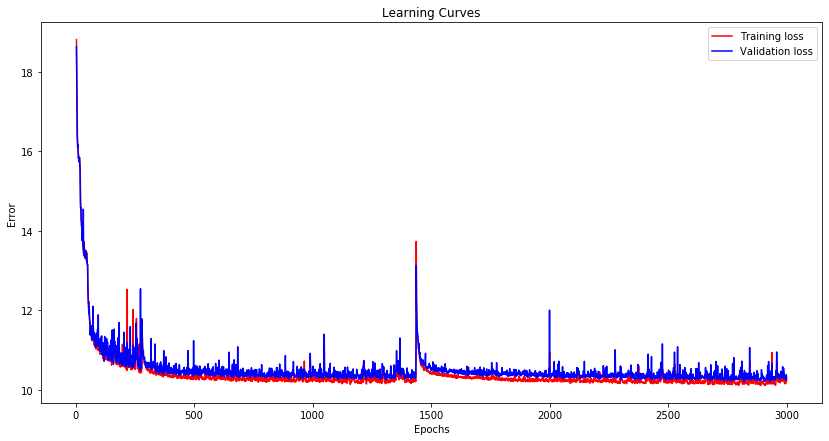

In [47]:
vae_Name='VAE_FC_h4_z30'
vae=vae_FC_h4_z30
train_data=VAE_train(vae, vae_Name)

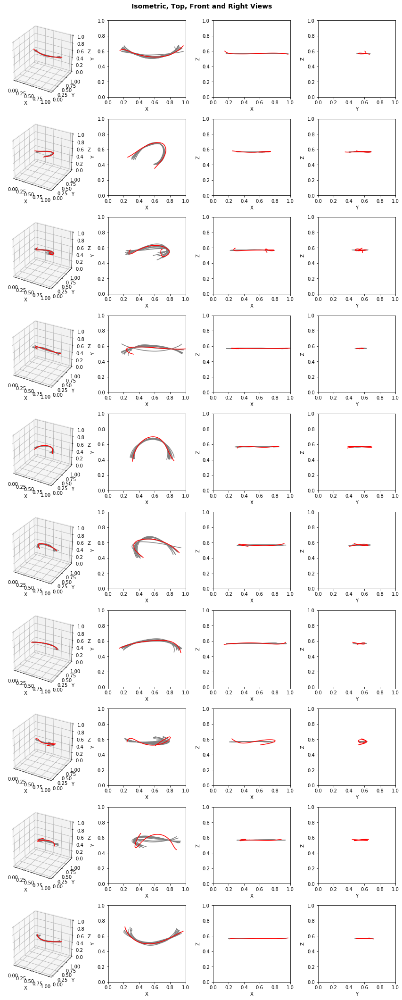

In [48]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### hidden=4, Z=60

Model: "model_71"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_36 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
flatten_36 (Flatten)            (None, 300)          0           input_36[0][0]                   
__________________________________________________________________________________________________
dense_208 (Dense)               (None, 200)          60200       flatten_36[0][0]                 
__________________________________________________________________________________________________
dense_209 (Dense)               (None, 150)          30150       dense_208[0][0]                  
___________________________________________________________________________________________

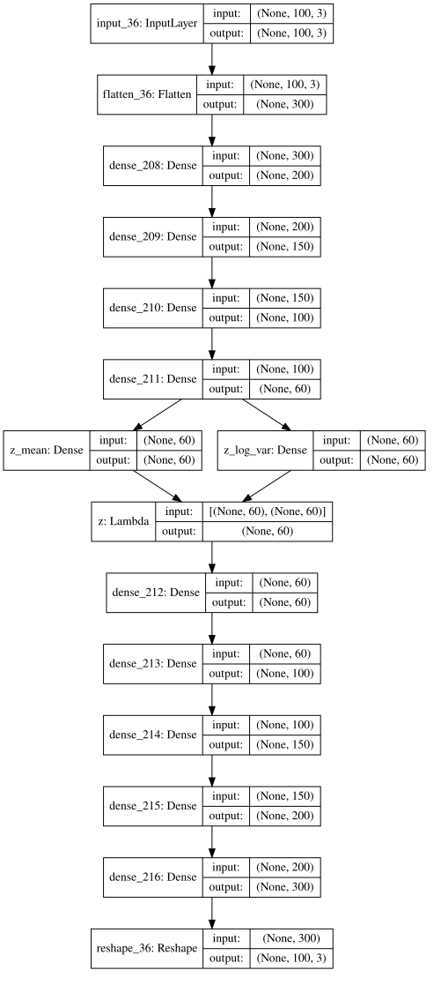

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 1s 32us/step - loss: 57.3922 - reconstruction_loss: 57.1190 - kl_loss: 0.1747 - val_loss: 36.0451 - val_reconstruction_loss: 35.8802 - val_kl_loss: 0.0448

Epoch 00001: val_loss improved from inf to 36.04510, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 15us/step - loss: 34.4326 - reconstruction_loss: 34.3546 - kl_loss: 0.0540 - val_loss: 32.7733 - val_reconstruction_loss: 32.5915 - val_kl_loss: 0.0698

Epoch 00002: val_loss improved from 36.04510 to 32.77330, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 15us/step - loss: 32.1423 - reconstruction_loss: 32.0168 - kl_loss: 0.1067 - val_loss: 30.9649 - val_reconstruction_loss: 30.6141 - val_kl_loss: 0.2419

Epoch 00003: val_loss improved from 32.77330 to 30.96489, saving model to models_VAE/VAE_FC_h4_z60.h

16067/16067 [==============================] - 0s 15us/step - loss: 14.9423 - reconstruction_loss: 13.0739 - kl_loss: 1.8600 - val_loss: 14.8621 - val_reconstruction_loss: 12.8238 - val_kl_loss: 1.9890

Epoch 00027: val_loss improved from 15.02250 to 14.86213, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 15us/step - loss: 14.5684 - reconstruction_loss: 12.6196 - kl_loss: 1.9428 - val_loss: 14.5059 - val_reconstruction_loss: 12.4800 - val_kl_loss: 1.9768

Epoch 00028: val_loss improved from 14.86213 to 14.50595, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 14us/step - loss: 14.2806 - reconstruction_loss: 12.2641 - kl_loss: 2.0090 - val_loss: 14.5815 - val_reconstruction_loss: 12.5860 - val_kl_loss: 1.9429

Epoch 00029: val_loss did not improve from 14.50595
Epoch 30/3000
16067/16067 [==============================] - 0s 14us/step - loss: 14.2066 - reconstruct


Epoch 00055: val_loss did not improve from 13.29293
Epoch 56/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.4330 - reconstruction_loss: 11.1705 - kl_loss: 2.2540 - val_loss: 13.4314 - val_reconstruction_loss: 11.0381 - val_kl_loss: 2.3499

Epoch 00056: val_loss did not improve from 13.29293
Epoch 57/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.2940 - reconstruction_loss: 11.0326 - kl_loss: 2.2560 - val_loss: 13.2656 - val_reconstruction_loss: 10.9260 - val_kl_loss: 2.2929

Epoch 00057: val_loss improved from 13.29293 to 13.26556, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 58/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.2861 - reconstruction_loss: 10.9946 - kl_loss: 2.2872 - val_loss: 13.4599 - val_reconstruction_loss: 11.2366 - val_kl_loss: 2.1817

Epoch 00058: val_loss did not improve from 13.26556
Epoch 59/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.277

16067/16067 [==============================] - 0s 14us/step - loss: 12.9746 - reconstruction_loss: 10.5963 - kl_loss: 2.3717 - val_loss: 12.9258 - val_reconstruction_loss: 10.4786 - val_kl_loss: 2.4095

Epoch 00085: val_loss improved from 12.94251 to 12.92582, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 86/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.0198 - reconstruction_loss: 10.6800 - kl_loss: 2.3337 - val_loss: 13.0223 - val_reconstruction_loss: 10.6018 - val_kl_loss: 2.3796

Epoch 00086: val_loss did not improve from 12.92582
Epoch 87/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.9635 - reconstruction_loss: 10.6127 - kl_loss: 2.3438 - val_loss: 13.0208 - val_reconstruction_loss: 10.7038 - val_kl_loss: 2.2759

Epoch 00087: val_loss did not improve from 12.92582
Epoch 88/3000
16067/16067 [==============================] - 0s 15us/step - loss: 12.8487 - reconstruction_loss: 10.5043 - kl_loss: 2.3398 - val_loss: 12.8

16067/16067 [==============================] - 0s 15us/step - loss: 12.5779 - reconstruction_loss: 10.0830 - kl_loss: 2.4907 - val_loss: 12.5751 - val_reconstruction_loss: 10.0163 - val_kl_loss: 2.5170

Epoch 00143: val_loss did not improve from 12.45936
Epoch 144/3000
16067/16067 [==============================] - 0s 15us/step - loss: 12.6994 - reconstruction_loss: 10.1805 - kl_loss: 2.5154 - val_loss: 12.6902 - val_reconstruction_loss: 10.2635 - val_kl_loss: 2.3940

Epoch 00144: val_loss did not improve from 12.45936
Epoch 145/3000
16067/16067 [==============================] - 0s 15us/step - loss: 12.4635 - reconstruction_loss: 9.9500 - kl_loss: 2.5060 - val_loss: 12.3482 - val_reconstruction_loss: 9.7086 - val_kl_loss: 2.6003

Epoch 00145: val_loss improved from 12.45936 to 12.34818, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 146/3000
16067/16067 [==============================] - 0s 14us/step - loss: 12.9336 - reconstruction_loss: 10.4747 - kl_loss: 2.4547 - val_loss: 12.


Epoch 00172: val_loss did not improve from 12.05250
Epoch 173/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.4644 - reconstruction_loss: 10.4926 - kl_loss: 2.9670 - val_loss: 13.2806 - val_reconstruction_loss: 10.1899 - val_kl_loss: 3.0546

Epoch 00173: val_loss did not improve from 12.05250
Epoch 174/3000
16067/16067 [==============================] - 0s 14us/step - loss: 13.1679 - reconstruction_loss: 10.1918 - kl_loss: 2.9706 - val_loss: 13.1188 - val_reconstruction_loss: 10.1989 - val_kl_loss: 2.8863

Epoch 00174: val_loss did not improve from 12.05250
Epoch 175/3000
16067/16067 [==============================] - 0s 15us/step - loss: 13.1061 - reconstruction_loss: 10.1663 - kl_loss: 2.9362 - val_loss: 13.0814 - val_reconstruction_loss: 10.2043 - val_kl_loss: 2.8411

Epoch 00175: val_loss did not improve from 12.05250
Epoch 176/3000
16067/16067 [==============================] - 0s 15us/step - loss: 12.8847 - reconstruction_loss: 9.9739 - kl_loss: 2.906

16067/16067 [==============================] - 0s 15us/step - loss: 10.8868 - reconstruction_loss: 7.4560 - kl_loss: 3.4258 - val_loss: 11.1849 - val_reconstruction_loss: 7.7561 - val_kl_loss: 3.3992

Epoch 00230: val_loss did not improve from 10.92186
Epoch 231/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.9728 - reconstruction_loss: 7.5378 - kl_loss: 3.4308 - val_loss: 10.9547 - val_reconstruction_loss: 7.3440 - val_kl_loss: 3.5813

Epoch 00231: val_loss did not improve from 10.92186
Epoch 232/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.8656 - reconstruction_loss: 7.4242 - kl_loss: 3.4369 - val_loss: 11.0496 - val_reconstruction_loss: 7.5581 - val_kl_loss: 3.4602

Epoch 00232: val_loss did not improve from 10.92186
Epoch 233/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.9057 - reconstruction_loss: 7.4523 - kl_loss: 3.4504 - val_loss: 11.1181 - val_reconstruction_loss: 7.6432 - val_kl_loss: 3.4

16067/16067 [==============================] - 0s 15us/step - loss: 10.9166 - reconstruction_loss: 7.4763 - kl_loss: 3.4350 - val_loss: 11.0834 - val_reconstruction_loss: 7.5265 - val_kl_loss: 3.5277

Epoch 00290: val_loss did not improve from 10.67494
Epoch 291/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.8970 - reconstruction_loss: 7.3821 - kl_loss: 3.5112 - val_loss: 10.8047 - val_reconstruction_loss: 7.1927 - val_kl_loss: 3.5877

Epoch 00291: val_loss did not improve from 10.67494
Epoch 292/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.7680 - reconstruction_loss: 7.2253 - kl_loss: 3.5374 - val_loss: 10.7972 - val_reconstruction_loss: 7.3085 - val_kl_loss: 3.4616

Epoch 00292: val_loss did not improve from 10.67494
Epoch 293/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6459 - reconstruction_loss: 7.1343 - kl_loss: 3.5084 - val_loss: 10.9069 - val_reconstruction_loss: 7.3683 - val_kl_loss: 3.5


Epoch 00320: val_loss did not improve from 10.67494
Epoch 321/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5754 - reconstruction_loss: 7.0584 - kl_loss: 3.5144 - val_loss: 10.6242 - val_reconstruction_loss: 7.0885 - val_kl_loss: 3.5100

Epoch 00321: val_loss improved from 10.67494 to 10.62418, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 322/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6302 - reconstruction_loss: 7.1326 - kl_loss: 3.4938 - val_loss: 10.6902 - val_reconstruction_loss: 7.1765 - val_kl_loss: 3.4870

Epoch 00322: val_loss did not improve from 10.62418
Epoch 323/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6587 - reconstruction_loss: 7.1404 - kl_loss: 3.5158 - val_loss: 10.7765 - val_reconstruction_loss: 7.1715 - val_kl_loss: 3.5798

Epoch 00323: val_loss did not improve from 10.62418
Epoch 324/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.7451 

16067/16067 [==============================] - 0s 14us/step - loss: 10.7056 - reconstruction_loss: 7.1734 - kl_loss: 3.5288 - val_loss: 11.1559 - val_reconstruction_loss: 7.4901 - val_kl_loss: 3.6334

Epoch 00351: val_loss did not improve from 10.59216
Epoch 352/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.8218 - reconstruction_loss: 7.3257 - kl_loss: 3.4931 - val_loss: 10.7840 - val_reconstruction_loss: 7.2853 - val_kl_loss: 3.4695

Epoch 00352: val_loss did not improve from 10.59216
Epoch 353/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6486 - reconstruction_loss: 7.1666 - kl_loss: 3.4784 - val_loss: 10.7837 - val_reconstruction_loss: 7.2630 - val_kl_loss: 3.4931

Epoch 00353: val_loss did not improve from 10.59216
Epoch 354/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6111 - reconstruction_loss: 7.0758 - kl_loss: 3.5314 - val_loss: 10.7972 - val_reconstruction_loss: 7.2259 - val_kl_loss: 3.5


Epoch 00381: val_loss did not improve from 10.59216
Epoch 382/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5530 - reconstruction_loss: 7.0256 - kl_loss: 3.5234 - val_loss: 10.7266 - val_reconstruction_loss: 7.1752 - val_kl_loss: 3.5234

Epoch 00382: val_loss did not improve from 10.59216
Epoch 383/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5951 - reconstruction_loss: 7.0643 - kl_loss: 3.5271 - val_loss: 10.6887 - val_reconstruction_loss: 7.1633 - val_kl_loss: 3.4988

Epoch 00383: val_loss did not improve from 10.59216
Epoch 384/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6001 - reconstruction_loss: 7.0545 - kl_loss: 3.5438 - val_loss: 10.7751 - val_reconstruction_loss: 7.2219 - val_kl_loss: 3.5233

Epoch 00384: val_loss did not improve from 10.59216
Epoch 385/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.7130 - reconstruction_loss: 7.1786 - kl_loss: 3.5304 - va

16067/16067 [==============================] - 0s 15us/step - loss: 10.7930 - reconstruction_loss: 7.2673 - kl_loss: 3.5226 - val_loss: 11.0840 - val_reconstruction_loss: 7.4799 - val_kl_loss: 3.5779

Epoch 00442: val_loss did not improve from 10.57942
Epoch 443/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5837 - reconstruction_loss: 7.0478 - kl_loss: 3.5315 - val_loss: 10.6829 - val_reconstruction_loss: 7.0981 - val_kl_loss: 3.5593

Epoch 00443: val_loss did not improve from 10.57942
Epoch 444/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5680 - reconstruction_loss: 7.0322 - kl_loss: 3.5323 - val_loss: 10.6638 - val_reconstruction_loss: 7.0540 - val_kl_loss: 3.5828

Epoch 00444: val_loss did not improve from 10.57942
Epoch 445/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5049 - reconstruction_loss: 6.9687 - kl_loss: 3.5314 - val_loss: 10.6161 - val_reconstruction_loss: 6.9877 - val_kl_loss: 3.6


Epoch 00502: val_loss improved from 10.56909 to 10.53404, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 503/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4428 - reconstruction_loss: 6.8938 - kl_loss: 3.5461 - val_loss: 10.5689 - val_reconstruction_loss: 6.9031 - val_kl_loss: 3.6425

Epoch 00503: val_loss did not improve from 10.53404
Epoch 504/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4942 - reconstruction_loss: 6.9249 - kl_loss: 3.5672 - val_loss: 10.6977 - val_reconstruction_loss: 7.1684 - val_kl_loss: 3.5050

Epoch 00504: val_loss did not improve from 10.53404
Epoch 505/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.5436 - reconstruction_loss: 7.0225 - kl_loss: 3.5171 - val_loss: 10.6766 - val_reconstruction_loss: 7.0830 - val_kl_loss: 3.5664

Epoch 00505: val_loss did not improve from 10.53404
Epoch 506/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4508 

16067/16067 [==============================] - 0s 14us/step - loss: 11.4495 - reconstruction_loss: 8.0635 - kl_loss: 3.3793 - val_loss: 11.1227 - val_reconstruction_loss: 7.6138 - val_kl_loss: 3.4767

Epoch 00533: val_loss did not improve from 10.52651
Epoch 534/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8955 - reconstruction_loss: 7.4218 - kl_loss: 3.4690 - val_loss: 10.8527 - val_reconstruction_loss: 7.3198 - val_kl_loss: 3.5040

Epoch 00534: val_loss did not improve from 10.52651
Epoch 535/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.8059 - reconstruction_loss: 7.3196 - kl_loss: 3.4823 - val_loss: 10.7583 - val_reconstruction_loss: 7.2269 - val_kl_loss: 3.5053

Epoch 00535: val_loss did not improve from 10.52651
Epoch 536/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6909 - reconstruction_loss: 7.1835 - kl_loss: 3.5034 - val_loss: 10.7073 - val_reconstruction_loss: 7.0987 - val_kl_loss: 3.5


Epoch 00563: val_loss did not improve from 10.52651
Epoch 564/3000
16067/16067 [==============================] - 0s 15us/step - loss: 11.3078 - reconstruction_loss: 7.8550 - kl_loss: 3.4476 - val_loss: 11.0931 - val_reconstruction_loss: 7.4535 - val_kl_loss: 3.6093

Epoch 00564: val_loss did not improve from 10.52651
Epoch 565/3000
16067/16067 [==============================] - 0s 14us/step - loss: 11.1540 - reconstruction_loss: 7.6305 - kl_loss: 3.5219 - val_loss: 11.4585 - val_reconstruction_loss: 8.0350 - val_kl_loss: 3.3897

Epoch 00565: val_loss did not improve from 10.52651
Epoch 566/3000
16067/16067 [==============================] - 0s 15us/step - loss: 11.0809 - reconstruction_loss: 7.6424 - kl_loss: 3.4351 - val_loss: 11.1164 - val_reconstruction_loss: 7.6074 - val_kl_loss: 3.4802

Epoch 00566: val_loss did not improve from 10.52651
Epoch 567/3000
16067/16067 [==============================] - 0s 14us/step - loss: 11.2256 - reconstruction_loss: 7.6621 - kl_loss: 3.5616 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.4351 - reconstruction_loss: 6.8797 - kl_loss: 3.5527 - val_loss: 10.5837 - val_reconstruction_loss: 6.9680 - val_kl_loss: 3.5902

Epoch 00624: val_loss did not improve from 10.49980
Epoch 625/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4702 - reconstruction_loss: 6.8839 - kl_loss: 3.5824 - val_loss: 10.6502 - val_reconstruction_loss: 7.0107 - val_kl_loss: 3.6123

Epoch 00625: val_loss did not improve from 10.49980
Epoch 626/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6552 - reconstruction_loss: 7.1039 - kl_loss: 3.5486 - val_loss: 10.6971 - val_reconstruction_loss: 7.1127 - val_kl_loss: 3.5588

Epoch 00626: val_loss did not improve from 10.49980
Epoch 627/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4678 - reconstruction_loss: 6.8995 - kl_loss: 3.5659 - val_loss: 10.5957 - val_reconstruction_loss: 6.9635 - val_kl_loss: 3.6


Epoch 00684: val_loss did not improve from 10.45423
Epoch 685/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.9070 - reconstruction_loss: 7.4006 - kl_loss: 3.5012 - val_loss: 10.7862 - val_reconstruction_loss: 7.1203 - val_kl_loss: 3.6403

Epoch 00685: val_loss did not improve from 10.45423
Epoch 686/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.5669 - reconstruction_loss: 7.0267 - kl_loss: 3.5384 - val_loss: 10.7571 - val_reconstruction_loss: 7.1954 - val_kl_loss: 3.5346

Epoch 00686: val_loss did not improve from 10.45423
Epoch 687/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4704 - reconstruction_loss: 6.8945 - kl_loss: 3.5721 - val_loss: 10.5518 - val_reconstruction_loss: 6.9244 - val_kl_loss: 3.6010

Epoch 00687: val_loss did not improve from 10.45423
Epoch 688/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3967 - reconstruction_loss: 6.8503 - kl_loss: 3.5427 - va


Epoch 00745: val_loss did not improve from 10.45423
Epoch 746/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6645 - reconstruction_loss: 7.0786 - kl_loss: 3.5817 - val_loss: 10.7615 - val_reconstruction_loss: 7.1153 - val_kl_loss: 3.6164

Epoch 00746: val_loss did not improve from 10.45423
Epoch 747/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6441 - reconstruction_loss: 7.0793 - kl_loss: 3.5612 - val_loss: 10.7414 - val_reconstruction_loss: 7.0884 - val_kl_loss: 3.6221

Epoch 00747: val_loss did not improve from 10.45423
Epoch 748/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.6385 - reconstruction_loss: 7.0403 - kl_loss: 3.5967 - val_loss: 10.7998 - val_reconstruction_loss: 7.1852 - val_kl_loss: 3.5862

Epoch 00748: val_loss did not improve from 10.45423
Epoch 749/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.6173 - reconstruction_loss: 7.0358 - kl_loss: 3.5789 - va


Epoch 00806: val_loss did not improve from 10.45423
Epoch 807/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4889 - reconstruction_loss: 6.8722 - kl_loss: 3.6138 - val_loss: 10.5963 - val_reconstruction_loss: 6.9786 - val_kl_loss: 3.5877

Epoch 00807: val_loss did not improve from 10.45423
Epoch 808/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4579 - reconstruction_loss: 6.8718 - kl_loss: 3.5842 - val_loss: 10.6072 - val_reconstruction_loss: 6.9742 - val_kl_loss: 3.6059

Epoch 00808: val_loss did not improve from 10.45423
Epoch 809/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4786 - reconstruction_loss: 6.8932 - kl_loss: 3.5804 - val_loss: 10.6266 - val_reconstruction_loss: 7.0200 - val_kl_loss: 3.5791

Epoch 00809: val_loss did not improve from 10.45423
Epoch 810/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4761 - reconstruction_loss: 6.8919 - kl_loss: 3.5823 - va


Epoch 00867: val_loss did not improve from 10.45423
Epoch 868/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.4281 - reconstruction_loss: 6.8080 - kl_loss: 3.6168 - val_loss: 10.6036 - val_reconstruction_loss: 6.9143 - val_kl_loss: 3.6611

Epoch 00868: val_loss did not improve from 10.45423
Epoch 869/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4008 - reconstruction_loss: 6.7929 - kl_loss: 3.6048 - val_loss: 10.6193 - val_reconstruction_loss: 6.9338 - val_kl_loss: 3.6588

Epoch 00869: val_loss did not improve from 10.45423
Epoch 870/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3830 - reconstruction_loss: 6.7748 - kl_loss: 3.6055 - val_loss: 10.5641 - val_reconstruction_loss: 6.9542 - val_kl_loss: 3.5799

Epoch 00870: val_loss did not improve from 10.45423
Epoch 871/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4165 - reconstruction_loss: 6.8084 - kl_loss: 3.6048 - va


Epoch 00928: val_loss did not improve from 10.44626
Epoch 929/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3451 - reconstruction_loss: 6.7082 - kl_loss: 3.6347 - val_loss: 10.5442 - val_reconstruction_loss: 6.9016 - val_kl_loss: 3.6136

Epoch 00929: val_loss did not improve from 10.44626
Epoch 930/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3692 - reconstruction_loss: 6.7624 - kl_loss: 3.6048 - val_loss: 10.5389 - val_reconstruction_loss: 6.9552 - val_kl_loss: 3.5551

Epoch 00930: val_loss did not improve from 10.44626
Epoch 931/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3739 - reconstruction_loss: 6.7497 - kl_loss: 3.6198 - val_loss: 10.5506 - val_reconstruction_loss: 6.8531 - val_kl_loss: 3.6728

Epoch 00931: val_loss did not improve from 10.44626
Epoch 932/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3875 - reconstruction_loss: 6.7600 - kl_loss: 3.6244 - va

16067/16067 [==============================] - 0s 14us/step - loss: 10.3221 - reconstruction_loss: 6.6801 - kl_loss: 3.6396 - val_loss: 10.5078 - val_reconstruction_loss: 6.8780 - val_kl_loss: 3.6030

Epoch 00989: val_loss did not improve from 10.43039
Epoch 990/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3533 - reconstruction_loss: 6.7293 - kl_loss: 3.6220 - val_loss: 10.5050 - val_reconstruction_loss: 6.8062 - val_kl_loss: 3.6726

Epoch 00990: val_loss did not improve from 10.43039
Epoch 991/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3466 - reconstruction_loss: 6.7056 - kl_loss: 3.6375 - val_loss: 10.4678 - val_reconstruction_loss: 6.7537 - val_kl_loss: 3.6902

Epoch 00991: val_loss did not improve from 10.43039
Epoch 992/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3184 - reconstruction_loss: 6.6847 - kl_loss: 3.6312 - val_loss: 10.4692 - val_reconstruction_loss: 6.7939 - val_kl_loss: 3.6


Epoch 01019: val_loss did not improve from 10.43039
Epoch 1020/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3251 - reconstruction_loss: 6.6854 - kl_loss: 3.6376 - val_loss: 10.4950 - val_reconstruction_loss: 6.8200 - val_kl_loss: 3.6487

Epoch 01020: val_loss did not improve from 10.43039
Epoch 1021/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3052 - reconstruction_loss: 6.6740 - kl_loss: 3.6272 - val_loss: 10.4617 - val_reconstruction_loss: 6.8094 - val_kl_loss: 3.6251

Epoch 01021: val_loss did not improve from 10.43039
Epoch 1022/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3117 - reconstruction_loss: 6.6919 - kl_loss: 3.6162 - val_loss: 10.5157 - val_reconstruction_loss: 6.7593 - val_kl_loss: 3.7272

Epoch 01022: val_loss did not improve from 10.43039
Epoch 1023/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3101 - reconstruction_loss: 6.6603 - kl_loss: 3.6469 

16067/16067 [==============================] - 0s 14us/step - loss: 10.3171 - reconstruction_loss: 6.6722 - kl_loss: 3.6425 - val_loss: 10.5273 - val_reconstruction_loss: 6.9165 - val_kl_loss: 3.5849

Epoch 01080: val_loss did not improve from 10.40502
Epoch 1081/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3015 - reconstruction_loss: 6.6654 - kl_loss: 3.6331 - val_loss: 10.5430 - val_reconstruction_loss: 6.8628 - val_kl_loss: 3.6532

Epoch 01081: val_loss did not improve from 10.40502
Epoch 1082/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3273 - reconstruction_loss: 6.6697 - kl_loss: 3.6529 - val_loss: 10.6320 - val_reconstruction_loss: 6.8947 - val_kl_loss: 3.7101

Epoch 01082: val_loss did not improve from 10.40502
Epoch 1083/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3145 - reconstruction_loss: 6.6785 - kl_loss: 3.6328 - val_loss: 10.6835 - val_reconstruction_loss: 7.0222 - val_kl_loss: 


Epoch 01110: val_loss did not improve from 10.40502
Epoch 1111/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2954 - reconstruction_loss: 6.6633 - kl_loss: 3.6268 - val_loss: 10.4348 - val_reconstruction_loss: 6.7328 - val_kl_loss: 3.6727

Epoch 01111: val_loss did not improve from 10.40502
Epoch 1112/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2685 - reconstruction_loss: 6.6366 - kl_loss: 3.6277 - val_loss: 10.4638 - val_reconstruction_loss: 6.8026 - val_kl_loss: 3.6348

Epoch 01112: val_loss did not improve from 10.40502
Epoch 1113/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3061 - reconstruction_loss: 6.6732 - kl_loss: 3.6318 - val_loss: 10.5525 - val_reconstruction_loss: 6.8449 - val_kl_loss: 3.6805

Epoch 01113: val_loss did not improve from 10.40502
Epoch 1114/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2802 - reconstruction_loss: 6.6472 - kl_loss: 3.6297 

16067/16067 [==============================] - 0s 15us/step - loss: 10.2856 - reconstruction_loss: 6.6421 - kl_loss: 3.6395 - val_loss: 10.5926 - val_reconstruction_loss: 6.9095 - val_kl_loss: 3.6564

Epoch 01171: val_loss did not improve from 10.39827
Epoch 1172/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2810 - reconstruction_loss: 6.6447 - kl_loss: 3.6324 - val_loss: 10.4953 - val_reconstruction_loss: 6.8052 - val_kl_loss: 3.6611

Epoch 01172: val_loss did not improve from 10.39827
Epoch 1173/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2748 - reconstruction_loss: 6.6222 - kl_loss: 3.6485 - val_loss: 10.4458 - val_reconstruction_loss: 6.7438 - val_kl_loss: 3.6789

Epoch 01173: val_loss did not improve from 10.39827
Epoch 1174/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3117 - reconstruction_loss: 6.6431 - kl_loss: 3.6669 - val_loss: 10.4840 - val_reconstruction_loss: 6.8052 - val_kl_loss: 


Epoch 01231: val_loss did not improve from 10.37864
Epoch 1232/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2685 - reconstruction_loss: 6.6190 - kl_loss: 3.6469 - val_loss: 10.4580 - val_reconstruction_loss: 6.6955 - val_kl_loss: 3.7347

Epoch 01232: val_loss did not improve from 10.37864
Epoch 1233/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2920 - reconstruction_loss: 6.6287 - kl_loss: 3.6601 - val_loss: 10.4342 - val_reconstruction_loss: 6.7741 - val_kl_loss: 3.6345

Epoch 01233: val_loss did not improve from 10.37864
Epoch 1234/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2798 - reconstruction_loss: 6.6107 - kl_loss: 3.6660 - val_loss: 10.4403 - val_reconstruction_loss: 6.7175 - val_kl_loss: 3.6974

Epoch 01234: val_loss did not improve from 10.37864
Epoch 1235/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3197 - reconstruction_loss: 6.6656 - kl_loss: 3.6494 


Epoch 01292: val_loss did not improve from 10.37864
Epoch 1293/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3192 - reconstruction_loss: 6.6580 - kl_loss: 3.6569 - val_loss: 10.4550 - val_reconstruction_loss: 6.7586 - val_kl_loss: 3.6711

Epoch 01293: val_loss did not improve from 10.37864
Epoch 1294/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2501 - reconstruction_loss: 6.5905 - kl_loss: 3.6571 - val_loss: 10.4355 - val_reconstruction_loss: 6.6907 - val_kl_loss: 3.7198

Epoch 01294: val_loss did not improve from 10.37864
Epoch 1295/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2778 - reconstruction_loss: 6.6114 - kl_loss: 3.6624 - val_loss: 10.5444 - val_reconstruction_loss: 6.8994 - val_kl_loss: 3.6210

Epoch 01295: val_loss did not improve from 10.37864
Epoch 1296/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3091 - reconstruction_loss: 6.6479 - kl_loss: 3.6584 

16067/16067 [==============================] - 0s 14us/step - loss: 10.2781 - reconstruction_loss: 6.6382 - kl_loss: 3.6377 - val_loss: 10.4320 - val_reconstruction_loss: 6.7726 - val_kl_loss: 3.6329

Epoch 01353: val_loss did not improve from 10.37129
Epoch 1354/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2789 - reconstruction_loss: 6.6174 - kl_loss: 3.6585 - val_loss: 10.4044 - val_reconstruction_loss: 6.7510 - val_kl_loss: 3.6266

Epoch 01354: val_loss did not improve from 10.37129
Epoch 1355/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2817 - reconstruction_loss: 6.6114 - kl_loss: 3.6672 - val_loss: 10.4147 - val_reconstruction_loss: 6.6729 - val_kl_loss: 3.7163

Epoch 01355: val_loss did not improve from 10.37129
Epoch 1356/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2669 - reconstruction_loss: 6.5933 - kl_loss: 3.6702 - val_loss: 10.4121 - val_reconstruction_loss: 6.6445 - val_kl_loss: 


Epoch 01413: val_loss did not improve from 10.35570
Epoch 1414/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3277 - reconstruction_loss: 6.6621 - kl_loss: 3.6628 - val_loss: 10.4321 - val_reconstruction_loss: 6.7295 - val_kl_loss: 3.6753

Epoch 01414: val_loss did not improve from 10.35570
Epoch 1415/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2552 - reconstruction_loss: 6.5803 - kl_loss: 3.6731 - val_loss: 10.4220 - val_reconstruction_loss: 6.7570 - val_kl_loss: 3.6373

Epoch 01415: val_loss did not improve from 10.35570
Epoch 1416/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2304 - reconstruction_loss: 6.5779 - kl_loss: 3.6492 - val_loss: 10.3996 - val_reconstruction_loss: 6.7337 - val_kl_loss: 3.6391

Epoch 01416: val_loss did not improve from 10.35570
Epoch 1417/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2520 - reconstruction_loss: 6.6039 - kl_loss: 3.6455 


Epoch 01474: val_loss improved from 10.35396 to 10.29886, saving model to models_VAE/VAE_FC_h4_z60.hdf5
Epoch 1475/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3211 - reconstruction_loss: 6.6622 - kl_loss: 3.6566 - val_loss: 10.5003 - val_reconstruction_loss: 6.8503 - val_kl_loss: 3.6219

Epoch 01475: val_loss did not improve from 10.29886
Epoch 1476/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3000 - reconstruction_loss: 6.6719 - kl_loss: 3.6247 - val_loss: 10.5290 - val_reconstruction_loss: 6.8300 - val_kl_loss: 3.6725

Epoch 01476: val_loss did not improve from 10.29886
Epoch 1477/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2958 - reconstruction_loss: 6.6368 - kl_loss: 3.6550 - val_loss: 10.4285 - val_reconstruction_loss: 6.7658 - val_kl_loss: 3.6345

Epoch 01477: val_loss did not improve from 10.29886
Epoch 1478/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2


Epoch 01535: val_loss did not improve from 10.29886
Epoch 1536/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2576 - reconstruction_loss: 6.5927 - kl_loss: 3.6613 - val_loss: 10.4906 - val_reconstruction_loss: 6.8180 - val_kl_loss: 3.6457

Epoch 01536: val_loss did not improve from 10.29886
Epoch 1537/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2398 - reconstruction_loss: 6.5998 - kl_loss: 3.6365 - val_loss: 10.4005 - val_reconstruction_loss: 6.6768 - val_kl_loss: 3.6959

Epoch 01537: val_loss did not improve from 10.29886
Epoch 1538/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2467 - reconstruction_loss: 6.5987 - kl_loss: 3.6449 - val_loss: 10.4224 - val_reconstruction_loss: 6.7173 - val_kl_loss: 3.6786

Epoch 01538: val_loss did not improve from 10.29886
Epoch 1539/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3121 - reconstruction_loss: 6.6727 - kl_loss: 3.6376 


Epoch 01596: val_loss did not improve from 10.29886
Epoch 1597/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2460 - reconstruction_loss: 6.5638 - kl_loss: 3.6785 - val_loss: 10.4090 - val_reconstruction_loss: 6.6746 - val_kl_loss: 3.7093

Epoch 01597: val_loss did not improve from 10.29886
Epoch 1598/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2527 - reconstruction_loss: 6.6128 - kl_loss: 3.6369 - val_loss: 10.4480 - val_reconstruction_loss: 6.7580 - val_kl_loss: 3.6638

Epoch 01598: val_loss did not improve from 10.29886
Epoch 1599/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2512 - reconstruction_loss: 6.6072 - kl_loss: 3.6422 - val_loss: 10.4559 - val_reconstruction_loss: 6.7343 - val_kl_loss: 3.6928

Epoch 01599: val_loss did not improve from 10.29886
Epoch 1600/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3355 - reconstruction_loss: 6.6831 - kl_loss: 3.6485 


Epoch 01657: val_loss did not improve from 10.29886
Epoch 1658/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2344 - reconstruction_loss: 6.5628 - kl_loss: 3.6685 - val_loss: 10.4286 - val_reconstruction_loss: 6.7089 - val_kl_loss: 3.6890

Epoch 01658: val_loss did not improve from 10.29886
Epoch 1659/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2766 - reconstruction_loss: 6.6236 - kl_loss: 3.6506 - val_loss: 10.3742 - val_reconstruction_loss: 6.7204 - val_kl_loss: 3.6279

Epoch 01659: val_loss did not improve from 10.29886
Epoch 1660/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2239 - reconstruction_loss: 6.5789 - kl_loss: 3.6418 - val_loss: 10.4279 - val_reconstruction_loss: 6.7018 - val_kl_loss: 3.6978

Epoch 01660: val_loss did not improve from 10.29886
Epoch 1661/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2506 - reconstruction_loss: 6.5972 - kl_loss: 3.6494 


Epoch 01718: val_loss did not improve from 10.29886
Epoch 1719/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2796 - reconstruction_loss: 6.6061 - kl_loss: 3.6714 - val_loss: 10.4117 - val_reconstruction_loss: 6.7354 - val_kl_loss: 3.6499

Epoch 01719: val_loss did not improve from 10.29886
Epoch 1720/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2638 - reconstruction_loss: 6.6102 - kl_loss: 3.6499 - val_loss: 10.4530 - val_reconstruction_loss: 6.6936 - val_kl_loss: 3.7326

Epoch 01720: val_loss did not improve from 10.29886
Epoch 1721/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2903 - reconstruction_loss: 6.6256 - kl_loss: 3.6620 - val_loss: 10.4698 - val_reconstruction_loss: 6.7621 - val_kl_loss: 3.6817

Epoch 01721: val_loss did not improve from 10.29886
Epoch 1722/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2709 - reconstruction_loss: 6.6125 - kl_loss: 3.6559 


Epoch 01779: val_loss did not improve from 10.29886
Epoch 1780/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2516 - reconstruction_loss: 6.5692 - kl_loss: 3.6797 - val_loss: 10.4411 - val_reconstruction_loss: 6.7588 - val_kl_loss: 3.6555

Epoch 01780: val_loss did not improve from 10.29886
Epoch 1781/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2548 - reconstruction_loss: 6.5804 - kl_loss: 3.6720 - val_loss: 10.4716 - val_reconstruction_loss: 6.7899 - val_kl_loss: 3.6528

Epoch 01781: val_loss did not improve from 10.29886
Epoch 1782/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2471 - reconstruction_loss: 6.5879 - kl_loss: 3.6557 - val_loss: 10.3988 - val_reconstruction_loss: 6.6501 - val_kl_loss: 3.7225

Epoch 01782: val_loss did not improve from 10.29886
Epoch 1783/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2467 - reconstruction_loss: 6.5906 - kl_loss: 3.6539 


Epoch 01840: val_loss did not improve from 10.29886
Epoch 1841/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2628 - reconstruction_loss: 6.6049 - kl_loss: 3.6554 - val_loss: 10.3982 - val_reconstruction_loss: 6.7355 - val_kl_loss: 3.6386

Epoch 01841: val_loss did not improve from 10.29886
Epoch 1842/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2217 - reconstruction_loss: 6.5564 - kl_loss: 3.6630 - val_loss: 10.3858 - val_reconstruction_loss: 6.7198 - val_kl_loss: 3.6397

Epoch 01842: val_loss did not improve from 10.29886
Epoch 1843/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2932 - reconstruction_loss: 6.6157 - kl_loss: 3.6739 - val_loss: 10.5142 - val_reconstruction_loss: 6.7604 - val_kl_loss: 3.7285

Epoch 01843: val_loss did not improve from 10.29886
Epoch 1844/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2568 - reconstruction_loss: 6.6048 - kl_loss: 3.6483 


Epoch 01901: val_loss did not improve from 10.29886
Epoch 1902/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3675 - reconstruction_loss: 6.7282 - kl_loss: 3.6355 - val_loss: 10.4369 - val_reconstruction_loss: 6.7699 - val_kl_loss: 3.6396

Epoch 01902: val_loss did not improve from 10.29886
Epoch 1903/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.4010 - reconstruction_loss: 6.7627 - kl_loss: 3.6351 - val_loss: 10.5139 - val_reconstruction_loss: 6.9210 - val_kl_loss: 3.5686

Epoch 01903: val_loss did not improve from 10.29886
Epoch 1904/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3555 - reconstruction_loss: 6.6917 - kl_loss: 3.6601 - val_loss: 10.4574 - val_reconstruction_loss: 6.7713 - val_kl_loss: 3.6607

Epoch 01904: val_loss did not improve from 10.29886
Epoch 1905/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3260 - reconstruction_loss: 6.6748 - kl_loss: 3.6485 


Epoch 01962: val_loss did not improve from 10.29886
Epoch 1963/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2853 - reconstruction_loss: 6.6150 - kl_loss: 3.6673 - val_loss: 10.4236 - val_reconstruction_loss: 6.7604 - val_kl_loss: 3.6386

Epoch 01963: val_loss did not improve from 10.29886
Epoch 1964/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2841 - reconstruction_loss: 6.6062 - kl_loss: 3.6745 - val_loss: 10.4581 - val_reconstruction_loss: 6.7203 - val_kl_loss: 3.7100

Epoch 01964: val_loss did not improve from 10.29886
Epoch 1965/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2746 - reconstruction_loss: 6.6157 - kl_loss: 3.6553 - val_loss: 10.3589 - val_reconstruction_loss: 6.6360 - val_kl_loss: 3.6953

Epoch 01965: val_loss did not improve from 10.29886
Epoch 1966/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2437 - reconstruction_loss: 6.5686 - kl_loss: 3.6716 


Epoch 02023: val_loss did not improve from 10.29886
Epoch 2024/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2472 - reconstruction_loss: 6.5683 - kl_loss: 3.6755 - val_loss: 10.4212 - val_reconstruction_loss: 6.7084 - val_kl_loss: 3.6874

Epoch 02024: val_loss did not improve from 10.29886
Epoch 2025/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2306 - reconstruction_loss: 6.5540 - kl_loss: 3.6721 - val_loss: 10.4299 - val_reconstruction_loss: 6.6879 - val_kl_loss: 3.7146

Epoch 02025: val_loss did not improve from 10.29886
Epoch 2026/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2124 - reconstruction_loss: 6.5395 - kl_loss: 3.6697 - val_loss: 10.4604 - val_reconstruction_loss: 6.7749 - val_kl_loss: 3.6556

Epoch 02026: val_loss did not improve from 10.29886
Epoch 2027/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2566 - reconstruction_loss: 6.5764 - kl_loss: 3.6784 


Epoch 02084: val_loss did not improve from 10.29886
Epoch 2085/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2247 - reconstruction_loss: 6.5672 - kl_loss: 3.6534 - val_loss: 10.3678 - val_reconstruction_loss: 6.7065 - val_kl_loss: 3.6331

Epoch 02085: val_loss did not improve from 10.29886
Epoch 2086/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2662 - reconstruction_loss: 6.6230 - kl_loss: 3.6390 - val_loss: 10.4276 - val_reconstruction_loss: 6.7857 - val_kl_loss: 3.6149

Epoch 02086: val_loss did not improve from 10.29886
Epoch 2087/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2672 - reconstruction_loss: 6.6129 - kl_loss: 3.6515 - val_loss: 10.4186 - val_reconstruction_loss: 6.7169 - val_kl_loss: 3.6727

Epoch 02087: val_loss did not improve from 10.29886
Epoch 2088/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2465 - reconstruction_loss: 6.5851 - kl_loss: 3.6582 


Epoch 02145: val_loss did not improve from 10.29886
Epoch 2146/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2243 - reconstruction_loss: 6.5639 - kl_loss: 3.6585 - val_loss: 10.4129 - val_reconstruction_loss: 6.6975 - val_kl_loss: 3.6877

Epoch 02146: val_loss did not improve from 10.29886
Epoch 2147/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2331 - reconstruction_loss: 6.5535 - kl_loss: 3.6770 - val_loss: 10.4453 - val_reconstruction_loss: 6.6983 - val_kl_loss: 3.7202

Epoch 02147: val_loss did not improve from 10.29886
Epoch 2148/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2709 - reconstruction_loss: 6.5856 - kl_loss: 3.6823 - val_loss: 10.4081 - val_reconstruction_loss: 6.6808 - val_kl_loss: 3.7013

Epoch 02148: val_loss did not improve from 10.29886
Epoch 2149/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2309 - reconstruction_loss: 6.5662 - kl_loss: 3.6613 


Epoch 02206: val_loss did not improve from 10.29886
Epoch 2207/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2867 - reconstruction_loss: 6.6059 - kl_loss: 3.6764 - val_loss: 10.3765 - val_reconstruction_loss: 6.7043 - val_kl_loss: 3.6504

Epoch 02207: val_loss did not improve from 10.29886
Epoch 2208/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2745 - reconstruction_loss: 6.6097 - kl_loss: 3.6618 - val_loss: 10.4771 - val_reconstruction_loss: 6.7388 - val_kl_loss: 3.7119

Epoch 02208: val_loss did not improve from 10.29886
Epoch 2209/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2551 - reconstruction_loss: 6.5886 - kl_loss: 3.6652 - val_loss: 10.4536 - val_reconstruction_loss: 6.7567 - val_kl_loss: 3.6697

Epoch 02209: val_loss did not improve from 10.29886
Epoch 2210/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2565 - reconstruction_loss: 6.5765 - kl_loss: 3.6777 


Epoch 02267: val_loss did not improve from 10.29886
Epoch 2268/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2657 - reconstruction_loss: 6.5816 - kl_loss: 3.6816 - val_loss: 10.4110 - val_reconstruction_loss: 6.6864 - val_kl_loss: 3.6970

Epoch 02268: val_loss did not improve from 10.29886
Epoch 2269/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2377 - reconstruction_loss: 6.5667 - kl_loss: 3.6683 - val_loss: 10.3587 - val_reconstruction_loss: 6.6829 - val_kl_loss: 3.6489

Epoch 02269: val_loss did not improve from 10.29886
Epoch 2270/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2645 - reconstruction_loss: 6.5967 - kl_loss: 3.6645 - val_loss: 10.4024 - val_reconstruction_loss: 6.6490 - val_kl_loss: 3.7272

Epoch 02270: val_loss did not improve from 10.29886
Epoch 2271/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2015 - reconstruction_loss: 6.5286 - kl_loss: 3.6677 


Epoch 02328: val_loss did not improve from 10.29886
Epoch 2329/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2593 - reconstruction_loss: 6.5800 - kl_loss: 3.6774 - val_loss: 10.3660 - val_reconstruction_loss: 6.6165 - val_kl_loss: 3.7227

Epoch 02329: val_loss did not improve from 10.29886
Epoch 2330/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2492 - reconstruction_loss: 6.5482 - kl_loss: 3.6980 - val_loss: 10.4655 - val_reconstruction_loss: 6.7237 - val_kl_loss: 3.7177

Epoch 02330: val_loss did not improve from 10.29886
Epoch 2331/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2078 - reconstruction_loss: 6.5501 - kl_loss: 3.6544 - val_loss: 10.3636 - val_reconstruction_loss: 6.6699 - val_kl_loss: 3.6685

Epoch 02331: val_loss did not improve from 10.29886
Epoch 2332/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2105 - reconstruction_loss: 6.5225 - kl_loss: 3.6849 


Epoch 02389: val_loss did not improve from 10.29886
Epoch 2390/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2091 - reconstruction_loss: 6.5242 - kl_loss: 3.6822 - val_loss: 10.3702 - val_reconstruction_loss: 6.6612 - val_kl_loss: 3.6833

Epoch 02390: val_loss did not improve from 10.29886
Epoch 2391/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2121 - reconstruction_loss: 6.5224 - kl_loss: 3.6877 - val_loss: 10.3983 - val_reconstruction_loss: 6.5906 - val_kl_loss: 3.7813

Epoch 02391: val_loss did not improve from 10.29886
Epoch 2392/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2109 - reconstruction_loss: 6.5345 - kl_loss: 3.6738 - val_loss: 10.3773 - val_reconstruction_loss: 6.7027 - val_kl_loss: 3.6465

Epoch 02392: val_loss did not improve from 10.29886
Epoch 2393/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1910 - reconstruction_loss: 6.5111 - kl_loss: 3.6766 


Epoch 02450: val_loss did not improve from 10.29886
Epoch 2451/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2308 - reconstruction_loss: 6.5239 - kl_loss: 3.7028 - val_loss: 10.4047 - val_reconstruction_loss: 6.6675 - val_kl_loss: 3.7074

Epoch 02451: val_loss did not improve from 10.29886
Epoch 2452/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2210 - reconstruction_loss: 6.5701 - kl_loss: 3.6476 - val_loss: 10.3727 - val_reconstruction_loss: 6.6947 - val_kl_loss: 3.6496

Epoch 02452: val_loss did not improve from 10.29886
Epoch 2453/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1886 - reconstruction_loss: 6.5181 - kl_loss: 3.6668 - val_loss: 10.5646 - val_reconstruction_loss: 6.8244 - val_kl_loss: 3.7160

Epoch 02453: val_loss did not improve from 10.29886
Epoch 2454/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2804 - reconstruction_loss: 6.6366 - kl_loss: 3.6407 


Epoch 02511: val_loss did not improve from 10.29886
Epoch 2512/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2351 - reconstruction_loss: 6.5723 - kl_loss: 3.6595 - val_loss: 10.4101 - val_reconstruction_loss: 6.6996 - val_kl_loss: 3.6866

Epoch 02512: val_loss did not improve from 10.29886
Epoch 2513/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1823 - reconstruction_loss: 6.5163 - kl_loss: 3.6628 - val_loss: 10.4045 - val_reconstruction_loss: 6.6591 - val_kl_loss: 3.7176

Epoch 02513: val_loss did not improve from 10.29886
Epoch 2514/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1827 - reconstruction_loss: 6.5033 - kl_loss: 3.6761 - val_loss: 10.3838 - val_reconstruction_loss: 6.6478 - val_kl_loss: 3.7113

Epoch 02514: val_loss did not improve from 10.29886
Epoch 2515/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2257 - reconstruction_loss: 6.5382 - kl_loss: 3.6836 


Epoch 02572: val_loss did not improve from 10.29414
Epoch 2573/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2242 - reconstruction_loss: 6.5405 - kl_loss: 3.6806 - val_loss: 10.3915 - val_reconstruction_loss: 6.7036 - val_kl_loss: 3.6642

Epoch 02573: val_loss did not improve from 10.29414
Epoch 2574/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1760 - reconstruction_loss: 6.5001 - kl_loss: 3.6732 - val_loss: 10.3812 - val_reconstruction_loss: 6.7296 - val_kl_loss: 3.6249

Epoch 02574: val_loss did not improve from 10.29414
Epoch 2575/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1961 - reconstruction_loss: 6.5179 - kl_loss: 3.6758 - val_loss: 10.4055 - val_reconstruction_loss: 6.7420 - val_kl_loss: 3.6398

Epoch 02575: val_loss did not improve from 10.29414
Epoch 2576/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2292 - reconstruction_loss: 6.5709 - kl_loss: 3.6549 


Epoch 02633: val_loss did not improve from 10.29414
Epoch 2634/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1936 - reconstruction_loss: 6.5295 - kl_loss: 3.6602 - val_loss: 10.3607 - val_reconstruction_loss: 6.6670 - val_kl_loss: 3.6686

Epoch 02634: val_loss did not improve from 10.29414
Epoch 2635/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2276 - reconstruction_loss: 6.5528 - kl_loss: 3.6718 - val_loss: 10.3598 - val_reconstruction_loss: 6.6465 - val_kl_loss: 3.6893

Epoch 02635: val_loss did not improve from 10.29414
Epoch 2636/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2019 - reconstruction_loss: 6.5167 - kl_loss: 3.6820 - val_loss: 10.4013 - val_reconstruction_loss: 6.6905 - val_kl_loss: 3.6852

Epoch 02636: val_loss did not improve from 10.29414
Epoch 2637/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1823 - reconstruction_loss: 6.5209 - kl_loss: 3.6572 


Epoch 02694: val_loss did not improve from 10.29414
Epoch 2695/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2063 - reconstruction_loss: 6.5207 - kl_loss: 3.6812 - val_loss: 10.3512 - val_reconstruction_loss: 6.5851 - val_kl_loss: 3.7388

Epoch 02695: val_loss did not improve from 10.29414
Epoch 2696/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2302 - reconstruction_loss: 6.5366 - kl_loss: 3.6920 - val_loss: 10.4127 - val_reconstruction_loss: 6.6752 - val_kl_loss: 3.7095

Epoch 02696: val_loss did not improve from 10.29414
Epoch 2697/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2071 - reconstruction_loss: 6.5267 - kl_loss: 3.6771 - val_loss: 10.4134 - val_reconstruction_loss: 6.6811 - val_kl_loss: 3.7046

Epoch 02697: val_loss did not improve from 10.29414
Epoch 2698/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2288 - reconstruction_loss: 6.5369 - kl_loss: 3.6874 


Epoch 02755: val_loss did not improve from 10.29414
Epoch 2756/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2696 - reconstruction_loss: 6.5925 - kl_loss: 3.6750 - val_loss: 10.4161 - val_reconstruction_loss: 6.6692 - val_kl_loss: 3.7203

Epoch 02756: val_loss did not improve from 10.29414
Epoch 2757/3000
16067/16067 [==============================] - 0s 16us/step - loss: 10.2651 - reconstruction_loss: 6.5772 - kl_loss: 3.6843 - val_loss: 10.4760 - val_reconstruction_loss: 6.6760 - val_kl_loss: 3.7719

Epoch 02757: val_loss did not improve from 10.29414
Epoch 2758/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2081 - reconstruction_loss: 6.5323 - kl_loss: 3.6722 - val_loss: 10.3879 - val_reconstruction_loss: 6.6831 - val_kl_loss: 3.6772

Epoch 02758: val_loss did not improve from 10.29414
Epoch 2759/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1841 - reconstruction_loss: 6.4966 - kl_loss: 3.6846 

16067/16067 [==============================] - 0s 15us/step - loss: 10.2038 - reconstruction_loss: 6.5449 - kl_loss: 3.6552 - val_loss: 10.4037 - val_reconstruction_loss: 6.6224 - val_kl_loss: 3.7554

Epoch 02816: val_loss did not improve from 10.29237
Epoch 2817/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2186 - reconstruction_loss: 6.5349 - kl_loss: 3.6809 - val_loss: 10.3774 - val_reconstruction_loss: 6.6197 - val_kl_loss: 3.7321

Epoch 02817: val_loss did not improve from 10.29237
Epoch 2818/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1895 - reconstruction_loss: 6.4969 - kl_loss: 3.6903 - val_loss: 10.3810 - val_reconstruction_loss: 6.7016 - val_kl_loss: 3.6557

Epoch 02818: val_loss did not improve from 10.29237
Epoch 2819/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2034 - reconstruction_loss: 6.5170 - kl_loss: 3.6819 - val_loss: 10.3517 - val_reconstruction_loss: 6.5792 - val_kl_loss: 


Epoch 02846: val_loss did not improve from 10.29237
Epoch 2847/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2929 - reconstruction_loss: 6.6399 - kl_loss: 3.6493 - val_loss: 10.3968 - val_reconstruction_loss: 6.7013 - val_kl_loss: 3.6676

Epoch 02847: val_loss did not improve from 10.29237
Epoch 2848/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1992 - reconstruction_loss: 6.5241 - kl_loss: 3.6723 - val_loss: 10.3489 - val_reconstruction_loss: 6.5971 - val_kl_loss: 3.7264

Epoch 02848: val_loss did not improve from 10.29237
Epoch 2849/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1918 - reconstruction_loss: 6.5041 - kl_loss: 3.6844 - val_loss: 10.3676 - val_reconstruction_loss: 6.6625 - val_kl_loss: 3.6794

Epoch 02849: val_loss did not improve from 10.29237
Epoch 2850/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1836 - reconstruction_loss: 6.4870 - kl_loss: 3.6946 


Epoch 02907: val_loss did not improve from 10.29237
Epoch 2908/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.1966 - reconstruction_loss: 6.5134 - kl_loss: 3.6807 - val_loss: 10.3886 - val_reconstruction_loss: 6.7098 - val_kl_loss: 3.6541

Epoch 02908: val_loss did not improve from 10.29237
Epoch 2909/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1727 - reconstruction_loss: 6.4986 - kl_loss: 3.6710 - val_loss: 10.3261 - val_reconstruction_loss: 6.6132 - val_kl_loss: 3.6878

Epoch 02909: val_loss did not improve from 10.29237
Epoch 2910/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.1679 - reconstruction_loss: 6.4772 - kl_loss: 3.6872 - val_loss: 10.3226 - val_reconstruction_loss: 6.6212 - val_kl_loss: 3.6744

Epoch 02910: val_loss did not improve from 10.29237
Epoch 2911/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2175 - reconstruction_loss: 6.5372 - kl_loss: 3.6777 


Epoch 02968: val_loss did not improve from 10.29237
Epoch 2969/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.3170 - reconstruction_loss: 6.6142 - kl_loss: 3.6997 - val_loss: 10.5326 - val_reconstruction_loss: 6.8336 - val_kl_loss: 3.6708

Epoch 02969: val_loss did not improve from 10.29237
Epoch 2970/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.3147 - reconstruction_loss: 6.6370 - kl_loss: 3.6737 - val_loss: 10.4070 - val_reconstruction_loss: 6.6399 - val_kl_loss: 3.7415

Epoch 02970: val_loss did not improve from 10.29237
Epoch 2971/3000
16067/16067 [==============================] - 0s 14us/step - loss: 10.2510 - reconstruction_loss: 6.5688 - kl_loss: 3.6791 - val_loss: 10.3967 - val_reconstruction_loss: 6.6507 - val_kl_loss: 3.7218

Epoch 02971: val_loss did not improve from 10.29237
Epoch 2972/3000
16067/16067 [==============================] - 0s 15us/step - loss: 10.2000 - reconstruction_loss: 6.5334 - kl_loss: 3.6631 

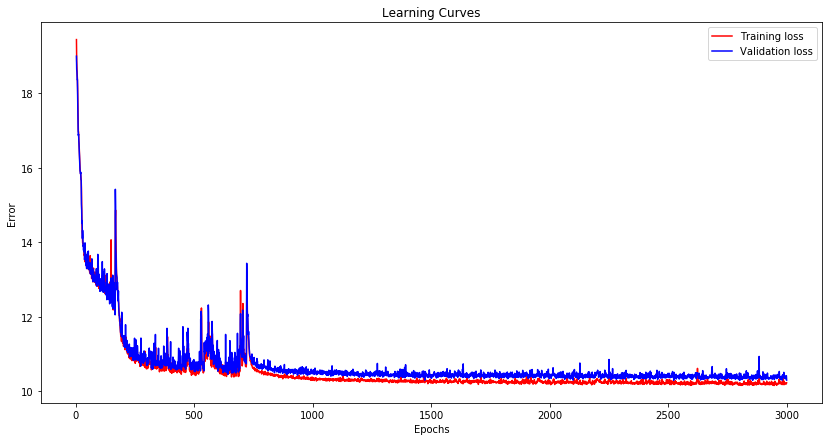

In [49]:
vae_Name='VAE_FC_h4_z60'
vae=vae_FC_h4_z60
train_data=VAE_train(vae, vae_Name)

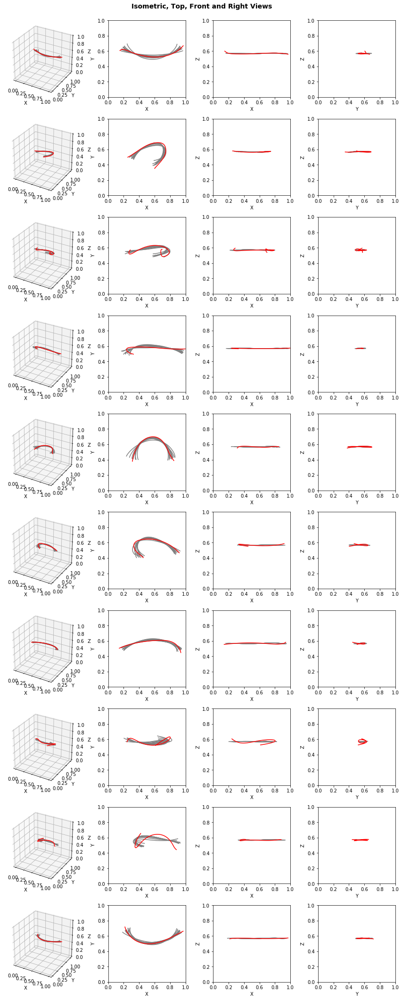

In [50]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)

### Results

| Network       | Training Loss | Validation Loss |
|:-------------:|---------------|-----------------|
| vae_FC_h1_z15 | 10.5323       | 10.5466         |
| vae_FC_h1_z30 | 10.8516       | 10.8248         |
| vae_FC_h1_z60 | 10.8739       | 10.8573         |
| vae_FC_h2_z15 | 10.2167       | 10.2773         |
| vae_FC_h2_z30 | 10.2189       | 10.2589         |
| vae_FC_h2_z60 | 10.2577       | 10.2853         |
| vae_FC_h3_z15 | 10.0575       | 10.0999         |
| vae_FC_h3_z30 | 9.9742        | 10.0760         |
| vae_FC_h3_z60 | 10.0260       | 10.0821         |
| vae_FC_h4_z15 | 10.0175       | 10.1155         |
| vae_FC_h4_z30 | 10.1348       | 10.1911         |
| vae_FC_h4_z60 | 10.2031       | 10.2924         |

## Fully Connected NN architecture:  Cov2D (Z=30)

Using Cov2D instead of Cov1D because the Cov1DTranspose function does not exist

In [105]:
def VAE_Cov2D_Z30():
    z_dim=30
    inp=Input(shape=(100,3))

    # Encoding
    x= Reshape((100, 3, 1))(inp)
    x= Conv2D(5, (6,1), strides=(2, 1), activation='relu')(x)
    x= Conv2D(10, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2D(15, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2D(20, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2D(25, (2,1), strides=(2, 1), activation='relu')(x)
    x= Flatten()(x)
    x=Dense(200, activation='relu')(x)
    x=Dense(100, activation='relu')(x)
    x=Dense(60, activation='relu')(x)
    z_mean = Dense(z_dim, name='z_mean')(x)
    z_log_var = Dense(z_dim, name='z_log_var')(x)
    z = Lambda(sampling, output_shape=(z_dim,), name='z')([z_mean, z_log_var])

    # Decoding
    x=Dense(60, activation='relu')(z)
    x=Dense(100, activation='relu')(x)
    x=Dense(200, activation='relu')(x)
    x=Dense(225, activation='relu')(x)
    x= Reshape((3, 3, 25))(x)
    x= Conv2DTranspose(20, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2DTranspose(15, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2DTranspose(10, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2DTranspose(5, (2,1), strides=(2, 1), activation='relu')(x)
    x= Conv2DTranspose(1, (6,1), strides=(2, 1))(x)
    y= Reshape((100, 3))(x)
    
    # loss
    def reconstruction_loss(out_true, out_pred):
      return eucledian_norm(out_true, out_pred)
    def kl_loss(out_true, out_pred):
      return kl(z_mean,z_log_var)
    def vae_loss(out_true, out_pred):      
      return reconstruction_loss(out_true, out_pred) + kl_loss(out_true, out_pred)

    # build model
    vae = Model(inputs=[inp], outputs=[y])
    #vae.add_loss(vae_loss)
    vae.compile(optimizer='adam', loss=vae_loss, metrics=[reconstruction_loss,kl_loss])
    
    encoder = Model(inputs=[inp], outputs=[z_mean])
    return vae, encoder

vae_Cov2D_Z30,_=VAE_Cov2D_Z30()

Model: "model_115"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_66 (InputLayer)           (None, 100, 3)       0                                            
__________________________________________________________________________________________________
reshape_111 (Reshape)           (None, 100, 3, 1)    0           input_66[0][0]                   
__________________________________________________________________________________________________
conv2d_144 (Conv2D)             (None, 48, 3, 5)     35          reshape_111[0][0]                
__________________________________________________________________________________________________
conv2d_145 (Conv2D)             (None, 24, 3, 10)    110         conv2d_144[0][0]                 
__________________________________________________________________________________________

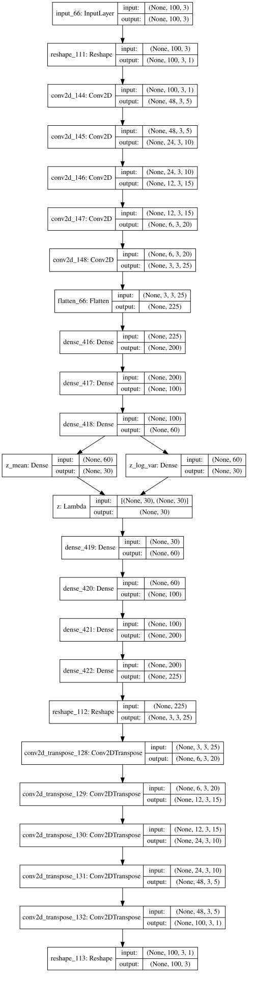

Train on 16067 samples, validate on 4017 samples
Epoch 1/3000
16067/16067 [==============================] - 1s 58us/step - loss: 107.8399 - reconstruction_loss: 107.6019 - kl_loss: 0.0083 - val_loss: 52.2145 - val_reconstruction_loss: 52.0414 - val_kl_loss: 0.0023

Epoch 00001: val_loss improved from inf to 52.21451, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 2/3000
16067/16067 [==============================] - 0s 24us/step - loss: 44.6220 - reconstruction_loss: 44.5696 - kl_loss: 0.0184 - val_loss: 40.6309 - val_reconstruction_loss: 40.3880 - val_kl_loss: 0.1096

Epoch 00002: val_loss improved from 52.21451 to 40.63095, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 3/3000
16067/16067 [==============================] - 0s 24us/step - loss: 34.4003 - reconstruction_loss: 32.9905 - kl_loss: 1.3738 - val_loss: 28.5634 - val_reconstruction_loss: 26.6889 - val_kl_loss: 1.7905

Epoch 00003: val_loss improved from 40.63095 to 28.56337, saving model to models_VAE/VAE_Cov2D_Z30


Epoch 00026: val_loss improved from 13.71106 to 13.50618, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 27/3000
16067/16067 [==============================] - 0s 24us/step - loss: 13.3105 - reconstruction_loss: 10.6944 - kl_loss: 2.6110 - val_loss: 13.4615 - val_reconstruction_loss: 10.6088 - val_kl_loss: 2.8098

Epoch 00027: val_loss improved from 13.50618 to 13.46150, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 28/3000
16067/16067 [==============================] - 0s 24us/step - loss: 13.0457 - reconstruction_loss: 10.3073 - kl_loss: 2.7331 - val_loss: 12.8664 - val_reconstruction_loss: 10.0315 - val_kl_loss: 2.7934

Epoch 00028: val_loss improved from 13.46150 to 12.86639, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 29/3000
16067/16067 [==============================] - 0s 25us/step - loss: 12.7653 - reconstruction_loss: 9.9444 - kl_loss: 2.8149 - val_loss: 12.6697 - val_reconstruction_loss: 9.6035 - val_kl_loss: 3.0282

Epoch 00029: val_loss improved from 12

16067/16067 [==============================] - 0s 24us/step - loss: 10.7209 - reconstruction_loss: 7.1367 - kl_loss: 3.5826 - val_loss: 10.8589 - val_reconstruction_loss: 7.1639 - val_kl_loss: 3.6644

Epoch 00083: val_loss did not improve from 10.76524
Epoch 84/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.7211 - reconstruction_loss: 7.1323 - kl_loss: 3.5846 - val_loss: 10.7702 - val_reconstruction_loss: 7.2216 - val_kl_loss: 3.5250

Epoch 00084: val_loss did not improve from 10.76524
Epoch 85/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.6181 - reconstruction_loss: 7.0635 - kl_loss: 3.5514 - val_loss: 10.9535 - val_reconstruction_loss: 7.4307 - val_kl_loss: 3.4909

Epoch 00085: val_loss did not improve from 10.76524
Epoch 86/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.6476 - reconstruction_loss: 7.0561 - kl_loss: 3.5868 - val_loss: 10.7697 - val_reconstruction_loss: 7.0972 - val_kl_loss: 3.6434


Epoch 00112: val_loss did not improve from 10.65842
Epoch 113/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.5455 - reconstruction_loss: 6.9275 - kl_loss: 3.6149 - val_loss: 10.6905 - val_reconstruction_loss: 6.9842 - val_kl_loss: 3.6780

Epoch 00113: val_loss did not improve from 10.65842
Epoch 114/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.5922 - reconstruction_loss: 7.0036 - kl_loss: 3.5855 - val_loss: 10.7090 - val_reconstruction_loss: 7.0138 - val_kl_loss: 3.6689

Epoch 00114: val_loss did not improve from 10.65842
Epoch 115/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.5799 - reconstruction_loss: 6.9646 - kl_loss: 3.6117 - val_loss: 10.6143 - val_reconstruction_loss: 6.9595 - val_kl_loss: 3.6276

Epoch 00115: val_loss improved from 10.65842 to 10.61426, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 116/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.5313 


Epoch 00142: val_loss did not improve from 10.49472
Epoch 143/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4124 - reconstruction_loss: 6.7744 - kl_loss: 3.6338 - val_loss: 10.4930 - val_reconstruction_loss: 6.7840 - val_kl_loss: 3.6810

Epoch 00143: val_loss improved from 10.49472 to 10.49297, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 144/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.4086 - reconstruction_loss: 6.7755 - kl_loss: 3.6297 - val_loss: 10.5133 - val_reconstruction_loss: 6.7510 - val_kl_loss: 3.7372

Epoch 00144: val_loss did not improve from 10.49297
Epoch 145/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4989 - reconstruction_loss: 6.8407 - kl_loss: 3.6557 - val_loss: 10.5706 - val_reconstruction_loss: 6.9454 - val_kl_loss: 3.5969

Epoch 00145: val_loss did not improve from 10.49297
Epoch 146/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4296 

16067/16067 [==============================] - 0s 24us/step - loss: 10.3701 - reconstruction_loss: 6.6904 - kl_loss: 3.6767 - val_loss: 10.4733 - val_reconstruction_loss: 6.7391 - val_kl_loss: 3.7071

Epoch 00203: val_loss did not improve from 10.46715
Epoch 204/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3588 - reconstruction_loss: 6.6686 - kl_loss: 3.6870 - val_loss: 10.4252 - val_reconstruction_loss: 6.7706 - val_kl_loss: 3.6285

Epoch 00204: val_loss improved from 10.46715 to 10.42520, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 205/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3975 - reconstruction_loss: 6.7270 - kl_loss: 3.6662 - val_loss: 10.5436 - val_reconstruction_loss: 6.7378 - val_kl_loss: 3.7794

Epoch 00205: val_loss did not improve from 10.42520
Epoch 206/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3863 - reconstruction_loss: 6.7065 - kl_loss: 3.6768 - val_loss: 10.4549 

16067/16067 [==============================] - 0s 24us/step - loss: 10.2980 - reconstruction_loss: 6.5768 - kl_loss: 3.7176 - val_loss: 10.4463 - val_reconstruction_loss: 6.6730 - val_kl_loss: 3.7510

Epoch 00263: val_loss did not improve from 10.40875
Epoch 264/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2743 - reconstruction_loss: 6.5371 - kl_loss: 3.7342 - val_loss: 10.4164 - val_reconstruction_loss: 6.6311 - val_kl_loss: 3.7634

Epoch 00264: val_loss did not improve from 10.40875
Epoch 265/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2784 - reconstruction_loss: 6.5426 - kl_loss: 3.7321 - val_loss: 10.4448 - val_reconstruction_loss: 6.7109 - val_kl_loss: 3.7094

Epoch 00265: val_loss did not improve from 10.40875
Epoch 266/3000
16067/16067 [==============================] - 0s 25us/step - loss: 10.2763 - reconstruction_loss: 6.5571 - kl_loss: 3.7165 - val_loss: 10.4611 - val_reconstruction_loss: 6.6736 - val_kl_loss: 3.7

16067/16067 [==============================] - 0s 24us/step - loss: 10.3483 - reconstruction_loss: 6.5412 - kl_loss: 3.8025 - val_loss: 10.3866 - val_reconstruction_loss: 6.5612 - val_kl_loss: 3.8016

Epoch 00293: val_loss did not improve from 10.32749
Epoch 294/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2870 - reconstruction_loss: 6.4847 - kl_loss: 3.7983 - val_loss: 10.4244 - val_reconstruction_loss: 6.6590 - val_kl_loss: 3.7384

Epoch 00294: val_loss did not improve from 10.32749
Epoch 295/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2677 - reconstruction_loss: 6.4918 - kl_loss: 3.7726 - val_loss: 10.4188 - val_reconstruction_loss: 6.5177 - val_kl_loss: 3.8761

Epoch 00295: val_loss did not improve from 10.32749
Epoch 296/3000
16067/16067 [==============================] - 0s 25us/step - loss: 10.3105 - reconstruction_loss: 6.5116 - kl_loss: 3.7952 - val_loss: 10.4037 - val_reconstruction_loss: 6.6206 - val_kl_loss: 3.7


Epoch 00323: val_loss did not improve from 10.32749
Epoch 324/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.2219 - reconstruction_loss: 6.4057 - kl_loss: 3.8121 - val_loss: 10.3306 - val_reconstruction_loss: 6.4660 - val_kl_loss: 3.8421

Epoch 00324: val_loss did not improve from 10.32749
Epoch 325/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2157 - reconstruction_loss: 6.4093 - kl_loss: 3.8032 - val_loss: 10.4111 - val_reconstruction_loss: 6.6044 - val_kl_loss: 3.7798

Epoch 00325: val_loss did not improve from 10.32749
Epoch 326/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2208 - reconstruction_loss: 6.4243 - kl_loss: 3.7944 - val_loss: 10.4111 - val_reconstruction_loss: 6.5970 - val_kl_loss: 3.7884

Epoch 00326: val_loss did not improve from 10.32749
Epoch 327/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2209 - reconstruction_loss: 6.4200 - kl_loss: 3.7963 - va

16067/16067 [==============================] - 0s 24us/step - loss: 10.1834 - reconstruction_loss: 6.3309 - kl_loss: 3.8492 - val_loss: 10.3032 - val_reconstruction_loss: 6.4844 - val_kl_loss: 3.7933

Epoch 00384: val_loss did not improve from 10.26014
Epoch 385/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1458 - reconstruction_loss: 6.2684 - kl_loss: 3.8739 - val_loss: 10.3528 - val_reconstruction_loss: 6.4915 - val_kl_loss: 3.8362

Epoch 00385: val_loss did not improve from 10.26014
Epoch 386/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1947 - reconstruction_loss: 6.3240 - kl_loss: 3.8666 - val_loss: 10.3082 - val_reconstruction_loss: 6.2966 - val_kl_loss: 3.9857

Epoch 00386: val_loss did not improve from 10.26014
Epoch 387/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1443 - reconstruction_loss: 6.2681 - kl_loss: 3.8730 - val_loss: 10.3096 - val_reconstruction_loss: 6.3608 - val_kl_loss: 3.9

16067/16067 [==============================] - 0s 24us/step - loss: 10.1709 - reconstruction_loss: 6.2534 - kl_loss: 3.9146 - val_loss: 10.2219 - val_reconstruction_loss: 6.2466 - val_kl_loss: 3.9529

Epoch 00444: val_loss did not improve from 10.18947
Epoch 445/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1198 - reconstruction_loss: 6.2274 - kl_loss: 3.8895 - val_loss: 10.2223 - val_reconstruction_loss: 6.2952 - val_kl_loss: 3.9020

Epoch 00445: val_loss did not improve from 10.18947
Epoch 446/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1371 - reconstruction_loss: 6.2160 - kl_loss: 3.9185 - val_loss: 10.3301 - val_reconstruction_loss: 6.3653 - val_kl_loss: 3.9377

Epoch 00446: val_loss did not improve from 10.18947
Epoch 447/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1597 - reconstruction_loss: 6.2587 - kl_loss: 3.8984 - val_loss: 10.2759 - val_reconstruction_loss: 6.2732 - val_kl_loss: 3.9


Epoch 00474: val_loss did not improve from 10.18947
Epoch 475/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1877 - reconstruction_loss: 6.2967 - kl_loss: 3.8874 - val_loss: 10.4069 - val_reconstruction_loss: 6.3388 - val_kl_loss: 4.0396

Epoch 00475: val_loss did not improve from 10.18947
Epoch 476/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2372 - reconstruction_loss: 6.2948 - kl_loss: 3.9397 - val_loss: 10.3901 - val_reconstruction_loss: 6.4414 - val_kl_loss: 3.9243

Epoch 00476: val_loss did not improve from 10.18947
Epoch 477/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1758 - reconstruction_loss: 6.2817 - kl_loss: 3.8914 - val_loss: 10.2642 - val_reconstruction_loss: 6.2047 - val_kl_loss: 4.0334

Epoch 00477: val_loss did not improve from 10.18947
Epoch 478/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1130 - reconstruction_loss: 6.1730 - kl_loss: 3.9377 - va


Epoch 00535: val_loss did not improve from 10.18947
Epoch 536/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.5008 - reconstruction_loss: 6.6409 - kl_loss: 3.8558 - val_loss: 10.6004 - val_reconstruction_loss: 6.7171 - val_kl_loss: 3.8581

Epoch 00536: val_loss did not improve from 10.18947
Epoch 537/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4760 - reconstruction_loss: 6.6048 - kl_loss: 3.8688 - val_loss: 10.5960 - val_reconstruction_loss: 6.6518 - val_kl_loss: 3.9209

Epoch 00537: val_loss did not improve from 10.18947
Epoch 538/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4881 - reconstruction_loss: 6.6196 - kl_loss: 3.8656 - val_loss: 10.5871 - val_reconstruction_loss: 6.7074 - val_kl_loss: 3.8547

Epoch 00538: val_loss did not improve from 10.18947
Epoch 539/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4948 - reconstruction_loss: 6.6221 - kl_loss: 3.8691 - va


Epoch 00596: val_loss did not improve from 10.18947
Epoch 597/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3564 - reconstruction_loss: 6.4435 - kl_loss: 3.9099 - val_loss: 10.5268 - val_reconstruction_loss: 6.4575 - val_kl_loss: 4.0461

Epoch 00597: val_loss did not improve from 10.18947
Epoch 598/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3101 - reconstruction_loss: 6.4064 - kl_loss: 3.9010 - val_loss: 10.4680 - val_reconstruction_loss: 6.4656 - val_kl_loss: 3.9801

Epoch 00598: val_loss did not improve from 10.18947
Epoch 599/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.3520 - reconstruction_loss: 6.4400 - kl_loss: 3.9080 - val_loss: 10.4497 - val_reconstruction_loss: 6.5234 - val_kl_loss: 3.9028

Epoch 00599: val_loss did not improve from 10.18947
Epoch 600/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3368 - reconstruction_loss: 6.4353 - kl_loss: 3.8978 - va


Epoch 00657: val_loss did not improve from 10.18947
Epoch 658/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2218 - reconstruction_loss: 6.2444 - kl_loss: 3.9737 - val_loss: 10.6419 - val_reconstruction_loss: 6.4573 - val_kl_loss: 4.1585

Epoch 00658: val_loss did not improve from 10.18947
Epoch 659/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.3353 - reconstruction_loss: 6.4073 - kl_loss: 3.9245 - val_loss: 10.4224 - val_reconstruction_loss: 6.3204 - val_kl_loss: 4.0779

Epoch 00659: val_loss did not improve from 10.18947
Epoch 660/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2595 - reconstruction_loss: 6.3136 - kl_loss: 3.9459 - val_loss: 10.4311 - val_reconstruction_loss: 6.4616 - val_kl_loss: 3.9450

Epoch 00660: val_loss did not improve from 10.18947
Epoch 661/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4730 - reconstruction_loss: 6.4887 - kl_loss: 3.9807 - va


Epoch 00718: val_loss did not improve from 10.18947
Epoch 719/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2252 - reconstruction_loss: 6.2196 - kl_loss: 4.0029 - val_loss: 10.3275 - val_reconstruction_loss: 6.2355 - val_kl_loss: 4.0680

Epoch 00719: val_loss did not improve from 10.18947
Epoch 720/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.2023 - reconstruction_loss: 6.1854 - kl_loss: 4.0138 - val_loss: 10.3796 - val_reconstruction_loss: 6.2428 - val_kl_loss: 4.1105

Epoch 00720: val_loss did not improve from 10.18947
Epoch 721/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2224 - reconstruction_loss: 6.1865 - kl_loss: 4.0324 - val_loss: 10.2938 - val_reconstruction_loss: 6.1767 - val_kl_loss: 4.0908

Epoch 00721: val_loss did not improve from 10.18947
Epoch 722/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1694 - reconstruction_loss: 6.1764 - kl_loss: 3.9894 - va


Epoch 00779: val_loss did not improve from 10.18947
Epoch 780/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1949 - reconstruction_loss: 6.1516 - kl_loss: 4.0391 - val_loss: 10.3061 - val_reconstruction_loss: 6.1849 - val_kl_loss: 4.0963

Epoch 00780: val_loss did not improve from 10.18947
Epoch 781/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1904 - reconstruction_loss: 6.1643 - kl_loss: 4.0228 - val_loss: 10.2680 - val_reconstruction_loss: 6.2478 - val_kl_loss: 3.9963

Epoch 00781: val_loss did not improve from 10.18947
Epoch 782/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1746 - reconstruction_loss: 6.1363 - kl_loss: 4.0353 - val_loss: 10.3021 - val_reconstruction_loss: 6.3111 - val_kl_loss: 3.9646

Epoch 00782: val_loss did not improve from 10.18947
Epoch 783/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1610 - reconstruction_loss: 6.1279 - kl_loss: 4.0293 - va


Epoch 00840: val_loss did not improve from 10.18947
Epoch 841/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3024 - reconstruction_loss: 6.3265 - kl_loss: 3.9734 - val_loss: 10.4416 - val_reconstruction_loss: 6.3437 - val_kl_loss: 4.0765

Epoch 00841: val_loss did not improve from 10.18947
Epoch 842/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.5617 - reconstruction_loss: 6.6177 - kl_loss: 3.9414 - val_loss: 10.6748 - val_reconstruction_loss: 6.7718 - val_kl_loss: 3.8727

Epoch 00842: val_loss did not improve from 10.18947
Epoch 843/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4385 - reconstruction_loss: 6.4815 - kl_loss: 3.9551 - val_loss: 10.4732 - val_reconstruction_loss: 6.5296 - val_kl_loss: 3.9226

Epoch 00843: val_loss did not improve from 10.18947
Epoch 844/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3278 - reconstruction_loss: 6.3359 - kl_loss: 3.9886 - va


Epoch 00901: val_loss did not improve from 10.18947
Epoch 902/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3224 - reconstruction_loss: 6.3533 - kl_loss: 3.9656 - val_loss: 10.6295 - val_reconstruction_loss: 6.6385 - val_kl_loss: 3.9653

Epoch 00902: val_loss did not improve from 10.18947
Epoch 903/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3111 - reconstruction_loss: 6.3375 - kl_loss: 3.9686 - val_loss: 10.3945 - val_reconstruction_loss: 6.2781 - val_kl_loss: 4.0921

Epoch 00903: val_loss did not improve from 10.18947
Epoch 904/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2185 - reconstruction_loss: 6.2181 - kl_loss: 3.9966 - val_loss: 10.3207 - val_reconstruction_loss: 6.2259 - val_kl_loss: 4.0694

Epoch 00904: val_loss did not improve from 10.18947
Epoch 905/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1957 - reconstruction_loss: 6.1752 - kl_loss: 4.0161 - va

16067/16067 [==============================] - 0s 24us/step - loss: 11.0579 - reconstruction_loss: 7.0143 - kl_loss: 4.0394 - val_loss: 10.3474 - val_reconstruction_loss: 6.3119 - val_kl_loss: 4.0083

Epoch 00962: val_loss did not improve from 10.18378
Epoch 963/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2161 - reconstruction_loss: 6.1916 - kl_loss: 4.0223 - val_loss: 10.3629 - val_reconstruction_loss: 6.3017 - val_kl_loss: 4.0338

Epoch 00963: val_loss did not improve from 10.18378
Epoch 964/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1648 - reconstruction_loss: 6.1408 - kl_loss: 4.0210 - val_loss: 10.2698 - val_reconstruction_loss: 6.2149 - val_kl_loss: 4.0311

Epoch 00964: val_loss did not improve from 10.18378
Epoch 965/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1806 - reconstruction_loss: 6.1795 - kl_loss: 3.9995 - val_loss: 10.3766 - val_reconstruction_loss: 6.2328 - val_kl_loss: 4.1


Epoch 00992: val_loss did not improve from 10.18378
Epoch 993/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1563 - reconstruction_loss: 6.1159 - kl_loss: 4.0365 - val_loss: 10.3405 - val_reconstruction_loss: 6.1963 - val_kl_loss: 4.1224

Epoch 00993: val_loss did not improve from 10.18378
Epoch 994/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1598 - reconstruction_loss: 6.1275 - kl_loss: 4.0287 - val_loss: 10.3373 - val_reconstruction_loss: 6.2697 - val_kl_loss: 4.0454

Epoch 00994: val_loss did not improve from 10.18378
Epoch 995/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1561 - reconstruction_loss: 6.1055 - kl_loss: 4.0472 - val_loss: 10.2856 - val_reconstruction_loss: 6.2304 - val_kl_loss: 4.0305

Epoch 00995: val_loss did not improve from 10.18378
Epoch 996/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1376 - reconstruction_loss: 6.0977 - kl_loss: 4.0362 - va


Epoch 01053: val_loss did not improve from 10.18378
Epoch 1054/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.4002 - reconstruction_loss: 6.4049 - kl_loss: 3.9913 - val_loss: 10.5016 - val_reconstruction_loss: 6.5258 - val_kl_loss: 3.9508

Epoch 01054: val_loss did not improve from 10.18378
Epoch 1055/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.3711 - reconstruction_loss: 6.3989 - kl_loss: 3.9700 - val_loss: 10.6215 - val_reconstruction_loss: 6.6018 - val_kl_loss: 3.9967

Epoch 01055: val_loss did not improve from 10.18378
Epoch 1056/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3619 - reconstruction_loss: 6.3696 - kl_loss: 3.9900 - val_loss: 10.4053 - val_reconstruction_loss: 6.4120 - val_kl_loss: 3.9693

Epoch 01056: val_loss did not improve from 10.18378
Epoch 1057/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.3301 - reconstruction_loss: 6.3538 - kl_loss: 3.9730 


Epoch 01114: val_loss did not improve from 10.18378
Epoch 1115/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2203 - reconstruction_loss: 6.2029 - kl_loss: 4.0152 - val_loss: 10.3576 - val_reconstruction_loss: 6.3652 - val_kl_loss: 3.9700

Epoch 01115: val_loss did not improve from 10.18378
Epoch 1116/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2272 - reconstruction_loss: 6.2330 - kl_loss: 3.9912 - val_loss: 10.3897 - val_reconstruction_loss: 6.3634 - val_kl_loss: 4.0028

Epoch 01116: val_loss did not improve from 10.18378
Epoch 1117/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.2263 - reconstruction_loss: 6.2065 - kl_loss: 4.0172 - val_loss: 10.3763 - val_reconstruction_loss: 6.3796 - val_kl_loss: 3.9692

Epoch 01117: val_loss did not improve from 10.18378
Epoch 1118/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1966 - reconstruction_loss: 6.2041 - kl_loss: 3.9888 


Epoch 01175: val_loss did not improve from 10.18378
Epoch 1176/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1841 - reconstruction_loss: 6.1562 - kl_loss: 4.0254 - val_loss: 10.3201 - val_reconstruction_loss: 6.2505 - val_kl_loss: 4.0491

Epoch 01176: val_loss did not improve from 10.18378
Epoch 1177/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1449 - reconstruction_loss: 6.1018 - kl_loss: 4.0401 - val_loss: 10.2569 - val_reconstruction_loss: 6.1671 - val_kl_loss: 4.0633

Epoch 01177: val_loss did not improve from 10.18378
Epoch 1178/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1258 - reconstruction_loss: 6.0695 - kl_loss: 4.0537 - val_loss: 10.3333 - val_reconstruction_loss: 6.3017 - val_kl_loss: 4.0038

Epoch 01178: val_loss did not improve from 10.18378
Epoch 1179/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1472 - reconstruction_loss: 6.1093 - kl_loss: 4.0351 


Epoch 01236: val_loss did not improve from 10.18378
Epoch 1237/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.1326 - reconstruction_loss: 6.0492 - kl_loss: 4.0790 - val_loss: 10.2679 - val_reconstruction_loss: 6.1249 - val_kl_loss: 4.1229

Epoch 01237: val_loss did not improve from 10.18378
Epoch 1238/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1088 - reconstruction_loss: 6.0436 - kl_loss: 4.0615 - val_loss: 10.2533 - val_reconstruction_loss: 6.1144 - val_kl_loss: 4.1129

Epoch 01238: val_loss did not improve from 10.18378
Epoch 1239/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.1021 - reconstruction_loss: 6.0702 - kl_loss: 4.0286 - val_loss: 10.2054 - val_reconstruction_loss: 6.1606 - val_kl_loss: 4.0206

Epoch 01239: val_loss did not improve from 10.18378
Epoch 1240/3000
16067/16067 [==============================] - 0s 25us/step - loss: 10.0830 - reconstruction_loss: 6.0236 - kl_loss: 4.0563 

16067/16067 [==============================] - 0s 24us/step - loss: 10.0734 - reconstruction_loss: 6.0062 - kl_loss: 4.0654 - val_loss: 10.2231 - val_reconstruction_loss: 6.1590 - val_kl_loss: 4.0406

Epoch 01297: val_loss did not improve from 10.17826
Epoch 1298/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0877 - reconstruction_loss: 6.0077 - kl_loss: 4.0771 - val_loss: 10.3117 - val_reconstruction_loss: 6.1344 - val_kl_loss: 4.1515

Epoch 01298: val_loss did not improve from 10.17826
Epoch 1299/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0808 - reconstruction_loss: 6.0076 - kl_loss: 4.0701 - val_loss: 10.2517 - val_reconstruction_loss: 6.1250 - val_kl_loss: 4.1009

Epoch 01299: val_loss did not improve from 10.17826
Epoch 1300/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0696 - reconstruction_loss: 5.9889 - kl_loss: 4.0778 - val_loss: 10.2579 - val_reconstruction_loss: 6.0710 - val_kl_loss: 


Epoch 01327: val_loss did not improve from 10.17826
Epoch 1328/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0594 - reconstruction_loss: 5.9809 - kl_loss: 4.0760 - val_loss: 10.1640 - val_reconstruction_loss: 6.0732 - val_kl_loss: 4.0661

Epoch 01328: val_loss improved from 10.17826 to 10.16395, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 1329/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0580 - reconstruction_loss: 5.9609 - kl_loss: 4.0938 - val_loss: 10.1775 - val_reconstruction_loss: 6.1037 - val_kl_loss: 4.0504

Epoch 01329: val_loss did not improve from 10.16395
Epoch 1330/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0597 - reconstruction_loss: 5.9762 - kl_loss: 4.0801 - val_loss: 10.2447 - val_reconstruction_loss: 6.0525 - val_kl_loss: 4.1690

Epoch 01330: val_loss did not improve from 10.16395
Epoch 1331/3000
16067/16067 [==============================] - 0s 23us/step - loss: 10.0

16067/16067 [==============================] - 0s 24us/step - loss: 10.0196 - reconstruction_loss: 5.9070 - kl_loss: 4.1106 - val_loss: 10.1926 - val_reconstruction_loss: 6.0107 - val_kl_loss: 4.1566

Epoch 01388: val_loss did not improve from 10.15986
Epoch 1389/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0533 - reconstruction_loss: 5.9321 - kl_loss: 4.1180 - val_loss: 10.2164 - val_reconstruction_loss: 6.0392 - val_kl_loss: 4.1570

Epoch 01389: val_loss did not improve from 10.15986
Epoch 1390/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0288 - reconstruction_loss: 5.9157 - kl_loss: 4.1097 - val_loss: 10.1924 - val_reconstruction_loss: 6.0172 - val_kl_loss: 4.1509

Epoch 01390: val_loss did not improve from 10.15986
Epoch 1391/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0160 - reconstruction_loss: 5.9267 - kl_loss: 4.0874 - val_loss: 10.1931 - val_reconstruction_loss: 6.0860 - val_kl_loss: 


Epoch 01448: val_loss did not improve from 10.12426
Epoch 1449/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0256 - reconstruction_loss: 5.9168 - kl_loss: 4.1055 - val_loss: 10.1769 - val_reconstruction_loss: 5.9915 - val_kl_loss: 4.1623

Epoch 01449: val_loss did not improve from 10.12426
Epoch 1450/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0032 - reconstruction_loss: 5.8885 - kl_loss: 4.1108 - val_loss: 10.1550 - val_reconstruction_loss: 6.0166 - val_kl_loss: 4.1137

Epoch 01450: val_loss did not improve from 10.12426
Epoch 1451/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9906 - reconstruction_loss: 5.8897 - kl_loss: 4.0977 - val_loss: 10.2098 - val_reconstruction_loss: 6.0918 - val_kl_loss: 4.0916

Epoch 01451: val_loss did not improve from 10.12426
Epoch 1452/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0076 - reconstruction_loss: 5.8881 - kl_loss: 4.1164 -


Epoch 01509: val_loss did not improve from 10.12426
Epoch 1510/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0037 - reconstruction_loss: 5.8840 - kl_loss: 4.1167 - val_loss: 10.2398 - val_reconstruction_loss: 6.0619 - val_kl_loss: 4.1532

Epoch 01510: val_loss did not improve from 10.12426
Epoch 1511/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0166 - reconstruction_loss: 5.8967 - kl_loss: 4.1170 - val_loss: 10.0809 - val_reconstruction_loss: 5.8603 - val_kl_loss: 4.1978

Epoch 01511: val_loss improved from 10.12426 to 10.08092, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 1512/3000
16067/16067 [==============================] - 0s 24us/step - loss: 10.0005 - reconstruction_loss: 5.8585 - kl_loss: 4.1392 - val_loss: 10.1438 - val_reconstruction_loss: 6.0425 - val_kl_loss: 4.0786

Epoch 01512: val_loss did not improve from 10.08092
Epoch 1513/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.97


Epoch 01570: val_loss did not improve from 10.08092
Epoch 1571/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9717 - reconstruction_loss: 5.8621 - kl_loss: 4.1075 - val_loss: 10.1329 - val_reconstruction_loss: 5.9428 - val_kl_loss: 4.1658

Epoch 01571: val_loss did not improve from 10.08092
Epoch 1572/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9784 - reconstruction_loss: 5.8438 - kl_loss: 4.1323 - val_loss: 10.1659 - val_reconstruction_loss: 5.9657 - val_kl_loss: 4.1758

Epoch 01572: val_loss did not improve from 10.08092
Epoch 1573/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9765 - reconstruction_loss: 5.8481 - kl_loss: 4.1259 - val_loss: 10.1041 - val_reconstruction_loss: 5.9156 - val_kl_loss: 4.1626

Epoch 01573: val_loss did not improve from 10.08092
Epoch 1574/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9750 - reconstruction_loss: 5.8511 - kl_loss: 4.1213 - va


Epoch 01631: val_loss improved from 10.08092 to 10.07667, saving model to models_VAE/VAE_Cov2D_Z30.hdf5
Epoch 1632/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9475 - reconstruction_loss: 5.8278 - kl_loss: 4.1160 - val_loss: 10.1423 - val_reconstruction_loss: 5.9685 - val_kl_loss: 4.1512

Epoch 01632: val_loss did not improve from 10.07667
Epoch 1633/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9564 - reconstruction_loss: 5.8272 - kl_loss: 4.1258 - val_loss: 10.1147 - val_reconstruction_loss: 6.0229 - val_kl_loss: 4.0697

Epoch 01633: val_loss did not improve from 10.07667
Epoch 1634/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9772 - reconstruction_loss: 5.8537 - kl_loss: 4.1210 - val_loss: 10.1590 - val_reconstruction_loss: 6.0329 - val_kl_loss: 4.1016

Epoch 01634: val_loss did not improve from 10.07667
Epoch 1635/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9545 


Epoch 01692: val_loss did not improve from 10.07667
Epoch 1693/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.9379 - reconstruction_loss: 5.8319 - kl_loss: 4.1037 - val_loss: 10.1357 - val_reconstruction_loss: 5.9925 - val_kl_loss: 4.1206

Epoch 01693: val_loss did not improve from 10.07667
Epoch 1694/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9287 - reconstruction_loss: 5.8076 - kl_loss: 4.1192 - val_loss: 10.1730 - val_reconstruction_loss: 5.9909 - val_kl_loss: 4.1573

Epoch 01694: val_loss did not improve from 10.07667
Epoch 1695/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9394 - reconstruction_loss: 5.8247 - kl_loss: 4.1122 - val_loss: 10.1316 - val_reconstruction_loss: 5.9210 - val_kl_loss: 4.1872

Epoch 01695: val_loss did not improve from 10.07667
Epoch 1696/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9559 - reconstruction_loss: 5.8038 - kl_loss: 4.1487 - va


Epoch 01753: val_loss did not improve from 10.07667
Epoch 1754/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9362 - reconstruction_loss: 5.7847 - kl_loss: 4.1488 - val_loss: 10.2104 - val_reconstruction_loss: 6.0032 - val_kl_loss: 4.1867

Epoch 01754: val_loss did not improve from 10.07667
Epoch 1755/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9342 - reconstruction_loss: 5.8060 - kl_loss: 4.1254 - val_loss: 10.1491 - val_reconstruction_loss: 5.9618 - val_kl_loss: 4.1635

Epoch 01755: val_loss did not improve from 10.07667
Epoch 1756/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9582 - reconstruction_loss: 5.8092 - kl_loss: 4.1463 - val_loss: 10.1843 - val_reconstruction_loss: 5.9587 - val_kl_loss: 4.1999

Epoch 01756: val_loss did not improve from 10.07667
Epoch 1757/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.9393 - reconstruction_loss: 5.8071 - kl_loss: 4.1294 - va

16067/16067 [==============================] - 0s 24us/step - loss: 9.9394 - reconstruction_loss: 5.7855 - kl_loss: 4.1519 - val_loss: 10.1979 - val_reconstruction_loss: 6.0198 - val_kl_loss: 4.1518

Epoch 01814: val_loss did not improve from 10.06019
Epoch 1815/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9377 - reconstruction_loss: 5.7920 - kl_loss: 4.1428 - val_loss: 10.1294 - val_reconstruction_loss: 5.9544 - val_kl_loss: 4.1534

Epoch 01815: val_loss did not improve from 10.06019
Epoch 1816/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9421 - reconstruction_loss: 5.7988 - kl_loss: 4.1419 - val_loss: 10.1103 - val_reconstruction_loss: 5.9386 - val_kl_loss: 4.1482

Epoch 01816: val_loss did not improve from 10.06019
Epoch 1817/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9487 - reconstruction_loss: 5.8030 - kl_loss: 4.1437 - val_loss: 10.2612 - val_reconstruction_loss: 6.0350 - val_kl_loss: 4.20


Epoch 01844: val_loss did not improve from 10.06019
Epoch 1845/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9284 - reconstruction_loss: 5.8071 - kl_loss: 4.1185 - val_loss: 10.1407 - val_reconstruction_loss: 5.9511 - val_kl_loss: 4.1669

Epoch 01845: val_loss did not improve from 10.06019
Epoch 1846/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9201 - reconstruction_loss: 5.7923 - kl_loss: 4.1250 - val_loss: 10.1409 - val_reconstruction_loss: 5.8851 - val_kl_loss: 4.2349

Epoch 01846: val_loss did not improve from 10.06019
Epoch 1847/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9343 - reconstruction_loss: 5.7849 - kl_loss: 4.1461 - val_loss: 10.1546 - val_reconstruction_loss: 5.9492 - val_kl_loss: 4.1821

Epoch 01847: val_loss did not improve from 10.06019
Epoch 1848/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9433 - reconstruction_loss: 5.7726 - kl_loss: 4.1680 - va


Epoch 01905: val_loss did not improve from 10.06019
Epoch 1906/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9271 - reconstruction_loss: 5.7626 - kl_loss: 4.1613 - val_loss: 10.1843 - val_reconstruction_loss: 5.9987 - val_kl_loss: 4.1637

Epoch 01906: val_loss did not improve from 10.06019
Epoch 1907/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9173 - reconstruction_loss: 5.7631 - kl_loss: 4.1516 - val_loss: 10.2224 - val_reconstruction_loss: 6.0874 - val_kl_loss: 4.1111

Epoch 01907: val_loss did not improve from 10.06019
Epoch 1908/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9153 - reconstruction_loss: 5.7786 - kl_loss: 4.1353 - val_loss: 10.1148 - val_reconstruction_loss: 5.9419 - val_kl_loss: 4.1472

Epoch 01908: val_loss did not improve from 10.06019
Epoch 1909/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9225 - reconstruction_loss: 5.7767 - kl_loss: 4.1429 - va


Epoch 01966: val_loss did not improve from 10.06019
Epoch 1967/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9160 - reconstruction_loss: 5.7558 - kl_loss: 4.1579 - val_loss: 10.1402 - val_reconstruction_loss: 6.0029 - val_kl_loss: 4.1159

Epoch 01967: val_loss did not improve from 10.06019
Epoch 1968/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9046 - reconstruction_loss: 5.7617 - kl_loss: 4.1407 - val_loss: 10.1200 - val_reconstruction_loss: 5.9368 - val_kl_loss: 4.1592

Epoch 01968: val_loss did not improve from 10.06019
Epoch 1969/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9206 - reconstruction_loss: 5.7506 - kl_loss: 4.1668 - val_loss: 10.1781 - val_reconstruction_loss: 5.9900 - val_kl_loss: 4.1641

Epoch 01969: val_loss did not improve from 10.06019
Epoch 1970/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9223 - reconstruction_loss: 5.7583 - kl_loss: 4.1618 - va


Epoch 02027: val_loss did not improve from 10.06019
Epoch 2028/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9248 - reconstruction_loss: 5.7805 - kl_loss: 4.1406 - val_loss: 10.1602 - val_reconstruction_loss: 5.9481 - val_kl_loss: 4.1879

Epoch 02028: val_loss did not improve from 10.06019
Epoch 2029/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9117 - reconstruction_loss: 5.7280 - kl_loss: 4.1823 - val_loss: 10.1600 - val_reconstruction_loss: 5.9207 - val_kl_loss: 4.2175

Epoch 02029: val_loss did not improve from 10.06019
Epoch 2030/3000
16067/16067 [==============================] - 0s 25us/step - loss: 9.9004 - reconstruction_loss: 5.7423 - kl_loss: 4.1554 - val_loss: 10.1108 - val_reconstruction_loss: 5.9487 - val_kl_loss: 4.1382

Epoch 02030: val_loss did not improve from 10.06019
Epoch 2031/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9287 - reconstruction_loss: 5.7561 - kl_loss: 4.1698 - va


Epoch 02088: val_loss did not improve from 10.06019
Epoch 2089/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9137 - reconstruction_loss: 5.7365 - kl_loss: 4.1744 - val_loss: 10.1355 - val_reconstruction_loss: 5.9552 - val_kl_loss: 4.1573

Epoch 02089: val_loss did not improve from 10.06019
Epoch 2090/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9029 - reconstruction_loss: 5.7623 - kl_loss: 4.1375 - val_loss: 10.1368 - val_reconstruction_loss: 5.9686 - val_kl_loss: 4.1456

Epoch 02090: val_loss did not improve from 10.06019
Epoch 2091/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8840 - reconstruction_loss: 5.7577 - kl_loss: 4.1245 - val_loss: 10.1527 - val_reconstruction_loss: 6.0087 - val_kl_loss: 4.1237

Epoch 02091: val_loss did not improve from 10.06019
Epoch 2092/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9103 - reconstruction_loss: 5.7467 - kl_loss: 4.1608 - va


Epoch 02149: val_loss did not improve from 10.06019
Epoch 2150/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8800 - reconstruction_loss: 5.7211 - kl_loss: 4.1564 - val_loss: 10.1682 - val_reconstruction_loss: 5.9772 - val_kl_loss: 4.1692

Epoch 02150: val_loss did not improve from 10.06019
Epoch 2151/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9167 - reconstruction_loss: 5.7580 - kl_loss: 4.1561 - val_loss: 10.1455 - val_reconstruction_loss: 5.9652 - val_kl_loss: 4.1572

Epoch 02151: val_loss did not improve from 10.06019
Epoch 2152/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9240 - reconstruction_loss: 5.7463 - kl_loss: 4.1748 - val_loss: 10.1487 - val_reconstruction_loss: 5.9705 - val_kl_loss: 4.1542

Epoch 02152: val_loss did not improve from 10.06019
Epoch 2153/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9169 - reconstruction_loss: 5.7653 - kl_loss: 4.1489 - va


Epoch 02210: val_loss did not improve from 10.06019
Epoch 2211/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8976 - reconstruction_loss: 5.7161 - kl_loss: 4.1797 - val_loss: 10.1454 - val_reconstruction_loss: 5.9196 - val_kl_loss: 4.2040

Epoch 02211: val_loss did not improve from 10.06019
Epoch 2212/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8957 - reconstruction_loss: 5.7350 - kl_loss: 4.1583 - val_loss: 10.1509 - val_reconstruction_loss: 5.9898 - val_kl_loss: 4.1372

Epoch 02212: val_loss did not improve from 10.06019
Epoch 2213/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9110 - reconstruction_loss: 5.7325 - kl_loss: 4.1758 - val_loss: 10.1861 - val_reconstruction_loss: 5.9294 - val_kl_loss: 4.2328

Epoch 02213: val_loss did not improve from 10.06019
Epoch 2214/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8953 - reconstruction_loss: 5.7418 - kl_loss: 4.1515 - va


Epoch 02271: val_loss did not improve from 10.06019
Epoch 2272/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9296 - reconstruction_loss: 5.7290 - kl_loss: 4.1978 - val_loss: 10.1476 - val_reconstruction_loss: 5.8407 - val_kl_loss: 4.2839

Epoch 02272: val_loss did not improve from 10.06019
Epoch 2273/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8505 - reconstruction_loss: 5.6850 - kl_loss: 4.1627 - val_loss: 10.1346 - val_reconstruction_loss: 5.9332 - val_kl_loss: 4.1774

Epoch 02273: val_loss did not improve from 10.06019
Epoch 2274/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8737 - reconstruction_loss: 5.7198 - kl_loss: 4.1503 - val_loss: 10.1816 - val_reconstruction_loss: 5.9622 - val_kl_loss: 4.1987

Epoch 02274: val_loss did not improve from 10.06019
Epoch 2275/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8954 - reconstruction_loss: 5.7176 - kl_loss: 4.1752 - va


Epoch 02332: val_loss did not improve from 10.06019
Epoch 2333/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8857 - reconstruction_loss: 5.7109 - kl_loss: 4.1716 - val_loss: 10.1799 - val_reconstruction_loss: 5.9831 - val_kl_loss: 4.1746

Epoch 02333: val_loss did not improve from 10.06019
Epoch 2334/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9083 - reconstruction_loss: 5.7425 - kl_loss: 4.1631 - val_loss: 10.1432 - val_reconstruction_loss: 5.8477 - val_kl_loss: 4.2708

Epoch 02334: val_loss did not improve from 10.06019
Epoch 2335/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8805 - reconstruction_loss: 5.6965 - kl_loss: 4.1813 - val_loss: 10.1413 - val_reconstruction_loss: 5.8977 - val_kl_loss: 4.2202

Epoch 02335: val_loss did not improve from 10.06019
Epoch 2336/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8968 - reconstruction_loss: 5.7196 - kl_loss: 4.1743 - va


Epoch 02393: val_loss did not improve from 10.06019
Epoch 2394/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8946 - reconstruction_loss: 5.7008 - kl_loss: 4.1915 - val_loss: 10.1810 - val_reconstruction_loss: 6.0235 - val_kl_loss: 4.1381

Epoch 02394: val_loss did not improve from 10.06019
Epoch 2395/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8796 - reconstruction_loss: 5.7022 - kl_loss: 4.1752 - val_loss: 10.1641 - val_reconstruction_loss: 5.9638 - val_kl_loss: 4.1782

Epoch 02395: val_loss did not improve from 10.06019
Epoch 2396/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8527 - reconstruction_loss: 5.6905 - kl_loss: 4.1593 - val_loss: 10.1503 - val_reconstruction_loss: 5.9641 - val_kl_loss: 4.1603

Epoch 02396: val_loss did not improve from 10.06019
Epoch 2397/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8678 - reconstruction_loss: 5.6883 - kl_loss: 4.1766 - va


Epoch 02454: val_loss did not improve from 10.06019
Epoch 2455/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8950 - reconstruction_loss: 5.6957 - kl_loss: 4.1969 - val_loss: 10.1584 - val_reconstruction_loss: 5.8998 - val_kl_loss: 4.2336

Epoch 02455: val_loss did not improve from 10.06019
Epoch 2456/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8798 - reconstruction_loss: 5.7106 - kl_loss: 4.1669 - val_loss: 10.1459 - val_reconstruction_loss: 5.9290 - val_kl_loss: 4.1964

Epoch 02456: val_loss did not improve from 10.06019
Epoch 2457/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8992 - reconstruction_loss: 5.7451 - kl_loss: 4.1521 - val_loss: 10.3105 - val_reconstruction_loss: 6.1838 - val_kl_loss: 4.1012

Epoch 02457: val_loss did not improve from 10.06019
Epoch 2458/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9079 - reconstruction_loss: 5.7277 - kl_loss: 4.1779 - va


Epoch 02515: val_loss did not improve from 10.06019
Epoch 2516/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8670 - reconstruction_loss: 5.6772 - kl_loss: 4.1875 - val_loss: 10.1293 - val_reconstruction_loss: 5.9128 - val_kl_loss: 4.1964

Epoch 02516: val_loss did not improve from 10.06019
Epoch 2517/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8720 - reconstruction_loss: 5.6795 - kl_loss: 4.1896 - val_loss: 10.1193 - val_reconstruction_loss: 5.8521 - val_kl_loss: 4.2439

Epoch 02517: val_loss did not improve from 10.06019
Epoch 2518/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8732 - reconstruction_loss: 5.6953 - kl_loss: 4.1758 - val_loss: 10.1583 - val_reconstruction_loss: 6.0345 - val_kl_loss: 4.1006

Epoch 02518: val_loss did not improve from 10.06019
Epoch 2519/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8947 - reconstruction_loss: 5.6860 - kl_loss: 4.2051 - va


Epoch 02576: val_loss did not improve from 10.06019
Epoch 2577/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.9764 - reconstruction_loss: 5.8102 - kl_loss: 4.1636 - val_loss: 10.1874 - val_reconstruction_loss: 6.0038 - val_kl_loss: 4.1587

Epoch 02577: val_loss did not improve from 10.06019
Epoch 2578/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8587 - reconstruction_loss: 5.6840 - kl_loss: 4.1723 - val_loss: 10.1112 - val_reconstruction_loss: 5.8554 - val_kl_loss: 4.2354

Epoch 02578: val_loss did not improve from 10.06019
Epoch 2579/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8783 - reconstruction_loss: 5.6820 - kl_loss: 4.1934 - val_loss: 10.1039 - val_reconstruction_loss: 5.8625 - val_kl_loss: 4.2193

Epoch 02579: val_loss did not improve from 10.06019
Epoch 2580/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8603 - reconstruction_loss: 5.6740 - kl_loss: 4.1844 - va


Epoch 02637: val_loss did not improve from 10.04221
Epoch 2638/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8623 - reconstruction_loss: 5.6748 - kl_loss: 4.1844 - val_loss: 10.1862 - val_reconstruction_loss: 5.9889 - val_kl_loss: 4.1745

Epoch 02638: val_loss did not improve from 10.04221
Epoch 2639/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8775 - reconstruction_loss: 5.6907 - kl_loss: 4.1834 - val_loss: 10.1325 - val_reconstruction_loss: 5.8349 - val_kl_loss: 4.2737

Epoch 02639: val_loss did not improve from 10.04221
Epoch 2640/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8400 - reconstruction_loss: 5.6539 - kl_loss: 4.1829 - val_loss: 10.1930 - val_reconstruction_loss: 5.9718 - val_kl_loss: 4.1980

Epoch 02640: val_loss did not improve from 10.04221
Epoch 2641/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8645 - reconstruction_loss: 5.6770 - kl_loss: 4.1842 - va


Epoch 02698: val_loss did not improve from 10.04221
Epoch 2699/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8698 - reconstruction_loss: 5.6831 - kl_loss: 4.1822 - val_loss: 10.1640 - val_reconstruction_loss: 5.9062 - val_kl_loss: 4.2341

Epoch 02699: val_loss did not improve from 10.04221
Epoch 2700/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8420 - reconstruction_loss: 5.6795 - kl_loss: 4.1599 - val_loss: 10.1651 - val_reconstruction_loss: 5.9279 - val_kl_loss: 4.2125

Epoch 02700: val_loss did not improve from 10.04221
Epoch 2701/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8594 - reconstruction_loss: 5.6581 - kl_loss: 4.1987 - val_loss: 10.1670 - val_reconstruction_loss: 5.9591 - val_kl_loss: 4.1850

Epoch 02701: val_loss did not improve from 10.04221
Epoch 2702/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8562 - reconstruction_loss: 5.6817 - kl_loss: 4.1722 - va


Epoch 02759: val_loss did not improve from 10.04221
Epoch 2760/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8476 - reconstruction_loss: 5.6603 - kl_loss: 4.1843 - val_loss: 10.1451 - val_reconstruction_loss: 5.8938 - val_kl_loss: 4.2293

Epoch 02760: val_loss did not improve from 10.04221
Epoch 2761/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8470 - reconstruction_loss: 5.6864 - kl_loss: 4.1579 - val_loss: 10.1290 - val_reconstruction_loss: 5.9223 - val_kl_loss: 4.1851

Epoch 02761: val_loss did not improve from 10.04221
Epoch 2762/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8488 - reconstruction_loss: 5.6618 - kl_loss: 4.1848 - val_loss: 10.1437 - val_reconstruction_loss: 5.9421 - val_kl_loss: 4.1785

Epoch 02762: val_loss did not improve from 10.04221
Epoch 2763/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8622 - reconstruction_loss: 5.6841 - kl_loss: 4.1743 - va

16067/16067 [==============================] - 0s 24us/step - loss: 9.8276 - reconstruction_loss: 5.6465 - kl_loss: 4.1773 - val_loss: 10.1501 - val_reconstruction_loss: 5.9483 - val_kl_loss: 4.1779

Epoch 02820: val_loss did not improve from 10.03108
Epoch 2821/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8250 - reconstruction_loss: 5.6587 - kl_loss: 4.1640 - val_loss: 10.1593 - val_reconstruction_loss: 5.9526 - val_kl_loss: 4.1841

Epoch 02821: val_loss did not improve from 10.03108
Epoch 2822/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8440 - reconstruction_loss: 5.6644 - kl_loss: 4.1767 - val_loss: 10.1505 - val_reconstruction_loss: 5.9424 - val_kl_loss: 4.1856

Epoch 02822: val_loss did not improve from 10.03108
Epoch 2823/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8594 - reconstruction_loss: 5.6380 - kl_loss: 4.2177 - val_loss: 10.0909 - val_reconstruction_loss: 5.7579 - val_kl_loss: 4.30


Epoch 02850: val_loss did not improve from 10.03108
Epoch 2851/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8598 - reconstruction_loss: 5.6641 - kl_loss: 4.1938 - val_loss: 10.1127 - val_reconstruction_loss: 5.9008 - val_kl_loss: 4.1880

Epoch 02851: val_loss did not improve from 10.03108
Epoch 2852/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8466 - reconstruction_loss: 5.6599 - kl_loss: 4.1839 - val_loss: 10.1334 - val_reconstruction_loss: 5.8301 - val_kl_loss: 4.2804

Epoch 02852: val_loss did not improve from 10.03108
Epoch 2853/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8659 - reconstruction_loss: 5.6832 - kl_loss: 4.1803 - val_loss: 10.1413 - val_reconstruction_loss: 5.9121 - val_kl_loss: 4.2067

Epoch 02853: val_loss did not improve from 10.03108
Epoch 2854/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8554 - reconstruction_loss: 5.6366 - kl_loss: 4.2166 - va


Epoch 02911: val_loss did not improve from 10.03108
Epoch 2912/3000
16067/16067 [==============================] - 0s 23us/step - loss: 9.8581 - reconstruction_loss: 5.6640 - kl_loss: 4.1917 - val_loss: 10.1159 - val_reconstruction_loss: 5.8714 - val_kl_loss: 4.2225

Epoch 02912: val_loss did not improve from 10.03108
Epoch 2913/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8286 - reconstruction_loss: 5.6407 - kl_loss: 4.1860 - val_loss: 10.1121 - val_reconstruction_loss: 5.9156 - val_kl_loss: 4.1732

Epoch 02913: val_loss did not improve from 10.03108
Epoch 2914/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8593 - reconstruction_loss: 5.6402 - kl_loss: 4.2163 - val_loss: 10.1153 - val_reconstruction_loss: 5.9624 - val_kl_loss: 4.1319

Epoch 02914: val_loss did not improve from 10.03108
Epoch 2915/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8253 - reconstruction_loss: 5.6675 - kl_loss: 4.1558 - va


Epoch 02972: val_loss did not improve from 10.03108
Epoch 2973/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8434 - reconstruction_loss: 5.6498 - kl_loss: 4.1916 - val_loss: 10.0583 - val_reconstruction_loss: 5.8434 - val_kl_loss: 4.1892

Epoch 02973: val_loss did not improve from 10.03108
Epoch 2974/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8233 - reconstruction_loss: 5.6328 - kl_loss: 4.1871 - val_loss: 10.0960 - val_reconstruction_loss: 5.8183 - val_kl_loss: 4.2571

Epoch 02974: val_loss did not improve from 10.03108
Epoch 2975/3000
16067/16067 [==============================] - 0s 24us/step - loss: 9.8094 - reconstruction_loss: 5.6371 - kl_loss: 4.1700 - val_loss: 10.1502 - val_reconstruction_loss: 5.9582 - val_kl_loss: 4.1679

Epoch 02975: val_loss did not improve from 10.03108
Epoch 2976/3000
16067/16067 [==============================] - 0s 25us/step - loss: 9.8376 - reconstruction_loss: 5.6603 - kl_loss: 4.1742 - va

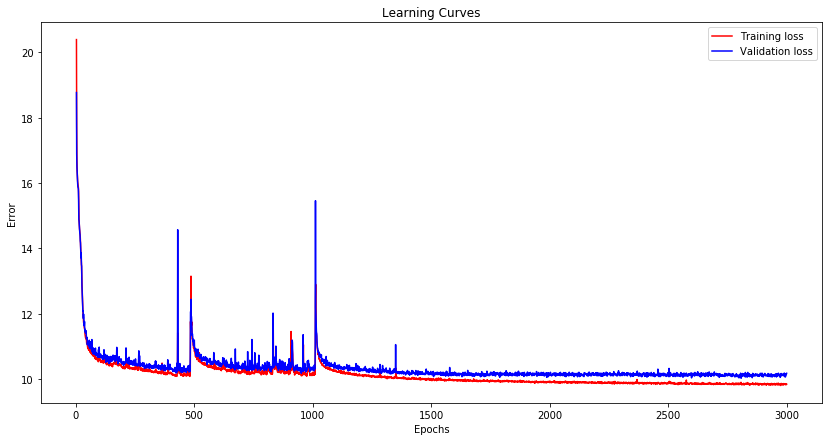

In [106]:
vae_Name='VAE_Cov2D_Z30'
vae=vae_Cov2D_Z30
train_data=VAE_train(vae, vae_Name)

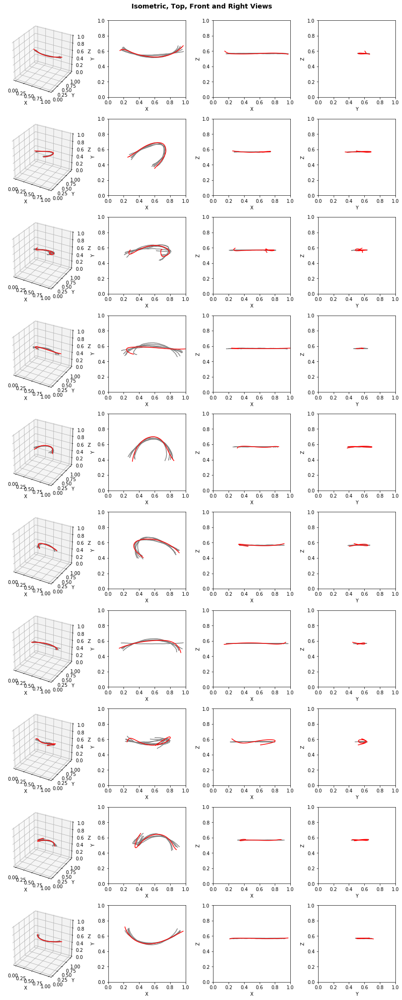

In [125]:
VAE_load(vae,vae_Name)
visualize_VAE(vae, x_test, y_test)